This jupyter notebook includes an implementation of 1D GAN. Everything starting from preparing the environment to reaching GAN training, is included. This code is applied to generate a straight line where y = x.

# Import Modules

In [ ]:
# A module to transform data to NumPy arrays and create random noise
import numpy as np 
from tensorflow.keras.models import Sequential
# Layers to be used in generator and discriminator
from tensorflow.keras.layers import Dense, LeakyReLU 
# A module to plot generated data 
import matplotlib.pyplot as plt 

# Prepare and Pre-Process the Dataset

In [ ]:
# Create variable X
X_train = np.linspace(-1, 1, 1000)
# Reshape X variable
X_train = X_train.reshape(-1, 1)
# Create variable Y such that y = x
y_train = X_train

# Model Implementation

## Build the Generator

In [ ]:
def build_generator(noise_dim):
  # Add layers one after one in the sequence
  model = Sequential() 
  # First fully connected layer
  model.add(Dense(16, activation = 'relu', kernel_initializer = 'he_uniform', input_dim = noise_dim))
  # Add LeakyReLU activation function
  model.add(LeakyReLU(alpha=0.01))
  # Output layer with the shape of 2
  model.add(Dense(2, activation = 'linear'))
  return model

## Build the Discriminator

In [ ]:
def build_discriminator():
  # Add layers one after one in the sequence
  model = Sequential() 
  # First fully connected layer
  model.add(Dense(32, activation = 'relu', kernel_initializer = 'he_uniform', input_dim = 2))
  # Add LeakyReLU activation function
  model.add(LeakyReLU(alpha=0.01))
  # Second fully connected layer
  model.add(Dense(8, activation = 'relu', kernel_initializer = 'he_uniform'))
  # Add LeakyReLU activation function
  model.add(LeakyReLU(alpha=0.01))
  # Output layer with the shape of 2
  model.add(Dense(1, activation = 'sigmoid'))
  return model

## Construct Models

In [ ]:
def construct_models(noise_dim):
      # Build the discriminator model
      discriminator = build_discriminator() 
      # Compile the discriminator
      discriminator.compile(loss = 'binary_crossentropy' , optimizer = 'adam', metrics = ['accuracy'])
      # Build the generator model
      generator = build_generator(noise_dim) 
      # Freeze the discriminator during generator training
      discriminator.trainable = False
      gan = Sequential() 
      # Pit the generator and discriminator against each other
      gan.add(generator)
      gan.add(discriminator)
      # Compile the GAN model
      gan.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy']) 
      return generator, discriminator, gan

## Define Loss Functions

In [ ]:
# Define discriminator loss function
def disc_loss(model, X, y):
	      # Train the model on a batch of data and return loss value
	      return model.train_on_batch(X,y)
# Define generator loss function
def gen_loss(model, X, y):
	      # Train the model on a batch of data and return loss value
	      return model.train_on_batch(X,y)

# Print Generated Data Samples

In [ ]:
def print_generated_samples(batch_size, noise_dim):
      # Create test data
      X_test = np.random.uniform(low=-1, high =1, size=(batch_size//2, 1))
      y_test = X_test
      # Generate samples
      noise = np.random.normal(0, 1, (batch_size//2, noise_dim))
      gen_data = generator.predict(noise)  
      # Plot generated data
      plt.scatter(X_test, y_test, color = 'red')
      plt.scatter(gen_data[:,0], gen_data[:,1], color =  'blue')
      plt.xlim(-1,1)
      plt.ylim(-1,1)
      plt.legend(["real data", "generated data"], loc = "lower right")
      plt.show()

# GAN Training

In [ ]:
def training(generator, discriminator, gan, noise_dim, epochs, batch_size):
  # Enumerate over epochs
  for e in range(epochs):
          # Random normal array for generator input 
          noise = np.random.normal(0, 1, (batch_size, noise_dim))
          # Create fake images by the generator
          fake_samples = generator.predict(noise)
          # Stack X and Y variable horizontally to build the dataset
          real_data = np.hstack((X_train, y_train))
          # Get a random real data points from the training data
          real_data = real_data[np.random.randint(0, real_data.shape[0], size = batch_size)]
          # Create real labels
          real_labels = np.ones((batch_size, 1))*0.9
          # Generate fake labels generated data points as zeros
          fake_labels = np.zeros((batch_size, 1))
          # Calculate the loss of real data points
          discriminator_loss_real = disc_loss(discriminator, real_data, real_labels)
          # Calculate the loss of generated data points
          discriminator_loss_fake = disc_loss(discriminator, fake_samples, fake_labels)
          # Compute total discriminator loss
          discriminator_loss = 0.5 * np.add(discriminator_loss_real, discriminator_loss_fake)
          # Generate random points as input for the generator
          x_gan = np.random.normal(0, 1, (batch_size, noise_dim))
          # generate real labels for gan
          y_gan = np.ones((batch_size, 1))
          #calculate the generator loss
          gan_loss = gen_loss(gan, x_gan, y_gan)
          # Print the progress
          if e % 10 == 0 or e == epochs-1:
            print('Epoch: ', e, ' Generator Loss: ', gan_loss , ' Discriminator Loss: ', discriminator_loss)
            print_generated_samples(batch_size, noise_dim)

# Run the model

4/4 [==============================] - 0s 2ms/step


Epoch:  0  Generator Loss:  [0.4173312783241272, 0.921875]  Discriminator Loss:  [0.93012947 0.03515625]
2/2 [==============================] - 0s 3ms/step


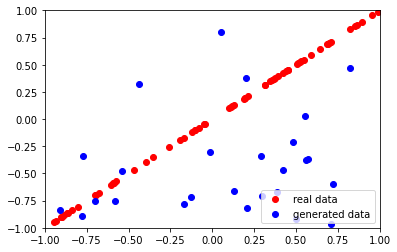

4/4 [==============================] - 0s 2ms/step
Epoch:  10  Generator Loss:  [0.5653105974197388, 0.7265625]  Discriminator Loss:  [0.75337803 0.1171875 ]
2/2 [==============================] - 0s 3ms/step


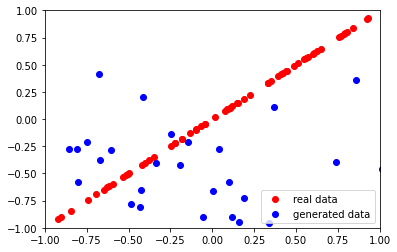

4/4 [==============================] - 0s 2ms/step
Epoch:  20  Generator Loss:  [0.865464448928833, 0.3359375]  Discriminator Loss:  [0.62266672 0.3125    ]
2/2 [==============================] - 0s 4ms/step


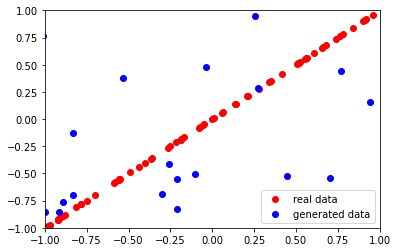

4/4 [==============================] - 0s 3ms/step
Epoch:  30  Generator Loss:  [1.0272727012634277, 0.1484375]  Discriminator Loss:  [0.57090998 0.4296875 ]
2/2 [==============================] - 0s 4ms/step


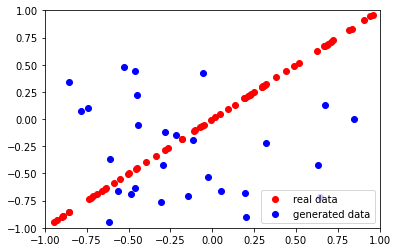

4/4 [==============================] - 0s 2ms/step
Epoch:  40  Generator Loss:  [1.1502196788787842, 0.1484375]  Discriminator Loss:  [0.57225549 0.42578125]
2/2 [==============================] - 0s 3ms/step


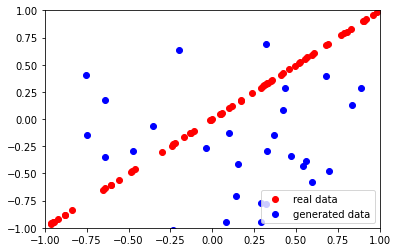

4/4 [==============================] - 0s 2ms/step
Epoch:  50  Generator Loss:  [1.0834392309188843, 0.203125]  Discriminator Loss:  [0.58229029 0.39453125]
2/2 [==============================] - 0s 5ms/step


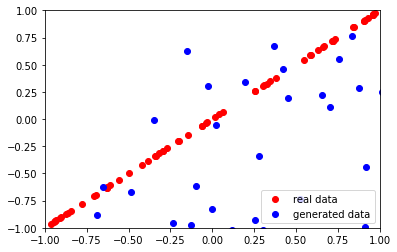

4/4 [==============================] - 0s 2ms/step
Epoch:  60  Generator Loss:  [1.0598429441452026, 0.1484375]  Discriminator Loss:  [0.5930354  0.39453125]
2/2 [==============================] - 0s 3ms/step


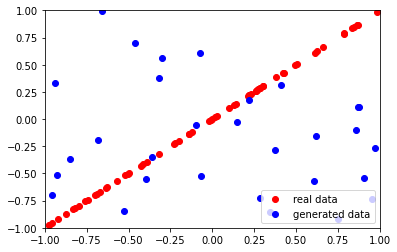

4/4 [==============================] - 0s 2ms/step
Epoch:  70  Generator Loss:  [0.9826110601425171, 0.234375]  Discriminator Loss:  [0.60931015 0.359375  ]
2/2 [==============================] - 0s 3ms/step


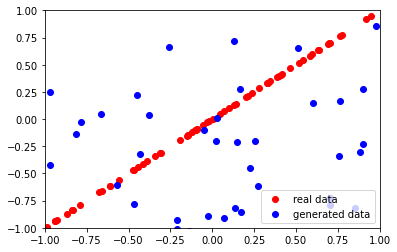

4/4 [==============================] - 0s 2ms/step
Epoch:  80  Generator Loss:  [0.9753710627555847, 0.234375]  Discriminator Loss:  [0.59519485 0.421875  ]
2/2 [==============================] - 0s 3ms/step


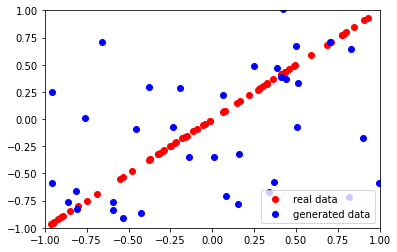

4/4 [==============================] - 0s 2ms/step
Epoch:  90  Generator Loss:  [0.9893559813499451, 0.1640625]  Discriminator Loss:  [0.59673703 0.41015625]
2/2 [==============================] - 0s 3ms/step


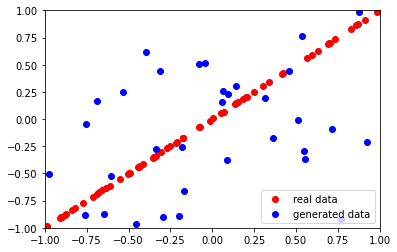

4/4 [==============================] - 0s 2ms/step
Epoch:  100  Generator Loss:  [1.0435817241668701, 0.1015625]  Discriminator Loss:  [0.56577493 0.46875   ]
2/2 [==============================] - 0s 3ms/step


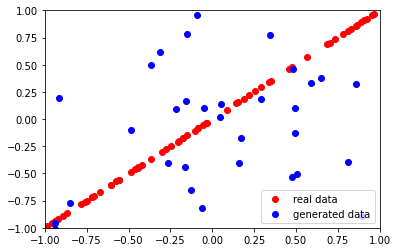

4/4 [==============================] - 0s 2ms/step
Epoch:  110  Generator Loss:  [1.115440845489502, 0.0703125]  Discriminator Loss:  [0.5586217 0.4609375]
2/2 [==============================] - 0s 3ms/step


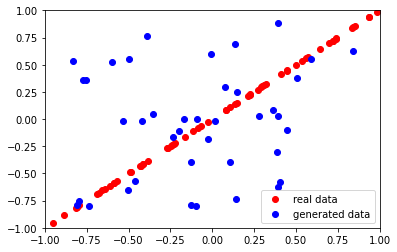

4/4 [==============================] - 0s 2ms/step
Epoch:  120  Generator Loss:  [1.1172590255737305, 0.046875]  Discriminator Loss:  [0.55649018 0.48046875]
2/2 [==============================] - 0s 4ms/step


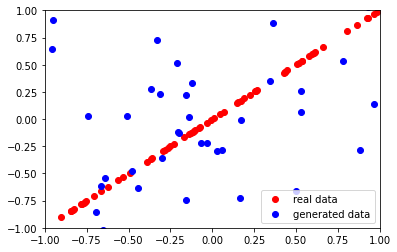

4/4 [==============================] - 0s 2ms/step
Epoch:  130  Generator Loss:  [1.092717170715332, 0.09375]  Discriminator Loss:  [0.5665638 0.4609375]
2/2 [==============================] - 0s 3ms/step


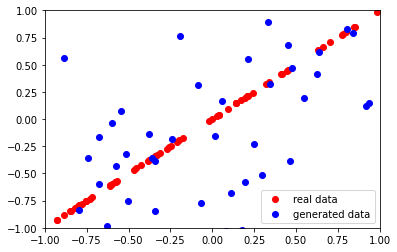

4/4 [==============================] - 0s 3ms/step
Epoch:  140  Generator Loss:  [1.149111270904541, 0.0625]  Discriminator Loss:  [0.55944003 0.4609375 ]
2/2 [==============================] - 0s 4ms/step


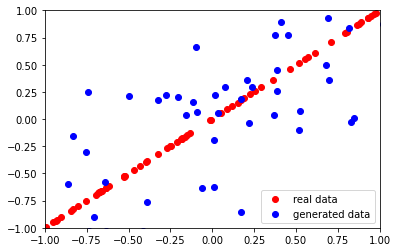

4/4 [==============================] - 0s 2ms/step
Epoch:  150  Generator Loss:  [1.1173335313796997, 0.0625]  Discriminator Loss:  [0.56327851 0.44140625]
2/2 [==============================] - 0s 3ms/step


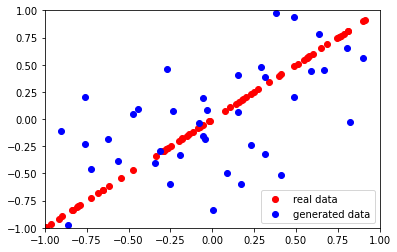

4/4 [==============================] - 0s 2ms/step
Epoch:  160  Generator Loss:  [1.1760920286178589, 0.046875]  Discriminator Loss:  [0.54387948 0.48046875]
2/2 [==============================] - 0s 3ms/step


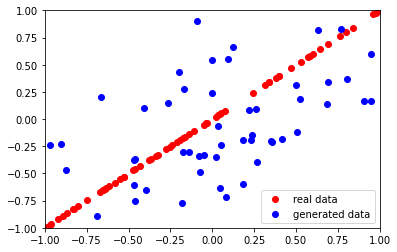

4/4 [==============================] - 0s 2ms/step
Epoch:  170  Generator Loss:  [1.181204915046692, 0.03125]  Discriminator Loss:  [0.56176239 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


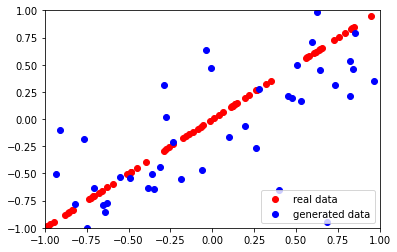

4/4 [==============================] - 0s 2ms/step
Epoch:  180  Generator Loss:  [1.1015665531158447, 0.0390625]  Discriminator Loss:  [0.5396243 0.4921875]
2/2 [==============================] - 0s 3ms/step


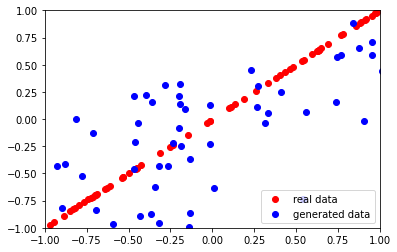

4/4 [==============================] - 0s 2ms/step
Epoch:  190  Generator Loss:  [1.0974617004394531, 0.0703125]  Discriminator Loss:  [0.56670459 0.47265625]
2/2 [==============================] - 0s 3ms/step


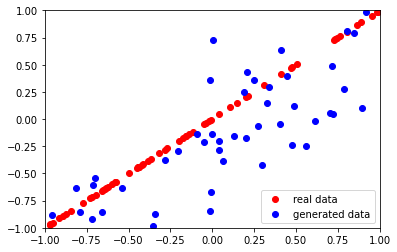

4/4 [==============================] - 0s 2ms/step
Epoch:  200  Generator Loss:  [1.1444798707962036, 0.0546875]  Discriminator Loss:  [0.56892224 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


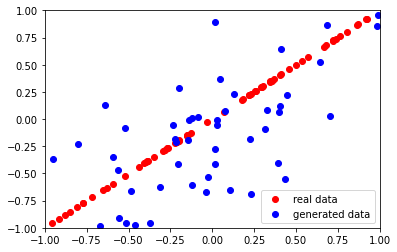

4/4 [==============================] - 0s 2ms/step
Epoch:  210  Generator Loss:  [1.0104942321777344, 0.0859375]  Discriminator Loss:  [0.5707216 0.453125 ]
2/2 [==============================] - 0s 3ms/step


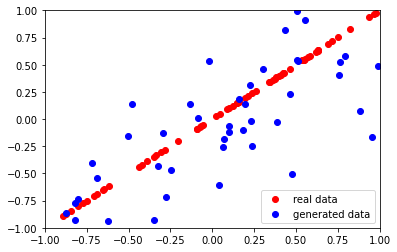

4/4 [==============================] - 0s 2ms/step
Epoch:  220  Generator Loss:  [1.0533838272094727, 0.0546875]  Discriminator Loss:  [0.57124576 0.47265625]
2/2 [==============================] - 0s 3ms/step


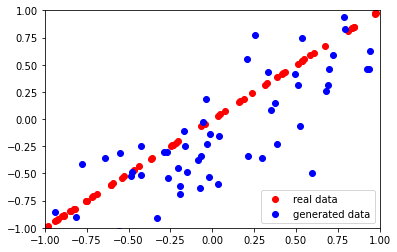

4/4 [==============================] - 0s 2ms/step
Epoch:  230  Generator Loss:  [1.0050337314605713, 0.09375]  Discriminator Loss:  [0.57389532 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


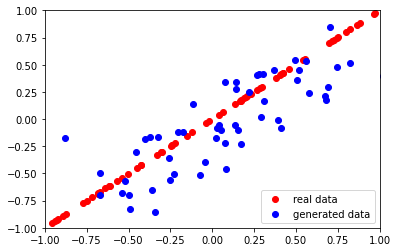

4/4 [==============================] - 0s 3ms/step
Epoch:  240  Generator Loss:  [1.016053557395935, 0.109375]  Discriminator Loss:  [0.58472225 0.4609375 ]
2/2 [==============================] - 0s 4ms/step


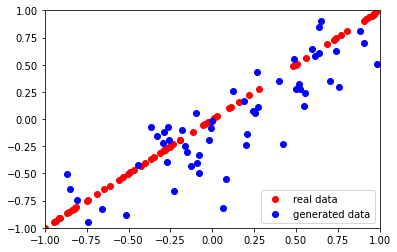

4/4 [==============================] - 0s 3ms/step
Epoch:  250  Generator Loss:  [0.9824761152267456, 0.0703125]  Discriminator Loss:  [0.59323305 0.453125  ]
2/2 [==============================] - 0s 3ms/step


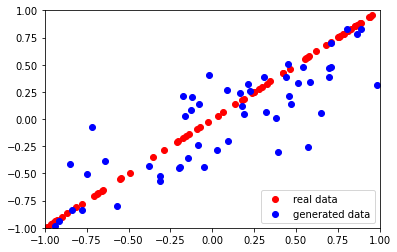

4/4 [==============================] - 0s 3ms/step
Epoch:  260  Generator Loss:  [0.9576428532600403, 0.078125]  Discriminator Loss:  [0.59260049 0.453125  ]
2/2 [==============================] - 0s 5ms/step


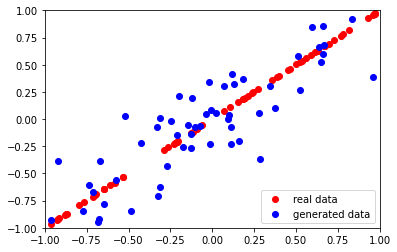

4/4 [==============================] - 0s 2ms/step
Epoch:  270  Generator Loss:  [0.9173276424407959, 0.125]  Discriminator Loss:  [0.58642533 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


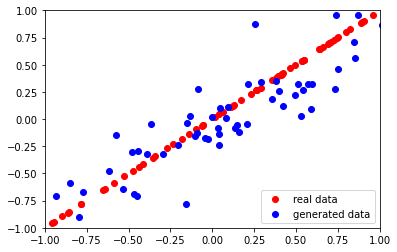

4/4 [==============================] - 0s 2ms/step
Epoch:  280  Generator Loss:  [0.9324562549591064, 0.1015625]  Discriminator Loss:  [0.59778345 0.47265625]
2/2 [==============================] - 0s 3ms/step


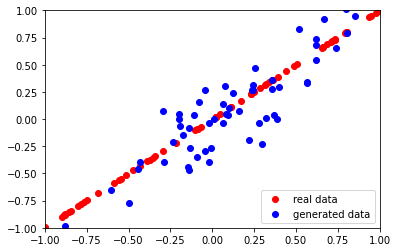

4/4 [==============================] - 0s 2ms/step
Epoch:  290  Generator Loss:  [0.9180809855461121, 0.09375]  Discriminator Loss:  [0.6086604  0.44140625]
2/2 [==============================] - 0s 3ms/step


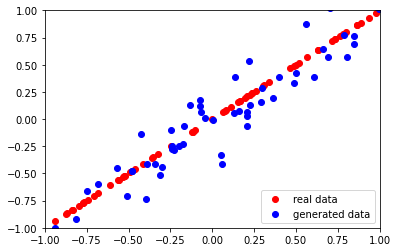

4/4 [==============================] - 0s 2ms/step
Epoch:  300  Generator Loss:  [0.8799740672111511, 0.1015625]  Discriminator Loss:  [0.60606658 0.44140625]
2/2 [==============================] - 0s 3ms/step


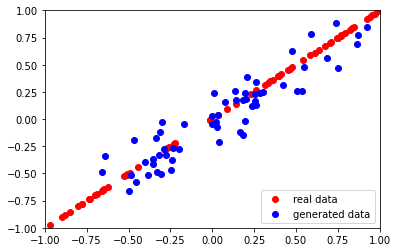

4/4 [==============================] - 0s 2ms/step
Epoch:  310  Generator Loss:  [0.8706539869308472, 0.15625]  Discriminator Loss:  [0.6225656  0.44921875]
2/2 [==============================] - 0s 3ms/step


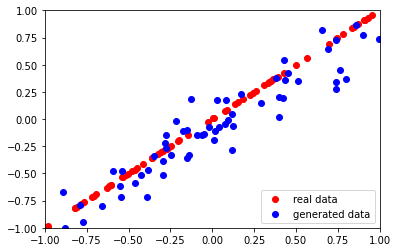

4/4 [==============================] - 0s 2ms/step
Epoch:  320  Generator Loss:  [0.8452411890029907, 0.140625]  Discriminator Loss:  [0.62743658 0.43359375]
2/2 [==============================] - 0s 3ms/step


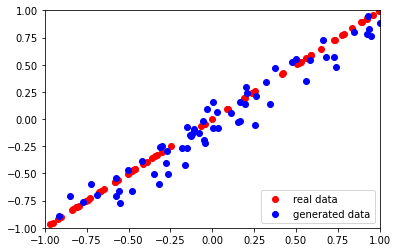

4/4 [==============================] - 0s 2ms/step
Epoch:  330  Generator Loss:  [0.8280932903289795, 0.15625]  Discriminator Loss:  [0.63138035 0.43359375]
2/2 [==============================] - 0s 3ms/step


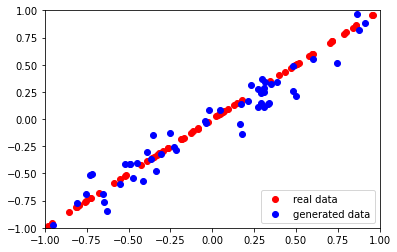

4/4 [==============================] - 0s 2ms/step
Epoch:  340  Generator Loss:  [0.8152042627334595, 0.171875]  Discriminator Loss:  [0.6334804  0.44921875]
2/2 [==============================] - 0s 3ms/step


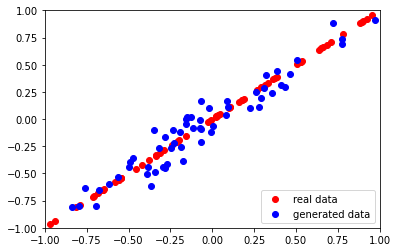

4/4 [==============================] - 0s 2ms/step
Epoch:  350  Generator Loss:  [0.7914875745773315, 0.125]  Discriminator Loss:  [0.6435357 0.4453125]
2/2 [==============================] - 0s 3ms/step


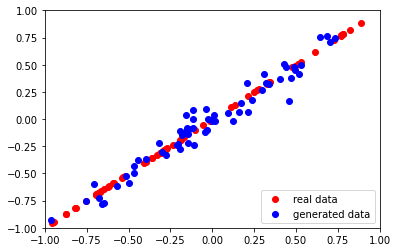

4/4 [==============================] - 0s 2ms/step
Epoch:  360  Generator Loss:  [0.7977754473686218, 0.1015625]  Discriminator Loss:  [0.64860561 0.4375    ]
2/2 [==============================] - 0s 3ms/step


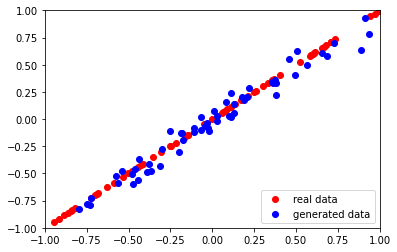

4/4 [==============================] - 0s 2ms/step
Epoch:  370  Generator Loss:  [0.7873673439025879, 0.0703125]  Discriminator Loss:  [0.65326017 0.4375    ]
2/2 [==============================] - 0s 3ms/step


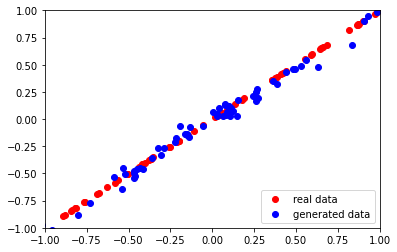

4/4 [==============================] - 0s 3ms/step
Epoch:  380  Generator Loss:  [0.7680734395980835, 0.0859375]  Discriminator Loss:  [0.66312557 0.46875   ]
2/2 [==============================] - 0s 3ms/step


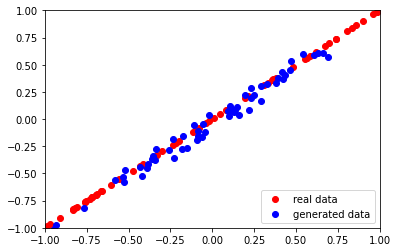

4/4 [==============================] - 0s 2ms/step
Epoch:  390  Generator Loss:  [0.7578507661819458, 0.015625]  Discriminator Loss:  [0.66517046 0.48828125]
2/2 [==============================] - 0s 3ms/step


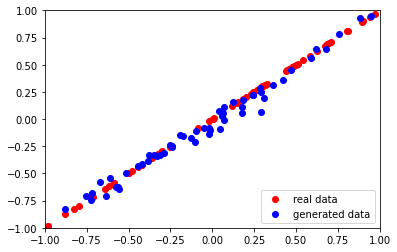

4/4 [==============================] - 0s 2ms/step
Epoch:  400  Generator Loss:  [0.7527303695678711, 0.0078125]  Discriminator Loss:  [0.66183501 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


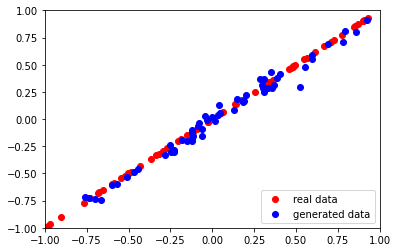

4/4 [==============================] - 0s 2ms/step
Epoch:  410  Generator Loss:  [0.753474235534668, 0.0234375]  Discriminator Loss:  [0.66839844 0.48046875]
2/2 [==============================] - 0s 3ms/step


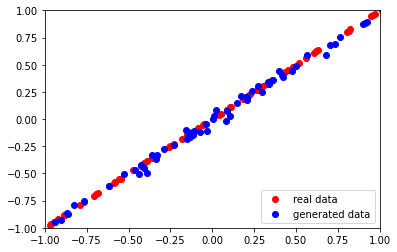

4/4 [==============================] - 0s 2ms/step
Epoch:  420  Generator Loss:  [0.7458871603012085, 0.0703125]  Discriminator Loss:  [0.67122763 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


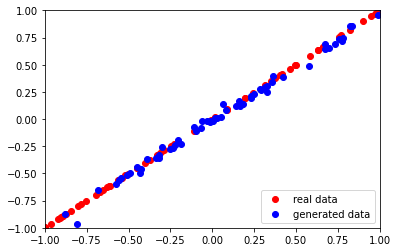

4/4 [==============================] - 0s 2ms/step
Epoch:  430  Generator Loss:  [0.7535322904586792, 0.0078125]  Discriminator Loss:  [0.67063498 0.49609375]
2/2 [==============================] - 0s 3ms/step


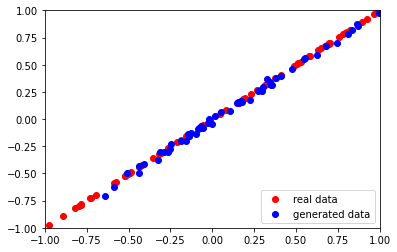

4/4 [==============================] - 0s 2ms/step
Epoch:  440  Generator Loss:  [0.7587507963180542, 0.0078125]  Discriminator Loss:  [0.67632958 0.48828125]
2/2 [==============================] - 0s 3ms/step


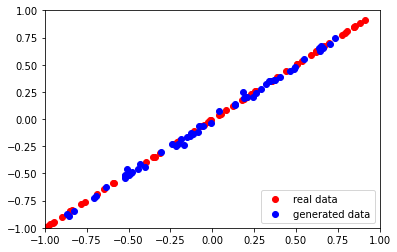

4/4 [==============================] - 0s 2ms/step
Epoch:  450  Generator Loss:  [0.7585363388061523, 0.0]  Discriminator Loss:  [0.67888936 0.5       ]
2/2 [==============================] - 0s 3ms/step


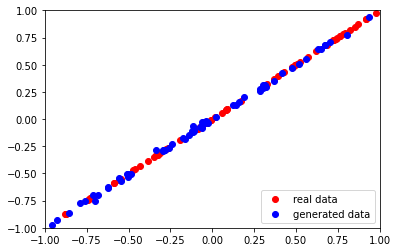

4/4 [==============================] - 0s 2ms/step
Epoch:  460  Generator Loss:  [0.7583391666412354, 0.0]  Discriminator Loss:  [0.67693141 0.5       ]
2/2 [==============================] - 0s 4ms/step


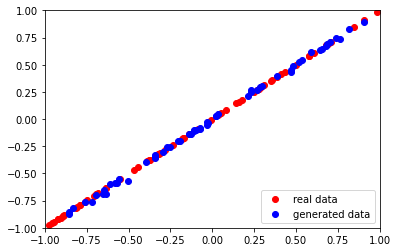

4/4 [==============================] - 0s 2ms/step
Epoch:  470  Generator Loss:  [0.7651780843734741, 0.0]  Discriminator Loss:  [0.67872542 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


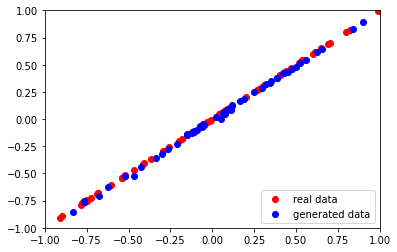

4/4 [==============================] - 0s 2ms/step
Epoch:  480  Generator Loss:  [0.7629033923149109, 0.0078125]  Discriminator Loss:  [0.67935127 0.5       ]
2/2 [==============================] - 0s 3ms/step


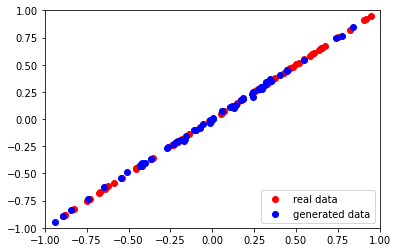

4/4 [==============================] - 0s 4ms/step
Epoch:  490  Generator Loss:  [0.7681408524513245, 0.0]  Discriminator Loss:  [0.67835402 0.49609375]
2/2 [==============================] - 0s 3ms/step


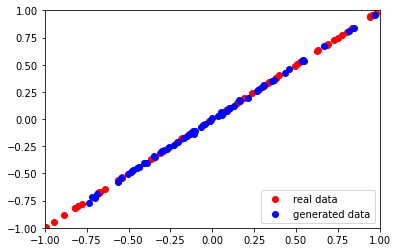

4/4 [==============================] - 0s 2ms/step
Epoch:  500  Generator Loss:  [0.7669146656990051, 0.0]  Discriminator Loss:  [0.68311018 0.5       ]
2/2 [==============================] - 0s 6ms/step


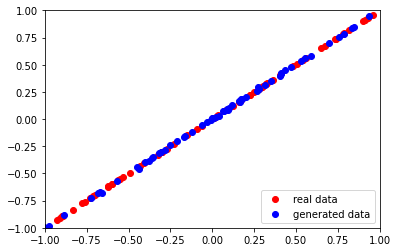

4/4 [==============================] - 0s 2ms/step
Epoch:  510  Generator Loss:  [0.7709925174713135, 0.0]  Discriminator Loss:  [0.68231669 0.5       ]
2/2 [==============================] - 0s 3ms/step


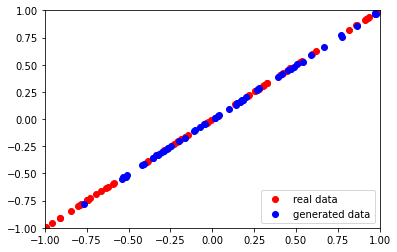

4/4 [==============================] - 0s 2ms/step
Epoch:  520  Generator Loss:  [0.7725590467453003, 0.0]  Discriminator Loss:  [0.68131742 0.48828125]
2/2 [==============================] - 0s 3ms/step


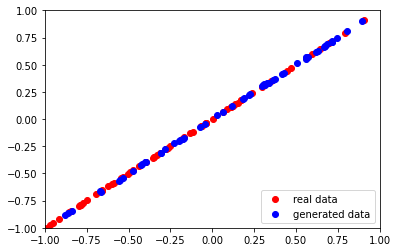

4/4 [==============================] - 0s 2ms/step
Epoch:  530  Generator Loss:  [0.7805389761924744, 0.0]  Discriminator Loss:  [0.68812555 0.5       ]
2/2 [==============================] - 0s 3ms/step


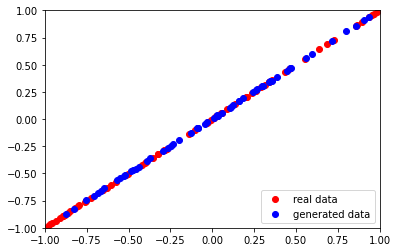

4/4 [==============================] - 0s 2ms/step
Epoch:  540  Generator Loss:  [0.7955785989761353, 0.0]  Discriminator Loss:  [0.68300974 0.5       ]
2/2 [==============================] - 0s 3ms/step


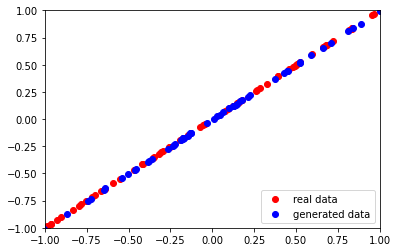

4/4 [==============================] - 0s 2ms/step
Epoch:  550  Generator Loss:  [0.7912473678588867, 0.0]  Discriminator Loss:  [0.68467903 0.5       ]
2/2 [==============================] - 0s 3ms/step


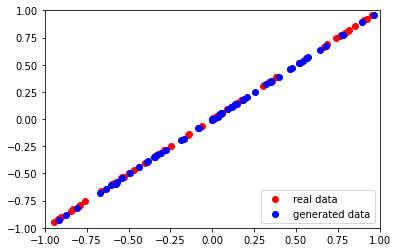

4/4 [==============================] - 0s 2ms/step
Epoch:  560  Generator Loss:  [0.7889835834503174, 0.0]  Discriminator Loss:  [0.68258142 0.5       ]
2/2 [==============================] - 0s 5ms/step


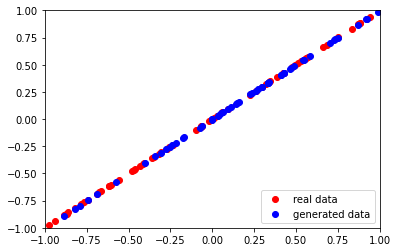

4/4 [==============================] - 0s 2ms/step
Epoch:  570  Generator Loss:  [0.7914639115333557, 0.0]  Discriminator Loss:  [0.68341354 0.5       ]
2/2 [==============================] - 0s 3ms/step


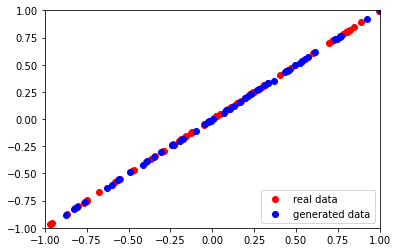

4/4 [==============================] - 0s 2ms/step
Epoch:  580  Generator Loss:  [0.785884439945221, 0.0]  Discriminator Loss:  [0.68561417 0.5       ]
2/2 [==============================] - 0s 3ms/step


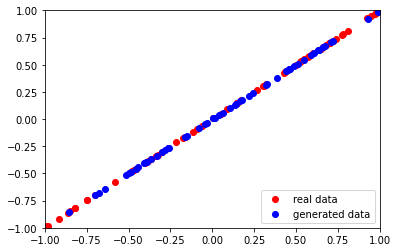

4/4 [==============================] - 0s 2ms/step
Epoch:  590  Generator Loss:  [0.792100727558136, 0.0]  Discriminator Loss:  [0.68208548 0.5       ]
2/2 [==============================] - 0s 3ms/step


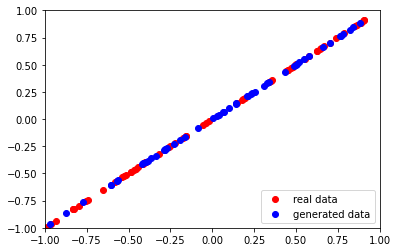

4/4 [==============================] - 0s 2ms/step
Epoch:  600  Generator Loss:  [0.7997685074806213, 0.0]  Discriminator Loss:  [0.68198377 0.5       ]
2/2 [==============================] - 0s 3ms/step


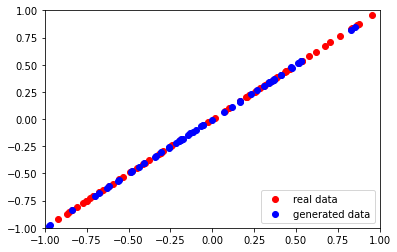

4/4 [==============================] - 0s 2ms/step
Epoch:  610  Generator Loss:  [0.8061715364456177, 0.0]  Discriminator Loss:  [0.68195403 0.5       ]
2/2 [==============================] - 0s 4ms/step


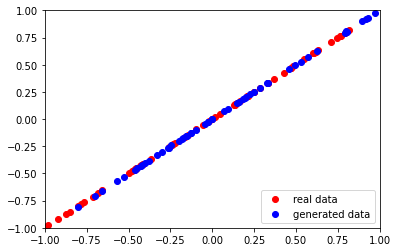

4/4 [==============================] - 0s 2ms/step
Epoch:  620  Generator Loss:  [0.8039348125457764, 0.0]  Discriminator Loss:  [0.68104577 0.5       ]
2/2 [==============================] - 0s 3ms/step


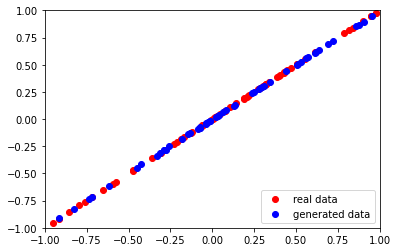

4/4 [==============================] - 0s 2ms/step
Epoch:  630  Generator Loss:  [0.8026477098464966, 0.0]  Discriminator Loss:  [0.68506095 0.5       ]
2/2 [==============================] - 0s 3ms/step


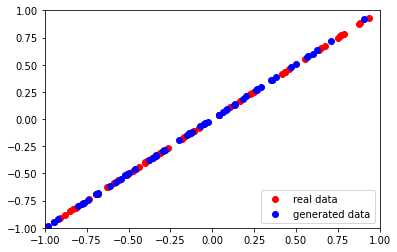

4/4 [==============================] - 0s 2ms/step
Epoch:  640  Generator Loss:  [0.8146539926528931, 0.0]  Discriminator Loss:  [0.68260068 0.5       ]
2/2 [==============================] - 0s 3ms/step


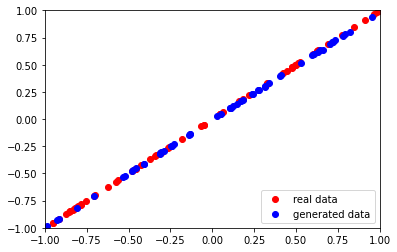

4/4 [==============================] - 0s 2ms/step
Epoch:  650  Generator Loss:  [0.8190319538116455, 0.0]  Discriminator Loss:  [0.68219519 0.5       ]
2/2 [==============================] - 0s 3ms/step


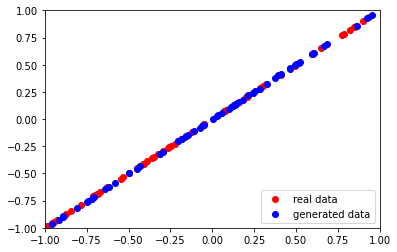

4/4 [==============================] - 0s 2ms/step
Epoch:  660  Generator Loss:  [0.8173220157623291, 0.0]  Discriminator Loss:  [0.68442547 0.5       ]
2/2 [==============================] - 0s 3ms/step


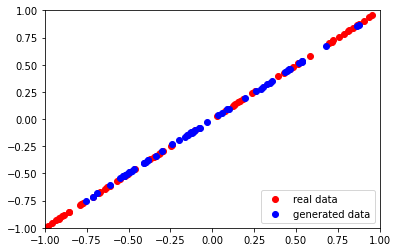

4/4 [==============================] - 0s 2ms/step
Epoch:  670  Generator Loss:  [0.8094183802604675, 0.0]  Discriminator Loss:  [0.686414 0.5     ]
2/2 [==============================] - 0s 3ms/step


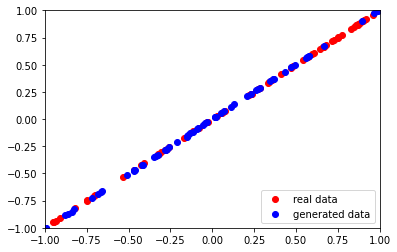

4/4 [==============================] - 0s 2ms/step
Epoch:  680  Generator Loss:  [0.8057588338851929, 0.0]  Discriminator Loss:  [0.68435112 0.5       ]
2/2 [==============================] - 0s 3ms/step


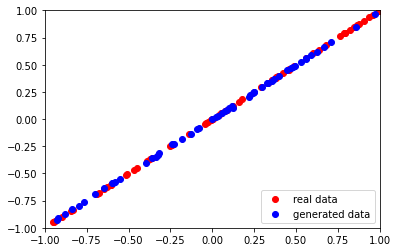

4/4 [==============================] - 0s 2ms/step
Epoch:  690  Generator Loss:  [0.8219384551048279, 0.0]  Discriminator Loss:  [0.68098864 0.5       ]
2/2 [==============================] - 0s 3ms/step


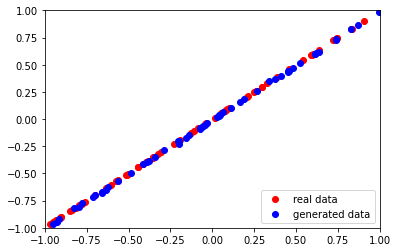

4/4 [==============================] - 0s 2ms/step
Epoch:  700  Generator Loss:  [0.8088816404342651, 0.0]  Discriminator Loss:  [0.6782251 0.5      ]
2/2 [==============================] - 0s 3ms/step


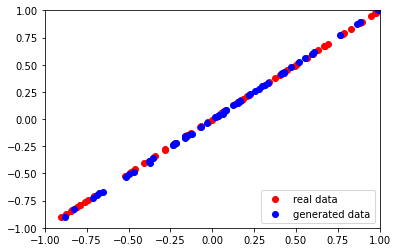

4/4 [==============================] - 0s 2ms/step
Epoch:  710  Generator Loss:  [0.8148413896560669, 0.0]  Discriminator Loss:  [0.68206501 0.5       ]
2/2 [==============================] - 0s 3ms/step


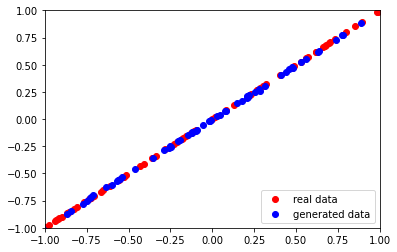

4/4 [==============================] - 0s 2ms/step
Epoch:  720  Generator Loss:  [0.8235288858413696, 0.0]  Discriminator Loss:  [0.68252108 0.5       ]
2/2 [==============================] - 0s 3ms/step


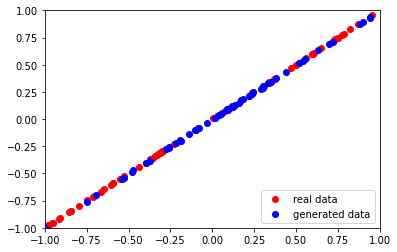

4/4 [==============================] - 0s 2ms/step
Epoch:  730  Generator Loss:  [0.8209895491600037, 0.0]  Discriminator Loss:  [0.67991978 0.5       ]
2/2 [==============================] - 0s 3ms/step


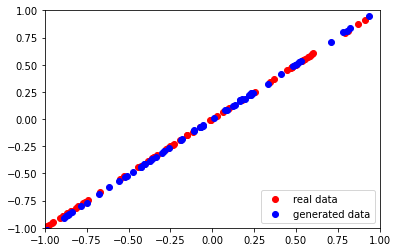

4/4 [==============================] - 0s 2ms/step
Epoch:  740  Generator Loss:  [0.814254641532898, 0.0]  Discriminator Loss:  [0.68273622 0.5       ]
2/2 [==============================] - 0s 3ms/step


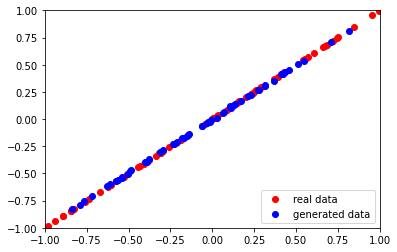

4/4 [==============================] - 0s 2ms/step
Epoch:  750  Generator Loss:  [0.8309158682823181, 0.0]  Discriminator Loss:  [0.67970258 0.5       ]
2/2 [==============================] - 0s 3ms/step


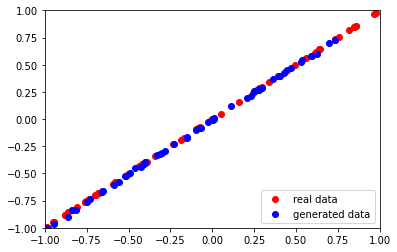

4/4 [==============================] - 0s 2ms/step
Epoch:  760  Generator Loss:  [0.818468451499939, 0.0]  Discriminator Loss:  [0.68211499 0.5       ]
2/2 [==============================] - 0s 8ms/step


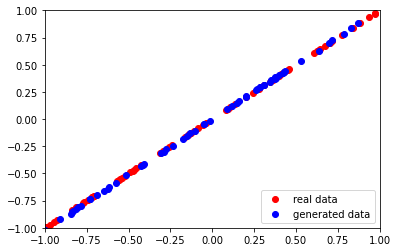

4/4 [==============================] - 0s 2ms/step
Epoch:  770  Generator Loss:  [0.8141944408416748, 0.0]  Discriminator Loss:  [0.68469128 0.5       ]
2/2 [==============================] - 0s 3ms/step


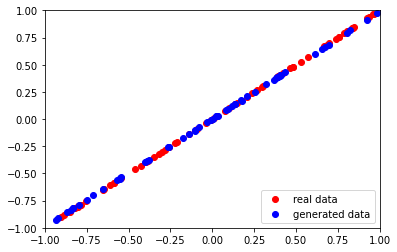

4/4 [==============================] - 0s 3ms/step
Epoch:  780  Generator Loss:  [0.8169783353805542, 0.0]  Discriminator Loss:  [0.68548021 0.5       ]
2/2 [==============================] - 0s 3ms/step


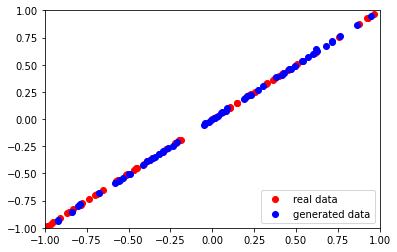

4/4 [==============================] - 0s 2ms/step
Epoch:  790  Generator Loss:  [0.8184396028518677, 0.0]  Discriminator Loss:  [0.68150258 0.5       ]
2/2 [==============================] - 0s 4ms/step


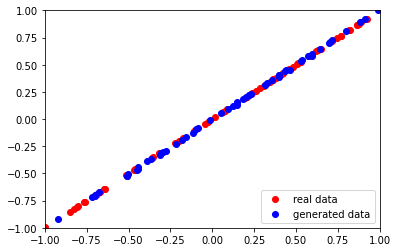

4/4 [==============================] - 0s 2ms/step
Epoch:  800  Generator Loss:  [0.8153829574584961, 0.0]  Discriminator Loss:  [0.68618038 0.5       ]
2/2 [==============================] - 0s 3ms/step


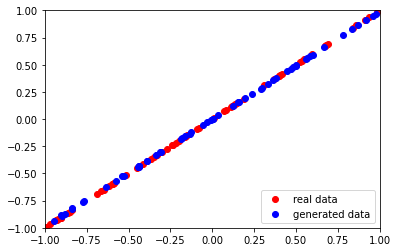

4/4 [==============================] - 0s 2ms/step
Epoch:  810  Generator Loss:  [0.8092784881591797, 0.0]  Discriminator Loss:  [0.68527076 0.5       ]
2/2 [==============================] - 0s 3ms/step


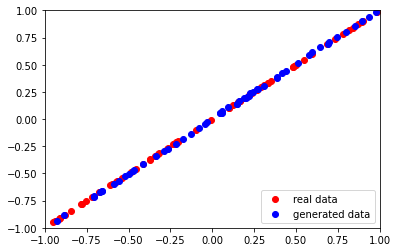

4/4 [==============================] - 0s 3ms/step
Epoch:  820  Generator Loss:  [0.8085026741027832, 0.0]  Discriminator Loss:  [0.68132082 0.5       ]
2/2 [==============================] - 0s 3ms/step


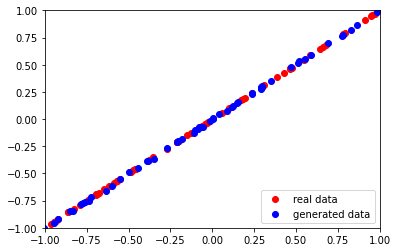

4/4 [==============================] - 0s 2ms/step
Epoch:  830  Generator Loss:  [0.8125186562538147, 0.0]  Discriminator Loss:  [0.67977735 0.5       ]
2/2 [==============================] - 0s 3ms/step


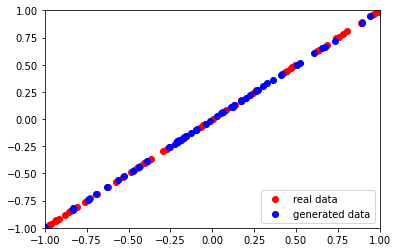

4/4 [==============================] - 0s 4ms/step
Epoch:  840  Generator Loss:  [0.8083803653717041, 0.0]  Discriminator Loss:  [0.68762815 0.5       ]
2/2 [==============================] - 0s 4ms/step


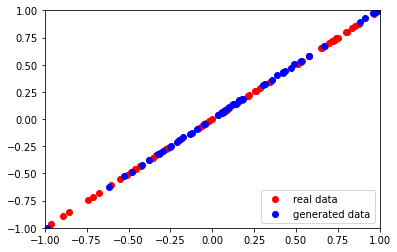

4/4 [==============================] - 0s 2ms/step
Epoch:  850  Generator Loss:  [0.8048698306083679, 0.0]  Discriminator Loss:  [0.68334934 0.5       ]
2/2 [==============================] - 0s 3ms/step


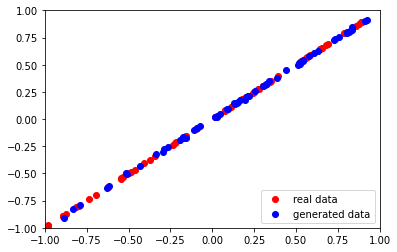

4/4 [==============================] - 0s 2ms/step
Epoch:  860  Generator Loss:  [0.8129876852035522, 0.0]  Discriminator Loss:  [0.68547261 0.5       ]
2/2 [==============================] - 0s 4ms/step


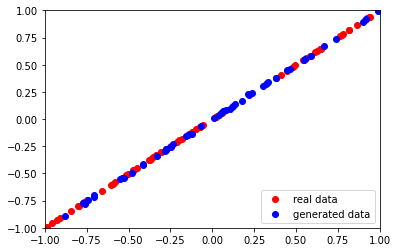

4/4 [==============================] - 0s 2ms/step
Epoch:  870  Generator Loss:  [0.8020017147064209, 0.0]  Discriminator Loss:  [0.68034509 0.5       ]
2/2 [==============================] - 0s 3ms/step


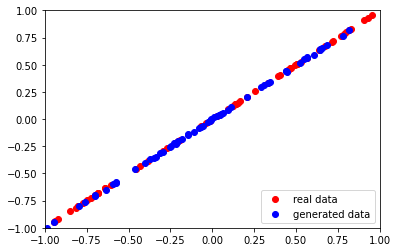

4/4 [==============================] - 0s 2ms/step
Epoch:  880  Generator Loss:  [0.8128867745399475, 0.0]  Discriminator Loss:  [0.68371961 0.5       ]
2/2 [==============================] - 0s 3ms/step


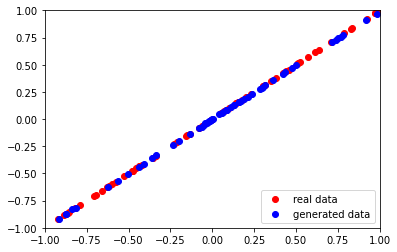

4/4 [==============================] - 0s 2ms/step
Epoch:  890  Generator Loss:  [0.816626787185669, 0.0]  Discriminator Loss:  [0.68227765 0.5       ]
2/2 [==============================] - 0s 3ms/step


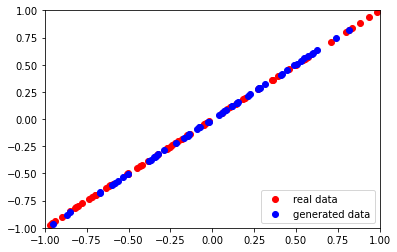

4/4 [==============================] - 0s 2ms/step
Epoch:  900  Generator Loss:  [0.8142639398574829, 0.0]  Discriminator Loss:  [0.68231222 0.5       ]
2/2 [==============================] - 0s 3ms/step


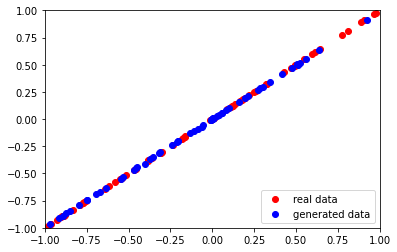

4/4 [==============================] - 0s 2ms/step
Epoch:  910  Generator Loss:  [0.8229669332504272, 0.0]  Discriminator Loss:  [0.68562582 0.5       ]
2/2 [==============================] - 0s 3ms/step


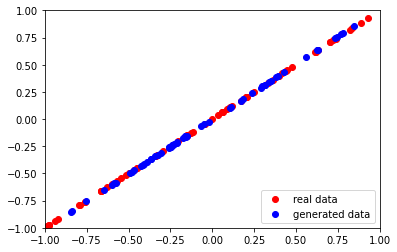

4/4 [==============================] - 0s 2ms/step
Epoch:  920  Generator Loss:  [0.8113325238227844, 0.0]  Discriminator Loss:  [0.68471372 0.5       ]
2/2 [==============================] - 0s 3ms/step


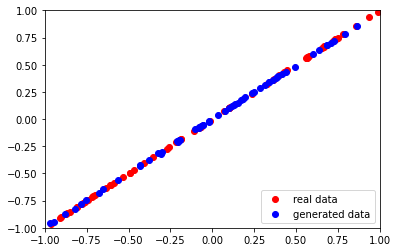

4/4 [==============================] - 0s 3ms/step
Epoch:  930  Generator Loss:  [0.8079466819763184, 0.0]  Discriminator Loss:  [0.68307638 0.5       ]
2/2 [==============================] - 0s 3ms/step


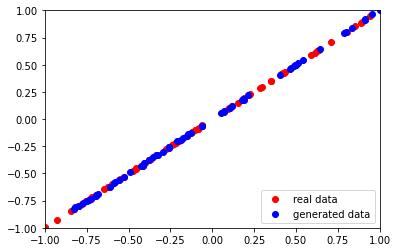

4/4 [==============================] - 0s 2ms/step
Epoch:  940  Generator Loss:  [0.8180348873138428, 0.0]  Discriminator Loss:  [0.68257082 0.5       ]
2/2 [==============================] - 0s 3ms/step


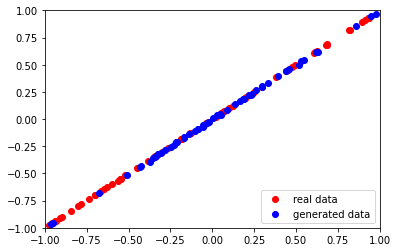

4/4 [==============================] - 0s 2ms/step
Epoch:  950  Generator Loss:  [0.8069990873336792, 0.0]  Discriminator Loss:  [0.68204129 0.5       ]
2/2 [==============================] - 0s 3ms/step


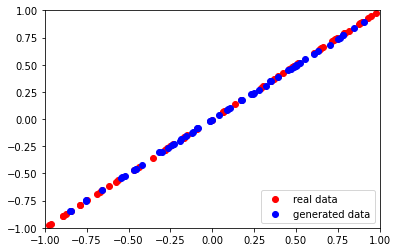

4/4 [==============================] - 0s 3ms/step
Epoch:  960  Generator Loss:  [0.804831862449646, 0.0]  Discriminator Loss:  [0.68488932 0.5       ]
2/2 [==============================] - 0s 5ms/step


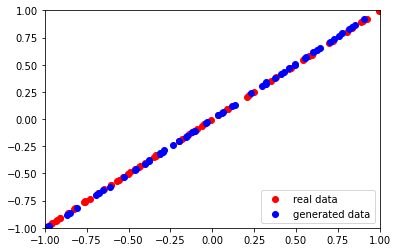

4/4 [==============================] - 0s 2ms/step
Epoch:  970  Generator Loss:  [0.8190839290618896, 0.0]  Discriminator Loss:  [0.68493798 0.5       ]
2/2 [==============================] - 0s 3ms/step


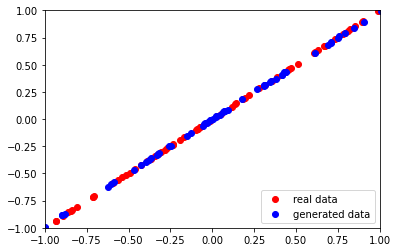

4/4 [==============================] - 0s 2ms/step
Epoch:  980  Generator Loss:  [0.8091399669647217, 0.0]  Discriminator Loss:  [0.67975157 0.5       ]
2/2 [==============================] - 0s 3ms/step


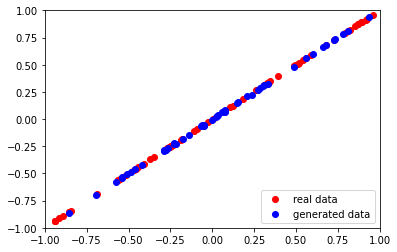

4/4 [==============================] - 0s 2ms/step
Epoch:  990  Generator Loss:  [0.827221155166626, 0.0]  Discriminator Loss:  [0.67988563 0.5       ]
2/2 [==============================] - 0s 3ms/step


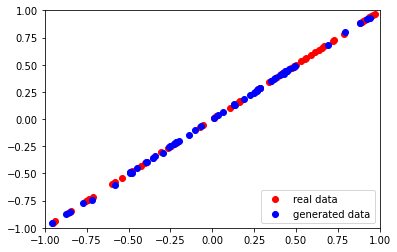

4/4 [==============================] - 0s 2ms/step
Epoch:  1000  Generator Loss:  [0.8120228052139282, 0.0]  Discriminator Loss:  [0.68265381 0.5       ]
2/2 [==============================] - 0s 3ms/step


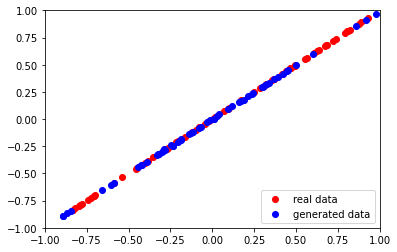

4/4 [==============================] - 0s 3ms/step
Epoch:  1010  Generator Loss:  [0.8123825788497925, 0.0]  Discriminator Loss:  [0.67967206 0.5       ]
2/2 [==============================] - 0s 3ms/step


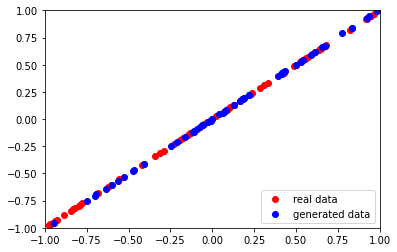

4/4 [==============================] - 0s 2ms/step
Epoch:  1020  Generator Loss:  [0.8075236082077026, 0.0]  Discriminator Loss:  [0.68417507 0.5       ]
2/2 [==============================] - 0s 3ms/step


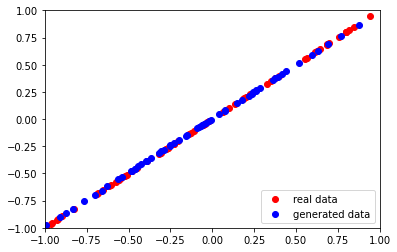

4/4 [==============================] - 0s 2ms/step
Epoch:  1030  Generator Loss:  [0.8193796277046204, 0.0]  Discriminator Loss:  [0.68487716 0.5       ]
2/2 [==============================] - 0s 3ms/step


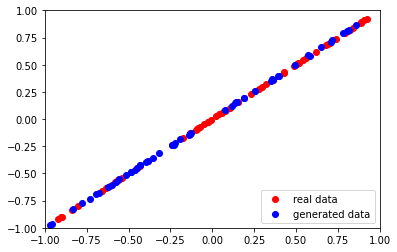

4/4 [==============================] - 0s 2ms/step
Epoch:  1040  Generator Loss:  [0.8122706413269043, 0.0]  Discriminator Loss:  [0.68648756 0.5       ]
2/2 [==============================] - 0s 4ms/step


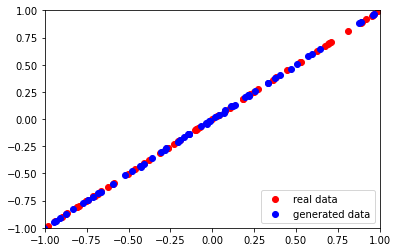

4/4 [==============================] - 0s 2ms/step
Epoch:  1050  Generator Loss:  [0.8182611465454102, 0.0]  Discriminator Loss:  [0.68131918 0.5       ]
2/2 [==============================] - 0s 4ms/step


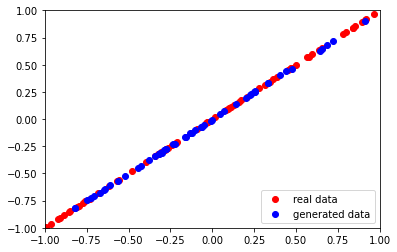

4/4 [==============================] - 0s 3ms/step
Epoch:  1060  Generator Loss:  [0.8093001842498779, 0.0]  Discriminator Loss:  [0.68010002 0.5       ]
2/2 [==============================] - 0s 5ms/step


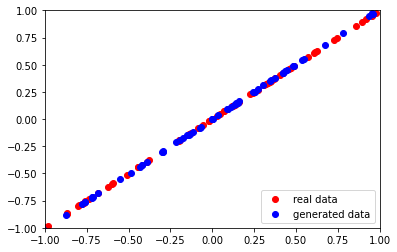

4/4 [==============================] - 0s 2ms/step
Epoch:  1070  Generator Loss:  [0.8009410500526428, 0.0]  Discriminator Loss:  [0.68372595 0.5       ]
2/2 [==============================] - 0s 4ms/step


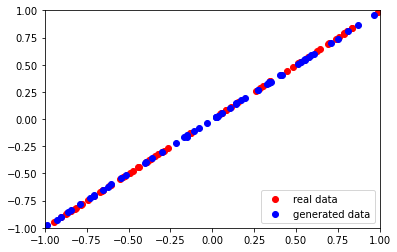

4/4 [==============================] - 0s 2ms/step
Epoch:  1080  Generator Loss:  [0.8038576245307922, 0.0]  Discriminator Loss:  [0.68065172 0.5       ]
2/2 [==============================] - 0s 3ms/step


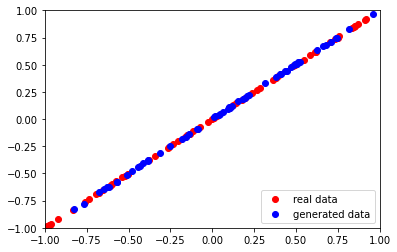

4/4 [==============================] - 0s 2ms/step
Epoch:  1090  Generator Loss:  [0.8102111220359802, 0.0]  Discriminator Loss:  [0.68429112 0.5       ]
2/2 [==============================] - 0s 3ms/step


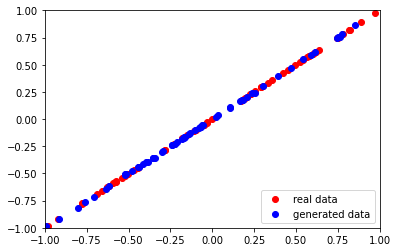

4/4 [==============================] - 0s 2ms/step
Epoch:  1100  Generator Loss:  [0.8084594011306763, 0.0]  Discriminator Loss:  [0.67915484 0.5       ]
2/2 [==============================] - 0s 3ms/step


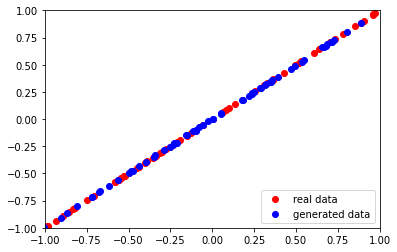

4/4 [==============================] - 0s 2ms/step
Epoch:  1110  Generator Loss:  [0.8104084730148315, 0.0]  Discriminator Loss:  [0.67662472 0.5       ]
2/2 [==============================] - 0s 3ms/step


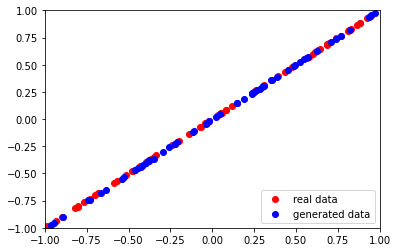

4/4 [==============================] - 0s 2ms/step
Epoch:  1120  Generator Loss:  [0.8048627972602844, 0.0]  Discriminator Loss:  [0.6831505 0.5      ]
2/2 [==============================] - 0s 4ms/step


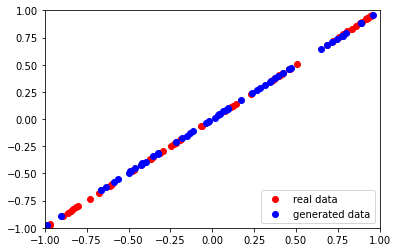

4/4 [==============================] - 0s 2ms/step
Epoch:  1130  Generator Loss:  [0.8166152238845825, 0.0]  Discriminator Loss:  [0.68367383 0.5       ]
2/2 [==============================] - 0s 3ms/step


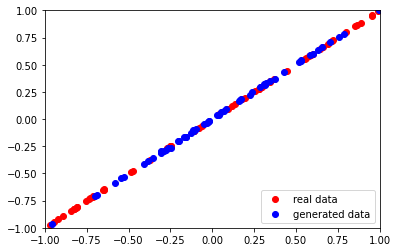

4/4 [==============================] - 0s 2ms/step
Epoch:  1140  Generator Loss:  [0.8085712194442749, 0.0]  Discriminator Loss:  [0.68151671 0.5       ]
2/2 [==============================] - 0s 3ms/step


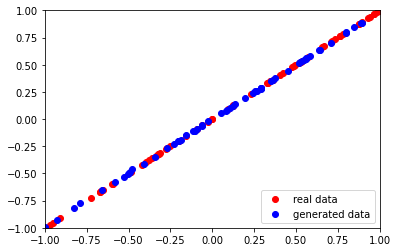

4/4 [==============================] - 0s 2ms/step
Epoch:  1150  Generator Loss:  [0.8227099180221558, 0.0]  Discriminator Loss:  [0.68835124 0.5       ]
2/2 [==============================] - 0s 4ms/step


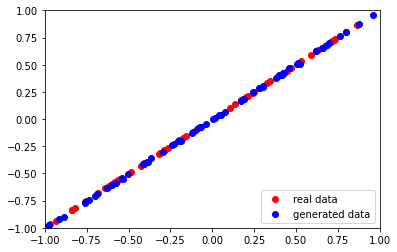

4/4 [==============================] - 0s 2ms/step
Epoch:  1160  Generator Loss:  [0.824079692363739, 0.0]  Discriminator Loss:  [0.68057379 0.5       ]
2/2 [==============================] - 0s 3ms/step


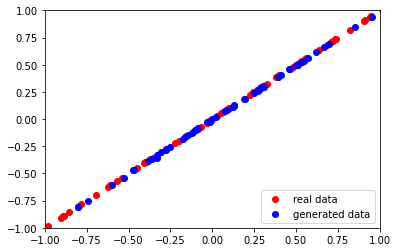

4/4 [==============================] - 0s 2ms/step
Epoch:  1170  Generator Loss:  [0.8175497651100159, 0.0]  Discriminator Loss:  [0.68302003 0.5       ]
2/2 [==============================] - 0s 3ms/step


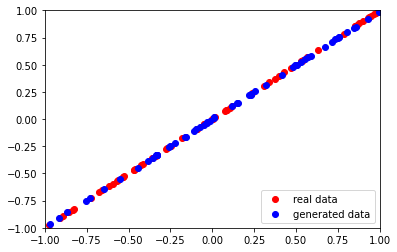

4/4 [==============================] - 0s 2ms/step
Epoch:  1180  Generator Loss:  [0.8258171081542969, 0.0]  Discriminator Loss:  [0.68108451 0.5       ]
2/2 [==============================] - 0s 3ms/step


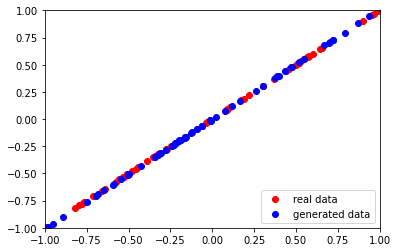

4/4 [==============================] - 0s 2ms/step
Epoch:  1190  Generator Loss:  [0.833842933177948, 0.0]  Discriminator Loss:  [0.68511629 0.5       ]
2/2 [==============================] - 0s 4ms/step


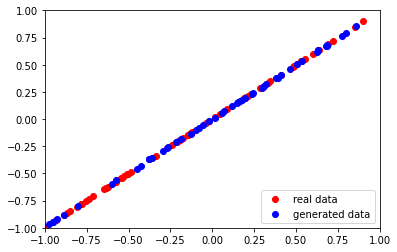

4/4 [==============================] - 0s 2ms/step
Epoch:  1200  Generator Loss:  [0.8292869329452515, 0.0]  Discriminator Loss:  [0.68300736 0.5       ]
2/2 [==============================] - 0s 3ms/step


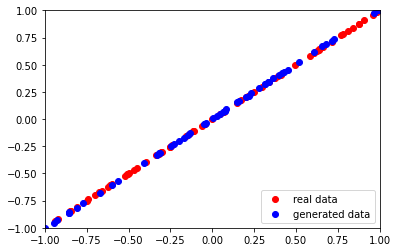

4/4 [==============================] - 0s 2ms/step
Epoch:  1210  Generator Loss:  [0.8246668577194214, 0.0]  Discriminator Loss:  [0.68683124 0.5       ]
2/2 [==============================] - 0s 3ms/step


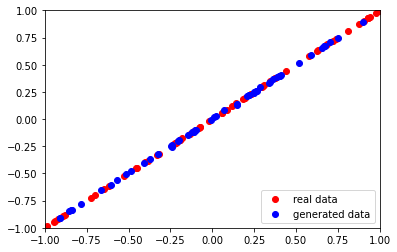

4/4 [==============================] - 0s 2ms/step
Epoch:  1220  Generator Loss:  [0.8054705858230591, 0.0]  Discriminator Loss:  [0.68222207 0.5       ]
2/2 [==============================] - 0s 3ms/step


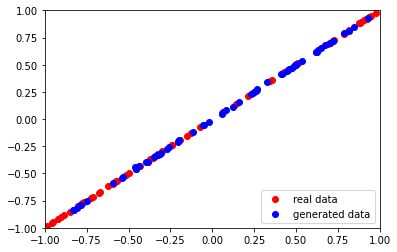

4/4 [==============================] - 0s 2ms/step
Epoch:  1230  Generator Loss:  [0.804043710231781, 0.0]  Discriminator Loss:  [0.68250746 0.5       ]
2/2 [==============================] - 0s 3ms/step


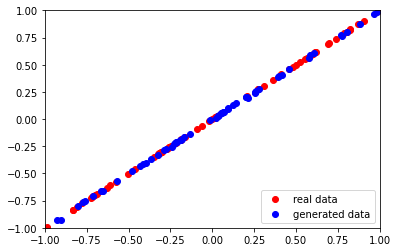

4/4 [==============================] - 0s 3ms/step
Epoch:  1240  Generator Loss:  [0.8056801557540894, 0.0]  Discriminator Loss:  [0.68484116 0.5       ]
2/2 [==============================] - 0s 3ms/step


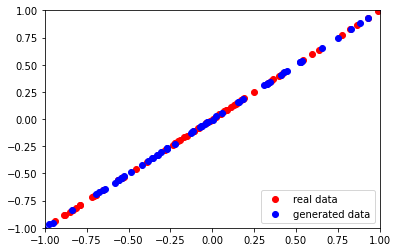

4/4 [==============================] - 0s 2ms/step
Epoch:  1250  Generator Loss:  [0.8117169737815857, 0.0]  Discriminator Loss:  [0.68226302 0.5       ]
2/2 [==============================] - 0s 3ms/step


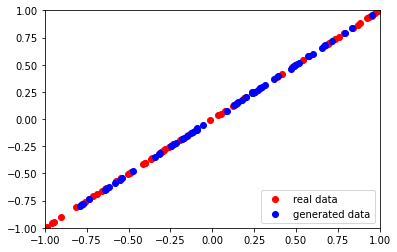

4/4 [==============================] - 0s 2ms/step
Epoch:  1260  Generator Loss:  [0.8058266639709473, 0.0]  Discriminator Loss:  [0.68305475 0.5       ]
2/2 [==============================] - 0s 4ms/step


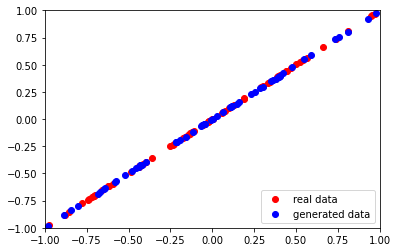

4/4 [==============================] - 0s 2ms/step
Epoch:  1270  Generator Loss:  [0.8162333965301514, 0.0]  Discriminator Loss:  [0.67882004 0.5       ]
2/2 [==============================] - 0s 3ms/step


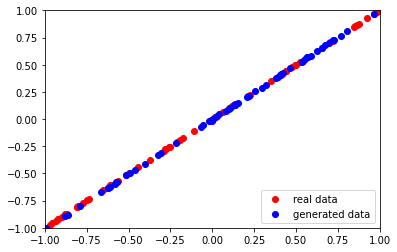

4/4 [==============================] - 0s 2ms/step
Epoch:  1280  Generator Loss:  [0.8133856654167175, 0.0]  Discriminator Loss:  [0.68296656 0.5       ]
2/2 [==============================] - 0s 3ms/step


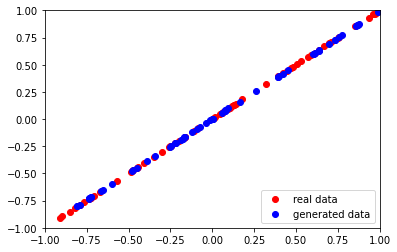

4/4 [==============================] - 0s 2ms/step
Epoch:  1290  Generator Loss:  [0.8048467636108398, 0.0]  Discriminator Loss:  [0.68041873 0.5       ]
2/2 [==============================] - 0s 3ms/step


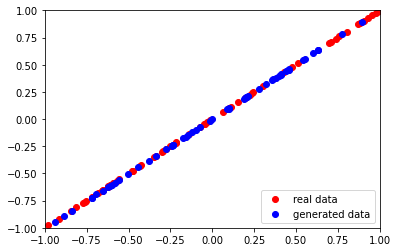

4/4 [==============================] - 0s 2ms/step
Epoch:  1300  Generator Loss:  [0.7997207641601562, 0.0]  Discriminator Loss:  [0.68603981 0.5       ]
2/2 [==============================] - 0s 4ms/step


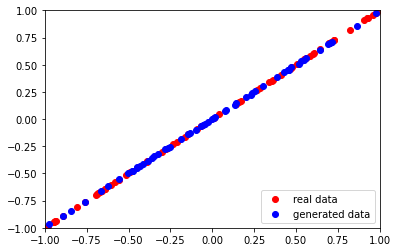

4/4 [==============================] - 0s 2ms/step
Epoch:  1310  Generator Loss:  [0.8260966539382935, 0.0]  Discriminator Loss:  [0.68591863 0.5       ]
2/2 [==============================] - 0s 3ms/step


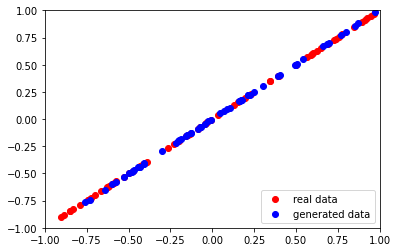

4/4 [==============================] - 0s 2ms/step
Epoch:  1320  Generator Loss:  [0.8195270299911499, 0.0]  Discriminator Loss:  [0.68079653 0.5       ]
2/2 [==============================] - 0s 4ms/step


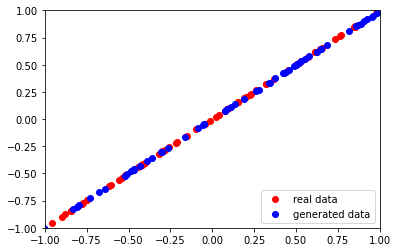

4/4 [==============================] - 0s 2ms/step
Epoch:  1330  Generator Loss:  [0.8201843500137329, 0.0]  Discriminator Loss:  [0.68614125 0.5       ]
2/2 [==============================] - 0s 3ms/step


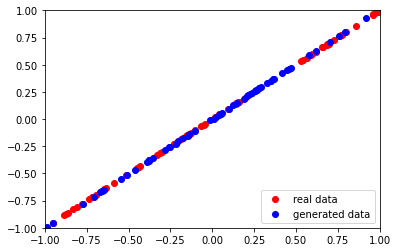

4/4 [==============================] - 0s 3ms/step
Epoch:  1340  Generator Loss:  [0.8195290565490723, 0.0]  Discriminator Loss:  [0.68439475 0.5       ]
2/2 [==============================] - 0s 3ms/step


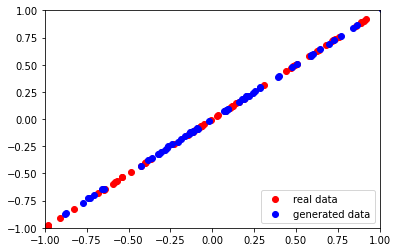

4/4 [==============================] - 0s 2ms/step
Epoch:  1350  Generator Loss:  [0.8204176425933838, 0.0]  Discriminator Loss:  [0.67815554 0.5       ]
2/2 [==============================] - 0s 3ms/step


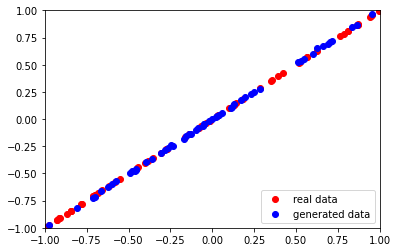

4/4 [==============================] - 0s 2ms/step
Epoch:  1360  Generator Loss:  [0.8073996305465698, 0.0]  Discriminator Loss:  [0.67948821 0.5       ]
2/2 [==============================] - 0s 3ms/step


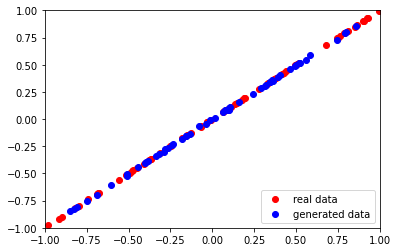

4/4 [==============================] - 0s 2ms/step
Epoch:  1370  Generator Loss:  [0.7965646982192993, 0.0]  Discriminator Loss:  [0.68271571 0.5       ]
2/2 [==============================] - 0s 3ms/step


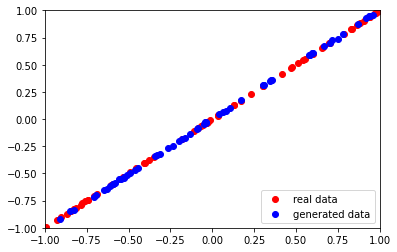

4/4 [==============================] - 0s 2ms/step
Epoch:  1380  Generator Loss:  [0.807645320892334, 0.1015625]  Discriminator Loss:  [0.682293  0.4765625]
2/2 [==============================] - 0s 3ms/step


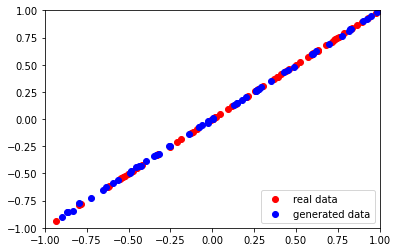

4/4 [==============================] - 0s 2ms/step
Epoch:  1390  Generator Loss:  [0.8109480738639832, 0.0078125]  Discriminator Loss:  [0.67360839 0.48828125]
2/2 [==============================] - 0s 3ms/step


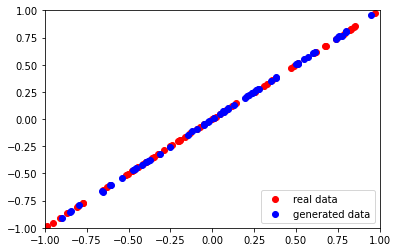

4/4 [==============================] - 0s 2ms/step
Epoch:  1400  Generator Loss:  [0.8208506107330322, 0.0]  Discriminator Loss:  [0.6801241 0.5      ]
2/2 [==============================] - 0s 4ms/step


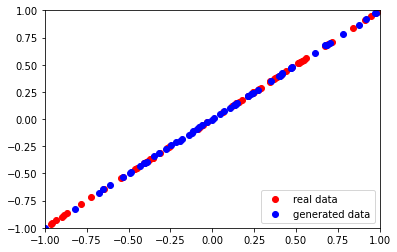

4/4 [==============================] - 0s 3ms/step
Epoch:  1410  Generator Loss:  [0.8362237215042114, 0.0]  Discriminator Loss:  [0.68333828 0.5       ]
2/2 [==============================] - 0s 3ms/step


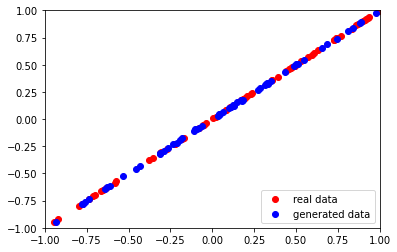

4/4 [==============================] - 0s 2ms/step
Epoch:  1420  Generator Loss:  [0.834099531173706, 0.0]  Discriminator Loss:  [0.67502391 0.5       ]
2/2 [==============================] - 0s 3ms/step


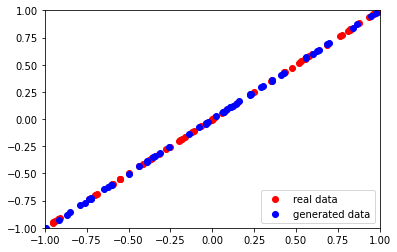

4/4 [==============================] - 0s 2ms/step
Epoch:  1430  Generator Loss:  [0.8244377970695496, 0.0]  Discriminator Loss:  [0.68200669 0.5       ]
2/2 [==============================] - 0s 3ms/step


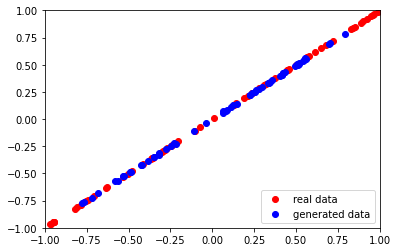

4/4 [==============================] - 0s 2ms/step
Epoch:  1440  Generator Loss:  [0.8065840005874634, 0.0]  Discriminator Loss:  [0.68453336 0.5       ]
2/2 [==============================] - 0s 3ms/step


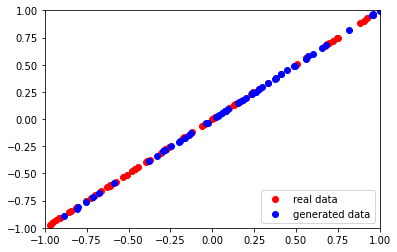

4/4 [==============================] - 0s 2ms/step
Epoch:  1450  Generator Loss:  [0.8213289380073547, 0.0]  Discriminator Loss:  [0.67836773 0.5       ]
2/2 [==============================] - 0s 4ms/step


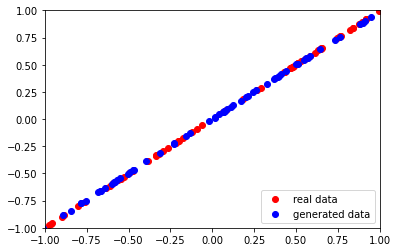

4/4 [==============================] - 0s 2ms/step
Epoch:  1460  Generator Loss:  [0.8098844885826111, 0.0]  Discriminator Loss:  [0.67411622 0.5       ]
2/2 [==============================] - 0s 3ms/step


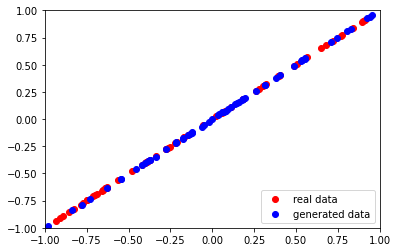

4/4 [==============================] - 0s 2ms/step
Epoch:  1470  Generator Loss:  [0.8078111410140991, 0.0]  Discriminator Loss:  [0.68013927 0.5       ]
2/2 [==============================] - 0s 4ms/step


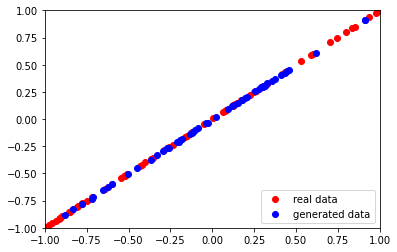

4/4 [==============================] - 0s 2ms/step
Epoch:  1480  Generator Loss:  [0.8129333853721619, 0.0]  Discriminator Loss:  [0.67670828 0.5       ]
2/2 [==============================] - 0s 3ms/step


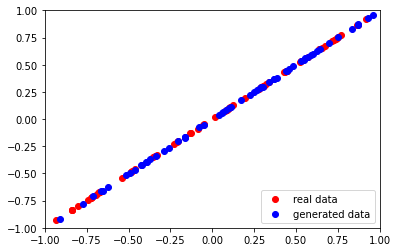

4/4 [==============================] - 0s 2ms/step
Epoch:  1490  Generator Loss:  [0.8240971565246582, 0.0]  Discriminator Loss:  [0.68070951 0.5       ]
2/2 [==============================] - 0s 7ms/step


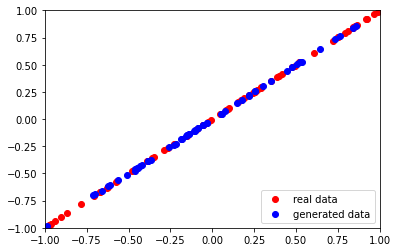

4/4 [==============================] - 0s 2ms/step
Epoch:  1500  Generator Loss:  [0.8285422325134277, 0.0]  Discriminator Loss:  [0.68137816 0.5       ]
2/2 [==============================] - 0s 3ms/step


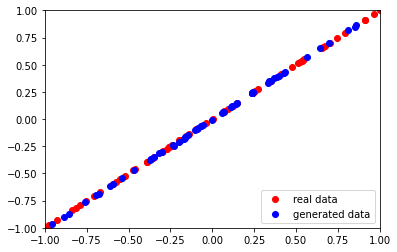

4/4 [==============================] - 0s 2ms/step
Epoch:  1510  Generator Loss:  [0.8252385854721069, 0.0]  Discriminator Loss:  [0.68115512 0.5       ]
2/2 [==============================] - 0s 3ms/step


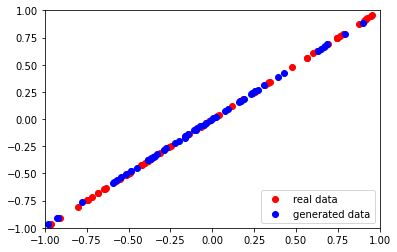

4/4 [==============================] - 0s 2ms/step
Epoch:  1520  Generator Loss:  [0.8184344172477722, 0.0]  Discriminator Loss:  [0.68058491 0.5       ]
2/2 [==============================] - 0s 4ms/step


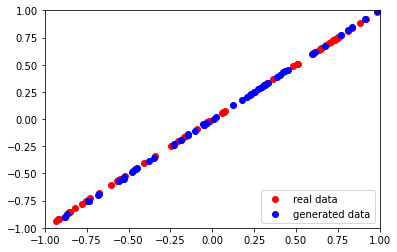

4/4 [==============================] - 0s 2ms/step
Epoch:  1530  Generator Loss:  [0.8125503063201904, 0.0]  Discriminator Loss:  [0.68501708 0.49609375]
2/2 [==============================] - 0s 3ms/step


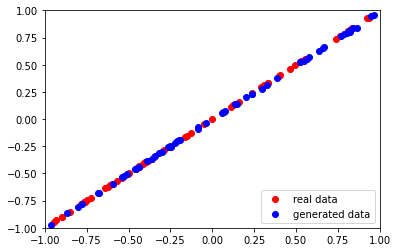

4/4 [==============================] - 0s 2ms/step
Epoch:  1540  Generator Loss:  [0.8178730607032776, 0.0]  Discriminator Loss:  [0.68224144 0.5       ]
2/2 [==============================] - 0s 3ms/step


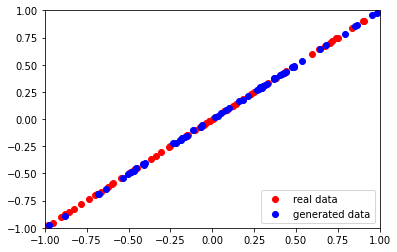

4/4 [==============================] - 0s 2ms/step
Epoch:  1550  Generator Loss:  [0.81345134973526, 0.0]  Discriminator Loss:  [0.68680429 0.5       ]
2/2 [==============================] - 0s 3ms/step


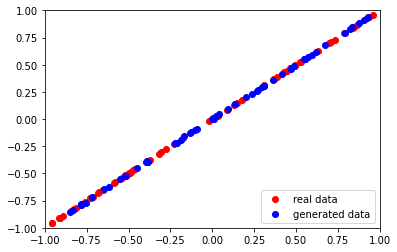

4/4 [==============================] - 0s 2ms/step
Epoch:  1560  Generator Loss:  [0.8150343894958496, 0.0]  Discriminator Loss:  [0.68038151 0.5       ]
2/2 [==============================] - 0s 3ms/step


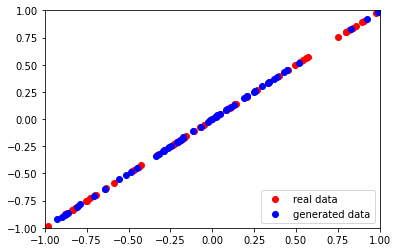

4/4 [==============================] - 0s 2ms/step
Epoch:  1570  Generator Loss:  [0.8138453960418701, 0.0]  Discriminator Loss:  [0.67908549 0.5       ]
2/2 [==============================] - 0s 3ms/step


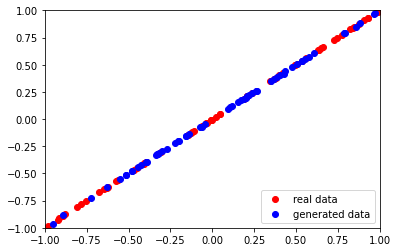

4/4 [==============================] - 0s 2ms/step
Epoch:  1580  Generator Loss:  [0.8127614855766296, 0.0]  Discriminator Loss:  [0.67767438 0.5       ]
2/2 [==============================] - 0s 3ms/step


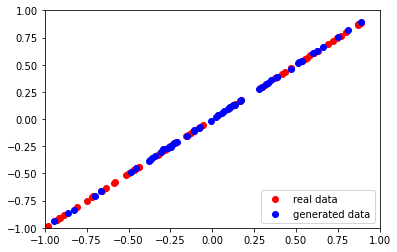

4/4 [==============================] - 0s 2ms/step
Epoch:  1590  Generator Loss:  [0.8292014598846436, 0.0]  Discriminator Loss:  [0.67737427 0.5       ]
2/2 [==============================] - 0s 3ms/step


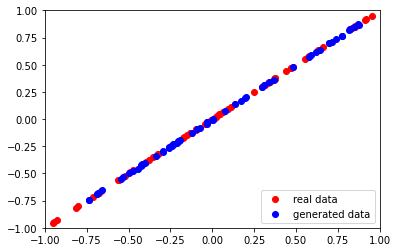

4/4 [==============================] - 0s 2ms/step
Epoch:  1600  Generator Loss:  [0.8307744264602661, 0.0]  Discriminator Loss:  [0.68056107 0.5       ]
2/2 [==============================] - 0s 3ms/step


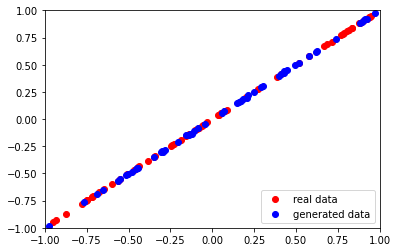

4/4 [==============================] - 0s 2ms/step
Epoch:  1610  Generator Loss:  [0.8228054046630859, 0.0]  Discriminator Loss:  [0.68403074 0.5       ]
2/2 [==============================] - 0s 3ms/step


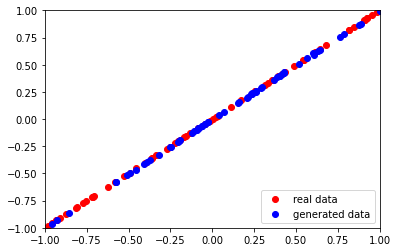

4/4 [==============================] - 0s 4ms/step
Epoch:  1620  Generator Loss:  [0.8209696412086487, 0.0]  Discriminator Loss:  [0.68465677 0.5       ]
2/2 [==============================] - 0s 4ms/step


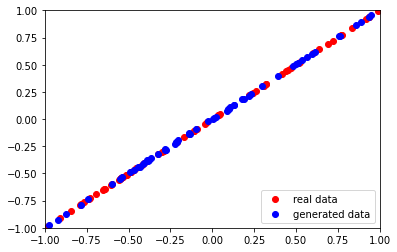

4/4 [==============================] - 0s 2ms/step
Epoch:  1630  Generator Loss:  [0.8130732178688049, 0.0]  Discriminator Loss:  [0.68497416 0.5       ]
2/2 [==============================] - 0s 4ms/step


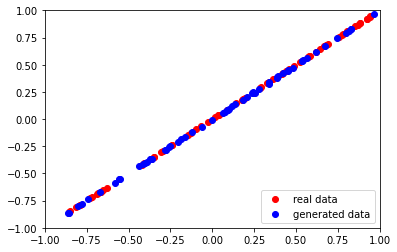

4/4 [==============================] - 0s 2ms/step
Epoch:  1640  Generator Loss:  [0.809402346611023, 0.0]  Discriminator Loss:  [0.68217134 0.5       ]
2/2 [==============================] - 0s 3ms/step


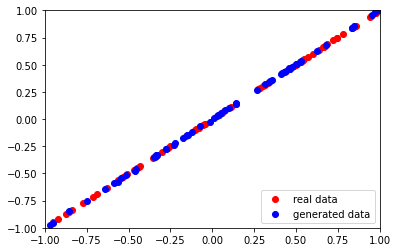

4/4 [==============================] - 0s 3ms/step
Epoch:  1650  Generator Loss:  [0.8142194747924805, 0.0]  Discriminator Loss:  [0.68307555 0.5       ]
2/2 [==============================] - 0s 3ms/step


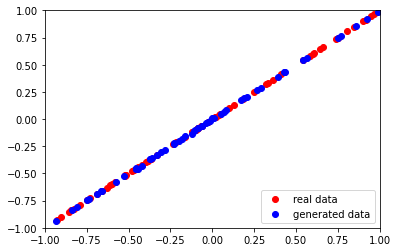

4/4 [==============================] - 0s 2ms/step
Epoch:  1660  Generator Loss:  [0.814202070236206, 0.0]  Discriminator Loss:  [0.68103215 0.5       ]
2/2 [==============================] - 0s 3ms/step


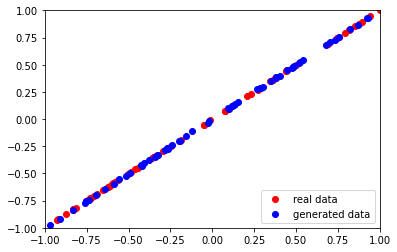

4/4 [==============================] - 0s 2ms/step
Epoch:  1670  Generator Loss:  [0.8152743577957153, 0.0]  Discriminator Loss:  [0.68190414 0.5       ]
2/2 [==============================] - 0s 3ms/step


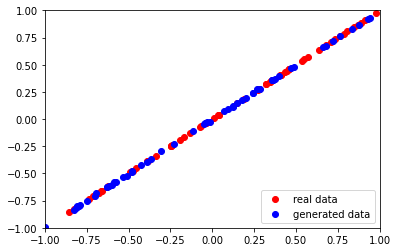

4/4 [==============================] - 0s 2ms/step
Epoch:  1680  Generator Loss:  [0.8205357789993286, 0.0]  Discriminator Loss:  [0.68183583 0.5       ]
2/2 [==============================] - 0s 10ms/step


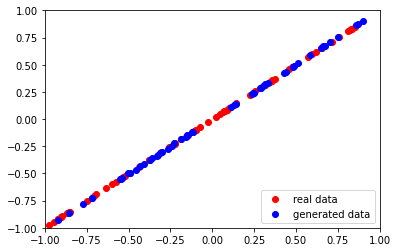

4/4 [==============================] - 0s 2ms/step
Epoch:  1690  Generator Loss:  [0.8097386360168457, 0.0]  Discriminator Loss:  [0.68685865 0.5       ]
2/2 [==============================] - 0s 3ms/step


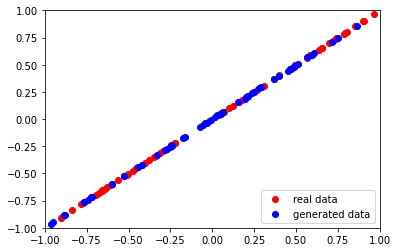

4/4 [==============================] - 0s 2ms/step
Epoch:  1700  Generator Loss:  [0.8263354301452637, 0.0]  Discriminator Loss:  [0.67799008 0.5       ]
2/2 [==============================] - 0s 3ms/step


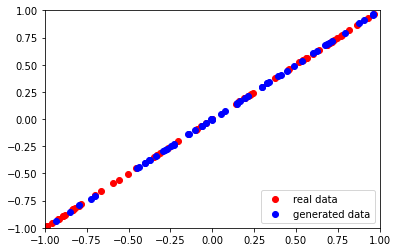

4/4 [==============================] - 0s 2ms/step
Epoch:  1710  Generator Loss:  [0.8098623752593994, 0.015625]  Discriminator Loss:  [0.68703604 0.48828125]
2/2 [==============================] - 0s 4ms/step


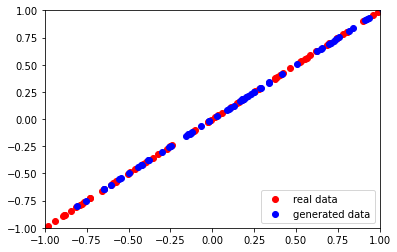

4/4 [==============================] - 0s 2ms/step
Epoch:  1720  Generator Loss:  [0.8190721273422241, 0.0]  Discriminator Loss:  [0.68086961 0.5       ]
2/2 [==============================] - 0s 3ms/step


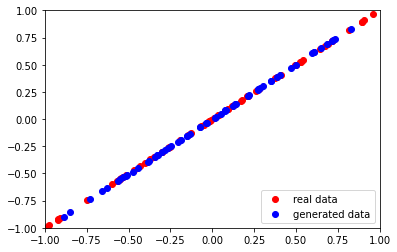

4/4 [==============================] - 0s 3ms/step
Epoch:  1730  Generator Loss:  [0.819926381111145, 0.0]  Discriminator Loss:  [0.68368751 0.5       ]
2/2 [==============================] - 0s 3ms/step


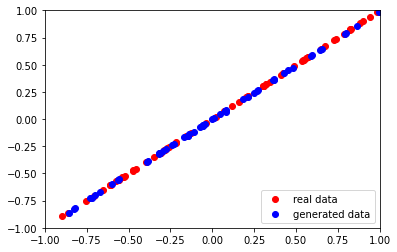

4/4 [==============================] - 0s 2ms/step
Epoch:  1740  Generator Loss:  [0.8220943808555603, 0.0]  Discriminator Loss:  [0.68429673 0.5       ]
2/2 [==============================] - 0s 6ms/step


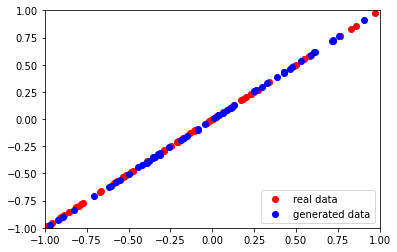

4/4 [==============================] - 0s 2ms/step
Epoch:  1750  Generator Loss:  [0.8160549402236938, 0.0]  Discriminator Loss:  [0.68296504 0.5       ]
2/2 [==============================] - 0s 3ms/step


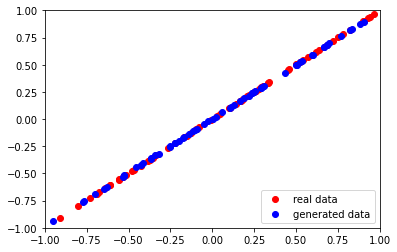

4/4 [==============================] - 0s 2ms/step
Epoch:  1760  Generator Loss:  [0.8400018811225891, 0.0]  Discriminator Loss:  [0.68473008 0.5       ]
2/2 [==============================] - 0s 3ms/step


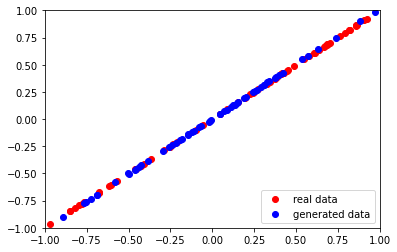

4/4 [==============================] - 0s 2ms/step
Epoch:  1770  Generator Loss:  [0.8209864497184753, 0.0]  Discriminator Loss:  [0.68101084 0.5       ]
2/2 [==============================] - 0s 3ms/step


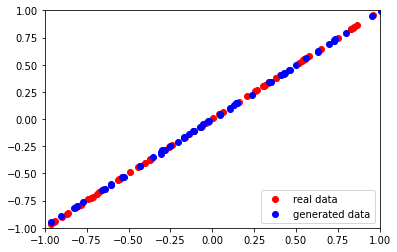

4/4 [==============================] - 0s 2ms/step
Epoch:  1780  Generator Loss:  [0.8115102648735046, 0.0]  Discriminator Loss:  [0.67305386 0.5       ]
2/2 [==============================] - 0s 3ms/step


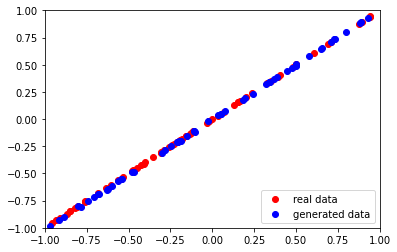

4/4 [==============================] - 0s 2ms/step
Epoch:  1790  Generator Loss:  [0.8197962045669556, 0.0]  Discriminator Loss:  [0.68885368 0.5       ]
2/2 [==============================] - 0s 4ms/step


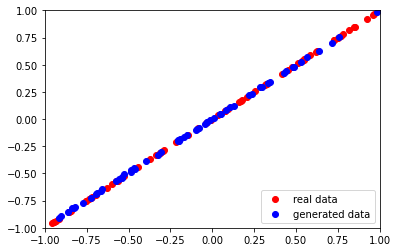

4/4 [==============================] - 0s 2ms/step
Epoch:  1800  Generator Loss:  [0.8195772171020508, 0.0]  Discriminator Loss:  [0.68079719 0.5       ]
2/2 [==============================] - 0s 3ms/step


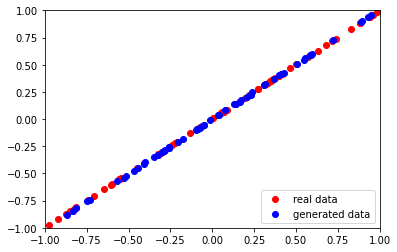

4/4 [==============================] - 0s 2ms/step
Epoch:  1810  Generator Loss:  [0.8303794264793396, 0.0]  Discriminator Loss:  [0.68456829 0.5       ]
2/2 [==============================] - 0s 3ms/step


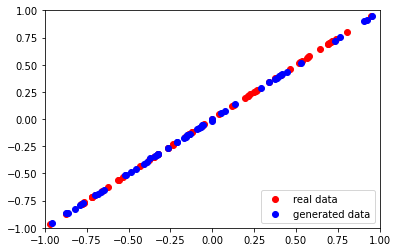

4/4 [==============================] - 0s 2ms/step
Epoch:  1820  Generator Loss:  [0.8195194602012634, 0.0]  Discriminator Loss:  [0.67896581 0.5       ]
2/2 [==============================] - 0s 3ms/step


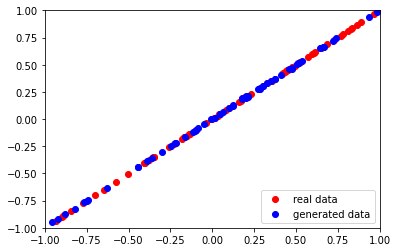

4/4 [==============================] - 0s 2ms/step
Epoch:  1830  Generator Loss:  [0.8155025243759155, 0.0]  Discriminator Loss:  [0.67776754 0.5       ]
2/2 [==============================] - 0s 3ms/step


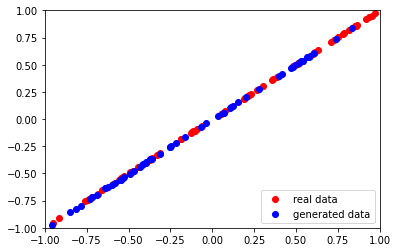

4/4 [==============================] - 0s 2ms/step
Epoch:  1840  Generator Loss:  [0.8059099912643433, 0.0]  Discriminator Loss:  [0.68080476 0.5       ]
2/2 [==============================] - 0s 3ms/step


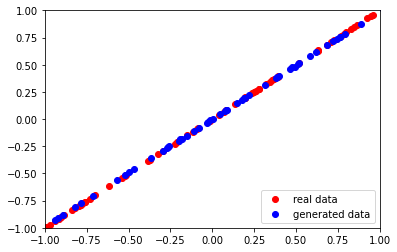

4/4 [==============================] - 0s 2ms/step
Epoch:  1850  Generator Loss:  [0.8098114728927612, 0.0]  Discriminator Loss:  [0.6799331 0.5      ]
2/2 [==============================] - 0s 3ms/step


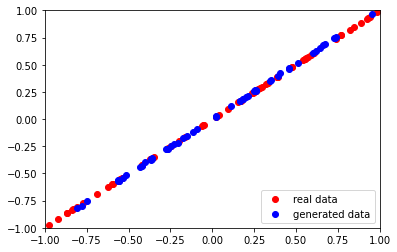

4/4 [==============================] - 0s 2ms/step
Epoch:  1860  Generator Loss:  [0.8090336322784424, 0.0]  Discriminator Loss:  [0.67548916 0.5       ]
2/2 [==============================] - 0s 3ms/step


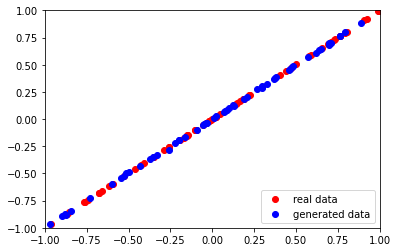

4/4 [==============================] - 0s 2ms/step
Epoch:  1870  Generator Loss:  [0.8132742047309875, 0.0]  Discriminator Loss:  [0.68574944 0.5       ]
2/2 [==============================] - 0s 3ms/step


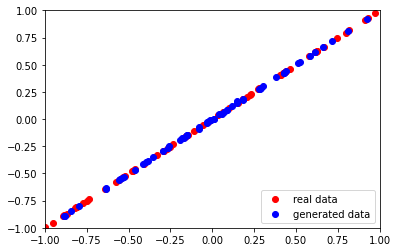

4/4 [==============================] - 0s 2ms/step
Epoch:  1880  Generator Loss:  [0.8204340934753418, 0.0]  Discriminator Loss:  [0.67994934 0.5       ]
2/2 [==============================] - 0s 3ms/step


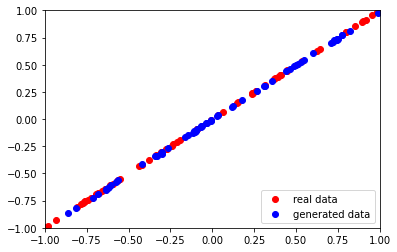

4/4 [==============================] - 0s 2ms/step
Epoch:  1890  Generator Loss:  [0.8117302656173706, 0.0]  Discriminator Loss:  [0.68251044 0.5       ]
2/2 [==============================] - 0s 3ms/step


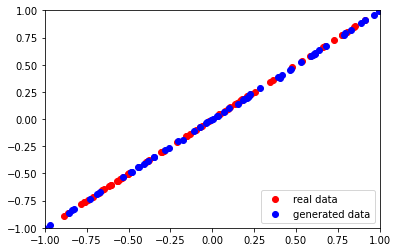

4/4 [==============================] - 0s 2ms/step
Epoch:  1900  Generator Loss:  [0.8113405108451843, 0.0]  Discriminator Loss:  [0.68303108 0.5       ]
2/2 [==============================] - 0s 3ms/step


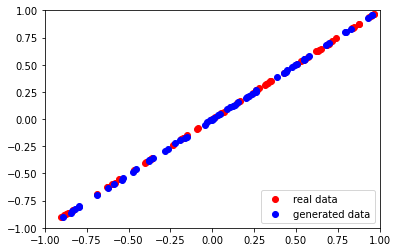

4/4 [==============================] - 0s 2ms/step
Epoch:  1910  Generator Loss:  [0.8291841745376587, 0.0]  Discriminator Loss:  [0.68008775 0.5       ]
2/2 [==============================] - 0s 3ms/step


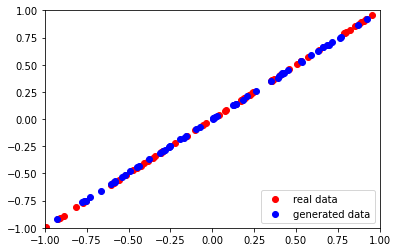

4/4 [==============================] - 0s 2ms/step
Epoch:  1920  Generator Loss:  [0.8157453536987305, 0.0]  Discriminator Loss:  [0.68560153 0.5       ]
2/2 [==============================] - 0s 4ms/step


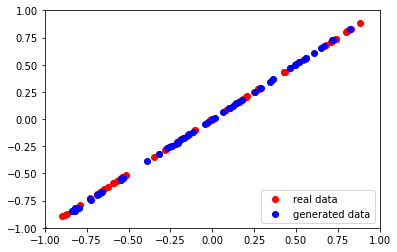

4/4 [==============================] - 0s 2ms/step
Epoch:  1930  Generator Loss:  [0.7997438311576843, 0.0]  Discriminator Loss:  [0.69038779 0.5       ]
2/2 [==============================] - 0s 3ms/step


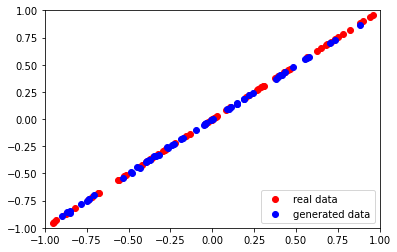

4/4 [==============================] - 0s 2ms/step
Epoch:  1940  Generator Loss:  [0.8145748972892761, 0.0]  Discriminator Loss:  [0.68851113 0.5       ]
2/2 [==============================] - 0s 3ms/step


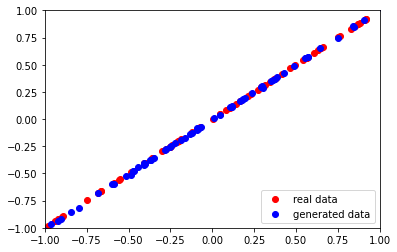

4/4 [==============================] - 0s 2ms/step
Epoch:  1950  Generator Loss:  [0.819513201713562, 0.0]  Discriminator Loss:  [0.67774558 0.5       ]
2/2 [==============================] - 0s 3ms/step


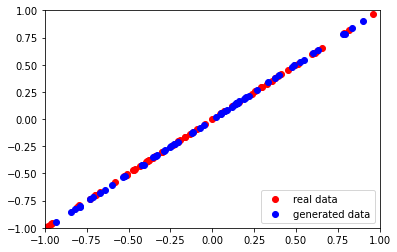

4/4 [==============================] - 0s 5ms/step
Epoch:  1960  Generator Loss:  [0.8165726661682129, 0.0]  Discriminator Loss:  [0.6753701  0.49609375]
2/2 [==============================] - 0s 3ms/step


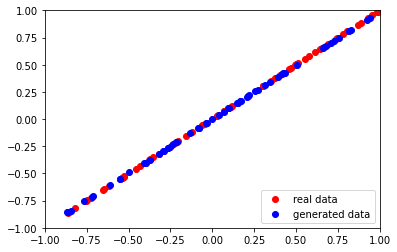

4/4 [==============================] - 0s 3ms/step
Epoch:  1970  Generator Loss:  [0.7947648167610168, 0.1015625]  Discriminator Loss:  [0.6799275 0.4609375]
2/2 [==============================] - 0s 3ms/step


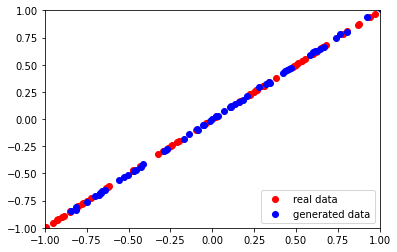

4/4 [==============================] - 0s 3ms/step
Epoch:  1980  Generator Loss:  [0.8082634806632996, 0.1171875]  Discriminator Loss:  [0.67959455 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


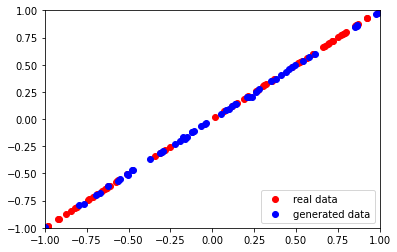

4/4 [==============================] - 0s 2ms/step
Epoch:  1990  Generator Loss:  [0.8167322874069214, 0.0]  Discriminator Loss:  [0.67445794 0.5       ]
2/2 [==============================] - 0s 3ms/step


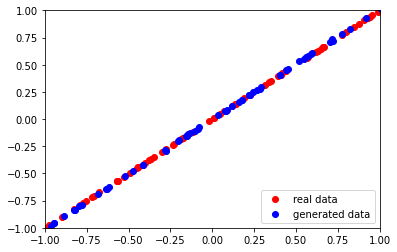

4/4 [==============================] - 0s 2ms/step
Epoch:  2000  Generator Loss:  [0.8316613435745239, 0.0]  Discriminator Loss:  [0.67958128 0.5       ]
2/2 [==============================] - 0s 3ms/step


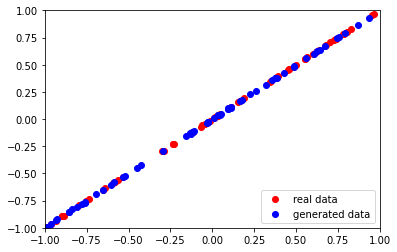

4/4 [==============================] - 0s 3ms/step
Epoch:  2010  Generator Loss:  [0.8196477890014648, 0.0]  Discriminator Loss:  [0.68362719 0.5       ]
2/2 [==============================] - 0s 3ms/step


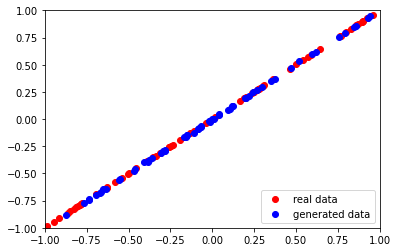

4/4 [==============================] - 0s 2ms/step
Epoch:  2020  Generator Loss:  [0.8213125467300415, 0.0]  Discriminator Loss:  [0.67900655 0.5       ]
2/2 [==============================] - 0s 3ms/step


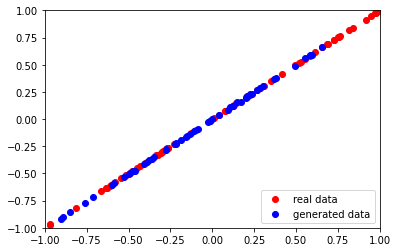

4/4 [==============================] - 0s 2ms/step
Epoch:  2030  Generator Loss:  [0.8221691250801086, 0.015625]  Discriminator Loss:  [0.67815354 0.48828125]
2/2 [==============================] - 0s 3ms/step


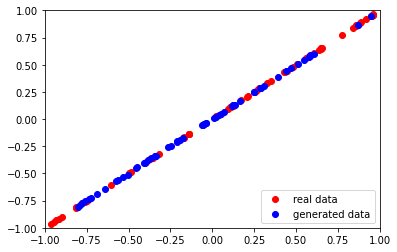

4/4 [==============================] - 0s 2ms/step
Epoch:  2040  Generator Loss:  [0.8171655535697937, 0.0]  Discriminator Loss:  [0.68136051 0.5       ]
2/2 [==============================] - 0s 3ms/step


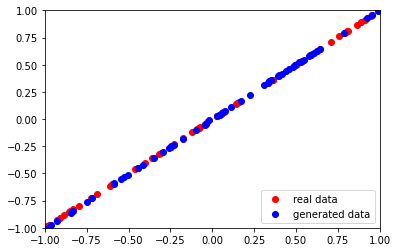

4/4 [==============================] - 0s 2ms/step
Epoch:  2050  Generator Loss:  [0.8138442039489746, 0.0]  Discriminator Loss:  [0.68271193 0.5       ]
2/2 [==============================] - 0s 3ms/step


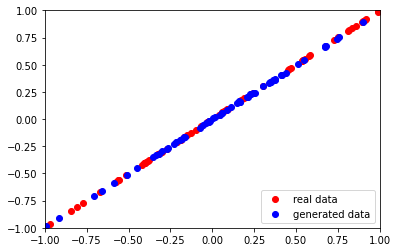

4/4 [==============================] - 0s 2ms/step
Epoch:  2060  Generator Loss:  [0.8062213659286499, 0.0]  Discriminator Loss:  [0.67953628 0.5       ]
2/2 [==============================] - 0s 3ms/step


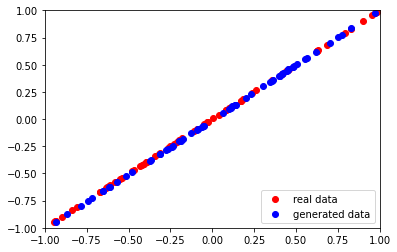

4/4 [==============================] - 0s 2ms/step
Epoch:  2070  Generator Loss:  [0.826032817363739, 0.0]  Discriminator Loss:  [0.67858702 0.5       ]
2/2 [==============================] - 0s 4ms/step


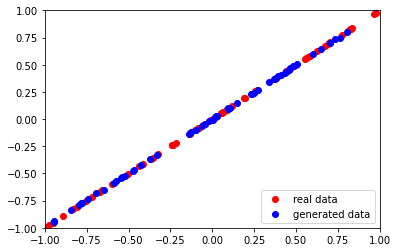

4/4 [==============================] - 0s 2ms/step
Epoch:  2080  Generator Loss:  [0.8149816989898682, 0.0]  Discriminator Loss:  [0.68252581 0.5       ]
2/2 [==============================] - 0s 3ms/step


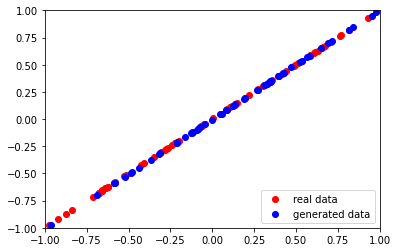

4/4 [==============================] - 0s 2ms/step
Epoch:  2090  Generator Loss:  [0.8110268712043762, 0.0078125]  Discriminator Loss:  [0.67909133 0.484375  ]
2/2 [==============================] - 0s 3ms/step


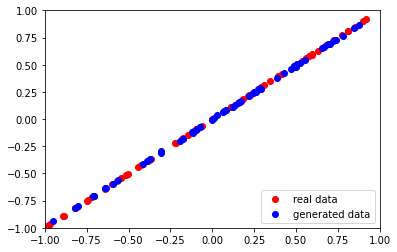

4/4 [==============================] - 0s 2ms/step
Epoch:  2100  Generator Loss:  [0.8134076595306396, 0.0703125]  Discriminator Loss:  [0.68009791 0.453125  ]
2/2 [==============================] - 0s 3ms/step


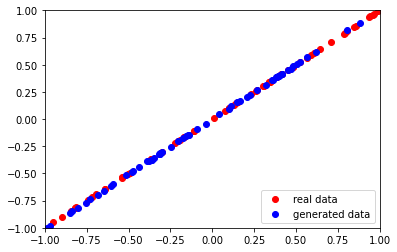

4/4 [==============================] - 0s 2ms/step
Epoch:  2110  Generator Loss:  [0.8184502720832825, 0.0]  Discriminator Loss:  [0.67865902 0.5       ]
2/2 [==============================] - 0s 3ms/step


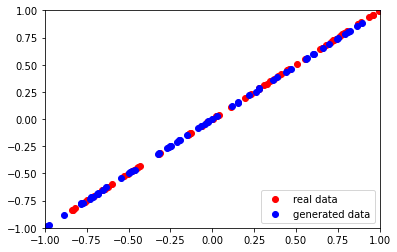

4/4 [==============================] - 0s 2ms/step
Epoch:  2120  Generator Loss:  [0.8163633346557617, 0.0]  Discriminator Loss:  [0.68127021 0.5       ]
2/2 [==============================] - 0s 3ms/step


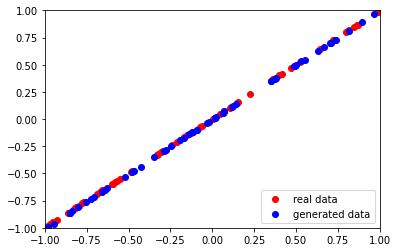

4/4 [==============================] - 0s 2ms/step
Epoch:  2130  Generator Loss:  [0.819487452507019, 0.0]  Discriminator Loss:  [0.68189257 0.5       ]
2/2 [==============================] - 0s 2ms/step


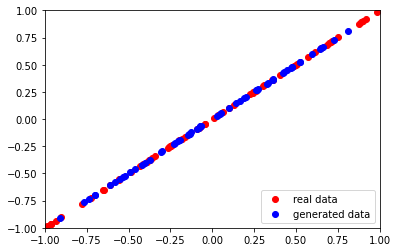

4/4 [==============================] - 0s 2ms/step
Epoch:  2140  Generator Loss:  [0.8111197352409363, 0.0]  Discriminator Loss:  [0.6785585 0.5      ]
2/2 [==============================] - 0s 4ms/step


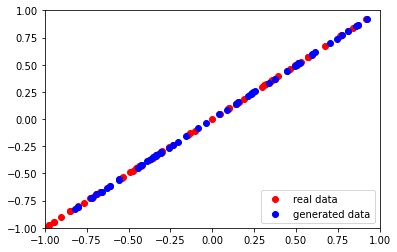

4/4 [==============================] - 0s 2ms/step
Epoch:  2150  Generator Loss:  [0.8004108667373657, 0.0546875]  Discriminator Loss:  [0.68282878 0.484375  ]
2/2 [==============================] - 0s 3ms/step


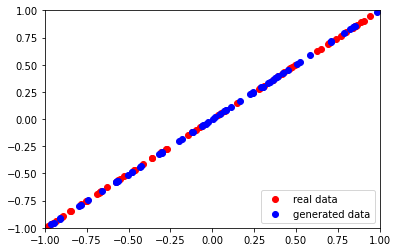

4/4 [==============================] - 0s 2ms/step
Epoch:  2160  Generator Loss:  [0.8160278797149658, 0.0078125]  Discriminator Loss:  [0.68056422 0.5       ]
2/2 [==============================] - 0s 3ms/step


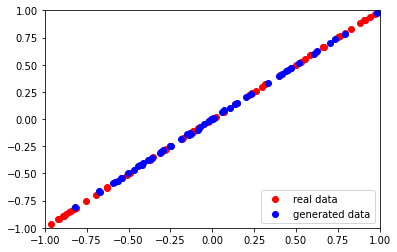

4/4 [==============================] - 0s 2ms/step
Epoch:  2170  Generator Loss:  [0.796133816242218, 0.015625]  Discriminator Loss:  [0.68281943 0.49609375]
2/2 [==============================] - 0s 3ms/step


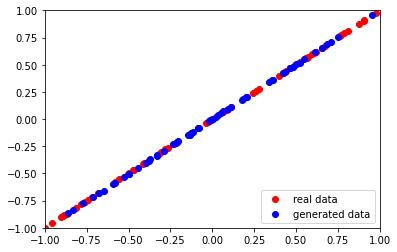

4/4 [==============================] - 0s 3ms/step
Epoch:  2180  Generator Loss:  [0.8067829608917236, 0.0234375]  Discriminator Loss:  [0.67878005 0.5       ]
2/2 [==============================] - 0s 3ms/step


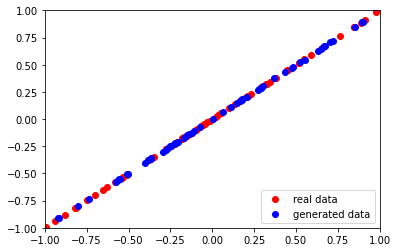

4/4 [==============================] - 0s 3ms/step
Epoch:  2190  Generator Loss:  [0.8031029105186462, 0.015625]  Discriminator Loss:  [0.67797929 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


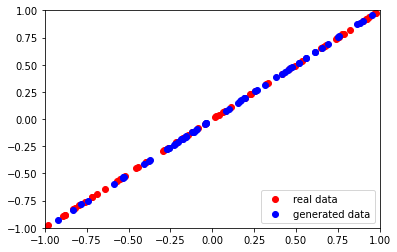

4/4 [==============================] - 0s 2ms/step
Epoch:  2200  Generator Loss:  [0.825206995010376, 0.0234375]  Discriminator Loss:  [0.6815843 0.4921875]
2/2 [==============================] - 0s 4ms/step


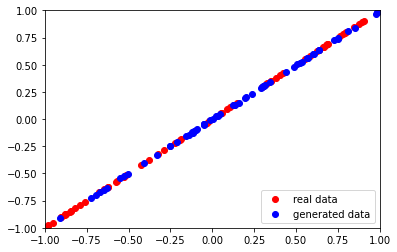

4/4 [==============================] - 0s 3ms/step
Epoch:  2210  Generator Loss:  [0.8328370451927185, 0.0]  Discriminator Loss:  [0.6785081 0.4921875]
2/2 [==============================] - 0s 3ms/step


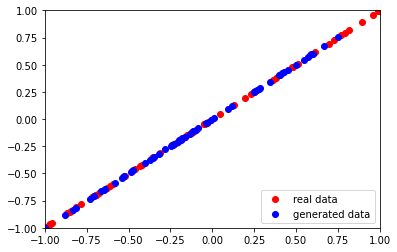

4/4 [==============================] - 0s 2ms/step
Epoch:  2220  Generator Loss:  [0.8073821663856506, 0.046875]  Discriminator Loss:  [0.6825633 0.4609375]
2/2 [==============================] - 0s 4ms/step


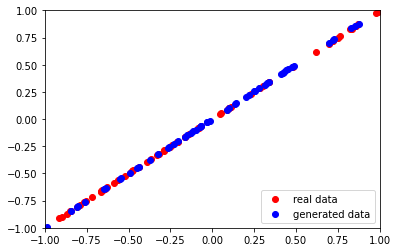

4/4 [==============================] - 0s 2ms/step
Epoch:  2230  Generator Loss:  [0.8129594922065735, 0.0078125]  Discriminator Loss:  [0.68775967 0.48828125]
2/2 [==============================] - 0s 3ms/step


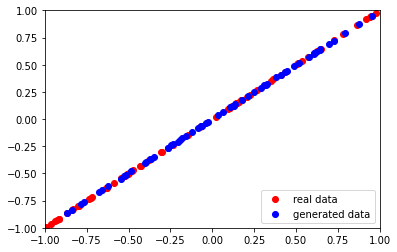

4/4 [==============================] - 0s 2ms/step
Epoch:  2240  Generator Loss:  [0.833073079586029, 0.0234375]  Discriminator Loss:  [0.68649822 0.484375  ]
2/2 [==============================] - 0s 4ms/step


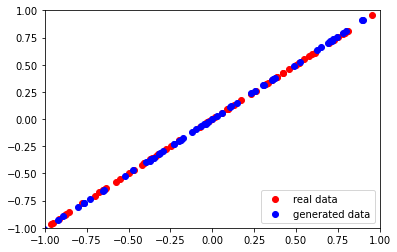

4/4 [==============================] - 0s 2ms/step
Epoch:  2250  Generator Loss:  [0.8196603059768677, 0.0]  Discriminator Loss:  [0.67862174 0.5       ]
2/2 [==============================] - 0s 3ms/step


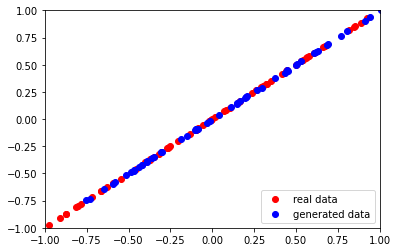

4/4 [==============================] - 0s 2ms/step
Epoch:  2260  Generator Loss:  [0.834643542766571, 0.0]  Discriminator Loss:  [0.67792878 0.5       ]
2/2 [==============================] - 0s 3ms/step


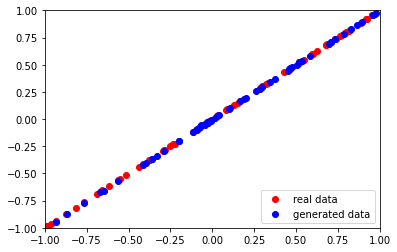

4/4 [==============================] - 0s 2ms/step
Epoch:  2270  Generator Loss:  [0.8101540803909302, 0.03125]  Discriminator Loss:  [0.68024504 0.47265625]
2/2 [==============================] - 0s 3ms/step


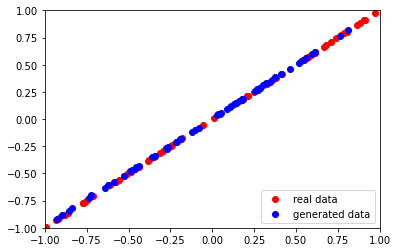

4/4 [==============================] - 0s 3ms/step
Epoch:  2280  Generator Loss:  [0.7967129349708557, 0.171875]  Discriminator Loss:  [0.68279132 0.453125  ]
2/2 [==============================] - 0s 5ms/step


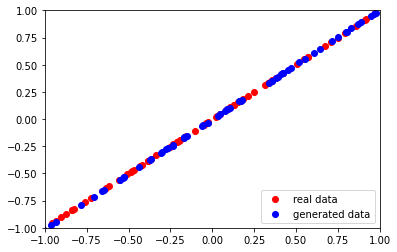

4/4 [==============================] - 0s 4ms/step
Epoch:  2290  Generator Loss:  [0.8093235492706299, 0.078125]  Discriminator Loss:  [0.67775023 0.453125  ]
2/2 [==============================] - 0s 6ms/step


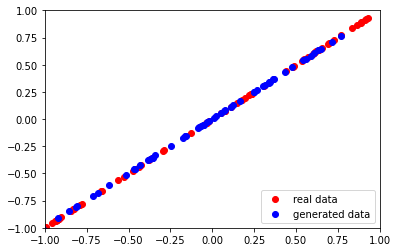

4/4 [==============================] - 0s 2ms/step
Epoch:  2300  Generator Loss:  [0.8188186287879944, 0.0078125]  Discriminator Loss:  [0.68161139 0.484375  ]
2/2 [==============================] - 0s 4ms/step


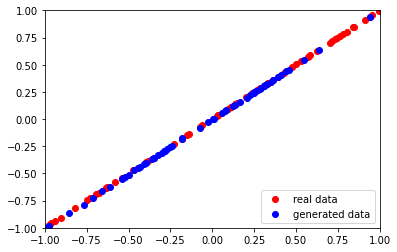

4/4 [==============================] - 0s 3ms/step
Epoch:  2310  Generator Loss:  [0.8252119421958923, 0.0]  Discriminator Loss:  [0.6737127 0.5      ]
2/2 [==============================] - 0s 3ms/step


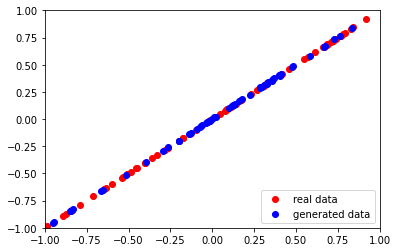

4/4 [==============================] - 0s 2ms/step
Epoch:  2320  Generator Loss:  [0.8300719261169434, 0.0]  Discriminator Loss:  [0.67894223 0.5       ]
2/2 [==============================] - 0s 4ms/step


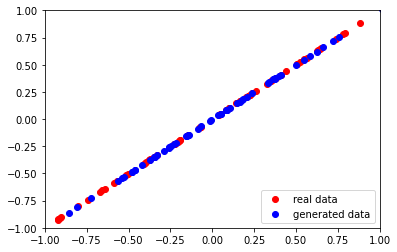

4/4 [==============================] - 0s 2ms/step
Epoch:  2330  Generator Loss:  [0.813779354095459, 0.015625]  Discriminator Loss:  [0.68151531 0.48046875]
2/2 [==============================] - 0s 3ms/step


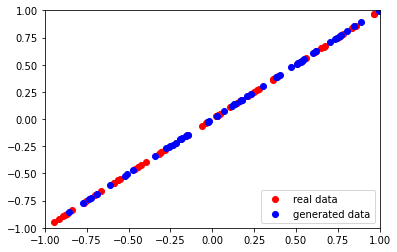

4/4 [==============================] - 0s 2ms/step
Epoch:  2340  Generator Loss:  [0.8189916610717773, 0.046875]  Discriminator Loss:  [0.67732367 0.48828125]
2/2 [==============================] - 0s 3ms/step


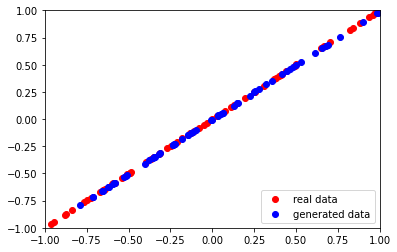

4/4 [==============================] - 0s 2ms/step
Epoch:  2350  Generator Loss:  [0.8027089834213257, 0.0625]  Discriminator Loss:  [0.68347695 0.46484375]
2/2 [==============================] - 0s 3ms/step


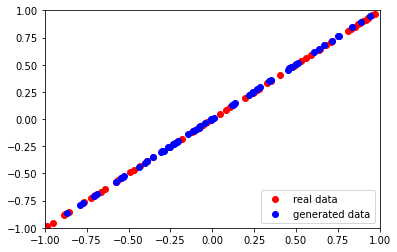

4/4 [==============================] - 0s 2ms/step
Epoch:  2360  Generator Loss:  [0.8091427087783813, 0.0078125]  Discriminator Loss:  [0.68158227 0.49609375]
2/2 [==============================] - 0s 3ms/step


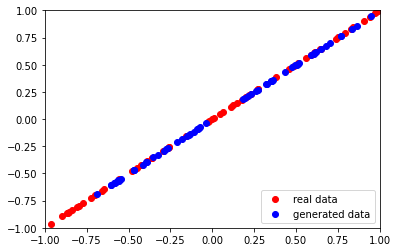

4/4 [==============================] - 0s 2ms/step
Epoch:  2370  Generator Loss:  [0.808467447757721, 0.0]  Discriminator Loss:  [0.678884   0.48828125]
2/2 [==============================] - 0s 4ms/step


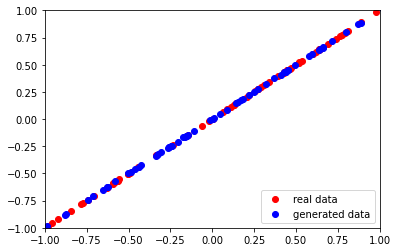

4/4 [==============================] - 0s 2ms/step
Epoch:  2380  Generator Loss:  [0.8161048889160156, 0.015625]  Discriminator Loss:  [0.67495412 0.48046875]
2/2 [==============================] - 0s 3ms/step


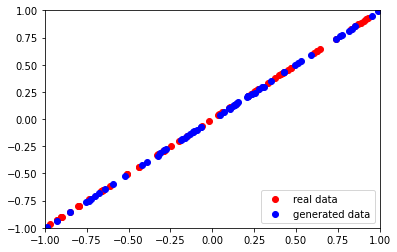

4/4 [==============================] - 0s 2ms/step
Epoch:  2390  Generator Loss:  [0.8110591173171997, 0.0078125]  Discriminator Loss:  [0.68331119 0.48046875]
2/2 [==============================] - 0s 3ms/step


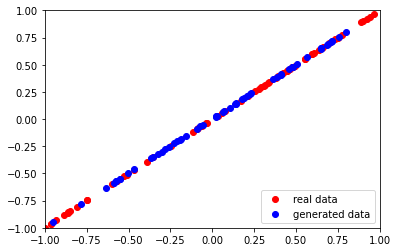

4/4 [==============================] - 0s 2ms/step
Epoch:  2400  Generator Loss:  [0.8085989952087402, 0.0859375]  Discriminator Loss:  [0.67706448 0.42578125]
2/2 [==============================] - 0s 3ms/step


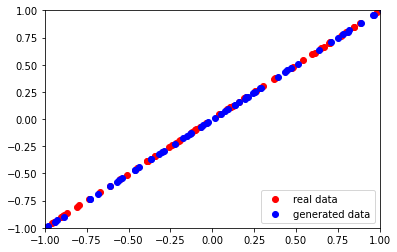

4/4 [==============================] - 0s 2ms/step
Epoch:  2410  Generator Loss:  [0.829930305480957, 0.03125]  Discriminator Loss:  [0.68000317 0.4765625 ]
2/2 [==============================] - 0s 5ms/step


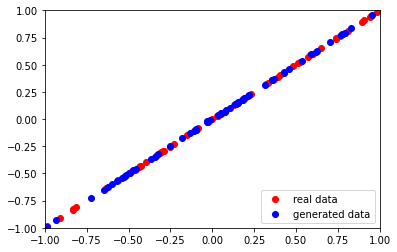

4/4 [==============================] - 0s 2ms/step
Epoch:  2420  Generator Loss:  [0.8126741051673889, 0.03125]  Discriminator Loss:  [0.67548206 0.5       ]
2/2 [==============================] - 0s 4ms/step


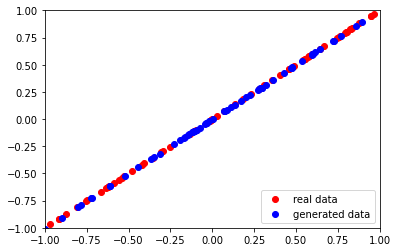

4/4 [==============================] - 0s 2ms/step
Epoch:  2430  Generator Loss:  [0.8079187870025635, 0.0]  Discriminator Loss:  [0.67864969 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


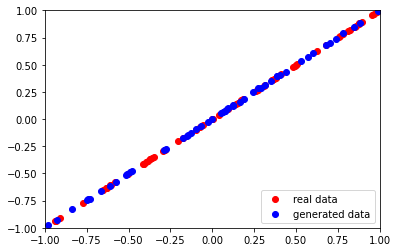

4/4 [==============================] - 0s 2ms/step
Epoch:  2440  Generator Loss:  [0.8222373127937317, 0.015625]  Discriminator Loss:  [0.68131974 0.49609375]
2/2 [==============================] - 0s 3ms/step


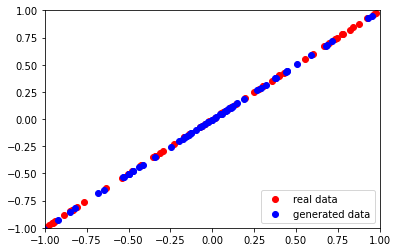

4/4 [==============================] - 0s 2ms/step
Epoch:  2450  Generator Loss:  [0.8055335283279419, 0.046875]  Discriminator Loss:  [0.67690346 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


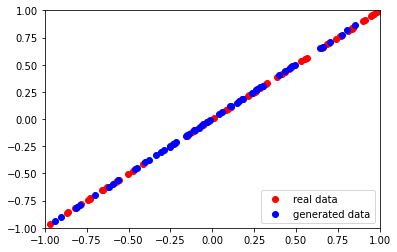

4/4 [==============================] - 0s 2ms/step
Epoch:  2460  Generator Loss:  [0.8072632551193237, 0.09375]  Discriminator Loss:  [0.67882937 0.48046875]
2/2 [==============================] - 0s 4ms/step


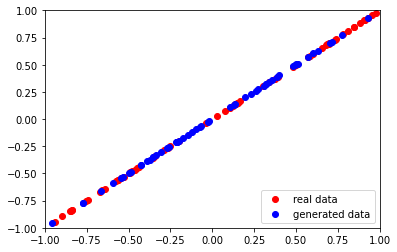

4/4 [==============================] - 0s 3ms/step
Epoch:  2470  Generator Loss:  [0.8129388093948364, 0.0546875]  Discriminator Loss:  [0.67593753 0.44921875]
2/2 [==============================] - 0s 3ms/step


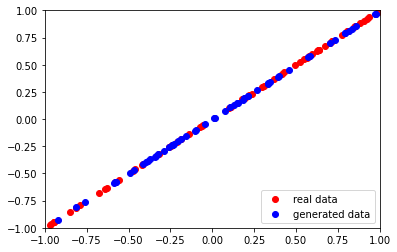

4/4 [==============================] - 0s 2ms/step
Epoch:  2480  Generator Loss:  [0.8183477520942688, 0.0234375]  Discriminator Loss:  [0.67372519 0.484375  ]
2/2 [==============================] - 0s 3ms/step


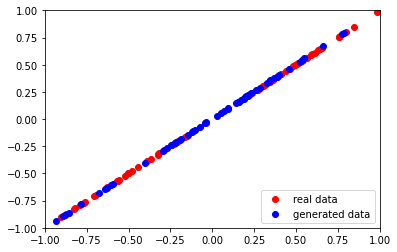

4/4 [==============================] - 0s 2ms/step
Epoch:  2490  Generator Loss:  [0.819257378578186, 0.0546875]  Discriminator Loss:  [0.68050945 0.46875   ]
2/2 [==============================] - 0s 3ms/step


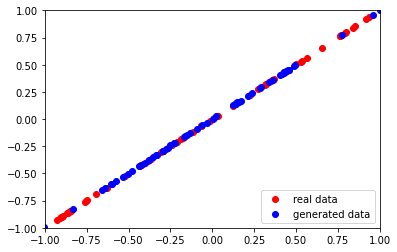

4/4 [==============================] - 0s 3ms/step
Epoch:  2500  Generator Loss:  [0.845188558101654, 0.03125]  Discriminator Loss:  [0.67712274 0.48046875]
2/2 [==============================] - 0s 5ms/step


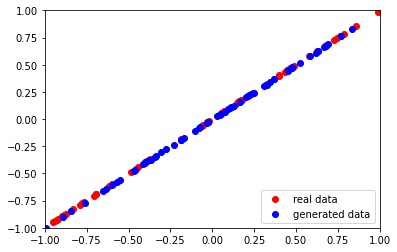

4/4 [==============================] - 0s 2ms/step
Epoch:  2510  Generator Loss:  [0.8231943249702454, 0.0546875]  Discriminator Loss:  [0.67987159 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


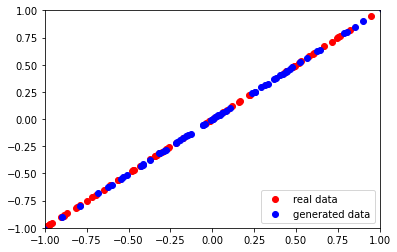

4/4 [==============================] - 0s 2ms/step
Epoch:  2520  Generator Loss:  [0.8122575283050537, 0.046875]  Discriminator Loss:  [0.67477453 0.48046875]
2/2 [==============================] - 0s 4ms/step


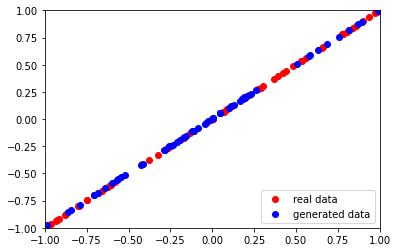

4/4 [==============================] - 0s 2ms/step
Epoch:  2530  Generator Loss:  [0.8138790130615234, 0.0]  Discriminator Loss:  [0.67651853 0.49609375]
2/2 [==============================] - 0s 3ms/step


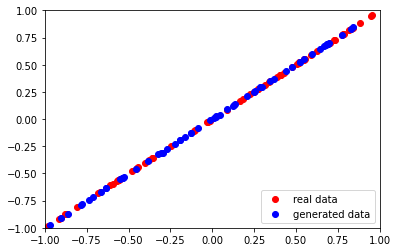

4/4 [==============================] - 0s 2ms/step
Epoch:  2540  Generator Loss:  [0.841077446937561, 0.015625]  Discriminator Loss:  [0.67249694 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


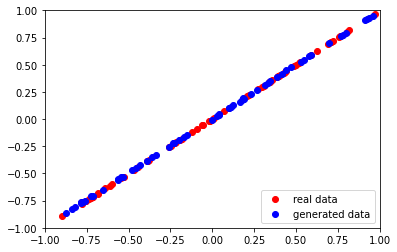

4/4 [==============================] - 0s 3ms/step
Epoch:  2550  Generator Loss:  [0.8171260952949524, 0.109375]  Discriminator Loss:  [0.67334312 0.45703125]
2/2 [==============================] - 0s 3ms/step


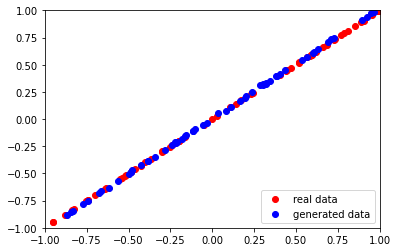

4/4 [==============================] - 0s 2ms/step
Epoch:  2560  Generator Loss:  [0.8184385299682617, 0.0625]  Discriminator Loss:  [0.67469713 0.45703125]
2/2 [==============================] - 0s 3ms/step


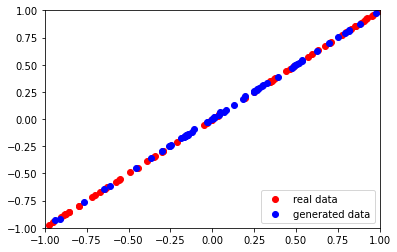

4/4 [==============================] - 0s 2ms/step
Epoch:  2570  Generator Loss:  [0.8323196172714233, 0.015625]  Discriminator Loss:  [0.6771313 0.4609375]
2/2 [==============================] - 0s 3ms/step


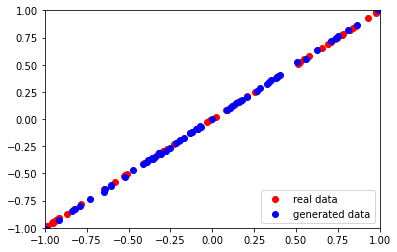

4/4 [==============================] - 0s 2ms/step
Epoch:  2580  Generator Loss:  [0.8299927711486816, 0.015625]  Discriminator Loss:  [0.6717186  0.49609375]
2/2 [==============================] - 0s 3ms/step


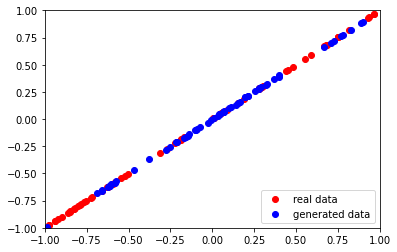

4/4 [==============================] - 0s 2ms/step
Epoch:  2590  Generator Loss:  [0.8054396510124207, 0.1015625]  Discriminator Loss:  [0.68319029 0.46875   ]
2/2 [==============================] - 0s 3ms/step


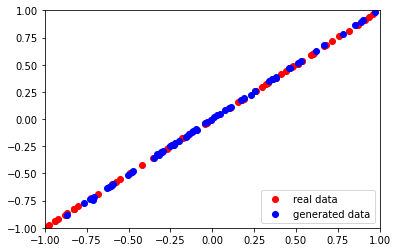

4/4 [==============================] - 0s 2ms/step
Epoch:  2600  Generator Loss:  [0.811116635799408, 0.03125]  Discriminator Loss:  [0.67770302 0.484375  ]
2/2 [==============================] - 0s 3ms/step


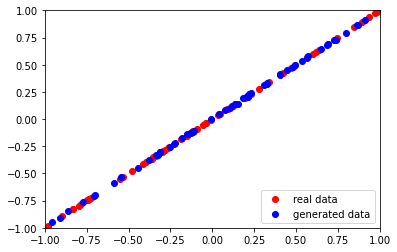

4/4 [==============================] - 0s 2ms/step
Epoch:  2610  Generator Loss:  [0.7978037595748901, 0.09375]  Discriminator Loss:  [0.68213195 0.4375    ]
2/2 [==============================] - 0s 3ms/step


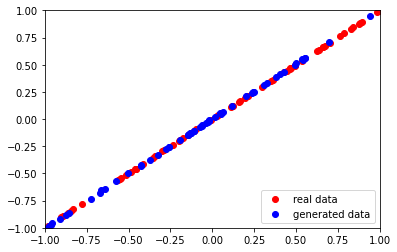

4/4 [==============================] - 0s 4ms/step
Epoch:  2620  Generator Loss:  [0.818640410900116, 0.078125]  Discriminator Loss:  [0.67484912 0.4296875 ]
2/2 [==============================] - 0s 5ms/step


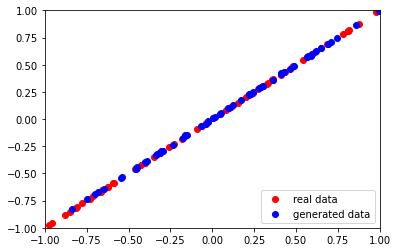

4/4 [==============================] - 0s 2ms/step
Epoch:  2630  Generator Loss:  [0.8169418573379517, 0.03125]  Discriminator Loss:  [0.68076617 0.48046875]
2/2 [==============================] - 0s 3ms/step


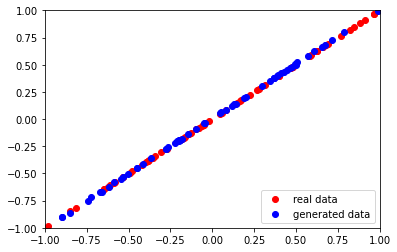

4/4 [==============================] - 0s 2ms/step
Epoch:  2640  Generator Loss:  [0.826448917388916, 0.0390625]  Discriminator Loss:  [0.6776908 0.4765625]
2/2 [==============================] - 0s 3ms/step


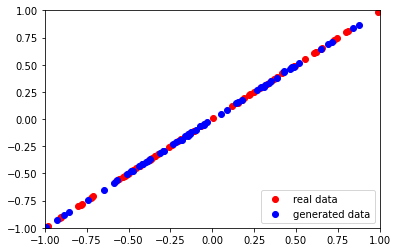

4/4 [==============================] - 0s 2ms/step
Epoch:  2650  Generator Loss:  [0.8423638939857483, 0.0078125]  Discriminator Loss:  [0.67679733 0.484375  ]
2/2 [==============================] - 0s 3ms/step


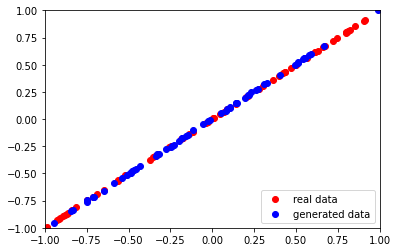

4/4 [==============================] - 0s 2ms/step
Epoch:  2660  Generator Loss:  [0.8077652454376221, 0.109375]  Discriminator Loss:  [0.68102032 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


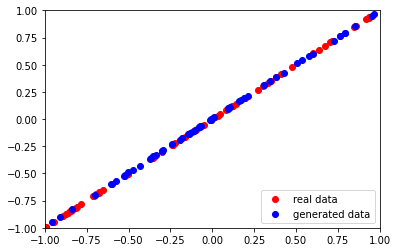

4/4 [==============================] - 0s 2ms/step
Epoch:  2670  Generator Loss:  [0.8246003985404968, 0.046875]  Discriminator Loss:  [0.67989555 0.47265625]
2/2 [==============================] - 0s 3ms/step


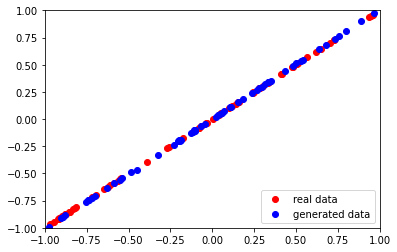

4/4 [==============================] - 0s 2ms/step
Epoch:  2680  Generator Loss:  [0.8429734706878662, 0.0234375]  Discriminator Loss:  [0.67733708 0.484375  ]
2/2 [==============================] - 0s 4ms/step


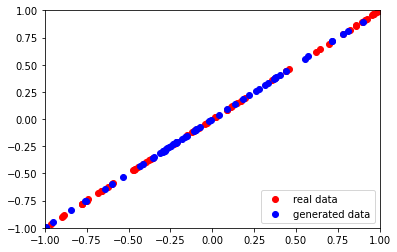

4/4 [==============================] - 0s 3ms/step
Epoch:  2690  Generator Loss:  [0.818672776222229, 0.09375]  Discriminator Loss:  [0.66588256 0.46875   ]
2/2 [==============================] - 0s 3ms/step


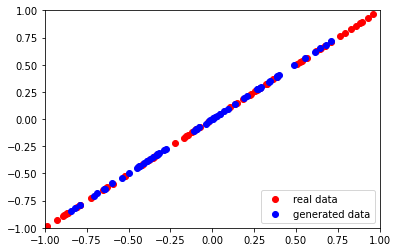

4/4 [==============================] - 0s 2ms/step
Epoch:  2700  Generator Loss:  [0.8071877956390381, 0.078125]  Discriminator Loss:  [0.68000984 0.44140625]
2/2 [==============================] - 0s 3ms/step


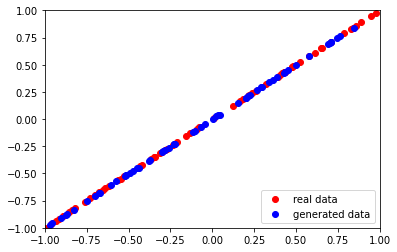

4/4 [==============================] - 0s 2ms/step
Epoch:  2710  Generator Loss:  [0.8288329243659973, 0.046875]  Discriminator Loss:  [0.66960606 0.48046875]
2/2 [==============================] - 0s 3ms/step


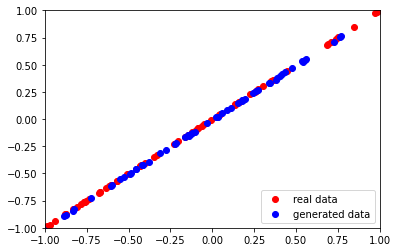

4/4 [==============================] - 0s 2ms/step
Epoch:  2720  Generator Loss:  [0.8194612860679626, 0.046875]  Discriminator Loss:  [0.67957011 0.46484375]
2/2 [==============================] - 0s 3ms/step


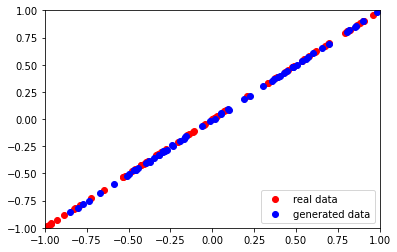

4/4 [==============================] - 0s 2ms/step
Epoch:  2730  Generator Loss:  [0.82704758644104, 0.046875]  Discriminator Loss:  [0.67865708 0.48046875]
2/2 [==============================] - 0s 4ms/step


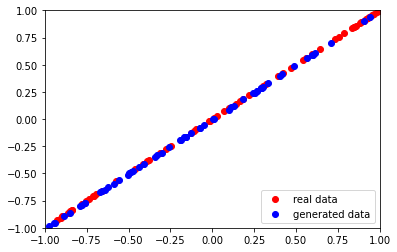

4/4 [==============================] - 0s 2ms/step
Epoch:  2740  Generator Loss:  [0.8297280073165894, 0.0390625]  Discriminator Loss:  [0.6674737  0.47265625]
2/2 [==============================] - 0s 4ms/step


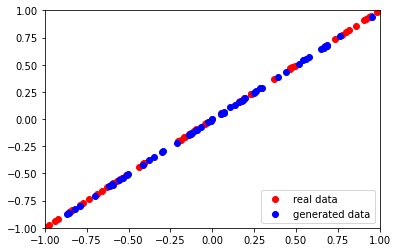

4/4 [==============================] - 0s 2ms/step
Epoch:  2750  Generator Loss:  [0.8352831602096558, 0.0390625]  Discriminator Loss:  [0.67878488 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


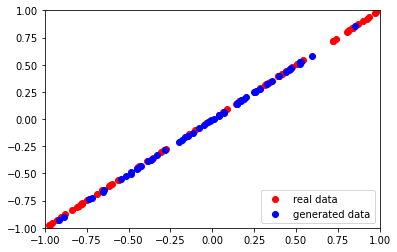

4/4 [==============================] - 0s 2ms/step
Epoch:  2760  Generator Loss:  [0.8005075454711914, 0.09375]  Discriminator Loss:  [0.68413222 0.4296875 ]
2/2 [==============================] - 0s 3ms/step


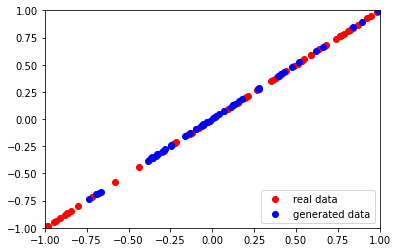

4/4 [==============================] - 0s 2ms/step
Epoch:  2770  Generator Loss:  [0.8176833391189575, 0.0625]  Discriminator Loss:  [0.6778169 0.453125 ]
2/2 [==============================] - 0s 3ms/step


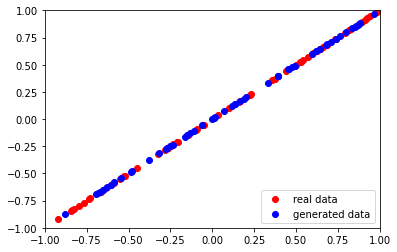

4/4 [==============================] - 0s 2ms/step
Epoch:  2780  Generator Loss:  [0.8159077763557434, 0.109375]  Discriminator Loss:  [0.67513606 0.45703125]
2/2 [==============================] - 0s 4ms/step


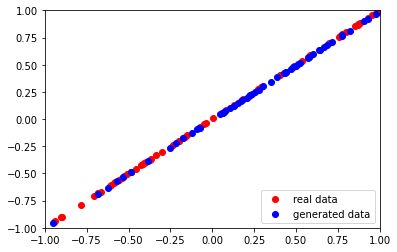

4/4 [==============================] - 0s 2ms/step
Epoch:  2790  Generator Loss:  [0.8215304613113403, 0.046875]  Discriminator Loss:  [0.6783756  0.47265625]
2/2 [==============================] - 0s 3ms/step


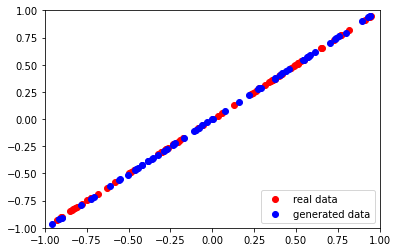

4/4 [==============================] - 0s 2ms/step
Epoch:  2800  Generator Loss:  [0.8089925050735474, 0.0859375]  Discriminator Loss:  [0.67822766 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


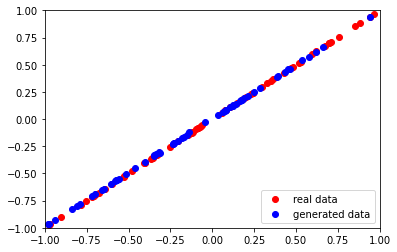

4/4 [==============================] - 0s 2ms/step
Epoch:  2810  Generator Loss:  [0.7988815903663635, 0.15625]  Discriminator Loss:  [0.67968845 0.421875  ]
2/2 [==============================] - 0s 3ms/step


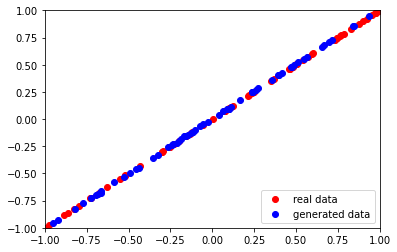

4/4 [==============================] - 0s 3ms/step
Epoch:  2820  Generator Loss:  [0.8131905794143677, 0.140625]  Discriminator Loss:  [0.67651126 0.453125  ]
2/2 [==============================] - 0s 3ms/step


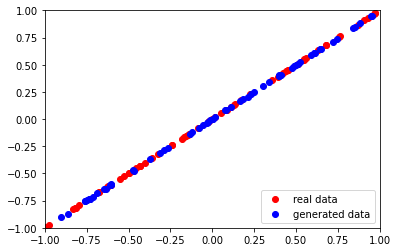

4/4 [==============================] - 0s 2ms/step
Epoch:  2830  Generator Loss:  [0.8332217931747437, 0.0859375]  Discriminator Loss:  [0.68092856 0.43359375]
2/2 [==============================] - 0s 3ms/step


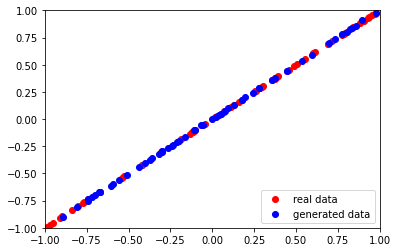

4/4 [==============================] - 0s 3ms/step
Epoch:  2840  Generator Loss:  [0.8260963559150696, 0.0703125]  Discriminator Loss:  [0.68089369 0.4453125 ]
2/2 [==============================] - 0s 5ms/step


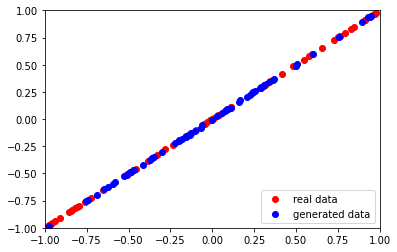

4/4 [==============================] - 0s 2ms/step
Epoch:  2850  Generator Loss:  [0.8330568671226501, 0.046875]  Discriminator Loss:  [0.68173769 0.46875   ]
2/2 [==============================] - 0s 3ms/step


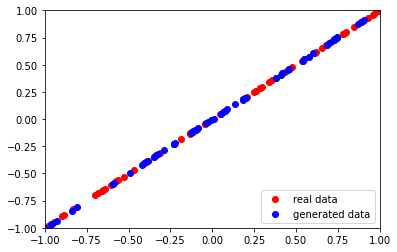

4/4 [==============================] - 0s 2ms/step
Epoch:  2860  Generator Loss:  [0.8133072853088379, 0.1328125]  Discriminator Loss:  [0.6881583 0.4296875]
2/2 [==============================] - 0s 3ms/step


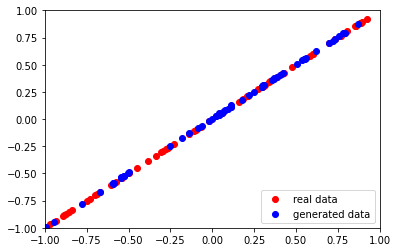

4/4 [==============================] - 0s 2ms/step
Epoch:  2870  Generator Loss:  [0.8352388143539429, 0.0703125]  Discriminator Loss:  [0.68091208 0.453125  ]
2/2 [==============================] - 0s 4ms/step


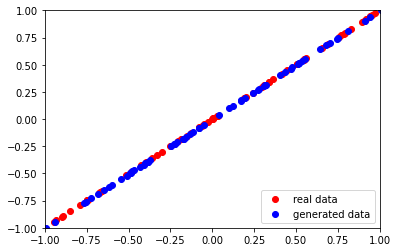

4/4 [==============================] - 0s 2ms/step
Epoch:  2880  Generator Loss:  [0.826188862323761, 0.0390625]  Discriminator Loss:  [0.67966413 0.46484375]
2/2 [==============================] - 0s 3ms/step


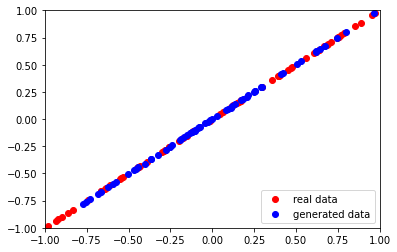

4/4 [==============================] - 0s 3ms/step
Epoch:  2890  Generator Loss:  [0.8190193176269531, 0.046875]  Discriminator Loss:  [0.67343491 0.46875   ]
2/2 [==============================] - 0s 3ms/step


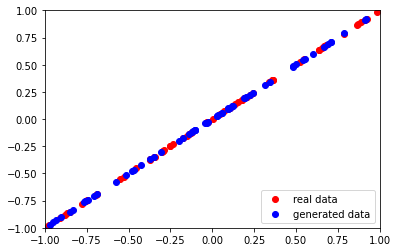

4/4 [==============================] - 0s 2ms/step
Epoch:  2900  Generator Loss:  [0.8235448598861694, 0.1171875]  Discriminator Loss:  [0.68800494 0.4375    ]
2/2 [==============================] - 0s 4ms/step


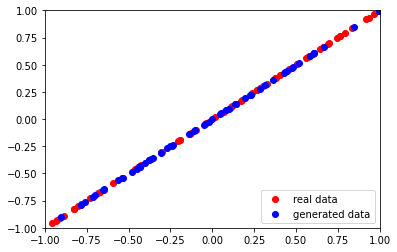

4/4 [==============================] - 0s 2ms/step
Epoch:  2910  Generator Loss:  [0.809867262840271, 0.15625]  Discriminator Loss:  [0.67868891 0.43359375]
2/2 [==============================] - 0s 3ms/step


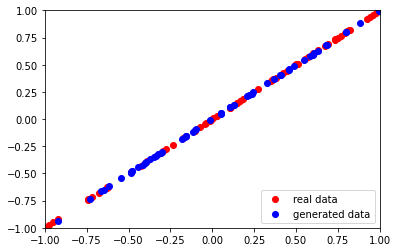

4/4 [==============================] - 0s 2ms/step
Epoch:  2920  Generator Loss:  [0.8232275247573853, 0.1015625]  Discriminator Loss:  [0.67436129 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


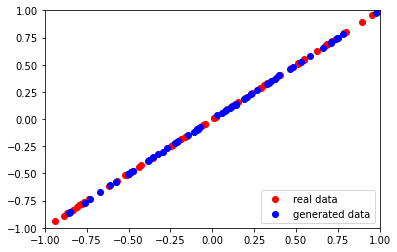

4/4 [==============================] - 0s 2ms/step
Epoch:  2930  Generator Loss:  [0.8144518136978149, 0.140625]  Discriminator Loss:  [0.68865988 0.39453125]
2/2 [==============================] - 0s 3ms/step


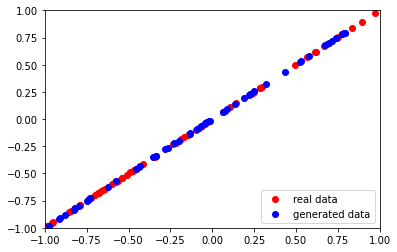

4/4 [==============================] - 0s 2ms/step
Epoch:  2940  Generator Loss:  [0.8366124629974365, 0.0859375]  Discriminator Loss:  [0.67167118 0.44921875]
2/2 [==============================] - 0s 3ms/step


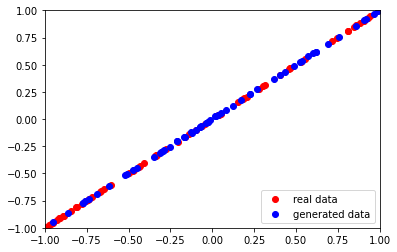

4/4 [==============================] - 0s 2ms/step
Epoch:  2950  Generator Loss:  [0.8407545685768127, 0.0234375]  Discriminator Loss:  [0.67460763 0.46875   ]
2/2 [==============================] - 0s 3ms/step


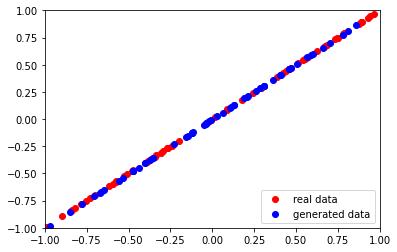

4/4 [==============================] - 0s 2ms/step
Epoch:  2960  Generator Loss:  [0.8561115860939026, 0.03125]  Discriminator Loss:  [0.67242202 0.48046875]
2/2 [==============================] - 0s 4ms/step


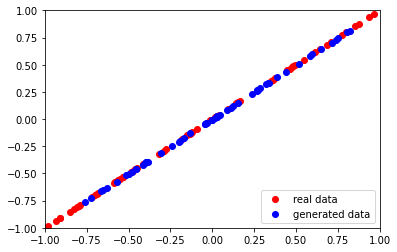

4/4 [==============================] - 0s 2ms/step
Epoch:  2970  Generator Loss:  [0.8247132301330566, 0.078125]  Discriminator Loss:  [0.67005205 0.48046875]
2/2 [==============================] - 0s 3ms/step


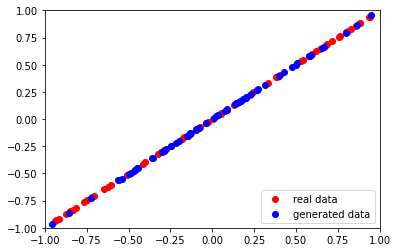

4/4 [==============================] - 0s 2ms/step
Epoch:  2980  Generator Loss:  [0.8037438988685608, 0.1796875]  Discriminator Loss:  [0.68076158 0.421875  ]
2/2 [==============================] - 0s 3ms/step


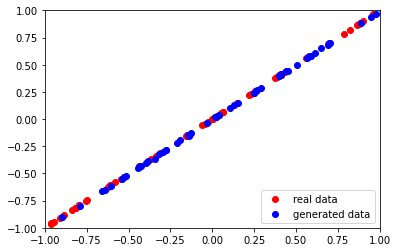

4/4 [==============================] - 0s 2ms/step
Epoch:  2990  Generator Loss:  [0.8107163906097412, 0.15625]  Discriminator Loss:  [0.67051375 0.4140625 ]
2/2 [==============================] - 0s 4ms/step


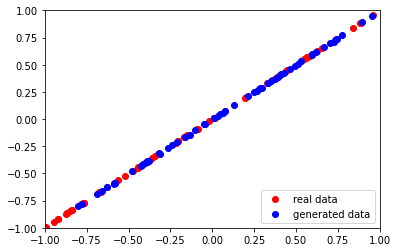

4/4 [==============================] - 0s 2ms/step
Epoch:  3000  Generator Loss:  [0.8149057626724243, 0.1328125]  Discriminator Loss:  [0.67882276 0.43359375]
2/2 [==============================] - 0s 3ms/step


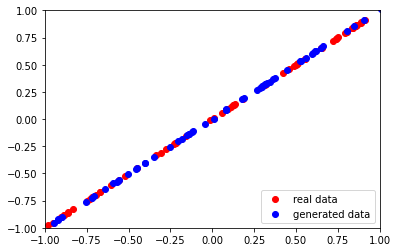

4/4 [==============================] - 0s 2ms/step
Epoch:  3010  Generator Loss:  [0.825373649597168, 0.1328125]  Discriminator Loss:  [0.67153633 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


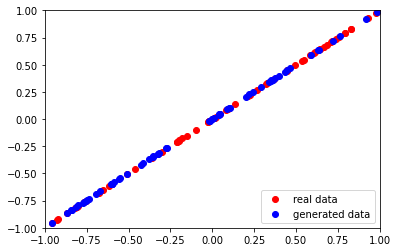

4/4 [==============================] - 0s 2ms/step
Epoch:  3020  Generator Loss:  [0.8594235777854919, 0.0234375]  Discriminator Loss:  [0.678626   0.45703125]
2/2 [==============================] - 0s 3ms/step


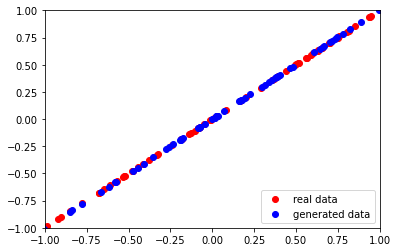

4/4 [==============================] - 0s 3ms/step
Epoch:  3030  Generator Loss:  [0.8421593308448792, 0.0625]  Discriminator Loss:  [0.67368889 0.48046875]
2/2 [==============================] - 0s 4ms/step


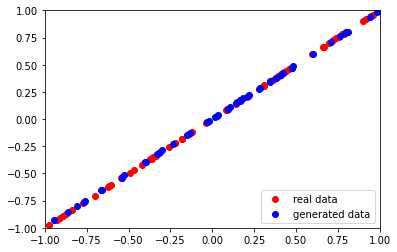

4/4 [==============================] - 0s 2ms/step
Epoch:  3040  Generator Loss:  [0.8291850090026855, 0.0703125]  Discriminator Loss:  [0.67454332 0.46484375]
2/2 [==============================] - 0s 4ms/step


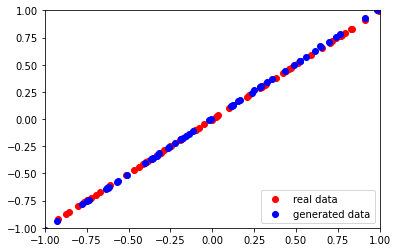

4/4 [==============================] - 0s 2ms/step
Epoch:  3050  Generator Loss:  [0.8148924112319946, 0.1171875]  Discriminator Loss:  [0.6808129  0.44921875]
2/2 [==============================] - 0s 3ms/step


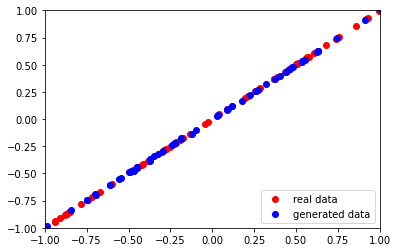

4/4 [==============================] - 0s 2ms/step
Epoch:  3060  Generator Loss:  [0.8194661140441895, 0.125]  Discriminator Loss:  [0.67507339 0.44921875]
2/2 [==============================] - 0s 4ms/step


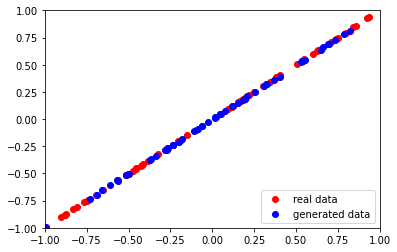

4/4 [==============================] - 0s 4ms/step
Epoch:  3070  Generator Loss:  [0.8398159742355347, 0.0390625]  Discriminator Loss:  [0.67791349 0.46875   ]
2/2 [==============================] - 0s 4ms/step


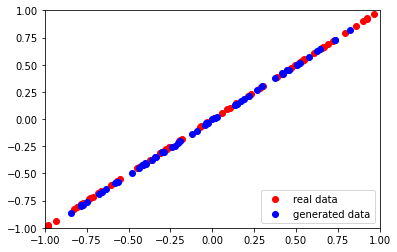

4/4 [==============================] - 0s 2ms/step
Epoch:  3080  Generator Loss:  [0.8272486925125122, 0.0859375]  Discriminator Loss:  [0.6664508 0.4765625]
2/2 [==============================] - 0s 3ms/step


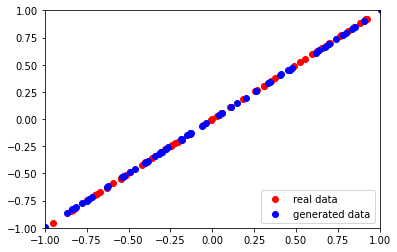

4/4 [==============================] - 0s 2ms/step
Epoch:  3090  Generator Loss:  [0.8217063546180725, 0.046875]  Discriminator Loss:  [0.67674768 0.48828125]
2/2 [==============================] - 0s 3ms/step


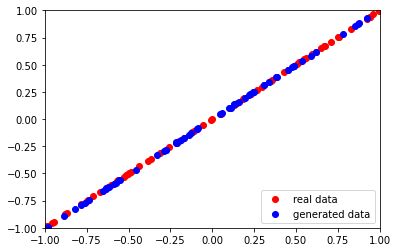

4/4 [==============================] - 0s 2ms/step
Epoch:  3100  Generator Loss:  [0.8331236839294434, 0.109375]  Discriminator Loss:  [0.66948926 0.46875   ]
2/2 [==============================] - 0s 4ms/step


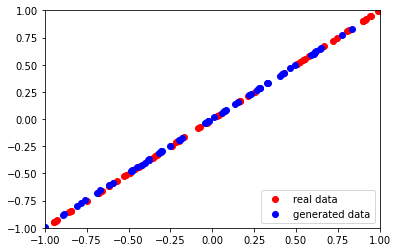

4/4 [==============================] - 0s 2ms/step
Epoch:  3110  Generator Loss:  [0.8282192945480347, 0.1171875]  Discriminator Loss:  [0.66837594 0.45703125]
2/2 [==============================] - 0s 3ms/step


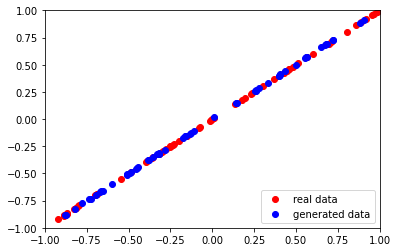

4/4 [==============================] - 0s 2ms/step
Epoch:  3120  Generator Loss:  [0.8370460867881775, 0.0625]  Discriminator Loss:  [0.66920391 0.47265625]
2/2 [==============================] - 0s 4ms/step


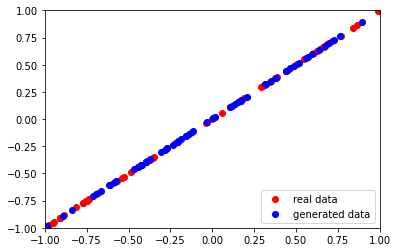

4/4 [==============================] - 0s 2ms/step
Epoch:  3130  Generator Loss:  [0.8496779203414917, 0.0546875]  Discriminator Loss:  [0.67628738 0.47265625]
2/2 [==============================] - 0s 4ms/step


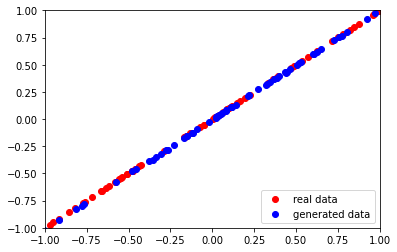

4/4 [==============================] - 0s 2ms/step
Epoch:  3140  Generator Loss:  [0.846976637840271, 0.03125]  Discriminator Loss:  [0.66747722 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


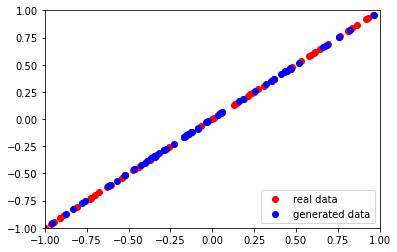

4/4 [==============================] - 0s 2ms/step
Epoch:  3150  Generator Loss:  [0.83348548412323, 0.078125]  Discriminator Loss:  [0.67565557 0.45703125]
2/2 [==============================] - 0s 7ms/step


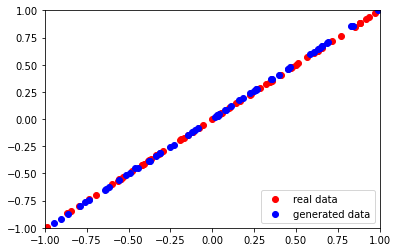

4/4 [==============================] - 0s 3ms/step
Epoch:  3160  Generator Loss:  [0.8159824013710022, 0.1640625]  Discriminator Loss:  [0.68177244 0.42578125]
2/2 [==============================] - 0s 3ms/step


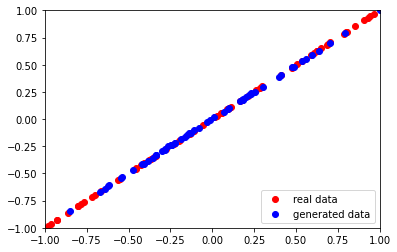

4/4 [==============================] - 0s 2ms/step
Epoch:  3170  Generator Loss:  [0.819322407245636, 0.125]  Discriminator Loss:  [0.66877994 0.44921875]
2/2 [==============================] - 0s 6ms/step


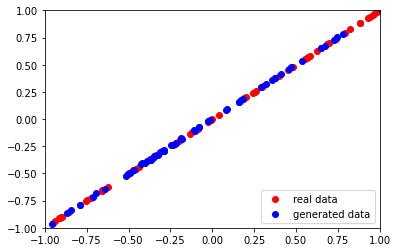

4/4 [==============================] - 0s 2ms/step
Epoch:  3180  Generator Loss:  [0.8271244764328003, 0.0859375]  Discriminator Loss:  [0.67969573 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


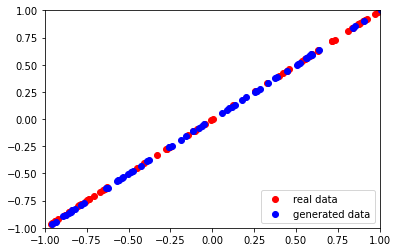

4/4 [==============================] - 0s 2ms/step
Epoch:  3190  Generator Loss:  [0.8251472115516663, 0.1484375]  Discriminator Loss:  [0.67109305 0.4140625 ]
2/2 [==============================] - 0s 4ms/step


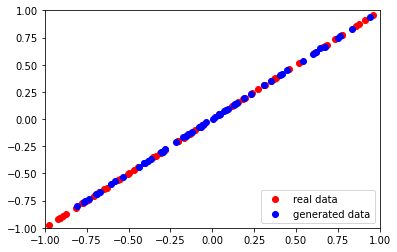

4/4 [==============================] - 0s 2ms/step
Epoch:  3200  Generator Loss:  [0.8151224851608276, 0.1484375]  Discriminator Loss:  [0.68060702 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


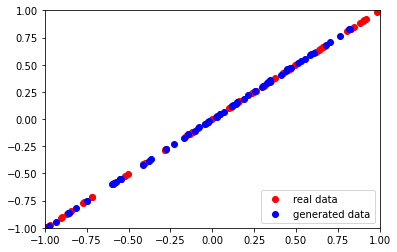

4/4 [==============================] - 0s 2ms/step
Epoch:  3210  Generator Loss:  [0.8334245085716248, 0.0703125]  Discriminator Loss:  [0.67410859 0.4375    ]
2/2 [==============================] - 0s 3ms/step


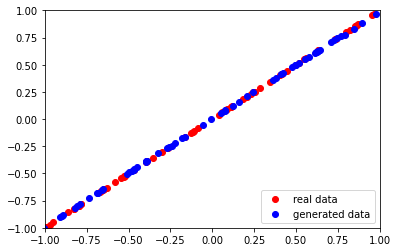

4/4 [==============================] - 0s 2ms/step
Epoch:  3220  Generator Loss:  [0.829466700553894, 0.078125]  Discriminator Loss:  [0.67501265 0.41796875]
2/2 [==============================] - 0s 3ms/step


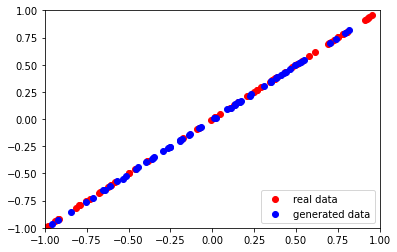

4/4 [==============================] - 0s 2ms/step
Epoch:  3230  Generator Loss:  [0.8464933633804321, 0.0703125]  Discriminator Loss:  [0.67077422 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


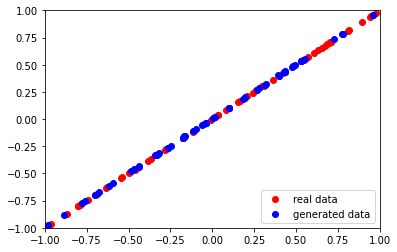

4/4 [==============================] - 0s 2ms/step
Epoch:  3240  Generator Loss:  [0.8260557651519775, 0.0625]  Discriminator Loss:  [0.66964343 0.46484375]
2/2 [==============================] - 0s 4ms/step


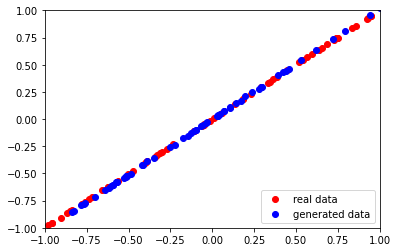

4/4 [==============================] - 0s 2ms/step
Epoch:  3250  Generator Loss:  [0.8198429346084595, 0.1796875]  Discriminator Loss:  [0.67038727 0.41796875]
2/2 [==============================] - 0s 3ms/step


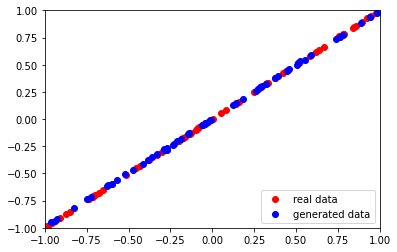

4/4 [==============================] - 0s 2ms/step
Epoch:  3260  Generator Loss:  [0.813493549823761, 0.1640625]  Discriminator Loss:  [0.67603669 0.4140625 ]
2/2 [==============================] - 0s 3ms/step


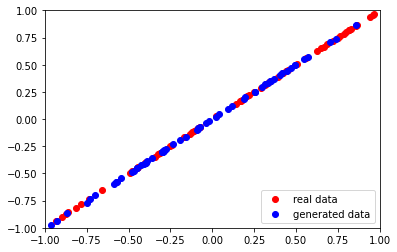

4/4 [==============================] - 0s 2ms/step
Epoch:  3270  Generator Loss:  [0.8299542665481567, 0.1015625]  Discriminator Loss:  [0.66446069 0.4296875 ]
2/2 [==============================] - 0s 3ms/step


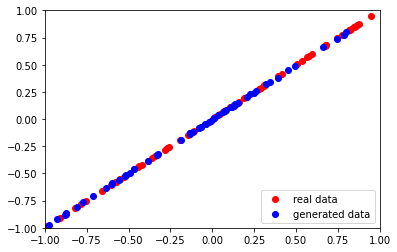

4/4 [==============================] - 0s 3ms/step
Epoch:  3280  Generator Loss:  [0.818366289138794, 0.1484375]  Discriminator Loss:  [0.67603526 0.4375    ]
2/2 [==============================] - 0s 4ms/step


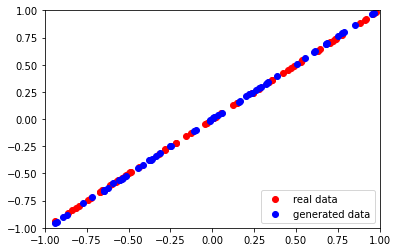

4/4 [==============================] - 0s 2ms/step
Epoch:  3290  Generator Loss:  [0.8265987634658813, 0.0859375]  Discriminator Loss:  [0.67553657 0.4375    ]
2/2 [==============================] - 0s 3ms/step


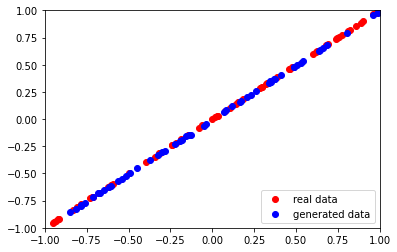

4/4 [==============================] - 0s 3ms/step
Epoch:  3300  Generator Loss:  [0.8215340375900269, 0.1953125]  Discriminator Loss:  [0.67241004 0.41796875]
2/2 [==============================] - 0s 3ms/step


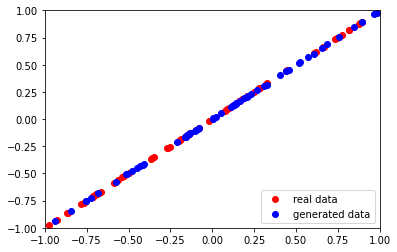

4/4 [==============================] - 0s 2ms/step
Epoch:  3310  Generator Loss:  [0.8249797821044922, 0.140625]  Discriminator Loss:  [0.66852447 0.4140625 ]
2/2 [==============================] - 0s 3ms/step


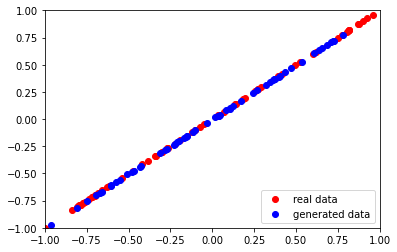

4/4 [==============================] - 0s 2ms/step
Epoch:  3320  Generator Loss:  [0.8088974952697754, 0.15625]  Discriminator Loss:  [0.66248438 0.42578125]
2/2 [==============================] - 0s 3ms/step


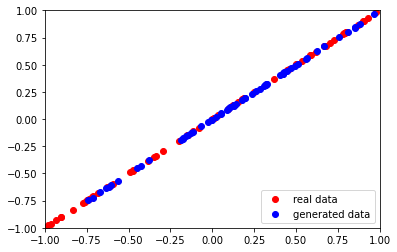

4/4 [==============================] - 0s 2ms/step
Epoch:  3330  Generator Loss:  [0.8195825815200806, 0.1484375]  Discriminator Loss:  [0.66744694 0.41796875]
2/2 [==============================] - 0s 5ms/step


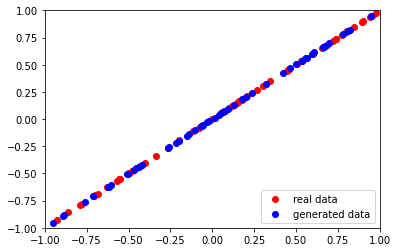

4/4 [==============================] - 0s 2ms/step
Epoch:  3340  Generator Loss:  [0.8127440214157104, 0.15625]  Discriminator Loss:  [0.67132205 0.40234375]
2/2 [==============================] - 0s 3ms/step


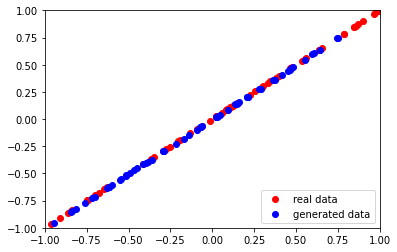

4/4 [==============================] - 0s 2ms/step
Epoch:  3350  Generator Loss:  [0.8468641638755798, 0.140625]  Discriminator Loss:  [0.67940468 0.4375    ]
2/2 [==============================] - 0s 3ms/step


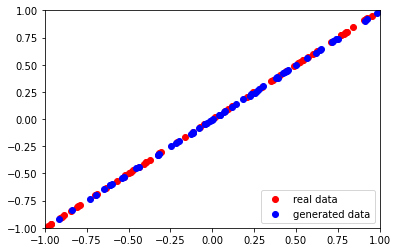

4/4 [==============================] - 0s 2ms/step
Epoch:  3360  Generator Loss:  [0.8296246528625488, 0.1484375]  Discriminator Loss:  [0.67773995 0.41015625]
2/2 [==============================] - 0s 4ms/step


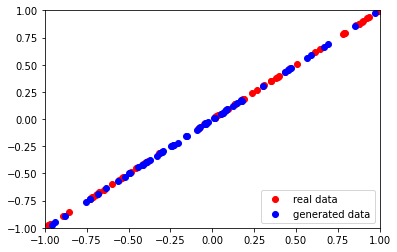

4/4 [==============================] - 0s 2ms/step
Epoch:  3370  Generator Loss:  [0.8587856888771057, 0.0859375]  Discriminator Loss:  [0.67649069 0.46875   ]
2/2 [==============================] - 0s 3ms/step


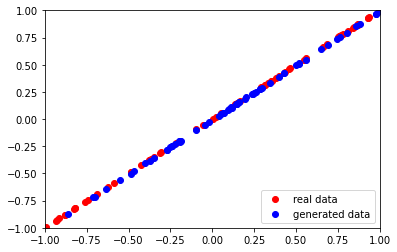

4/4 [==============================] - 0s 3ms/step
Epoch:  3380  Generator Loss:  [0.8264659643173218, 0.1015625]  Discriminator Loss:  [0.67332551 0.43359375]
2/2 [==============================] - 0s 3ms/step


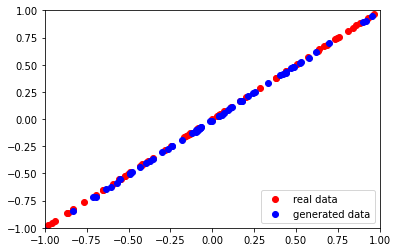

4/4 [==============================] - 0s 2ms/step
Epoch:  3390  Generator Loss:  [0.8314681053161621, 0.1328125]  Discriminator Loss:  [0.67575431 0.42578125]
2/2 [==============================] - 0s 4ms/step


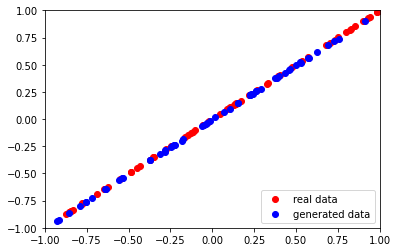

4/4 [==============================] - 0s 2ms/step
Epoch:  3400  Generator Loss:  [0.8233804106712341, 0.1328125]  Discriminator Loss:  [0.67159054 0.40625   ]
2/2 [==============================] - 0s 6ms/step


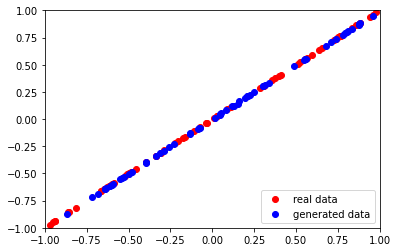

4/4 [==============================] - 0s 2ms/step
Epoch:  3410  Generator Loss:  [0.8454062938690186, 0.125]  Discriminator Loss:  [0.6817033 0.3828125]
2/2 [==============================] - 0s 3ms/step


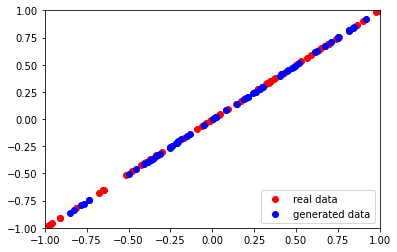

4/4 [==============================] - 0s 2ms/step
Epoch:  3420  Generator Loss:  [0.8526324033737183, 0.078125]  Discriminator Loss:  [0.66957515 0.47265625]
2/2 [==============================] - 0s 3ms/step


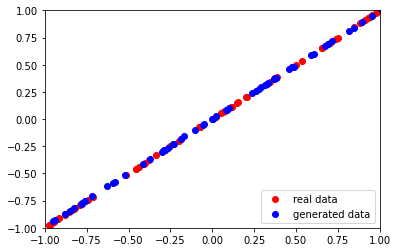

4/4 [==============================] - 0s 2ms/step
Epoch:  3430  Generator Loss:  [0.8393160104751587, 0.09375]  Discriminator Loss:  [0.67601949 0.43359375]
2/2 [==============================] - 0s 3ms/step


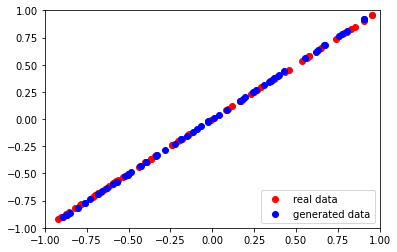

4/4 [==============================] - 0s 2ms/step
Epoch:  3440  Generator Loss:  [0.8112643957138062, 0.203125]  Discriminator Loss:  [0.67741773 0.41796875]
2/2 [==============================] - 0s 3ms/step


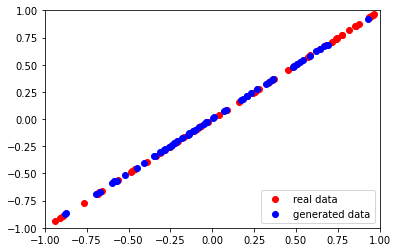

4/4 [==============================] - 0s 3ms/step
Epoch:  3450  Generator Loss:  [0.8260284662246704, 0.140625]  Discriminator Loss:  [0.67661643 0.421875  ]
2/2 [==============================] - 0s 3ms/step


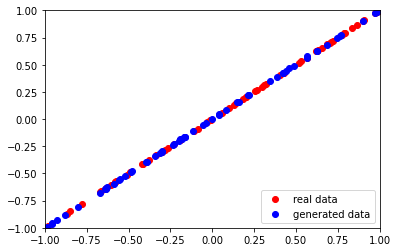

4/4 [==============================] - 0s 2ms/step
Epoch:  3460  Generator Loss:  [0.830417811870575, 0.125]  Discriminator Loss:  [0.67356962 0.4296875 ]
2/2 [==============================] - 0s 3ms/step


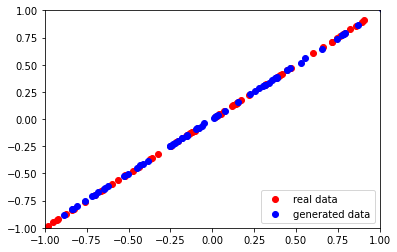

4/4 [==============================] - 0s 3ms/step
Epoch:  3470  Generator Loss:  [0.838902473449707, 0.1171875]  Discriminator Loss:  [0.6748054 0.4453125]
2/2 [==============================] - 0s 4ms/step


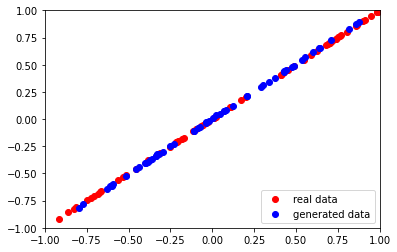

4/4 [==============================] - 0s 2ms/step
Epoch:  3480  Generator Loss:  [0.8405337929725647, 0.1328125]  Discriminator Loss:  [0.67659497 0.4140625 ]
2/2 [==============================] - 0s 5ms/step


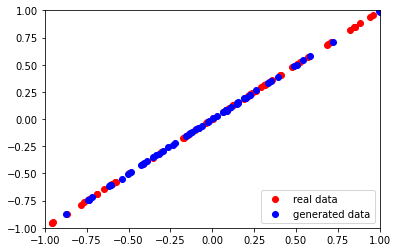

4/4 [==============================] - 0s 2ms/step
Epoch:  3490  Generator Loss:  [0.8336153626441956, 0.1484375]  Discriminator Loss:  [0.676449   0.44921875]
2/2 [==============================] - 0s 4ms/step


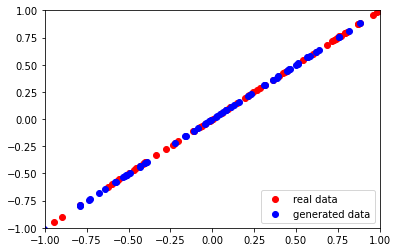

4/4 [==============================] - 0s 2ms/step
Epoch:  3500  Generator Loss:  [0.8452923893928528, 0.0859375]  Discriminator Loss:  [0.68204305 0.4296875 ]
2/2 [==============================] - 0s 4ms/step


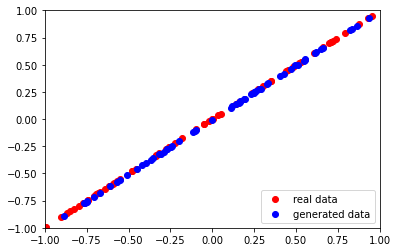

4/4 [==============================] - 0s 2ms/step
Epoch:  3510  Generator Loss:  [0.823009729385376, 0.171875]  Discriminator Loss:  [0.67435762 0.3984375 ]
2/2 [==============================] - 0s 4ms/step


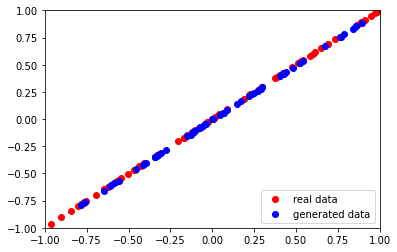

4/4 [==============================] - 0s 2ms/step
Epoch:  3520  Generator Loss:  [0.8156813383102417, 0.1171875]  Discriminator Loss:  [0.67625946 0.453125  ]
2/2 [==============================] - 0s 4ms/step


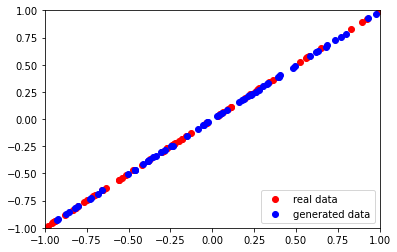

4/4 [==============================] - 0s 2ms/step
Epoch:  3530  Generator Loss:  [0.8470016717910767, 0.140625]  Discriminator Loss:  [0.67726392 0.37109375]
2/2 [==============================] - 0s 3ms/step


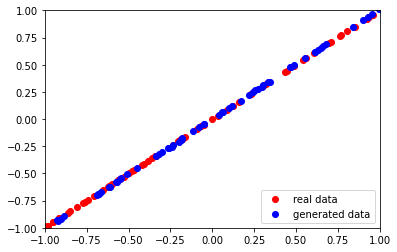

4/4 [==============================] - 0s 2ms/step
Epoch:  3540  Generator Loss:  [0.8188923597335815, 0.1875]  Discriminator Loss:  [0.66507468 0.4375    ]
2/2 [==============================] - 0s 3ms/step


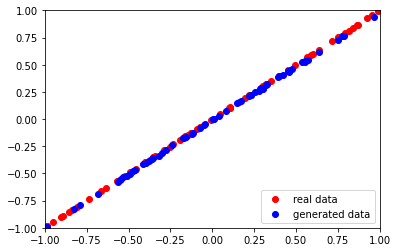

4/4 [==============================] - 0s 2ms/step
Epoch:  3550  Generator Loss:  [0.8294029831886292, 0.140625]  Discriminator Loss:  [0.68458232 0.39453125]
2/2 [==============================] - 0s 4ms/step


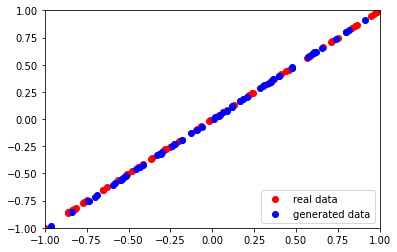

4/4 [==============================] - 0s 2ms/step
Epoch:  3560  Generator Loss:  [0.8293099999427795, 0.109375]  Discriminator Loss:  [0.65908042 0.45703125]
2/2 [==============================] - 0s 3ms/step


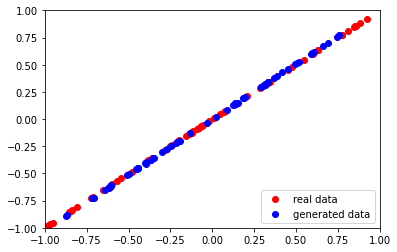

4/4 [==============================] - 0s 2ms/step
Epoch:  3570  Generator Loss:  [0.8036389350891113, 0.1796875]  Discriminator Loss:  [0.6785813 0.4140625]
2/2 [==============================] - 0s 3ms/step


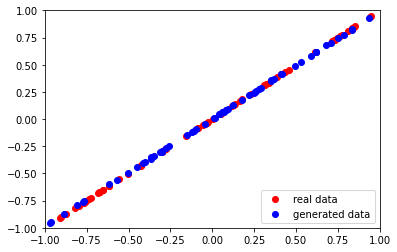

4/4 [==============================] - 0s 2ms/step
Epoch:  3580  Generator Loss:  [0.8343897461891174, 0.0703125]  Discriminator Loss:  [0.67575333 0.43359375]
2/2 [==============================] - 0s 3ms/step


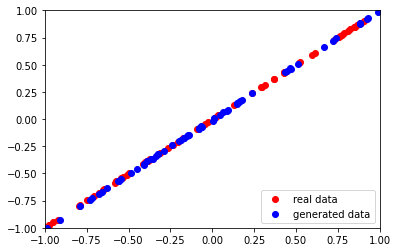

4/4 [==============================] - 0s 2ms/step
Epoch:  3590  Generator Loss:  [0.8316375017166138, 0.0703125]  Discriminator Loss:  [0.66999164 0.4765625 ]
2/2 [==============================] - 0s 5ms/step


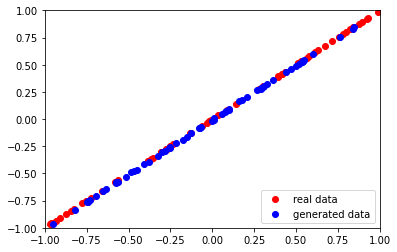

4/4 [==============================] - 0s 2ms/step
Epoch:  3600  Generator Loss:  [0.7974028587341309, 0.1640625]  Discriminator Loss:  [0.66889217 0.42578125]
2/2 [==============================] - 0s 3ms/step


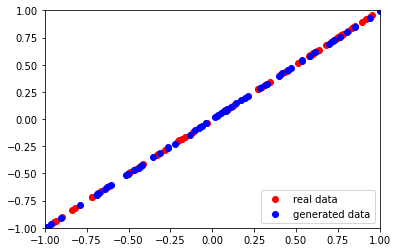

4/4 [==============================] - 0s 2ms/step
Epoch:  3610  Generator Loss:  [0.8493002653121948, 0.109375]  Discriminator Loss:  [0.66995931 0.4140625 ]
2/2 [==============================] - 0s 4ms/step


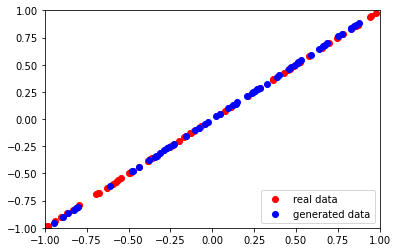

4/4 [==============================] - 0s 2ms/step
Epoch:  3620  Generator Loss:  [0.8216763734817505, 0.1484375]  Discriminator Loss:  [0.67565992 0.40234375]
2/2 [==============================] - 0s 5ms/step


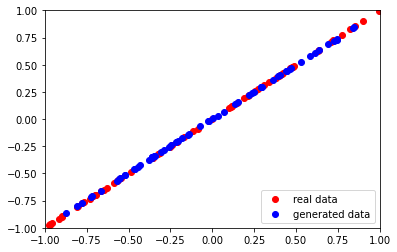

4/4 [==============================] - 0s 2ms/step
Epoch:  3630  Generator Loss:  [0.8214494585990906, 0.203125]  Discriminator Loss:  [0.66859305 0.3984375 ]
2/2 [==============================] - 0s 3ms/step


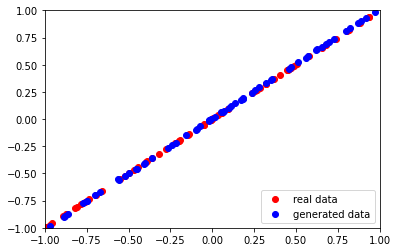

4/4 [==============================] - 0s 2ms/step
Epoch:  3640  Generator Loss:  [0.8181161284446716, 0.1875]  Discriminator Loss:  [0.67609879 0.4296875 ]
2/2 [==============================] - 0s 4ms/step


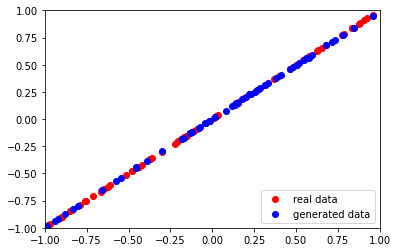

4/4 [==============================] - 0s 2ms/step
Epoch:  3650  Generator Loss:  [0.8217161893844604, 0.234375]  Discriminator Loss:  [0.6711736  0.40234375]
2/2 [==============================] - 0s 4ms/step


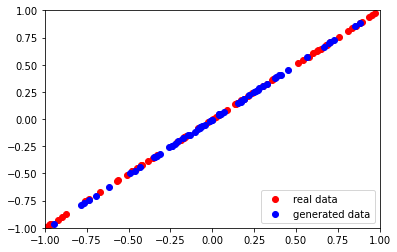

4/4 [==============================] - 0s 2ms/step
Epoch:  3660  Generator Loss:  [0.8206179141998291, 0.2265625]  Discriminator Loss:  [0.67607093 0.38671875]
2/2 [==============================] - 0s 4ms/step


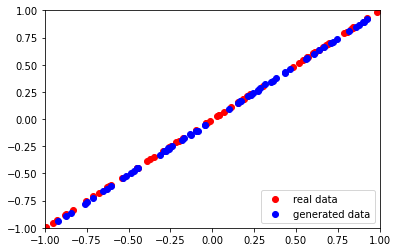

4/4 [==============================] - 0s 2ms/step
Epoch:  3670  Generator Loss:  [0.8088690042495728, 0.21875]  Discriminator Loss:  [0.67224824 0.40234375]
2/2 [==============================] - 0s 3ms/step


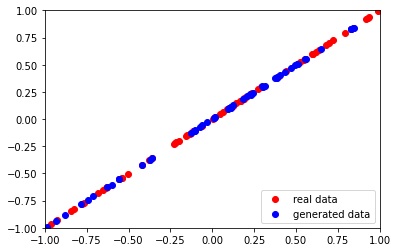

4/4 [==============================] - 0s 2ms/step
Epoch:  3680  Generator Loss:  [0.8366662263870239, 0.1640625]  Discriminator Loss:  [0.67646152 0.4375    ]
2/2 [==============================] - 0s 4ms/step


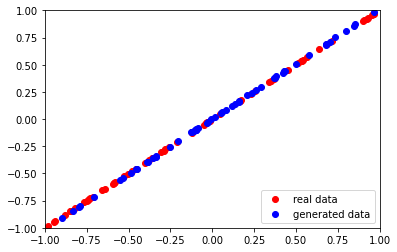

4/4 [==============================] - 0s 2ms/step
Epoch:  3690  Generator Loss:  [0.823563814163208, 0.140625]  Discriminator Loss:  [0.66656125 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


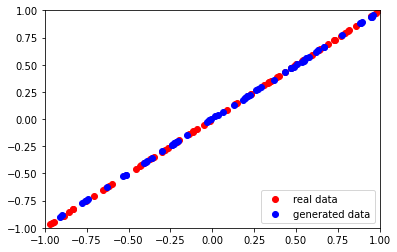

4/4 [==============================] - 0s 2ms/step
Epoch:  3700  Generator Loss:  [0.8278164267539978, 0.15625]  Discriminator Loss:  [0.67117167 0.44140625]
2/2 [==============================] - 0s 4ms/step


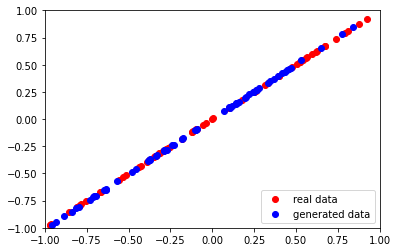

4/4 [==============================] - 0s 2ms/step
Epoch:  3710  Generator Loss:  [0.8312908411026001, 0.1328125]  Discriminator Loss:  [0.6738157 0.4296875]
2/2 [==============================] - 0s 3ms/step


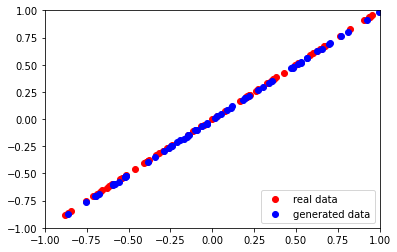

4/4 [==============================] - 0s 3ms/step
Epoch:  3720  Generator Loss:  [0.8158530592918396, 0.2265625]  Discriminator Loss:  [0.67028695 0.41015625]
2/2 [==============================] - 0s 5ms/step


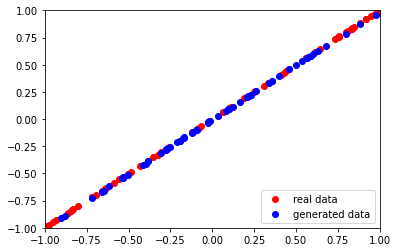

4/4 [==============================] - 0s 2ms/step
Epoch:  3730  Generator Loss:  [0.8317179679870605, 0.1484375]  Discriminator Loss:  [0.67136544 0.42578125]
2/2 [==============================] - 0s 3ms/step


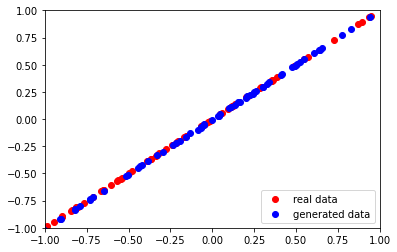

4/4 [==============================] - 0s 2ms/step
Epoch:  3740  Generator Loss:  [0.8295867443084717, 0.1484375]  Discriminator Loss:  [0.66690451 0.42578125]
2/2 [==============================] - 0s 5ms/step


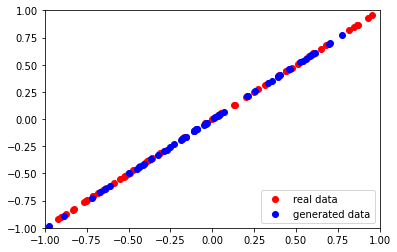

4/4 [==============================] - 0s 2ms/step
Epoch:  3750  Generator Loss:  [0.8428382873535156, 0.109375]  Discriminator Loss:  [0.68444854 0.40234375]
2/2 [==============================] - 0s 4ms/step


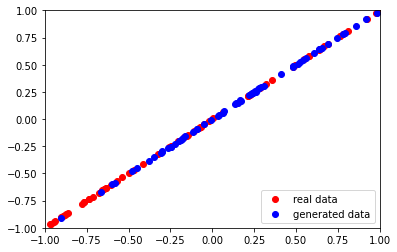

4/4 [==============================] - 0s 2ms/step
Epoch:  3760  Generator Loss:  [0.8262469172477722, 0.140625]  Discriminator Loss:  [0.66775864 0.453125  ]
2/2 [==============================] - 0s 3ms/step


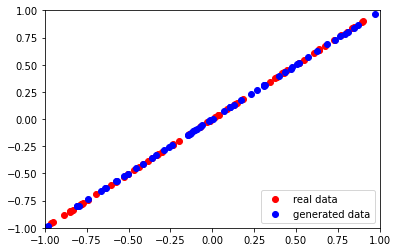

4/4 [==============================] - 0s 2ms/step
Epoch:  3770  Generator Loss:  [0.8351960182189941, 0.1328125]  Discriminator Loss:  [0.66444299 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


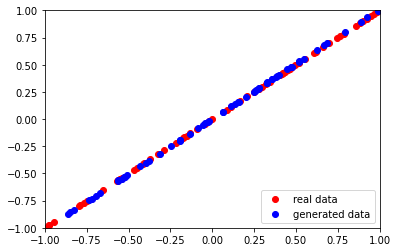

4/4 [==============================] - 0s 2ms/step
Epoch:  3780  Generator Loss:  [0.8126981258392334, 0.2109375]  Discriminator Loss:  [0.67457634 0.41015625]
2/2 [==============================] - 0s 5ms/step


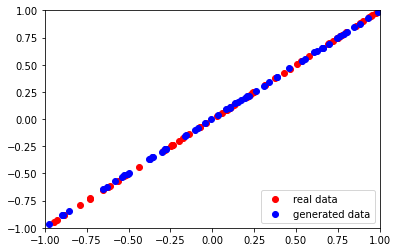

4/4 [==============================] - 0s 3ms/step
Epoch:  3790  Generator Loss:  [0.8158808946609497, 0.1953125]  Discriminator Loss:  [0.67938837 0.40234375]
2/2 [==============================] - 0s 3ms/step


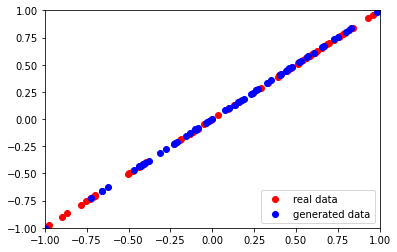

4/4 [==============================] - 0s 3ms/step
Epoch:  3800  Generator Loss:  [0.8460574150085449, 0.109375]  Discriminator Loss:  [0.68459958 0.4140625 ]
2/2 [==============================] - 0s 3ms/step


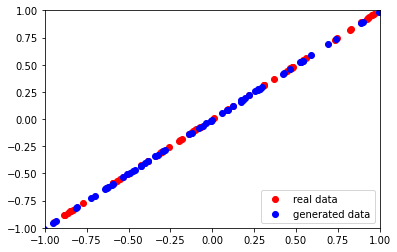

4/4 [==============================] - 0s 2ms/step
Epoch:  3810  Generator Loss:  [0.8232539892196655, 0.1796875]  Discriminator Loss:  [0.67700383 0.42578125]
2/2 [==============================] - 0s 3ms/step


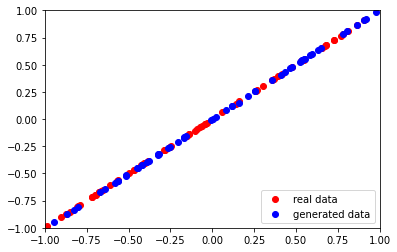

4/4 [==============================] - 0s 2ms/step
Epoch:  3820  Generator Loss:  [0.8393743634223938, 0.140625]  Discriminator Loss:  [0.68354708 0.39453125]
2/2 [==============================] - 0s 3ms/step


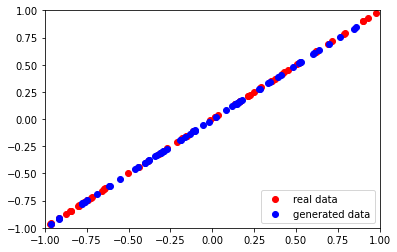

4/4 [==============================] - 0s 2ms/step
Epoch:  3830  Generator Loss:  [0.8143975734710693, 0.1796875]  Discriminator Loss:  [0.67322811 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


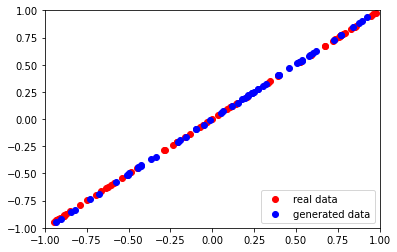

4/4 [==============================] - 0s 2ms/step
Epoch:  3840  Generator Loss:  [0.829885721206665, 0.1875]  Discriminator Loss:  [0.68531418 0.39453125]
2/2 [==============================] - 0s 4ms/step


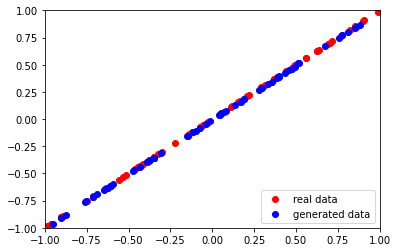

4/4 [==============================] - 0s 2ms/step
Epoch:  3850  Generator Loss:  [0.8250167369842529, 0.171875]  Discriminator Loss:  [0.67511442 0.41796875]
2/2 [==============================] - 0s 3ms/step


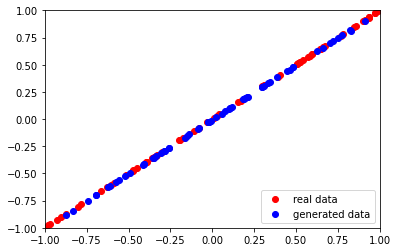

4/4 [==============================] - 0s 2ms/step
Epoch:  3860  Generator Loss:  [0.8168761134147644, 0.15625]  Discriminator Loss:  [0.6683349  0.44140625]
2/2 [==============================] - 0s 3ms/step


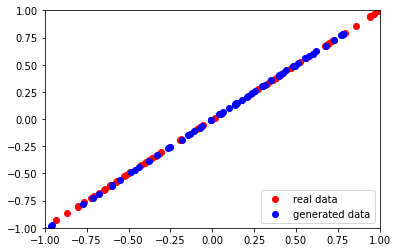

4/4 [==============================] - 0s 2ms/step
Epoch:  3870  Generator Loss:  [0.8686825037002563, 0.109375]  Discriminator Loss:  [0.66582143 0.44921875]
2/2 [==============================] - 0s 3ms/step


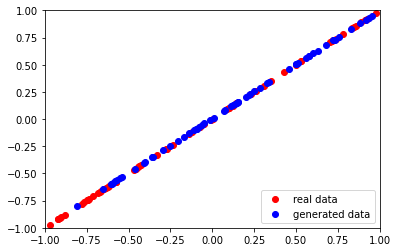

4/4 [==============================] - 0s 2ms/step
Epoch:  3880  Generator Loss:  [0.8285982608795166, 0.1484375]  Discriminator Loss:  [0.68281901 0.390625  ]
2/2 [==============================] - 0s 4ms/step


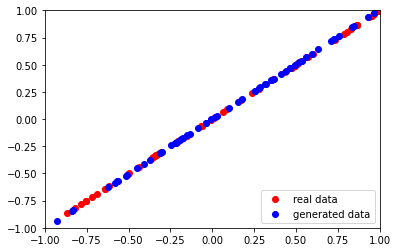

4/4 [==============================] - 0s 2ms/step
Epoch:  3890  Generator Loss:  [0.8059014678001404, 0.234375]  Discriminator Loss:  [0.67698193 0.38671875]
2/2 [==============================] - 0s 3ms/step


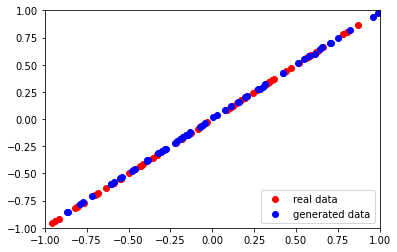

4/4 [==============================] - 0s 2ms/step
Epoch:  3900  Generator Loss:  [0.8240587711334229, 0.1796875]  Discriminator Loss:  [0.67244202 0.42578125]
2/2 [==============================] - 0s 4ms/step


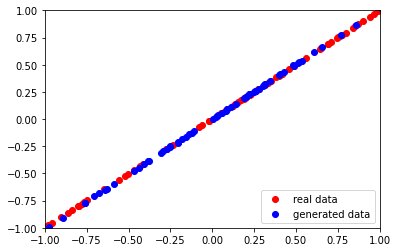

4/4 [==============================] - 0s 2ms/step
Epoch:  3910  Generator Loss:  [0.838222324848175, 0.1328125]  Discriminator Loss:  [0.67951158 0.43359375]
2/2 [==============================] - 0s 4ms/step


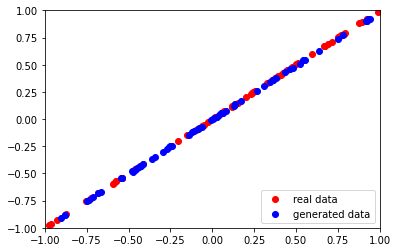

4/4 [==============================] - 0s 2ms/step
Epoch:  3920  Generator Loss:  [0.8504631519317627, 0.1171875]  Discriminator Loss:  [0.68335024 0.40625   ]
2/2 [==============================] - 0s 4ms/step


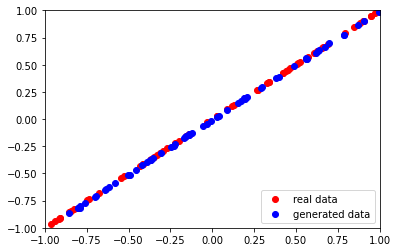

4/4 [==============================] - 0s 2ms/step
Epoch:  3930  Generator Loss:  [0.8326217532157898, 0.1484375]  Discriminator Loss:  [0.67052433 0.43359375]
2/2 [==============================] - 0s 3ms/step


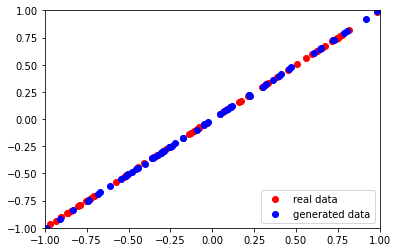

4/4 [==============================] - 0s 3ms/step
Epoch:  3940  Generator Loss:  [0.839699387550354, 0.109375]  Discriminator Loss:  [0.68152407 0.44140625]
2/2 [==============================] - 0s 4ms/step


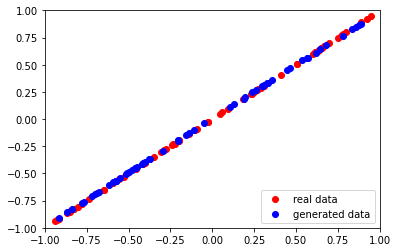

4/4 [==============================] - 0s 2ms/step
Epoch:  3950  Generator Loss:  [0.8281526565551758, 0.15625]  Discriminator Loss:  [0.67383048 0.42578125]
2/2 [==============================] - 0s 3ms/step


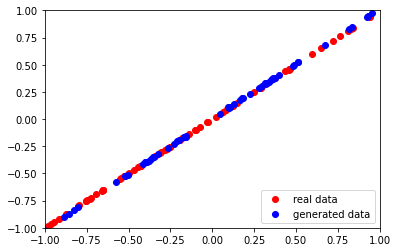

4/4 [==============================] - 0s 2ms/step
Epoch:  3960  Generator Loss:  [0.825247049331665, 0.1640625]  Discriminator Loss:  [0.66056931 0.421875  ]
2/2 [==============================] - 0s 3ms/step


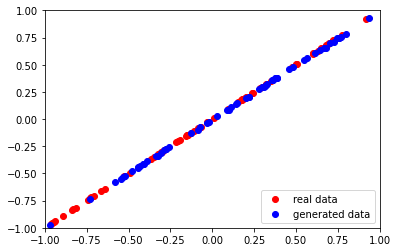

4/4 [==============================] - 0s 2ms/step
Epoch:  3970  Generator Loss:  [0.8256388902664185, 0.1953125]  Discriminator Loss:  [0.67694476 0.421875  ]
2/2 [==============================] - 0s 3ms/step


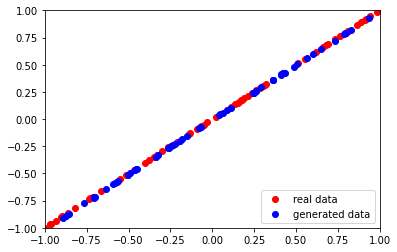

4/4 [==============================] - 0s 2ms/step
Epoch:  3980  Generator Loss:  [0.8199640512466431, 0.0859375]  Discriminator Loss:  [0.68061617 0.41015625]
2/2 [==============================] - 0s 3ms/step


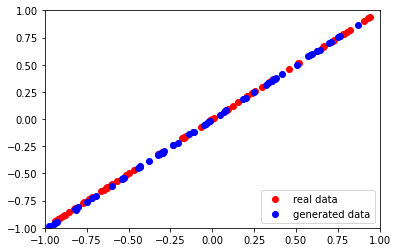

4/4 [==============================] - 0s 3ms/step
Epoch:  3990  Generator Loss:  [0.8523651957511902, 0.125]  Discriminator Loss:  [0.67240462 0.44140625]
2/2 [==============================] - 0s 4ms/step


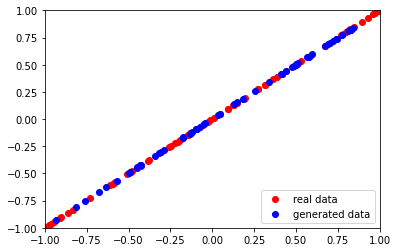

4/4 [==============================] - 0s 3ms/step
Epoch:  4000  Generator Loss:  [0.834277331829071, 0.1015625]  Discriminator Loss:  [0.66478276 0.4375    ]
2/2 [==============================] - 0s 3ms/step


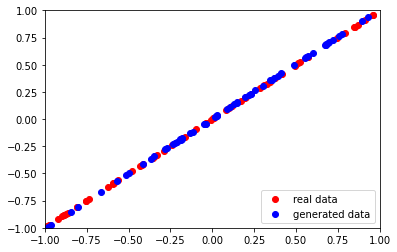

4/4 [==============================] - 0s 2ms/step
Epoch:  4010  Generator Loss:  [0.8291005492210388, 0.1875]  Discriminator Loss:  [0.68227953 0.41015625]
2/2 [==============================] - 0s 3ms/step


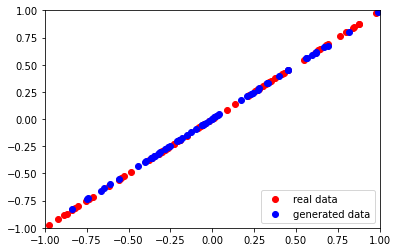

4/4 [==============================] - 0s 2ms/step
Epoch:  4020  Generator Loss:  [0.8356534242630005, 0.1328125]  Discriminator Loss:  [0.6748265  0.40234375]
2/2 [==============================] - 0s 3ms/step


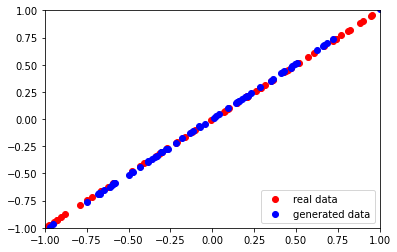

4/4 [==============================] - 0s 2ms/step
Epoch:  4030  Generator Loss:  [0.8439295291900635, 0.140625]  Discriminator Loss:  [0.67509288 0.4140625 ]
2/2 [==============================] - 0s 3ms/step


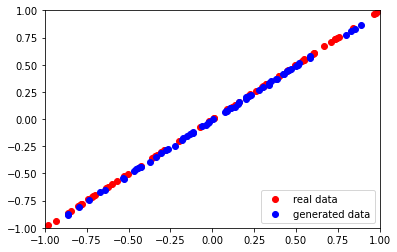

4/4 [==============================] - 0s 2ms/step
Epoch:  4040  Generator Loss:  [0.8271713256835938, 0.1484375]  Discriminator Loss:  [0.66810802 0.43359375]
2/2 [==============================] - 0s 4ms/step


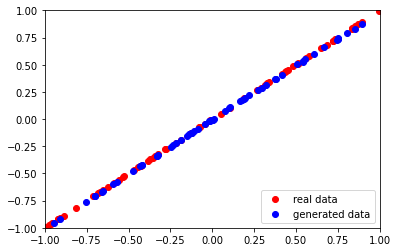

4/4 [==============================] - 0s 2ms/step
Epoch:  4050  Generator Loss:  [0.8466711640357971, 0.109375]  Discriminator Loss:  [0.67024326 0.44921875]
2/2 [==============================] - 0s 3ms/step


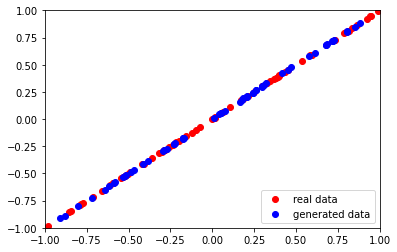

4/4 [==============================] - 0s 2ms/step
Epoch:  4060  Generator Loss:  [0.8427304029464722, 0.125]  Discriminator Loss:  [0.67636329 0.4453125 ]
2/2 [==============================] - 0s 4ms/step


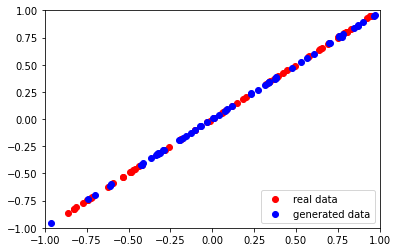

4/4 [==============================] - 0s 2ms/step
Epoch:  4070  Generator Loss:  [0.8241130709648132, 0.1328125]  Discriminator Loss:  [0.67402092 0.43359375]
2/2 [==============================] - 0s 3ms/step


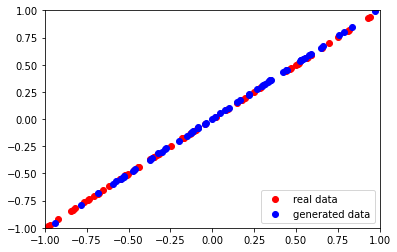

4/4 [==============================] - 0s 2ms/step
Epoch:  4080  Generator Loss:  [0.8418701887130737, 0.09375]  Discriminator Loss:  [0.676139 0.453125]
2/2 [==============================] - 0s 3ms/step


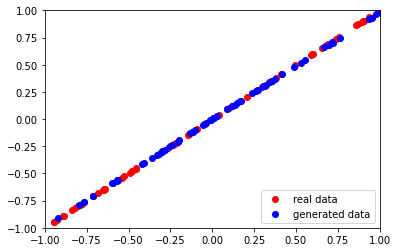

4/4 [==============================] - 0s 2ms/step
Epoch:  4090  Generator Loss:  [0.8399919271469116, 0.09375]  Discriminator Loss:  [0.67502782 0.4453125 ]
2/2 [==============================] - 0s 4ms/step


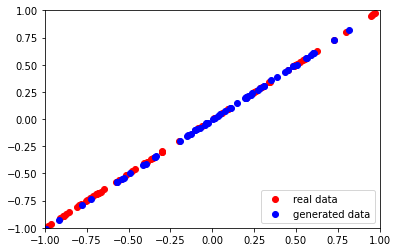

4/4 [==============================] - 0s 2ms/step
Epoch:  4100  Generator Loss:  [0.8349525928497314, 0.140625]  Discriminator Loss:  [0.67815661 0.4296875 ]
2/2 [==============================] - 0s 3ms/step


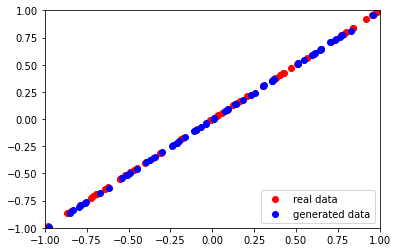

4/4 [==============================] - 0s 2ms/step
Epoch:  4110  Generator Loss:  [0.8254729509353638, 0.109375]  Discriminator Loss:  [0.67888358 0.41796875]
2/2 [==============================] - 0s 3ms/step


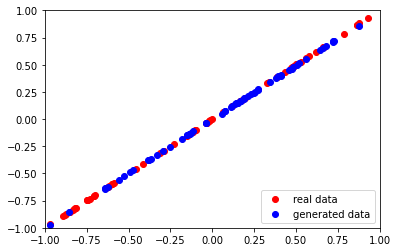

4/4 [==============================] - 0s 2ms/step
Epoch:  4120  Generator Loss:  [0.8351157307624817, 0.125]  Discriminator Loss:  [0.66951352 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


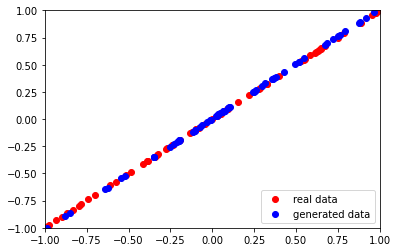

4/4 [==============================] - 0s 2ms/step
Epoch:  4130  Generator Loss:  [0.8074305057525635, 0.15625]  Discriminator Loss:  [0.67526984 0.44140625]
2/2 [==============================] - 0s 3ms/step


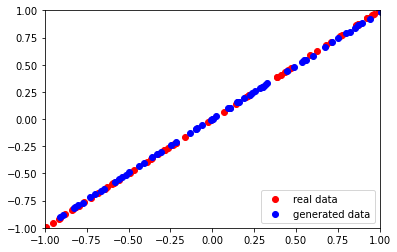

4/4 [==============================] - 0s 2ms/step
Epoch:  4140  Generator Loss:  [0.8270339369773865, 0.171875]  Discriminator Loss:  [0.68103325 0.3828125 ]
2/2 [==============================] - 0s 3ms/step


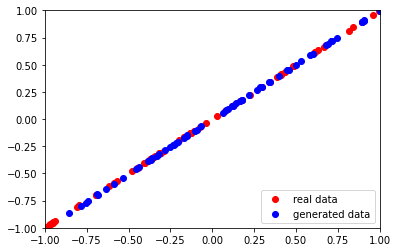

4/4 [==============================] - 0s 2ms/step
Epoch:  4150  Generator Loss:  [0.8425474762916565, 0.125]  Discriminator Loss:  [0.67019787 0.42578125]
2/2 [==============================] - 0s 3ms/step


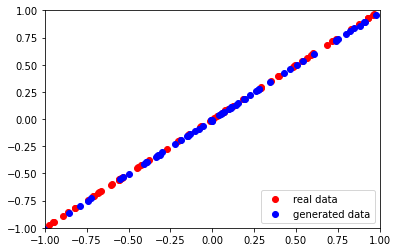

4/4 [==============================] - 0s 2ms/step
Epoch:  4160  Generator Loss:  [0.8365234136581421, 0.140625]  Discriminator Loss:  [0.66658455 0.4453125 ]
2/2 [==============================] - 0s 4ms/step


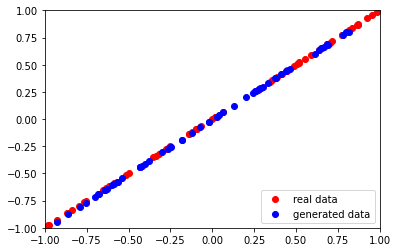

4/4 [==============================] - 0s 3ms/step
Epoch:  4170  Generator Loss:  [0.8385622501373291, 0.109375]  Discriminator Loss:  [0.6814945  0.40234375]
2/2 [==============================] - 0s 4ms/step


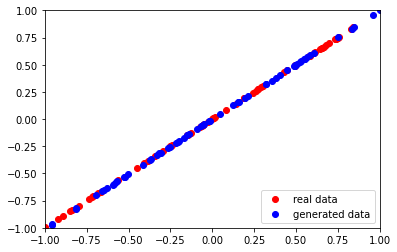

4/4 [==============================] - 0s 3ms/step
Epoch:  4180  Generator Loss:  [0.8293185234069824, 0.125]  Discriminator Loss:  [0.68328357 0.421875  ]
2/2 [==============================] - 0s 3ms/step


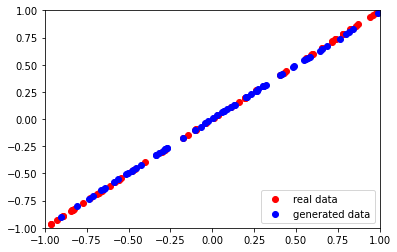

4/4 [==============================] - 0s 2ms/step
Epoch:  4190  Generator Loss:  [0.8310394287109375, 0.125]  Discriminator Loss:  [0.67487696 0.4296875 ]
2/2 [==============================] - 0s 4ms/step


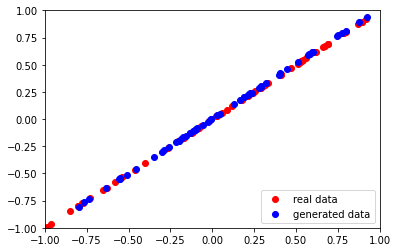

4/4 [==============================] - 0s 2ms/step
Epoch:  4200  Generator Loss:  [0.8454498052597046, 0.1171875]  Discriminator Loss:  [0.67565367 0.45703125]
2/2 [==============================] - 0s 3ms/step


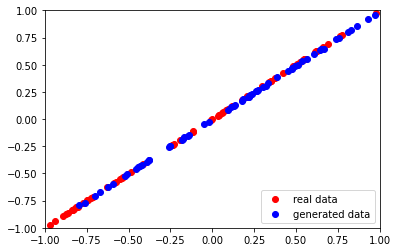

4/4 [==============================] - 0s 2ms/step
Epoch:  4210  Generator Loss:  [0.826655387878418, 0.125]  Discriminator Loss:  [0.68030676 0.42578125]
2/2 [==============================] - 0s 3ms/step


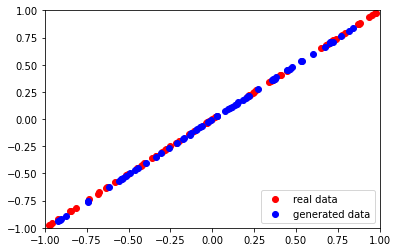

4/4 [==============================] - 0s 3ms/step
Epoch:  4220  Generator Loss:  [0.8357571363449097, 0.140625]  Discriminator Loss:  [0.68101016 0.42578125]
2/2 [==============================] - 0s 3ms/step


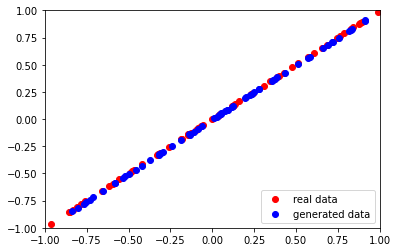

4/4 [==============================] - 0s 2ms/step
Epoch:  4230  Generator Loss:  [0.8418723344802856, 0.125]  Discriminator Loss:  [0.67820147 0.42578125]
2/2 [==============================] - 0s 4ms/step


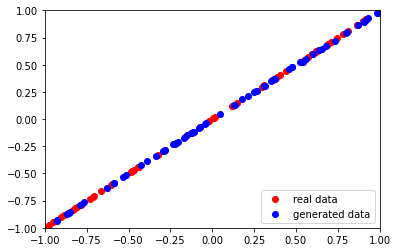

4/4 [==============================] - 0s 2ms/step
Epoch:  4240  Generator Loss:  [0.8454500436782837, 0.078125]  Discriminator Loss:  [0.66370997 0.45703125]
2/2 [==============================] - 0s 3ms/step


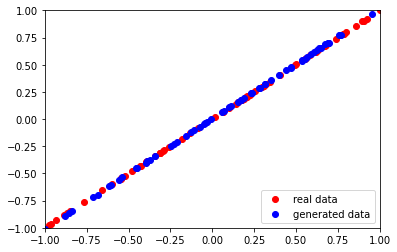

4/4 [==============================] - 0s 3ms/step
Epoch:  4250  Generator Loss:  [0.8272785544395447, 0.15625]  Discriminator Loss:  [0.67818871 0.4140625 ]
2/2 [==============================] - 0s 3ms/step


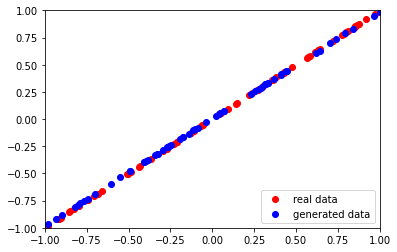

4/4 [==============================] - 0s 2ms/step
Epoch:  4260  Generator Loss:  [0.8281641006469727, 0.1875]  Discriminator Loss:  [0.67816493 0.41796875]
2/2 [==============================] - 0s 3ms/step


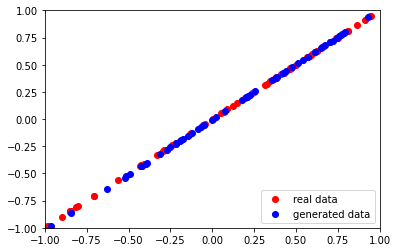

4/4 [==============================] - 0s 2ms/step
Epoch:  4270  Generator Loss:  [0.8148635625839233, 0.1953125]  Discriminator Loss:  [0.66838279 0.453125  ]
2/2 [==============================] - 0s 3ms/step


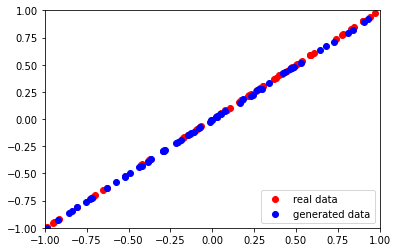

4/4 [==============================] - 0s 2ms/step
Epoch:  4280  Generator Loss:  [0.8160527348518372, 0.1328125]  Discriminator Loss:  [0.6787279  0.41796875]
2/2 [==============================] - 0s 3ms/step


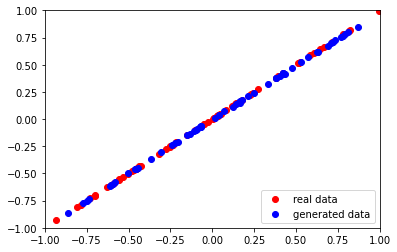

4/4 [==============================] - 0s 2ms/step
Epoch:  4290  Generator Loss:  [0.8324626684188843, 0.0859375]  Discriminator Loss:  [0.67786574 0.46484375]
2/2 [==============================] - 0s 3ms/step


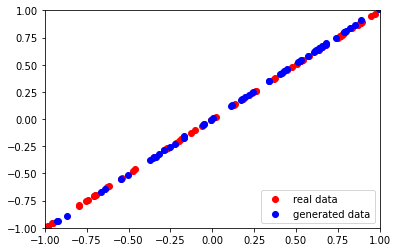

4/4 [==============================] - 0s 2ms/step
Epoch:  4300  Generator Loss:  [0.817707896232605, 0.1640625]  Discriminator Loss:  [0.68154719 0.43359375]
2/2 [==============================] - 0s 3ms/step


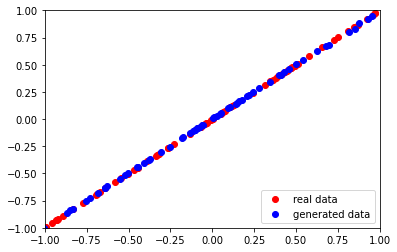

4/4 [==============================] - 0s 2ms/step
Epoch:  4310  Generator Loss:  [0.8273290395736694, 0.1640625]  Discriminator Loss:  [0.6862095 0.4140625]
2/2 [==============================] - 0s 4ms/step


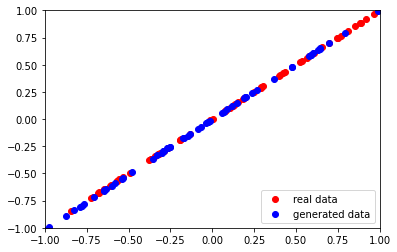

4/4 [==============================] - 0s 2ms/step
Epoch:  4320  Generator Loss:  [0.8274021148681641, 0.1328125]  Discriminator Loss:  [0.67960459 0.43359375]
2/2 [==============================] - 0s 4ms/step


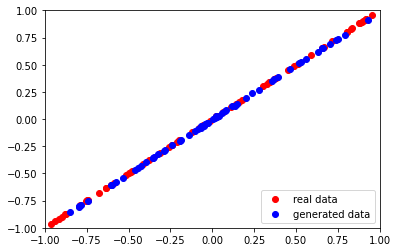

4/4 [==============================] - 0s 2ms/step
Epoch:  4330  Generator Loss:  [0.8253068923950195, 0.109375]  Discriminator Loss:  [0.68101966 0.44921875]
2/2 [==============================] - 0s 4ms/step


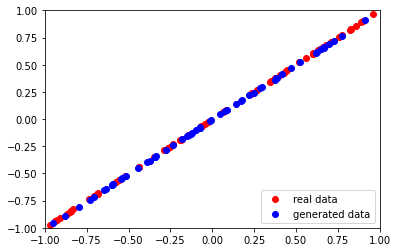

4/4 [==============================] - 0s 2ms/step
Epoch:  4340  Generator Loss:  [0.8140682578086853, 0.171875]  Discriminator Loss:  [0.67374313 0.45703125]
2/2 [==============================] - 0s 3ms/step


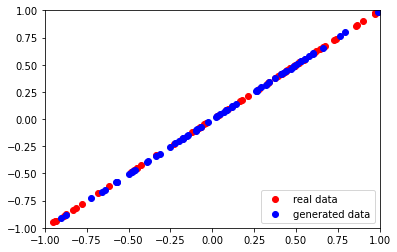

4/4 [==============================] - 0s 2ms/step
Epoch:  4350  Generator Loss:  [0.8368249535560608, 0.0703125]  Discriminator Loss:  [0.67102954 0.48046875]
2/2 [==============================] - 0s 4ms/step


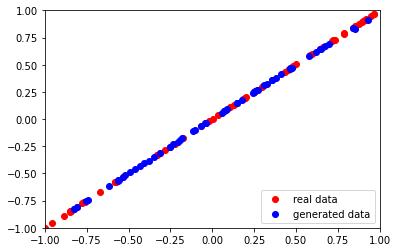

4/4 [==============================] - 0s 2ms/step
Epoch:  4360  Generator Loss:  [0.8315499424934387, 0.140625]  Discriminator Loss:  [0.68087333 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


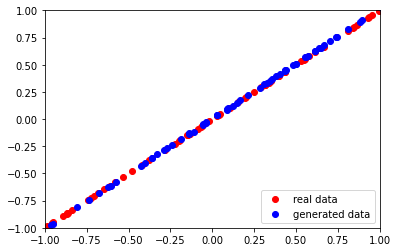

4/4 [==============================] - 0s 2ms/step
Epoch:  4370  Generator Loss:  [0.823217511177063, 0.0703125]  Discriminator Loss:  [0.68750989 0.44140625]
2/2 [==============================] - 0s 3ms/step


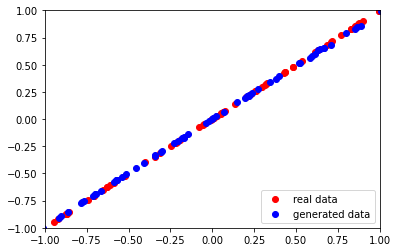

4/4 [==============================] - 0s 2ms/step
Epoch:  4380  Generator Loss:  [0.8242107629776001, 0.1015625]  Discriminator Loss:  [0.67182028 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


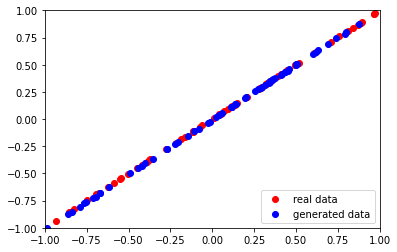

4/4 [==============================] - 0s 2ms/step
Epoch:  4390  Generator Loss:  [0.8345773220062256, 0.0859375]  Discriminator Loss:  [0.68033513 0.45703125]
2/2 [==============================] - 0s 4ms/step


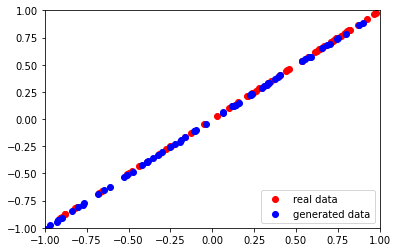

4/4 [==============================] - 0s 2ms/step
Epoch:  4400  Generator Loss:  [0.8252153992652893, 0.078125]  Discriminator Loss:  [0.67858851 0.4453125 ]
2/2 [==============================] - 0s 4ms/step


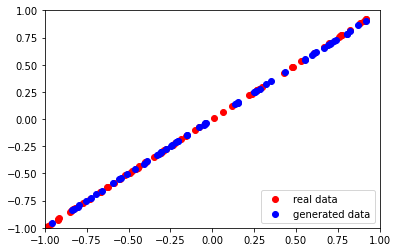

4/4 [==============================] - 0s 2ms/step
Epoch:  4410  Generator Loss:  [0.8308501243591309, 0.1171875]  Discriminator Loss:  [0.68144807 0.43359375]
2/2 [==============================] - 0s 3ms/step


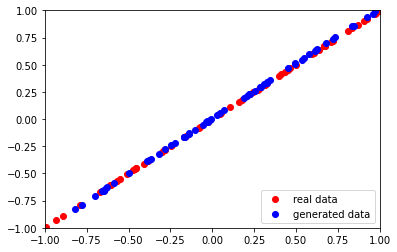

4/4 [==============================] - 0s 2ms/step
Epoch:  4420  Generator Loss:  [0.8304352164268494, 0.046875]  Discriminator Loss:  [0.68678048 0.44921875]
2/2 [==============================] - 0s 3ms/step


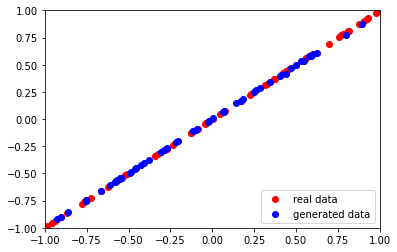

4/4 [==============================] - 0s 2ms/step
Epoch:  4430  Generator Loss:  [0.8269772529602051, 0.078125]  Discriminator Loss:  [0.67691478 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


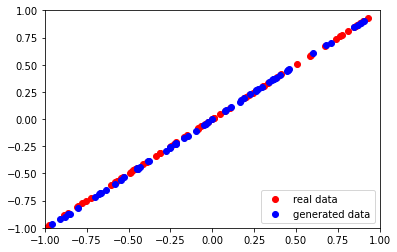

4/4 [==============================] - 0s 2ms/step
Epoch:  4440  Generator Loss:  [0.8361964821815491, 0.0625]  Discriminator Loss:  [0.68069959 0.4375    ]
2/2 [==============================] - 0s 3ms/step


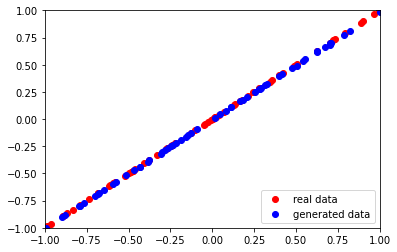

4/4 [==============================] - 0s 3ms/step
Epoch:  4450  Generator Loss:  [0.8316819071769714, 0.0859375]  Discriminator Loss:  [0.67499533 0.46875   ]
2/2 [==============================] - 0s 3ms/step


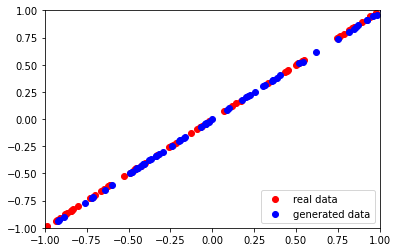

4/4 [==============================] - 0s 2ms/step
Epoch:  4460  Generator Loss:  [0.8177475333213806, 0.0390625]  Discriminator Loss:  [0.6682215  0.47265625]
2/2 [==============================] - 0s 4ms/step


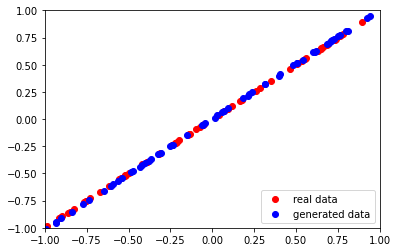

4/4 [==============================] - 0s 2ms/step
Epoch:  4470  Generator Loss:  [0.8069459199905396, 0.125]  Discriminator Loss:  [0.68358669 0.4609375 ]
2/2 [==============================] - 0s 4ms/step


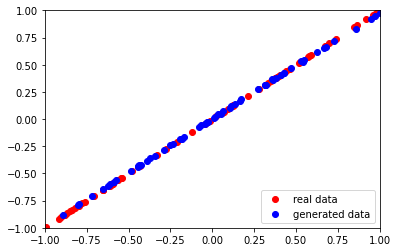

4/4 [==============================] - 0s 2ms/step
Epoch:  4480  Generator Loss:  [0.8299028277397156, 0.09375]  Discriminator Loss:  [0.67866528 0.484375  ]
2/2 [==============================] - 0s 3ms/step


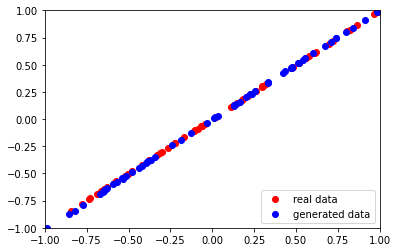

4/4 [==============================] - 0s 2ms/step
Epoch:  4490  Generator Loss:  [0.8221714496612549, 0.078125]  Discriminator Loss:  [0.67271632 0.4765625 ]
2/2 [==============================] - 0s 5ms/step


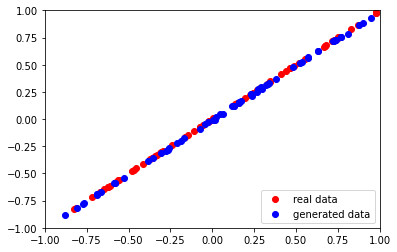

4/4 [==============================] - 0s 2ms/step
Epoch:  4500  Generator Loss:  [0.8311952352523804, 0.0625]  Discriminator Loss:  [0.67704549 0.45703125]
2/2 [==============================] - 0s 4ms/step


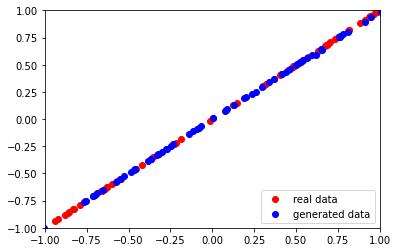

4/4 [==============================] - 0s 2ms/step
Epoch:  4510  Generator Loss:  [0.8412222862243652, 0.0546875]  Discriminator Loss:  [0.6751101 0.4375   ]
2/2 [==============================] - 0s 4ms/step


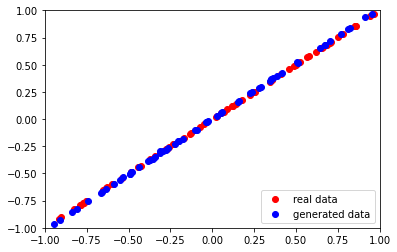

4/4 [==============================] - 0s 2ms/step
Epoch:  4520  Generator Loss:  [0.8166674971580505, 0.1015625]  Discriminator Loss:  [0.68167588 0.44140625]
2/2 [==============================] - 0s 3ms/step


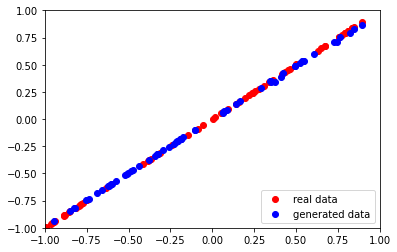

4/4 [==============================] - 0s 3ms/step
Epoch:  4530  Generator Loss:  [0.8390612006187439, 0.046875]  Discriminator Loss:  [0.6838887  0.48828125]
2/2 [==============================] - 0s 3ms/step


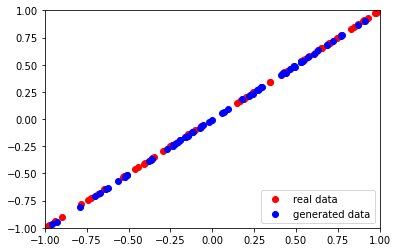

4/4 [==============================] - 0s 2ms/step
Epoch:  4540  Generator Loss:  [0.8475004434585571, 0.0546875]  Discriminator Loss:  [0.68397218 0.44921875]
2/2 [==============================] - 0s 3ms/step


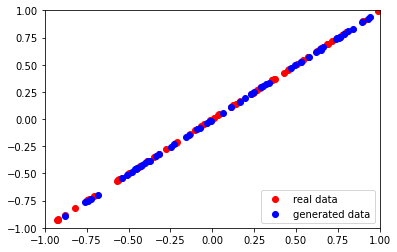

4/4 [==============================] - 0s 2ms/step
Epoch:  4550  Generator Loss:  [0.8139029741287231, 0.09375]  Discriminator Loss:  [0.67336392 0.45703125]
2/2 [==============================] - 0s 3ms/step


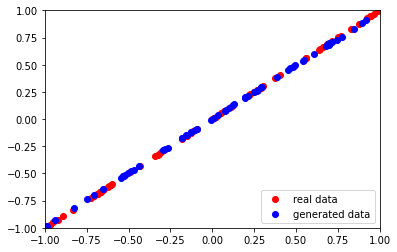

4/4 [==============================] - 0s 3ms/step
Epoch:  4560  Generator Loss:  [0.8366499543190002, 0.0703125]  Discriminator Loss:  [0.67778105 0.46484375]
2/2 [==============================] - 0s 3ms/step


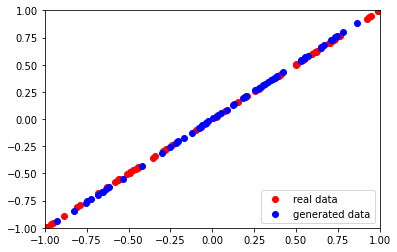

4/4 [==============================] - 0s 2ms/step
Epoch:  4570  Generator Loss:  [0.8273113369941711, 0.09375]  Discriminator Loss:  [0.68465787 0.4453125 ]
2/2 [==============================] - 0s 3ms/step


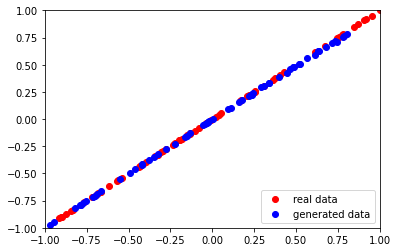

4/4 [==============================] - 0s 2ms/step
Epoch:  4580  Generator Loss:  [0.8361286520957947, 0.046875]  Discriminator Loss:  [0.6805492 0.46875  ]
2/2 [==============================] - 0s 4ms/step


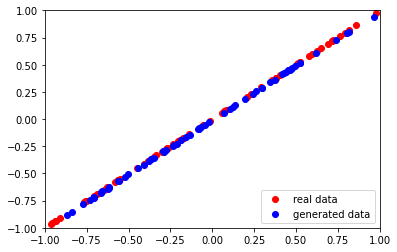

4/4 [==============================] - 0s 2ms/step
Epoch:  4590  Generator Loss:  [0.8504824638366699, 0.03125]  Discriminator Loss:  [0.67838091 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


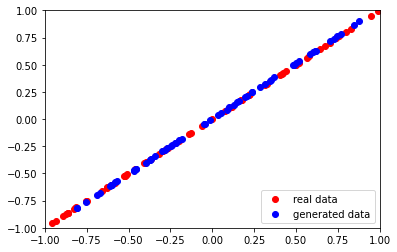

4/4 [==============================] - 0s 2ms/step
Epoch:  4600  Generator Loss:  [0.810141921043396, 0.125]  Discriminator Loss:  [0.68233395 0.453125  ]
2/2 [==============================] - 0s 3ms/step


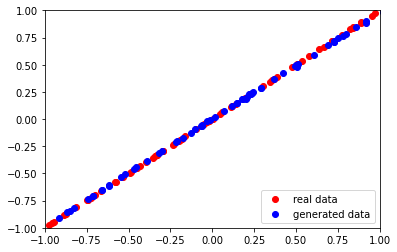

4/4 [==============================] - 0s 3ms/step
Epoch:  4610  Generator Loss:  [0.7990937829017639, 0.1015625]  Discriminator Loss:  [0.67502031 0.4609375 ]
2/2 [==============================] - 0s 4ms/step


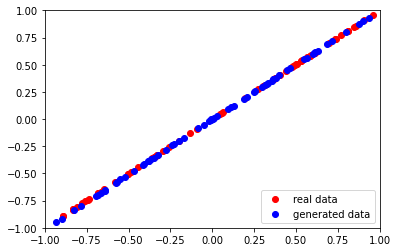

4/4 [==============================] - 0s 2ms/step
Epoch:  4620  Generator Loss:  [0.8456719517707825, 0.0390625]  Discriminator Loss:  [0.67890847 0.46484375]
2/2 [==============================] - 0s 4ms/step


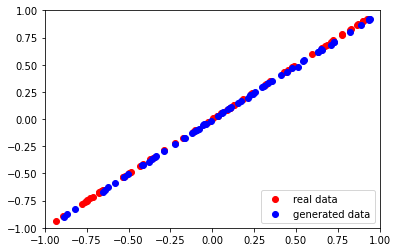

4/4 [==============================] - 0s 2ms/step
Epoch:  4630  Generator Loss:  [0.8138706088066101, 0.0703125]  Discriminator Loss:  [0.67398608 0.48046875]
2/2 [==============================] - 0s 3ms/step


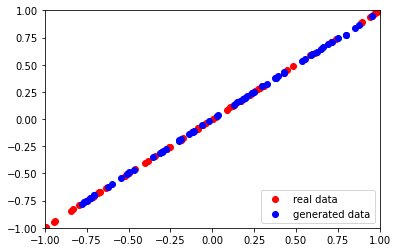

4/4 [==============================] - 0s 2ms/step
Epoch:  4640  Generator Loss:  [0.8160287141799927, 0.078125]  Discriminator Loss:  [0.67678842 0.45703125]
2/2 [==============================] - 0s 4ms/step


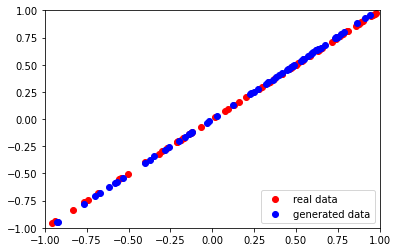

4/4 [==============================] - 0s 2ms/step
Epoch:  4650  Generator Loss:  [0.8555145859718323, 0.046875]  Discriminator Loss:  [0.68018466 0.4765625 ]
2/2 [==============================] - 0s 4ms/step


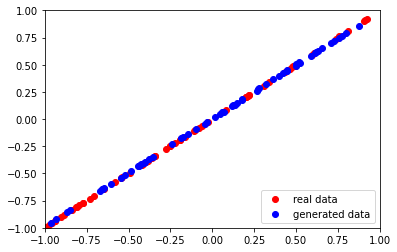

4/4 [==============================] - 0s 2ms/step
Epoch:  4660  Generator Loss:  [0.8264210820198059, 0.0390625]  Discriminator Loss:  [0.67699528 0.4375    ]
2/2 [==============================] - 0s 3ms/step


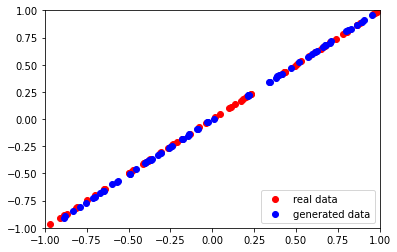

4/4 [==============================] - 0s 2ms/step
Epoch:  4670  Generator Loss:  [0.8291332721710205, 0.046875]  Discriminator Loss:  [0.67110988 0.45703125]
2/2 [==============================] - 0s 4ms/step


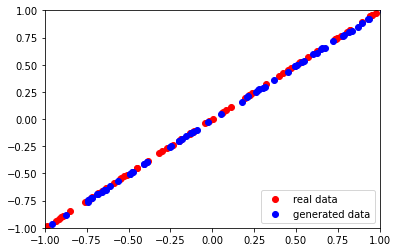

4/4 [==============================] - 0s 2ms/step
Epoch:  4680  Generator Loss:  [0.836667537689209, 0.078125]  Discriminator Loss:  [0.67752492 0.45703125]
2/2 [==============================] - 0s 3ms/step


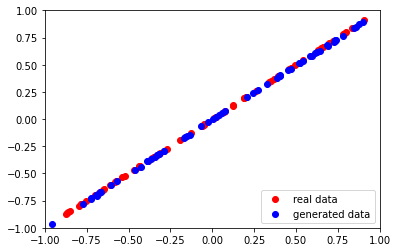

4/4 [==============================] - 0s 2ms/step
Epoch:  4690  Generator Loss:  [0.8371248245239258, 0.0234375]  Discriminator Loss:  [0.67248145 0.484375  ]
2/2 [==============================] - 0s 3ms/step


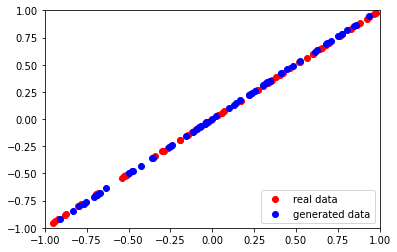

4/4 [==============================] - 0s 2ms/step
Epoch:  4700  Generator Loss:  [0.8131064176559448, 0.0703125]  Discriminator Loss:  [0.68041953 0.46875   ]
2/2 [==============================] - 0s 3ms/step


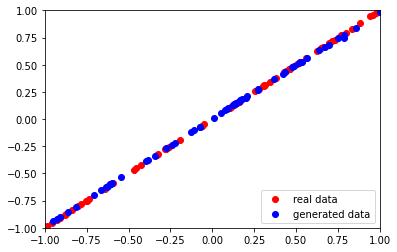

4/4 [==============================] - 0s 2ms/step
Epoch:  4710  Generator Loss:  [0.829187273979187, 0.015625]  Discriminator Loss:  [0.68531841 0.46484375]
2/2 [==============================] - 0s 3ms/step


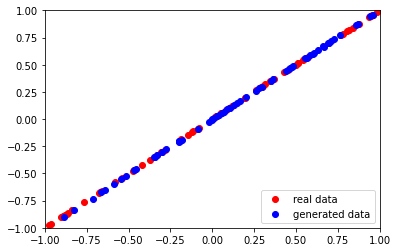

4/4 [==============================] - 0s 3ms/step
Epoch:  4720  Generator Loss:  [0.8166248798370361, 0.078125]  Discriminator Loss:  [0.67746603 0.4609375 ]
2/2 [==============================] - 0s 4ms/step


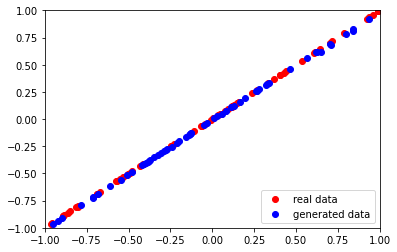

4/4 [==============================] - 0s 3ms/step
Epoch:  4730  Generator Loss:  [0.8356270790100098, 0.015625]  Discriminator Loss:  [0.66152519 0.4921875 ]
2/2 [==============================] - 0s 4ms/step


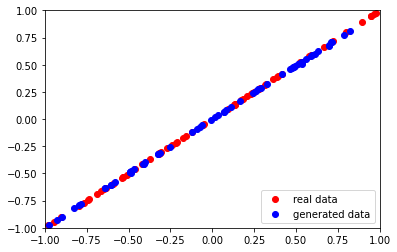

4/4 [==============================] - 0s 2ms/step
Epoch:  4740  Generator Loss:  [0.8253669738769531, 0.0546875]  Discriminator Loss:  [0.67781383 0.46875   ]
2/2 [==============================] - 0s 5ms/step


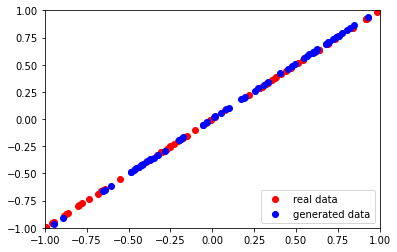

4/4 [==============================] - 0s 2ms/step
Epoch:  4750  Generator Loss:  [0.831447958946228, 0.0546875]  Discriminator Loss:  [0.68254691 0.47265625]
2/2 [==============================] - 0s 3ms/step


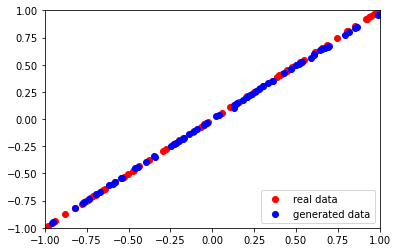

4/4 [==============================] - 0s 2ms/step
Epoch:  4760  Generator Loss:  [0.8335200548171997, 0.015625]  Discriminator Loss:  [0.67763585 0.48046875]
2/2 [==============================] - 0s 3ms/step


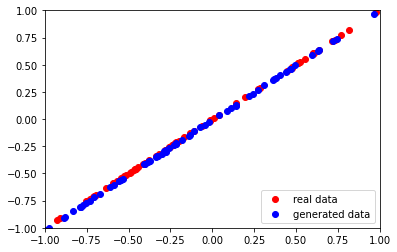

4/4 [==============================] - 0s 2ms/step
Epoch:  4770  Generator Loss:  [0.8311628699302673, 0.015625]  Discriminator Loss:  [0.68288907 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


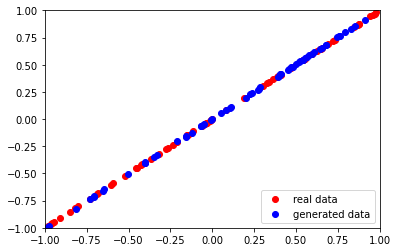

4/4 [==============================] - 0s 2ms/step
Epoch:  4780  Generator Loss:  [0.8019328117370605, 0.0546875]  Discriminator Loss:  [0.67746428 0.47265625]
2/2 [==============================] - 0s 3ms/step


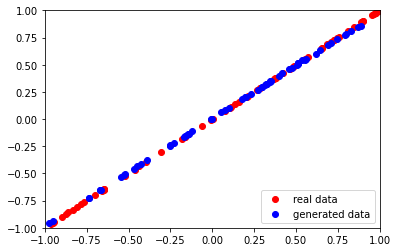

4/4 [==============================] - 0s 2ms/step
Epoch:  4790  Generator Loss:  [0.8088339567184448, 0.109375]  Discriminator Loss:  [0.67981681 0.4296875 ]
2/2 [==============================] - 0s 3ms/step


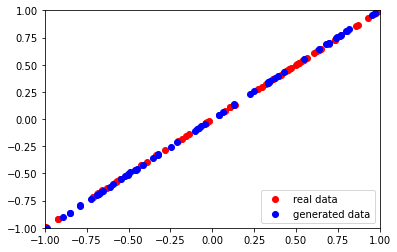

4/4 [==============================] - 0s 2ms/step
Epoch:  4800  Generator Loss:  [0.8253099322319031, 0.0546875]  Discriminator Loss:  [0.67665696 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


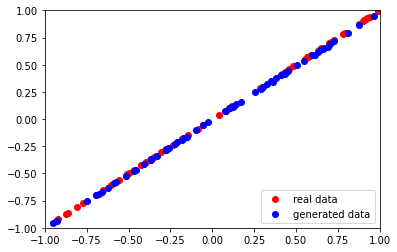

4/4 [==============================] - 0s 4ms/step
Epoch:  4810  Generator Loss:  [0.8336212635040283, 0.015625]  Discriminator Loss:  [0.67170581 0.49609375]
2/2 [==============================] - 0s 3ms/step


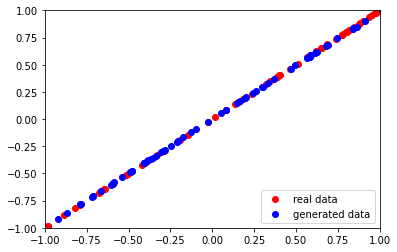

4/4 [==============================] - 0s 2ms/step
Epoch:  4820  Generator Loss:  [0.8454146981239319, 0.0078125]  Discriminator Loss:  [0.67297104 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


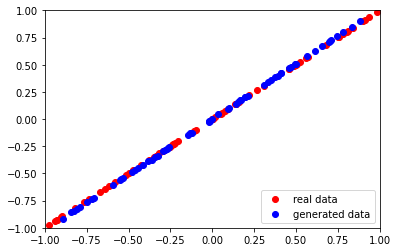

4/4 [==============================] - 0s 2ms/step
Epoch:  4830  Generator Loss:  [0.8198570013046265, 0.0546875]  Discriminator Loss:  [0.68316931 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


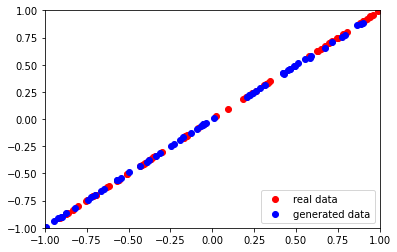

4/4 [==============================] - 0s 2ms/step
Epoch:  4840  Generator Loss:  [0.8206765651702881, 0.015625]  Discriminator Loss:  [0.68241909 0.484375  ]
2/2 [==============================] - 0s 5ms/step


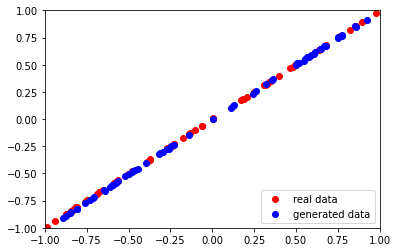

4/4 [==============================] - 0s 2ms/step
Epoch:  4850  Generator Loss:  [0.8153657913208008, 0.0390625]  Discriminator Loss:  [0.67674658 0.48828125]
2/2 [==============================] - 0s 3ms/step


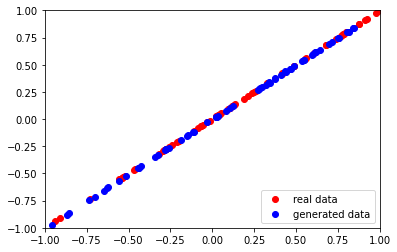

4/4 [==============================] - 0s 2ms/step
Epoch:  4860  Generator Loss:  [0.8164894580841064, 0.0546875]  Discriminator Loss:  [0.67445099 0.48828125]
2/2 [==============================] - 0s 4ms/step


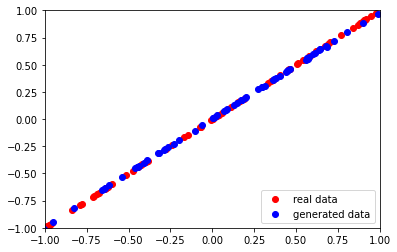

4/4 [==============================] - 0s 2ms/step
Epoch:  4870  Generator Loss:  [0.8163242340087891, 0.0390625]  Discriminator Loss:  [0.67712989 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


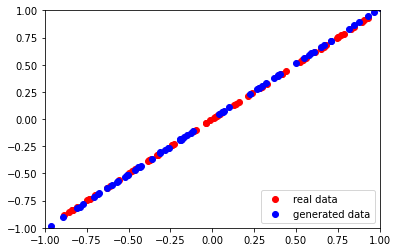

4/4 [==============================] - 0s 2ms/step
Epoch:  4880  Generator Loss:  [0.8242313265800476, 0.0390625]  Discriminator Loss:  [0.68336838 0.44921875]
2/2 [==============================] - 0s 3ms/step


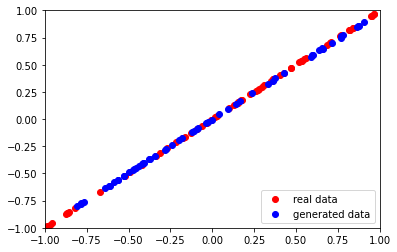

4/4 [==============================] - 0s 2ms/step
Epoch:  4890  Generator Loss:  [0.8341793417930603, 0.0]  Discriminator Loss:  [0.6857053  0.49609375]
2/2 [==============================] - 0s 3ms/step


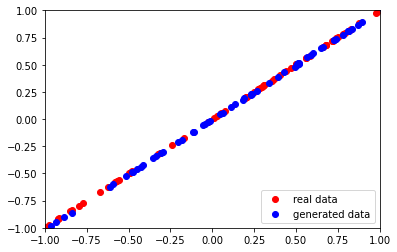

4/4 [==============================] - 0s 2ms/step
Epoch:  4900  Generator Loss:  [0.8249454498291016, 0.0078125]  Discriminator Loss:  [0.67672202 0.5       ]
2/2 [==============================] - 0s 3ms/step


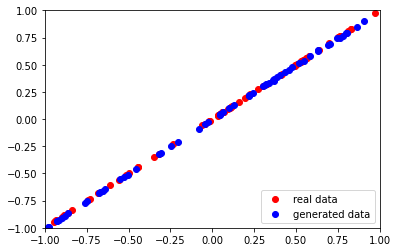

4/4 [==============================] - 0s 2ms/step
Epoch:  4910  Generator Loss:  [0.8493025302886963, 0.0]  Discriminator Loss:  [0.67576849 0.5       ]
2/2 [==============================] - 0s 4ms/step


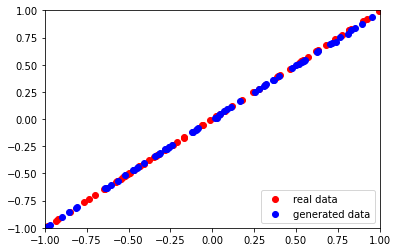

4/4 [==============================] - 0s 2ms/step
Epoch:  4920  Generator Loss:  [0.8178683519363403, 0.0234375]  Discriminator Loss:  [0.67741746 0.48828125]
2/2 [==============================] - 0s 3ms/step


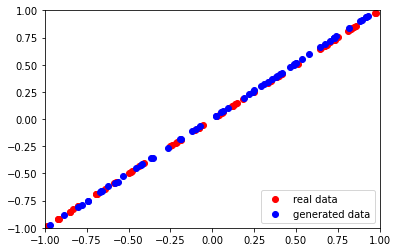

4/4 [==============================] - 0s 2ms/step
Epoch:  4930  Generator Loss:  [0.8110523223876953, 0.0625]  Discriminator Loss:  [0.68084288 0.48046875]
2/2 [==============================] - 0s 3ms/step


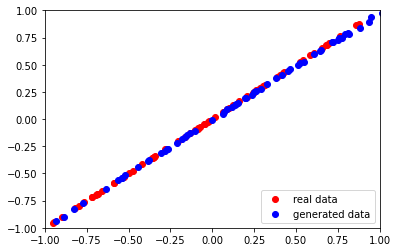

4/4 [==============================] - 0s 2ms/step
Epoch:  4940  Generator Loss:  [0.8137603998184204, 0.0859375]  Discriminator Loss:  [0.67571798 0.4765625 ]
2/2 [==============================] - 0s 4ms/step


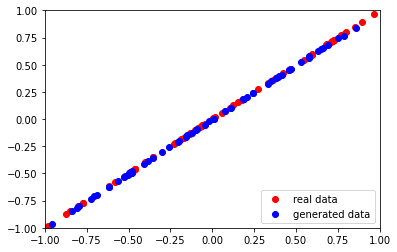

4/4 [==============================] - 0s 2ms/step
Epoch:  4950  Generator Loss:  [0.8107335567474365, 0.125]  Discriminator Loss:  [0.68103051 0.44921875]
2/2 [==============================] - 0s 6ms/step


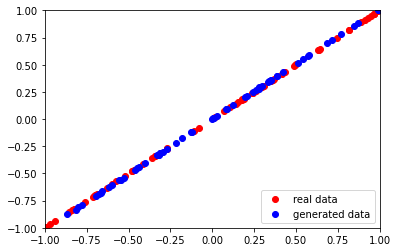

4/4 [==============================] - 0s 2ms/step
Epoch:  4960  Generator Loss:  [0.807498574256897, 0.1171875]  Discriminator Loss:  [0.68737507 0.41796875]
2/2 [==============================] - 0s 3ms/step


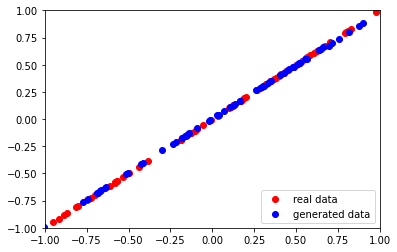

4/4 [==============================] - 0s 2ms/step
Epoch:  4970  Generator Loss:  [0.8409596085548401, 0.0]  Discriminator Loss:  [0.68294653 0.5       ]
2/2 [==============================] - 0s 8ms/step


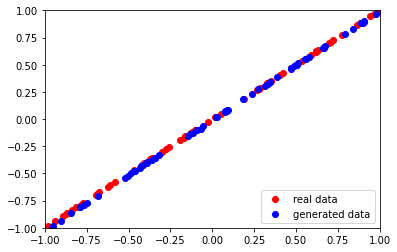

4/4 [==============================] - 0s 2ms/step
Epoch:  4980  Generator Loss:  [0.8333905935287476, 0.0078125]  Discriminator Loss:  [0.67765257 0.49609375]
2/2 [==============================] - 0s 5ms/step


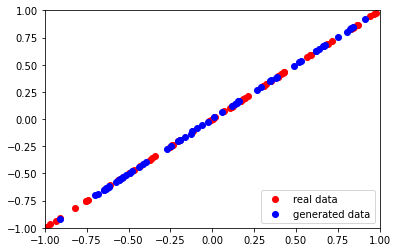

4/4 [==============================] - 0s 2ms/step
Epoch:  4990  Generator Loss:  [0.8290841579437256, 0.0]  Discriminator Loss:  [0.67367902 0.5       ]
2/2 [==============================] - 0s 3ms/step


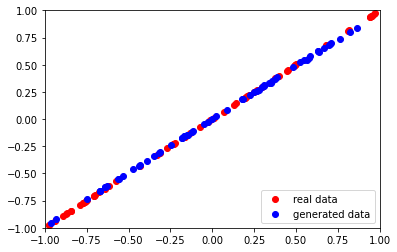

4/4 [==============================] - 0s 2ms/step
Epoch:  5000  Generator Loss:  [0.8014194369316101, 0.015625]  Discriminator Loss:  [0.68862036 0.48046875]
2/2 [==============================] - 0s 3ms/step


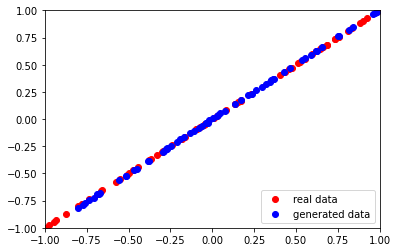

4/4 [==============================] - 0s 2ms/step
Epoch:  5010  Generator Loss:  [0.8314930200576782, 0.015625]  Discriminator Loss:  [0.68084469 0.49609375]
2/2 [==============================] - 0s 3ms/step


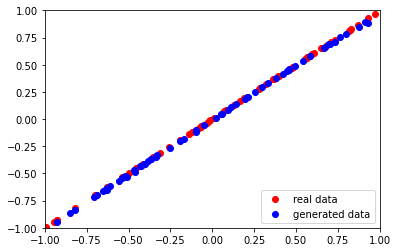

4/4 [==============================] - 0s 2ms/step
Epoch:  5020  Generator Loss:  [0.8289234042167664, 0.015625]  Discriminator Loss:  [0.68017495 0.49609375]
2/2 [==============================] - 0s 4ms/step


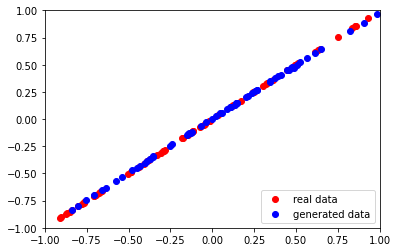

4/4 [==============================] - 0s 2ms/step
Epoch:  5030  Generator Loss:  [0.8247578144073486, 0.0078125]  Discriminator Loss:  [0.67321986 0.5       ]
2/2 [==============================] - 0s 3ms/step


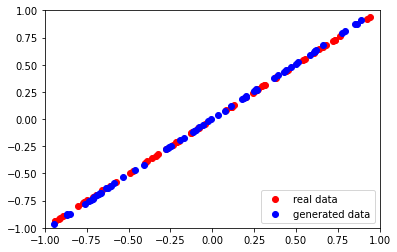

4/4 [==============================] - 0s 2ms/step
Epoch:  5040  Generator Loss:  [0.8090172410011292, 0.03125]  Discriminator Loss:  [0.6838052 0.4609375]
2/2 [==============================] - 0s 4ms/step


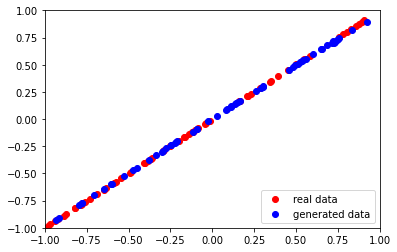

4/4 [==============================] - 0s 2ms/step
Epoch:  5050  Generator Loss:  [0.8132264614105225, 0.0078125]  Discriminator Loss:  [0.67772526 0.49609375]
2/2 [==============================] - 0s 4ms/step


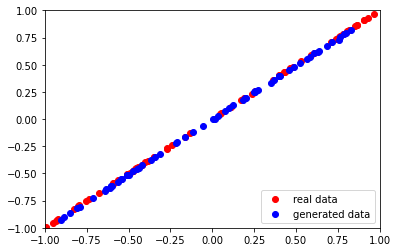

4/4 [==============================] - 0s 2ms/step
Epoch:  5060  Generator Loss:  [0.8140585422515869, 0.0078125]  Discriminator Loss:  [0.68103766 0.484375  ]
2/2 [==============================] - 0s 4ms/step


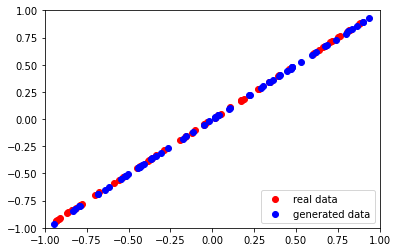

4/4 [==============================] - 0s 2ms/step
Epoch:  5070  Generator Loss:  [0.838169276714325, 0.0]  Discriminator Loss:  [0.6813091 0.5      ]
2/2 [==============================] - 0s 3ms/step


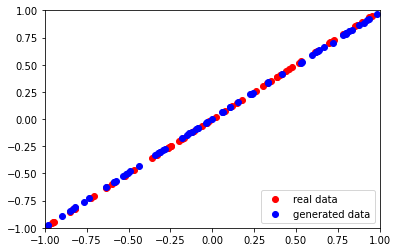

4/4 [==============================] - 0s 2ms/step
Epoch:  5080  Generator Loss:  [0.8280947208404541, 0.015625]  Discriminator Loss:  [0.67594048 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


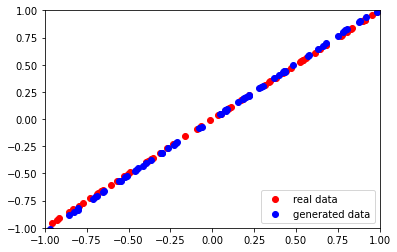

4/4 [==============================] - 0s 2ms/step
Epoch:  5090  Generator Loss:  [0.8208405375480652, 0.03125]  Discriminator Loss:  [0.68086576 0.48046875]
2/2 [==============================] - 0s 3ms/step


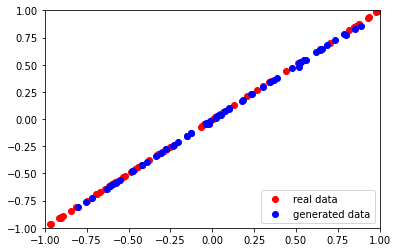

4/4 [==============================] - 0s 2ms/step
Epoch:  5100  Generator Loss:  [0.8230658769607544, 0.046875]  Discriminator Loss:  [0.6748541  0.45703125]
2/2 [==============================] - 0s 3ms/step


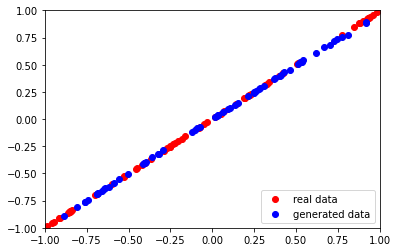

4/4 [==============================] - 0s 2ms/step
Epoch:  5110  Generator Loss:  [0.8241596221923828, 0.078125]  Discriminator Loss:  [0.67563945 0.44140625]
2/2 [==============================] - 0s 3ms/step


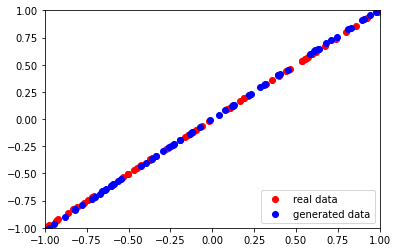

4/4 [==============================] - 0s 2ms/step
Epoch:  5120  Generator Loss:  [0.8224985599517822, 0.046875]  Discriminator Loss:  [0.68119013 0.453125  ]
2/2 [==============================] - 0s 3ms/step


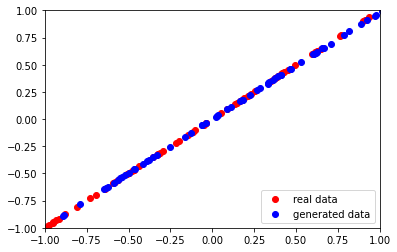

4/4 [==============================] - 0s 2ms/step
Epoch:  5130  Generator Loss:  [0.8252527713775635, 0.0]  Discriminator Loss:  [0.68075854 0.5       ]
2/2 [==============================] - 0s 3ms/step


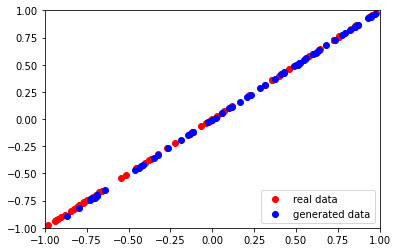

4/4 [==============================] - 0s 2ms/step
Epoch:  5140  Generator Loss:  [0.8210644721984863, 0.0]  Discriminator Loss:  [0.68225622 0.5       ]
2/2 [==============================] - 0s 4ms/step


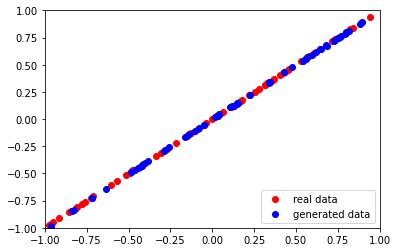

4/4 [==============================] - 0s 2ms/step
Epoch:  5150  Generator Loss:  [0.826250433921814, 0.0078125]  Discriminator Loss:  [0.67807689 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


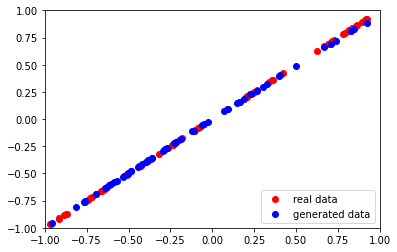

4/4 [==============================] - 0s 2ms/step
Epoch:  5160  Generator Loss:  [0.812030553817749, 0.0234375]  Discriminator Loss:  [0.68583941 0.484375  ]
2/2 [==============================] - 0s 3ms/step


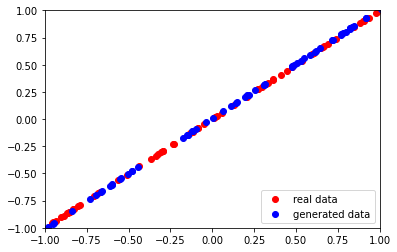

4/4 [==============================] - 0s 2ms/step
Epoch:  5170  Generator Loss:  [0.8200406432151794, 0.0234375]  Discriminator Loss:  [0.68333498 0.47265625]
2/2 [==============================] - 0s 4ms/step


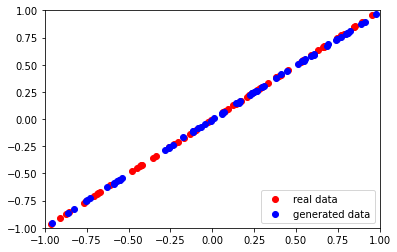

4/4 [==============================] - 0s 2ms/step
Epoch:  5180  Generator Loss:  [0.8211026191711426, 0.0546875]  Discriminator Loss:  [0.68302837 0.48828125]
2/2 [==============================] - 0s 5ms/step


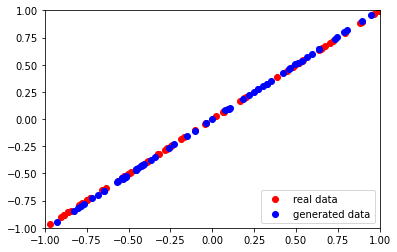

4/4 [==============================] - 0s 2ms/step
Epoch:  5190  Generator Loss:  [0.8075681328773499, 0.0546875]  Discriminator Loss:  [0.68897802 0.453125  ]
2/2 [==============================] - 0s 3ms/step


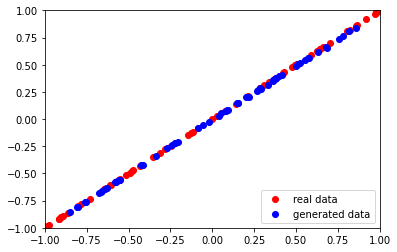

4/4 [==============================] - 0s 2ms/step
Epoch:  5200  Generator Loss:  [0.8175780773162842, 0.0078125]  Discriminator Loss:  [0.67988026 0.5       ]
2/2 [==============================] - 0s 3ms/step


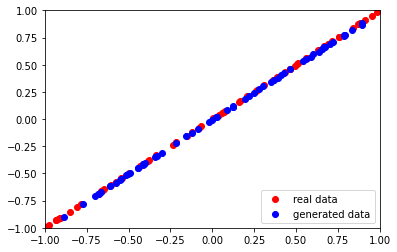

4/4 [==============================] - 0s 2ms/step
Epoch:  5210  Generator Loss:  [0.821552574634552, 0.0625]  Discriminator Loss:  [0.67998135 0.46875   ]
2/2 [==============================] - 0s 3ms/step


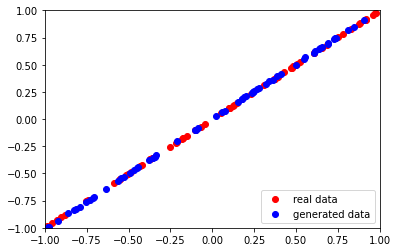

4/4 [==============================] - 0s 2ms/step
Epoch:  5220  Generator Loss:  [0.8153505325317383, 0.0546875]  Discriminator Loss:  [0.68345112 0.46484375]
2/2 [==============================] - 0s 4ms/step


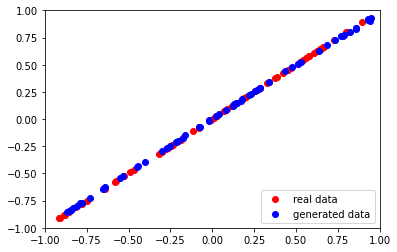

4/4 [==============================] - 0s 4ms/step
Epoch:  5230  Generator Loss:  [0.8088343739509583, 0.0]  Discriminator Loss:  [0.68161377 0.49609375]
2/2 [==============================] - 0s 3ms/step


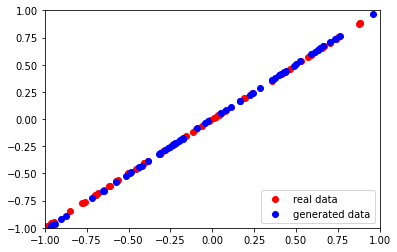

4/4 [==============================] - 0s 2ms/step
Epoch:  5240  Generator Loss:  [0.8205320835113525, 0.0]  Discriminator Loss:  [0.68331978 0.5       ]
2/2 [==============================] - 0s 4ms/step


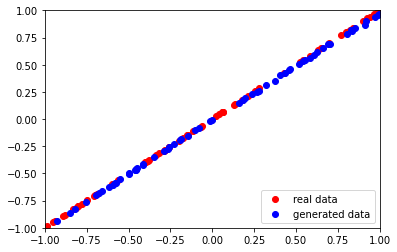

4/4 [==============================] - 0s 2ms/step
Epoch:  5250  Generator Loss:  [0.8154320120811462, 0.015625]  Discriminator Loss:  [0.68643042 0.48828125]
2/2 [==============================] - 0s 4ms/step


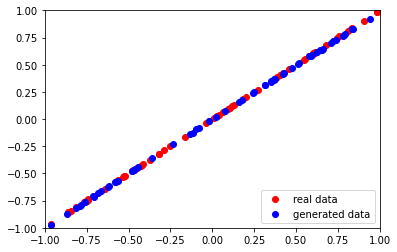

4/4 [==============================] - 0s 3ms/step
Epoch:  5260  Generator Loss:  [0.8218724727630615, 0.0078125]  Discriminator Loss:  [0.67352247 0.48828125]
2/2 [==============================] - 0s 4ms/step


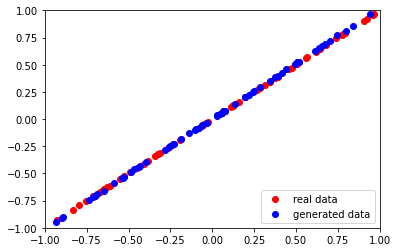

4/4 [==============================] - 0s 2ms/step
Epoch:  5270  Generator Loss:  [0.8134727478027344, 0.0390625]  Discriminator Loss:  [0.68643695 0.48046875]
2/2 [==============================] - 0s 3ms/step


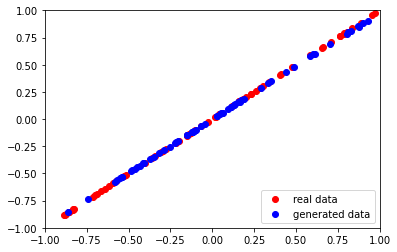

4/4 [==============================] - 0s 2ms/step
Epoch:  5280  Generator Loss:  [0.819900393486023, 0.0]  Discriminator Loss:  [0.68571666 0.5       ]
2/2 [==============================] - 0s 4ms/step


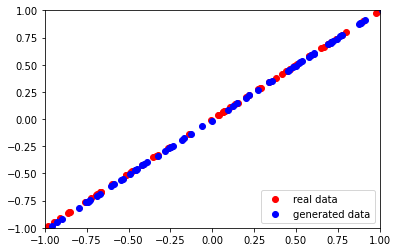

4/4 [==============================] - 0s 2ms/step
Epoch:  5290  Generator Loss:  [0.8242043256759644, 0.0]  Discriminator Loss:  [0.67045802 0.5       ]
2/2 [==============================] - 0s 3ms/step


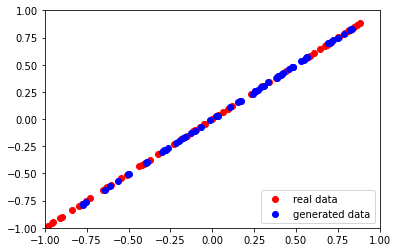

4/4 [==============================] - 0s 2ms/step
Epoch:  5300  Generator Loss:  [0.8259270191192627, 0.0078125]  Discriminator Loss:  [0.6814844 0.484375 ]
2/2 [==============================] - 0s 3ms/step


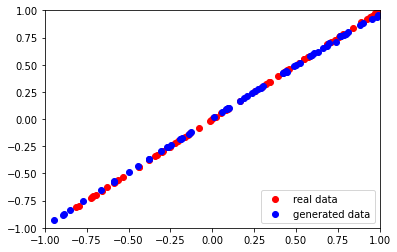

4/4 [==============================] - 0s 2ms/step
Epoch:  5310  Generator Loss:  [0.8012501001358032, 0.078125]  Discriminator Loss:  [0.67643273 0.46875   ]
2/2 [==============================] - 0s 3ms/step


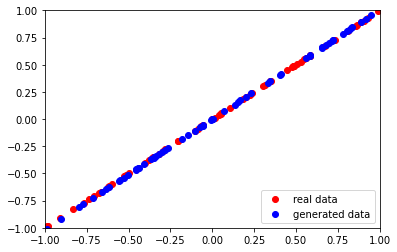

4/4 [==============================] - 0s 2ms/step
Epoch:  5320  Generator Loss:  [0.8253383040428162, 0.046875]  Discriminator Loss:  [0.68347192 0.46484375]
2/2 [==============================] - 0s 4ms/step


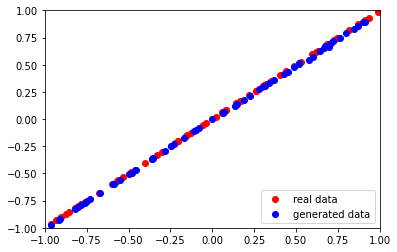

4/4 [==============================] - 0s 2ms/step
Epoch:  5330  Generator Loss:  [0.8315362930297852, 0.0]  Discriminator Loss:  [0.67898443 0.5       ]
2/2 [==============================] - 0s 3ms/step


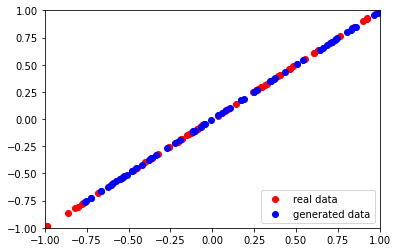

4/4 [==============================] - 0s 2ms/step
Epoch:  5340  Generator Loss:  [0.8401038646697998, 0.0]  Discriminator Loss:  [0.67506498 0.5       ]
2/2 [==============================] - 0s 2ms/step


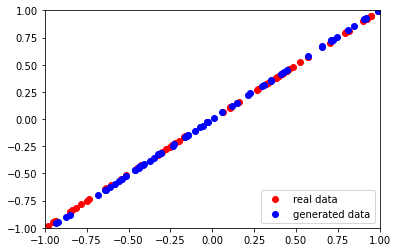

4/4 [==============================] - 0s 2ms/step
Epoch:  5350  Generator Loss:  [0.802386999130249, 0.078125]  Discriminator Loss:  [0.68536913 0.46875   ]
2/2 [==============================] - 0s 3ms/step


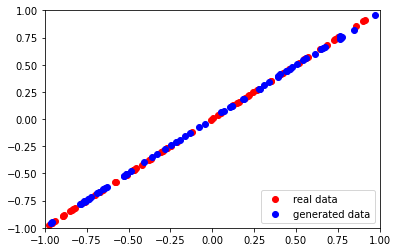

4/4 [==============================] - 0s 2ms/step
Epoch:  5360  Generator Loss:  [0.8132069706916809, 0.0390625]  Discriminator Loss:  [0.67888042 0.48046875]
2/2 [==============================] - 0s 3ms/step


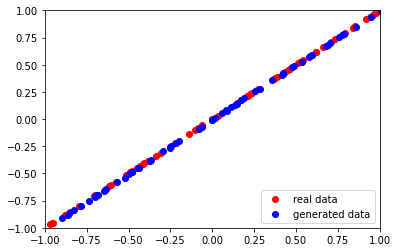

4/4 [==============================] - 0s 2ms/step
Epoch:  5370  Generator Loss:  [0.7999340891838074, 0.0625]  Discriminator Loss:  [0.68605968 0.47265625]
2/2 [==============================] - 0s 3ms/step


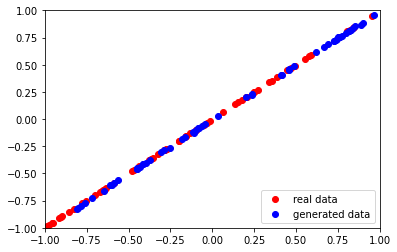

4/4 [==============================] - 0s 2ms/step
Epoch:  5380  Generator Loss:  [0.8260867595672607, 0.0]  Discriminator Loss:  [0.67720985 0.5       ]
2/2 [==============================] - 0s 3ms/step


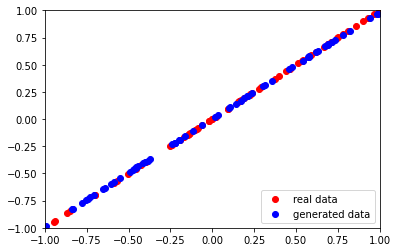

4/4 [==============================] - 0s 2ms/step
Epoch:  5390  Generator Loss:  [0.8256042003631592, 0.0]  Discriminator Loss:  [0.68014979 0.5       ]
2/2 [==============================] - 0s 3ms/step


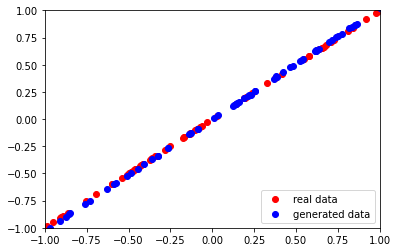

4/4 [==============================] - 0s 2ms/step
Epoch:  5400  Generator Loss:  [0.8130977153778076, 0.015625]  Discriminator Loss:  [0.68350768 0.484375  ]
2/2 [==============================] - 0s 3ms/step


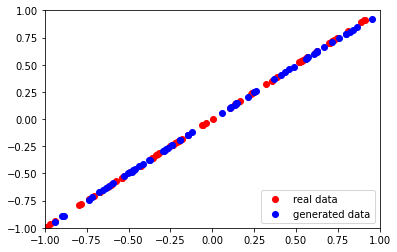

4/4 [==============================] - 0s 2ms/step
Epoch:  5410  Generator Loss:  [0.8260440826416016, 0.015625]  Discriminator Loss:  [0.68381846 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


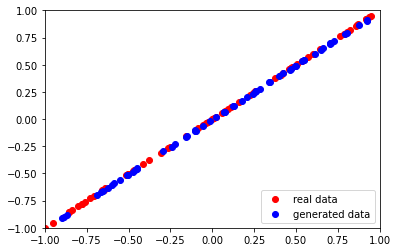

4/4 [==============================] - 0s 2ms/step
Epoch:  5420  Generator Loss:  [0.8214211463928223, 0.0703125]  Discriminator Loss:  [0.67621523 0.484375  ]
2/2 [==============================] - 0s 3ms/step


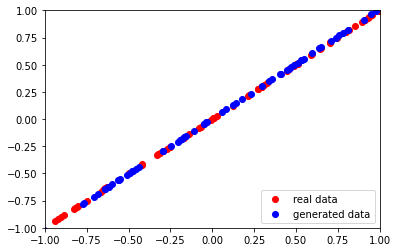

4/4 [==============================] - 0s 2ms/step
Epoch:  5430  Generator Loss:  [0.8014611005783081, 0.0234375]  Discriminator Loss:  [0.68058431 0.49609375]
2/2 [==============================] - 0s 3ms/step


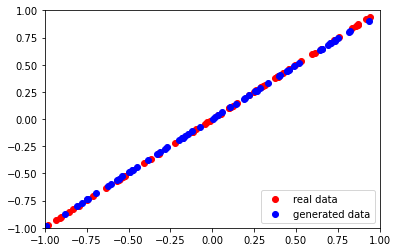

4/4 [==============================] - 0s 2ms/step
Epoch:  5440  Generator Loss:  [0.8135929703712463, 0.0078125]  Discriminator Loss:  [0.68476412 0.5       ]
2/2 [==============================] - 0s 4ms/step


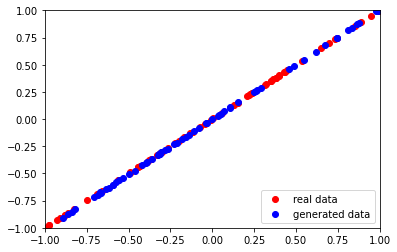

4/4 [==============================] - 0s 4ms/step
Epoch:  5450  Generator Loss:  [0.8093538284301758, 0.0234375]  Discriminator Loss:  [0.6826455  0.48828125]
2/2 [==============================] - 0s 5ms/step


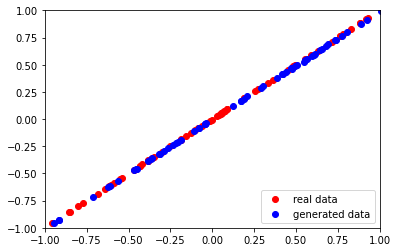

4/4 [==============================] - 0s 2ms/step
Epoch:  5460  Generator Loss:  [0.8220350742340088, 0.0]  Discriminator Loss:  [0.6773577  0.49609375]
2/2 [==============================] - 0s 3ms/step


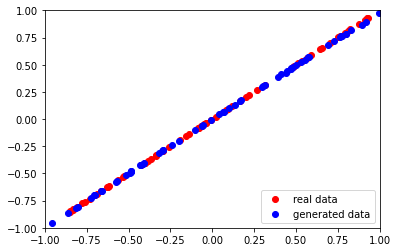

4/4 [==============================] - 0s 2ms/step
Epoch:  5470  Generator Loss:  [0.813241720199585, 0.0078125]  Discriminator Loss:  [0.67978668 0.5       ]
2/2 [==============================] - 0s 3ms/step


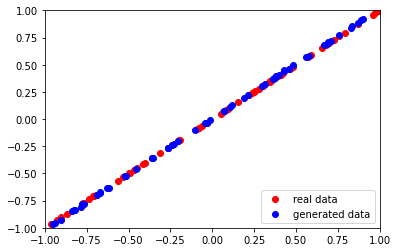

4/4 [==============================] - 0s 2ms/step
Epoch:  5480  Generator Loss:  [0.8122302293777466, 0.0546875]  Discriminator Loss:  [0.67953223 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


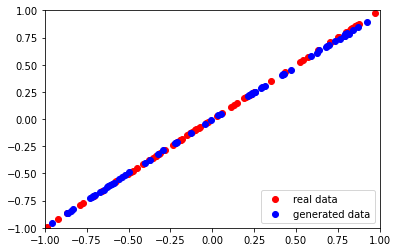

4/4 [==============================] - 0s 2ms/step
Epoch:  5490  Generator Loss:  [0.8159885406494141, 0.0234375]  Discriminator Loss:  [0.6843645 0.4921875]
2/2 [==============================] - 0s 3ms/step


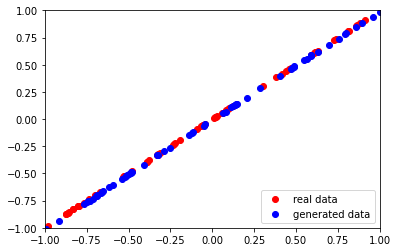

4/4 [==============================] - 0s 2ms/step
Epoch:  5500  Generator Loss:  [0.807205319404602, 0.1171875]  Discriminator Loss:  [0.68087462 0.4609375 ]
2/2 [==============================] - 0s 3ms/step


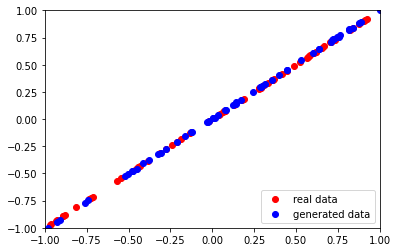

4/4 [==============================] - 0s 2ms/step
Epoch:  5510  Generator Loss:  [0.8079140782356262, 0.046875]  Discriminator Loss:  [0.68503416 0.46484375]
2/2 [==============================] - 0s 4ms/step


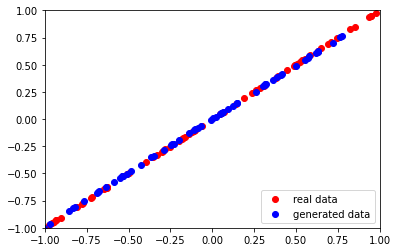

4/4 [==============================] - 0s 2ms/step
Epoch:  5520  Generator Loss:  [0.8215639591217041, 0.0]  Discriminator Loss:  [0.68228549 0.5       ]
2/2 [==============================] - 0s 3ms/step


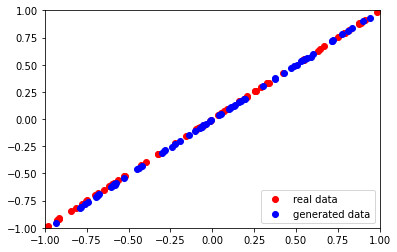

4/4 [==============================] - 0s 2ms/step
Epoch:  5530  Generator Loss:  [0.8501629829406738, 0.0]  Discriminator Loss:  [0.67744526 0.5       ]
2/2 [==============================] - 0s 3ms/step


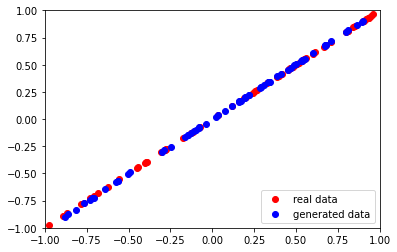

4/4 [==============================] - 0s 2ms/step
Epoch:  5540  Generator Loss:  [0.8112037777900696, 0.0]  Discriminator Loss:  [0.68118319 0.5       ]
2/2 [==============================] - 0s 3ms/step


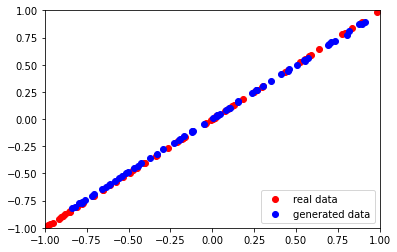

4/4 [==============================] - 0s 2ms/step
Epoch:  5550  Generator Loss:  [0.8085309267044067, 0.0]  Discriminator Loss:  [0.68425983 0.5       ]
2/2 [==============================] - 0s 3ms/step


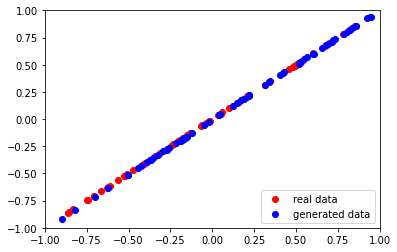

4/4 [==============================] - 0s 2ms/step
Epoch:  5560  Generator Loss:  [0.808134913444519, 0.0]  Discriminator Loss:  [0.68452445 0.5       ]
2/2 [==============================] - 0s 3ms/step


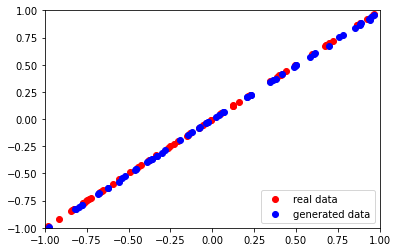

4/4 [==============================] - 0s 2ms/step
Epoch:  5570  Generator Loss:  [0.8215055465698242, 0.0]  Discriminator Loss:  [0.67723128 0.5       ]
2/2 [==============================] - 0s 3ms/step


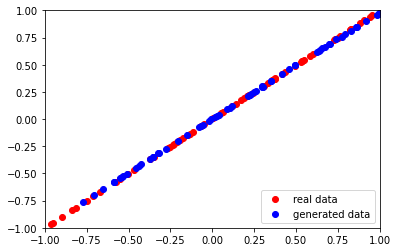

4/4 [==============================] - 0s 2ms/step
Epoch:  5580  Generator Loss:  [0.8111177086830139, 0.015625]  Discriminator Loss:  [0.68015951 0.49609375]
2/2 [==============================] - 0s 4ms/step


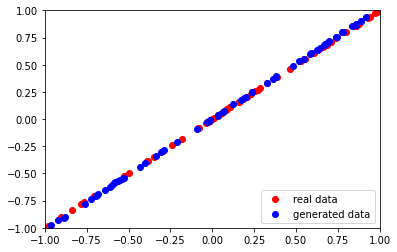

4/4 [==============================] - 0s 2ms/step
Epoch:  5590  Generator Loss:  [0.8171459436416626, 0.0234375]  Discriminator Loss:  [0.68373173 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


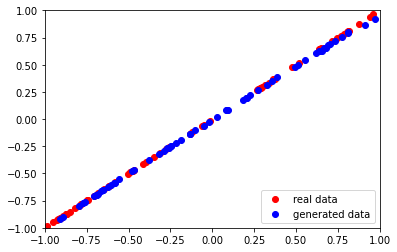

4/4 [==============================] - 0s 2ms/step
Epoch:  5600  Generator Loss:  [0.8282725811004639, 0.0]  Discriminator Loss:  [0.67829505 0.49609375]
2/2 [==============================] - 0s 3ms/step


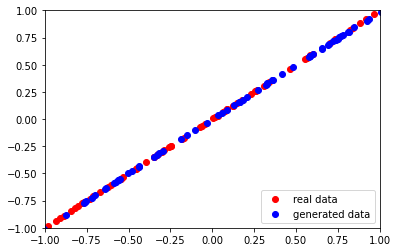

4/4 [==============================] - 0s 3ms/step
Epoch:  5610  Generator Loss:  [0.8233701586723328, 0.0]  Discriminator Loss:  [0.68017015 0.5       ]
2/2 [==============================] - 0s 4ms/step


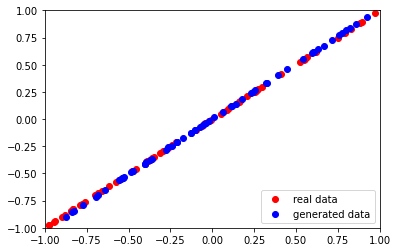

4/4 [==============================] - 0s 2ms/step
Epoch:  5620  Generator Loss:  [0.8108968734741211, 0.0234375]  Discriminator Loss:  [0.68266535 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


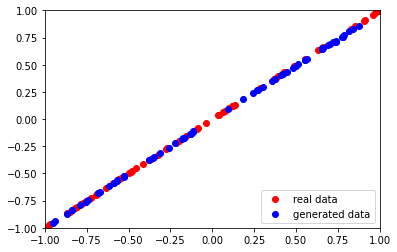

4/4 [==============================] - 0s 2ms/step
Epoch:  5630  Generator Loss:  [0.816082239151001, 0.0]  Discriminator Loss:  [0.68164456 0.5       ]
2/2 [==============================] - 0s 3ms/step


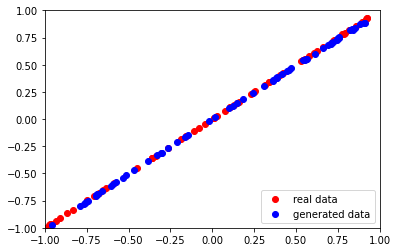

4/4 [==============================] - 0s 2ms/step
Epoch:  5640  Generator Loss:  [0.8268741369247437, 0.0]  Discriminator Loss:  [0.67816672 0.49609375]
2/2 [==============================] - 0s 3ms/step


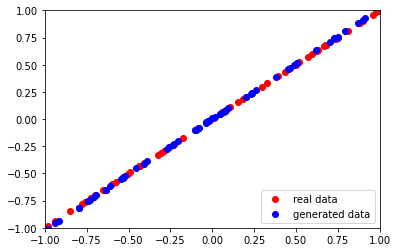

4/4 [==============================] - 0s 2ms/step
Epoch:  5650  Generator Loss:  [0.8066160678863525, 0.0234375]  Discriminator Loss:  [0.68217558 0.484375  ]
2/2 [==============================] - 0s 3ms/step


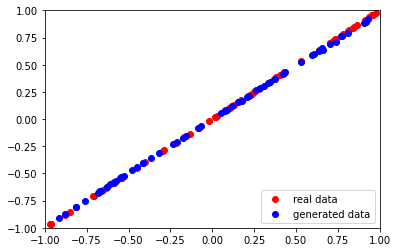

4/4 [==============================] - 0s 2ms/step
Epoch:  5660  Generator Loss:  [0.8129047155380249, 0.015625]  Discriminator Loss:  [0.68442228 0.4921875 ]
2/2 [==============================] - 0s 4ms/step


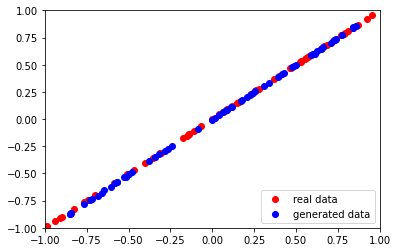

4/4 [==============================] - 0s 2ms/step
Epoch:  5670  Generator Loss:  [0.807610034942627, 0.03125]  Discriminator Loss:  [0.6785284 0.484375 ]
2/2 [==============================] - 0s 4ms/step


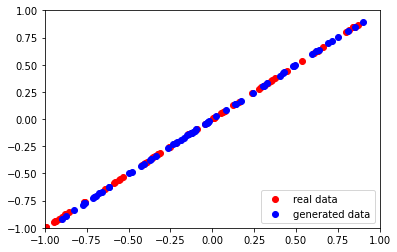

4/4 [==============================] - 0s 2ms/step
Epoch:  5680  Generator Loss:  [0.8077887892723083, 0.015625]  Discriminator Loss:  [0.67863718 0.484375  ]
2/2 [==============================] - 0s 3ms/step


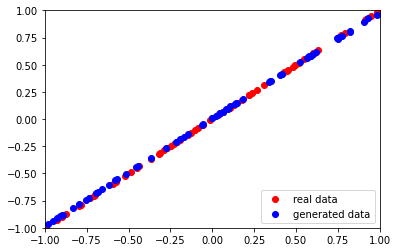

4/4 [==============================] - 0s 2ms/step
Epoch:  5690  Generator Loss:  [0.8252255320549011, 0.0]  Discriminator Loss:  [0.68516734 0.5       ]
2/2 [==============================] - 0s 4ms/step


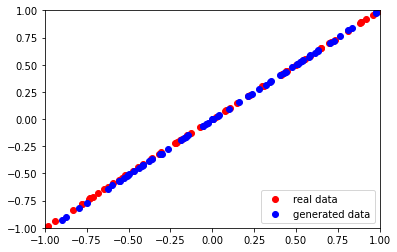

4/4 [==============================] - 0s 2ms/step
Epoch:  5700  Generator Loss:  [0.8188707232475281, 0.0]  Discriminator Loss:  [0.67942497 0.5       ]
2/2 [==============================] - 0s 3ms/step


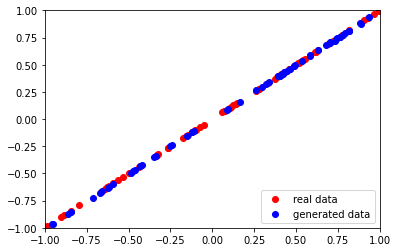

4/4 [==============================] - 0s 2ms/step
Epoch:  5710  Generator Loss:  [0.8277560472488403, 0.0]  Discriminator Loss:  [0.67670262 0.5       ]
2/2 [==============================] - 0s 3ms/step


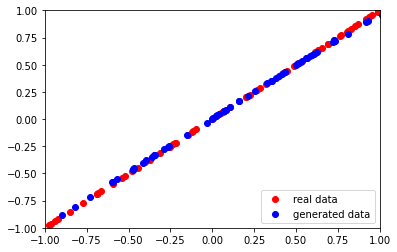

4/4 [==============================] - 0s 3ms/step
Epoch:  5720  Generator Loss:  [0.8067964315414429, 0.0]  Discriminator Loss:  [0.68223539 0.5       ]
2/2 [==============================] - 0s 4ms/step


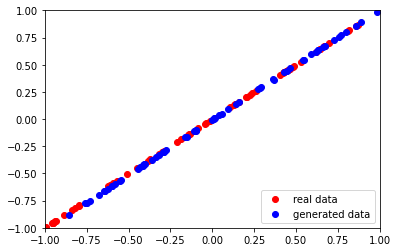

4/4 [==============================] - 0s 2ms/step
Epoch:  5730  Generator Loss:  [0.8095551133155823, 0.015625]  Discriminator Loss:  [0.68728861 0.5       ]
2/2 [==============================] - 0s 3ms/step


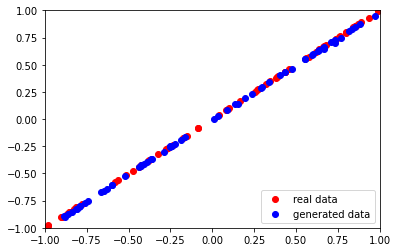

4/4 [==============================] - 0s 2ms/step
Epoch:  5740  Generator Loss:  [0.8258698582649231, 0.0]  Discriminator Loss:  [0.67691717 0.5       ]
2/2 [==============================] - 0s 4ms/step


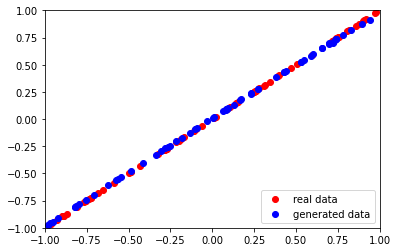

4/4 [==============================] - 0s 2ms/step
Epoch:  5750  Generator Loss:  [0.8084031343460083, 0.0]  Discriminator Loss:  [0.68470338 0.5       ]
2/2 [==============================] - 0s 3ms/step


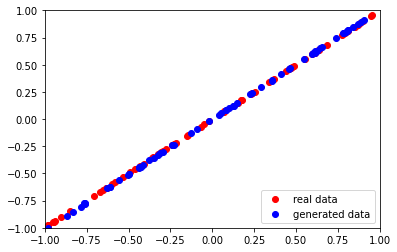

4/4 [==============================] - 0s 2ms/step
Epoch:  5760  Generator Loss:  [0.8184620141983032, 0.0]  Discriminator Loss:  [0.68386135 0.5       ]
2/2 [==============================] - 0s 3ms/step


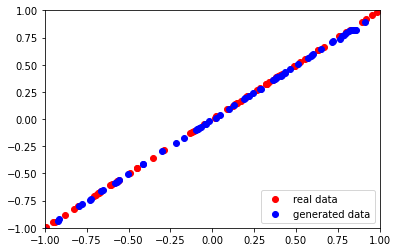

4/4 [==============================] - 0s 2ms/step
Epoch:  5770  Generator Loss:  [0.8170721530914307, 0.0078125]  Discriminator Loss:  [0.68023318 0.49609375]
2/2 [==============================] - 0s 3ms/step


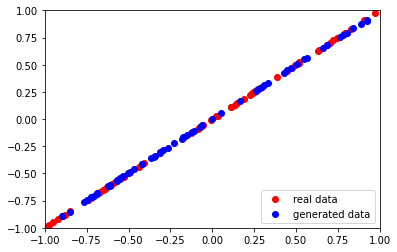

4/4 [==============================] - 0s 2ms/step
Epoch:  5780  Generator Loss:  [0.8123686909675598, 0.0]  Discriminator Loss:  [0.68090144 0.5       ]
2/2 [==============================] - 0s 3ms/step


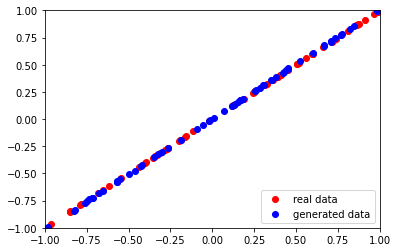

4/4 [==============================] - 0s 2ms/step
Epoch:  5790  Generator Loss:  [0.8036890029907227, 0.03125]  Discriminator Loss:  [0.69002929 0.46875   ]
2/2 [==============================] - 0s 4ms/step


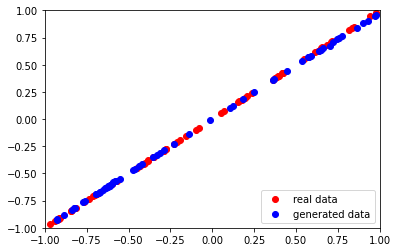

4/4 [==============================] - 0s 2ms/step
Epoch:  5800  Generator Loss:  [0.8065105080604553, 0.015625]  Discriminator Loss:  [0.68414211 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


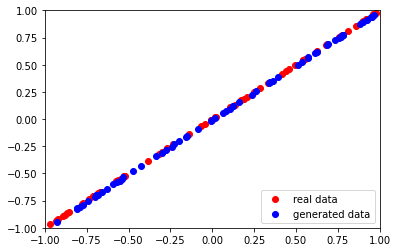

4/4 [==============================] - 0s 2ms/step
Epoch:  5810  Generator Loss:  [0.8127692937850952, 0.046875]  Discriminator Loss:  [0.67768529 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


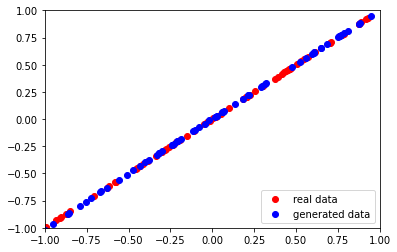

4/4 [==============================] - 0s 2ms/step
Epoch:  5820  Generator Loss:  [0.8159811496734619, 0.03125]  Discriminator Loss:  [0.68003809 0.48046875]
2/2 [==============================] - 0s 3ms/step


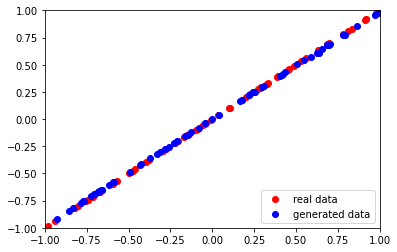

4/4 [==============================] - 0s 2ms/step
Epoch:  5830  Generator Loss:  [0.8270719051361084, 0.0]  Discriminator Loss:  [0.68272156 0.5       ]
2/2 [==============================] - 0s 5ms/step


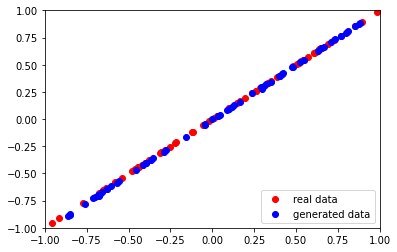

4/4 [==============================] - 0s 2ms/step
Epoch:  5840  Generator Loss:  [0.8092913627624512, 0.0]  Discriminator Loss:  [0.68450367 0.5       ]
2/2 [==============================] - 0s 4ms/step


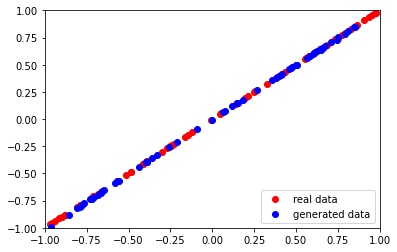

4/4 [==============================] - 0s 2ms/step
Epoch:  5850  Generator Loss:  [0.8172328472137451, 0.0]  Discriminator Loss:  [0.67996812 0.5       ]
2/2 [==============================] - 0s 4ms/step


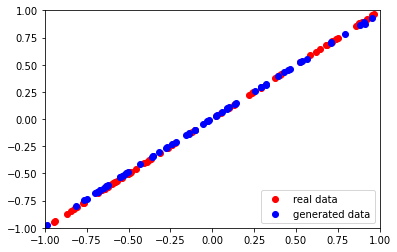

4/4 [==============================] - 0s 2ms/step
Epoch:  5860  Generator Loss:  [0.8175534009933472, 0.0]  Discriminator Loss:  [0.68285772 0.5       ]
2/2 [==============================] - 0s 3ms/step


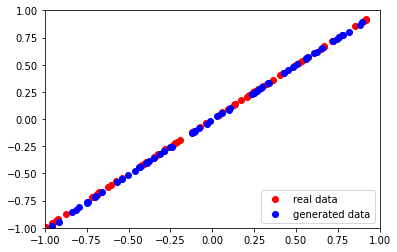

4/4 [==============================] - 0s 2ms/step
Epoch:  5870  Generator Loss:  [0.8148882389068604, 0.0]  Discriminator Loss:  [0.68043122 0.5       ]
2/2 [==============================] - 0s 3ms/step


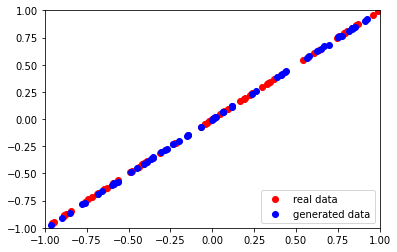

4/4 [==============================] - 0s 2ms/step
Epoch:  5880  Generator Loss:  [0.8180502653121948, 0.0]  Discriminator Loss:  [0.67240402 0.5       ]
2/2 [==============================] - 0s 4ms/step


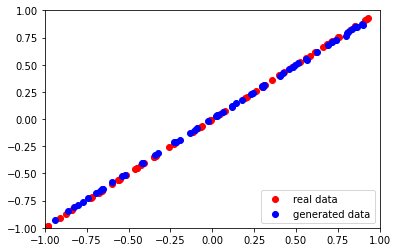

4/4 [==============================] - 0s 2ms/step
Epoch:  5890  Generator Loss:  [0.8280391693115234, 0.0]  Discriminator Loss:  [0.68148196 0.5       ]
2/2 [==============================] - 0s 4ms/step


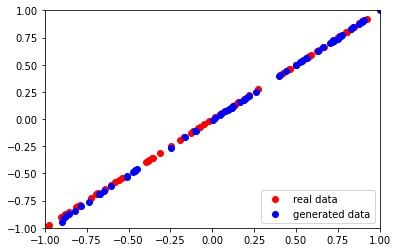

4/4 [==============================] - 0s 2ms/step
Epoch:  5900  Generator Loss:  [0.8228280544281006, 0.0]  Discriminator Loss:  [0.68127164 0.5       ]
2/2 [==============================] - 0s 3ms/step


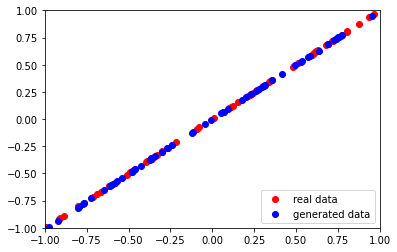

4/4 [==============================] - 0s 3ms/step
Epoch:  5910  Generator Loss:  [0.8139912486076355, 0.0]  Discriminator Loss:  [0.67911717 0.48828125]
2/2 [==============================] - 0s 4ms/step


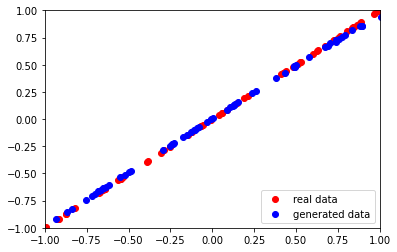

4/4 [==============================] - 0s 2ms/step
Epoch:  5920  Generator Loss:  [0.8018218278884888, 0.0078125]  Discriminator Loss:  [0.68201882 0.49609375]
2/2 [==============================] - 0s 3ms/step


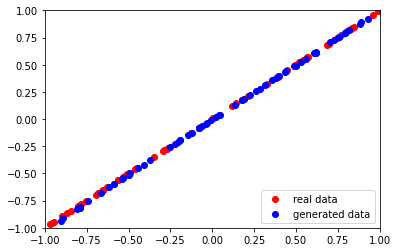

4/4 [==============================] - 0s 2ms/step
Epoch:  5930  Generator Loss:  [0.8006423115730286, 0.03125]  Discriminator Loss:  [0.68291432 0.49609375]
2/2 [==============================] - 0s 4ms/step


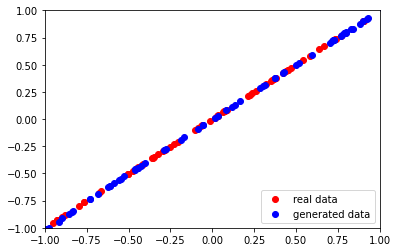

4/4 [==============================] - 0s 2ms/step
Epoch:  5940  Generator Loss:  [0.8097543716430664, 0.015625]  Discriminator Loss:  [0.6773046  0.49609375]
2/2 [==============================] - 0s 3ms/step


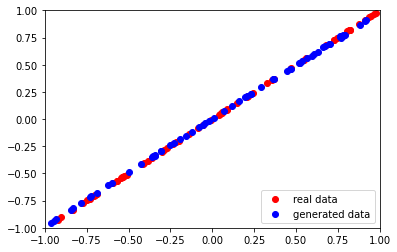

4/4 [==============================] - 0s 2ms/step
Epoch:  5950  Generator Loss:  [0.800434947013855, 0.0]  Discriminator Loss:  [0.68508565 0.49609375]
2/2 [==============================] - 0s 4ms/step


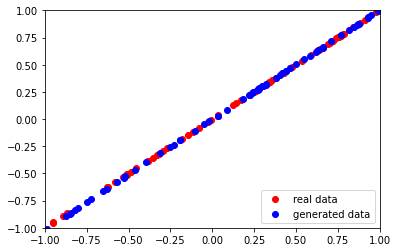

4/4 [==============================] - 0s 2ms/step
Epoch:  5960  Generator Loss:  [0.8039325475692749, 0.0390625]  Discriminator Loss:  [0.68780398 0.46875   ]
2/2 [==============================] - 0s 4ms/step


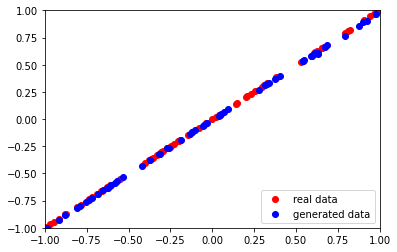

4/4 [==============================] - 0s 5ms/step
Epoch:  5970  Generator Loss:  [0.819882333278656, 0.0]  Discriminator Loss:  [0.67510328 0.5       ]
2/2 [==============================] - 0s 4ms/step


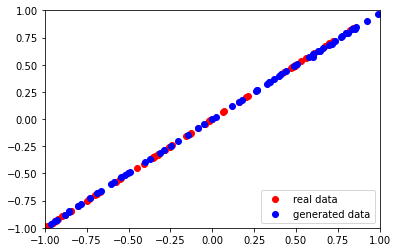

4/4 [==============================] - 0s 2ms/step
Epoch:  5980  Generator Loss:  [0.819523274898529, 0.0]  Discriminator Loss:  [0.68180931 0.5       ]
2/2 [==============================] - 0s 3ms/step


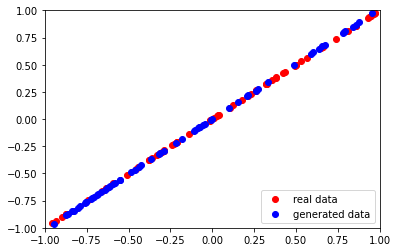

4/4 [==============================] - 0s 2ms/step
Epoch:  5990  Generator Loss:  [0.8100730180740356, 0.0]  Discriminator Loss:  [0.68346575 0.5       ]
2/2 [==============================] - 0s 3ms/step


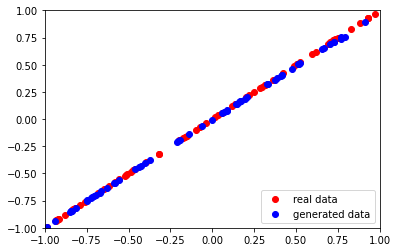

4/4 [==============================] - 0s 2ms/step
Epoch:  6000  Generator Loss:  [0.8215701580047607, 0.0]  Discriminator Loss:  [0.68096748 0.5       ]
2/2 [==============================] - 0s 3ms/step


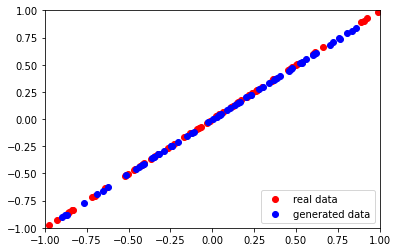

4/4 [==============================] - 0s 2ms/step
Epoch:  6010  Generator Loss:  [0.8094179630279541, 0.0]  Discriminator Loss:  [0.67882529 0.5       ]
2/2 [==============================] - 0s 5ms/step


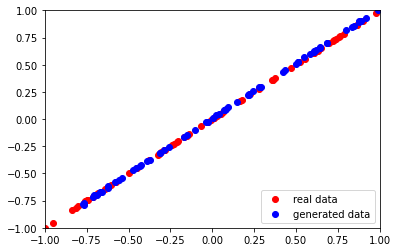

4/4 [==============================] - 0s 2ms/step
Epoch:  6020  Generator Loss:  [0.8124115467071533, 0.0]  Discriminator Loss:  [0.68247461 0.5       ]
2/2 [==============================] - 0s 3ms/step


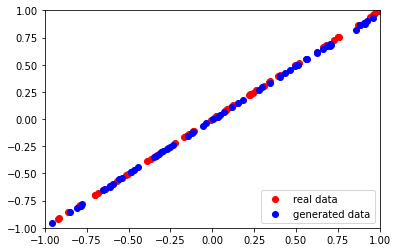

4/4 [==============================] - 0s 2ms/step
Epoch:  6030  Generator Loss:  [0.8136431574821472, 0.0]  Discriminator Loss:  [0.6822356 0.5      ]
2/2 [==============================] - 0s 3ms/step


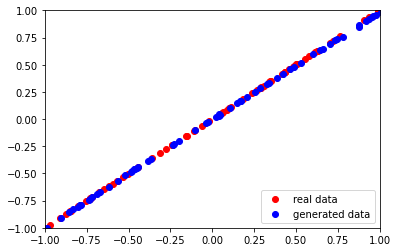

4/4 [==============================] - 0s 2ms/step
Epoch:  6040  Generator Loss:  [0.8155748844146729, 0.0078125]  Discriminator Loss:  [0.68183491 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


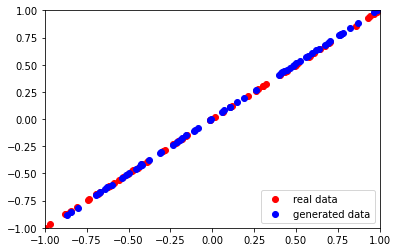

4/4 [==============================] - 0s 2ms/step
Epoch:  6050  Generator Loss:  [0.8118866682052612, 0.0]  Discriminator Loss:  [0.6831435  0.49609375]
2/2 [==============================] - 0s 4ms/step


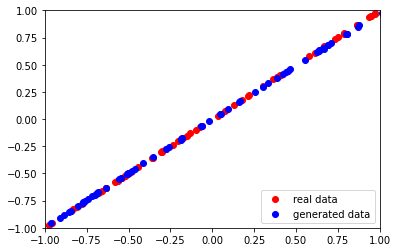

4/4 [==============================] - 0s 2ms/step
Epoch:  6060  Generator Loss:  [0.81165611743927, 0.0]  Discriminator Loss:  [0.68622226 0.5       ]
2/2 [==============================] - 0s 3ms/step


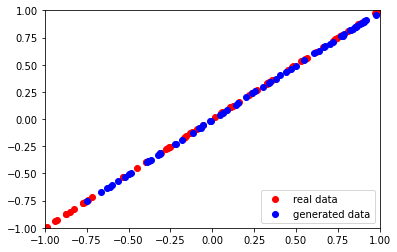

4/4 [==============================] - 0s 4ms/step
Epoch:  6070  Generator Loss:  [0.8103606700897217, 0.0]  Discriminator Loss:  [0.67808467 0.5       ]
2/2 [==============================] - 0s 3ms/step


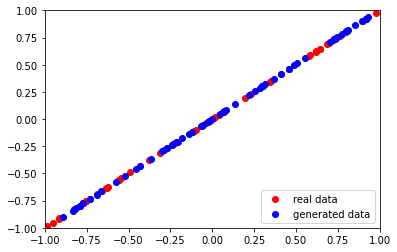

4/4 [==============================] - 0s 2ms/step
Epoch:  6080  Generator Loss:  [0.815627932548523, 0.0]  Discriminator Loss:  [0.6864531 0.4765625]
2/2 [==============================] - 0s 3ms/step


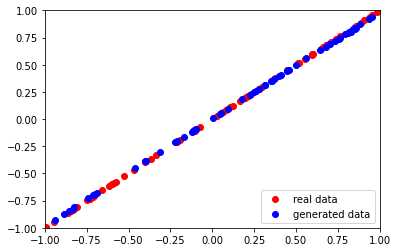

4/4 [==============================] - 0s 2ms/step
Epoch:  6090  Generator Loss:  [0.8121845722198486, 0.0]  Discriminator Loss:  [0.68023443 0.5       ]
2/2 [==============================] - 0s 3ms/step


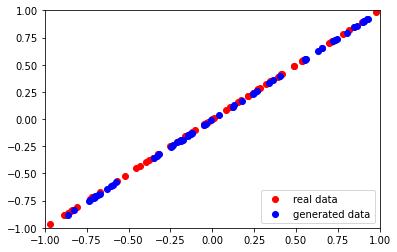

4/4 [==============================] - 0s 2ms/step
Epoch:  6100  Generator Loss:  [0.80962073802948, 0.0]  Discriminator Loss:  [0.68225822 0.5       ]
2/2 [==============================] - 0s 3ms/step


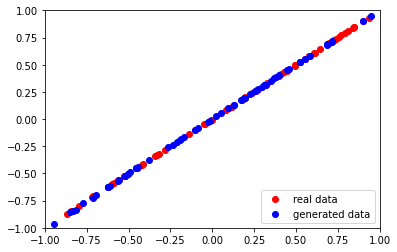

4/4 [==============================] - 0s 2ms/step
Epoch:  6110  Generator Loss:  [0.8199743628501892, 0.0]  Discriminator Loss:  [0.67472804 0.5       ]
2/2 [==============================] - 0s 2ms/step


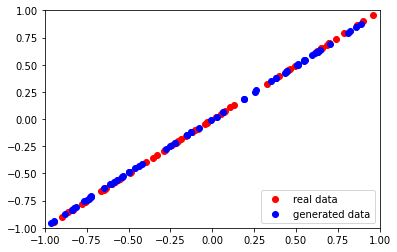

4/4 [==============================] - 0s 2ms/step
Epoch:  6120  Generator Loss:  [0.7996477484703064, 0.0]  Discriminator Loss:  [0.68489245 0.5       ]
2/2 [==============================] - 0s 3ms/step


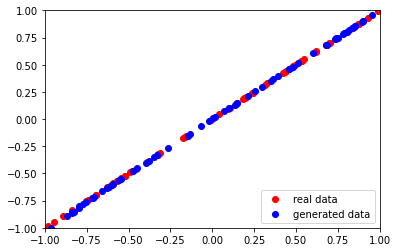

4/4 [==============================] - 0s 2ms/step
Epoch:  6130  Generator Loss:  [0.8004645705223083, 0.0]  Discriminator Loss:  [0.68529445 0.5       ]
2/2 [==============================] - 0s 4ms/step


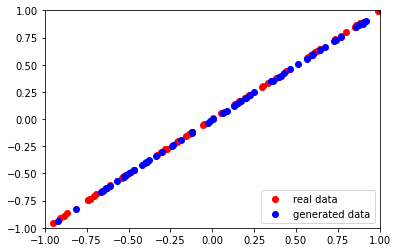

4/4 [==============================] - 0s 2ms/step
Epoch:  6140  Generator Loss:  [0.8251416087150574, 0.0]  Discriminator Loss:  [0.67731637 0.5       ]
2/2 [==============================] - 0s 2ms/step


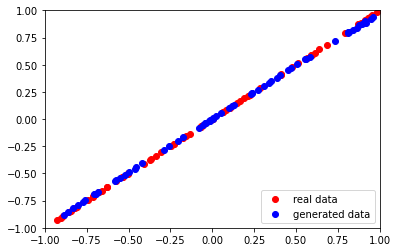

4/4 [==============================] - 0s 2ms/step
Epoch:  6150  Generator Loss:  [0.7954213619232178, 0.0]  Discriminator Loss:  [0.68620744 0.5       ]
2/2 [==============================] - 0s 4ms/step


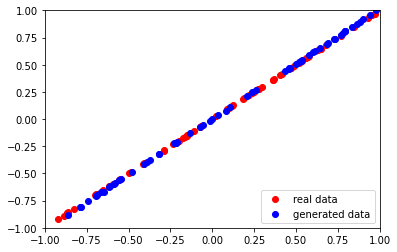

4/4 [==============================] - 0s 2ms/step
Epoch:  6160  Generator Loss:  [0.8031777143478394, 0.0]  Discriminator Loss:  [0.68556631 0.5       ]
2/2 [==============================] - 0s 3ms/step


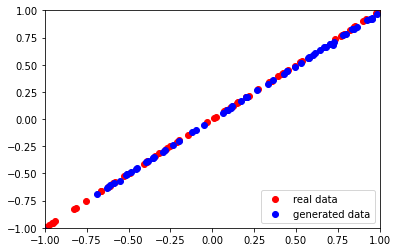

4/4 [==============================] - 0s 2ms/step
Epoch:  6170  Generator Loss:  [0.8188652396202087, 0.0]  Discriminator Loss:  [0.6754199 0.5      ]
2/2 [==============================] - 0s 3ms/step


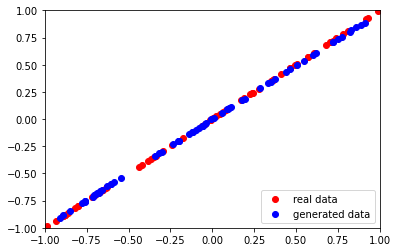

4/4 [==============================] - 0s 2ms/step
Epoch:  6180  Generator Loss:  [0.8073555827140808, 0.0]  Discriminator Loss:  [0.68078029 0.5       ]
2/2 [==============================] - 0s 5ms/step


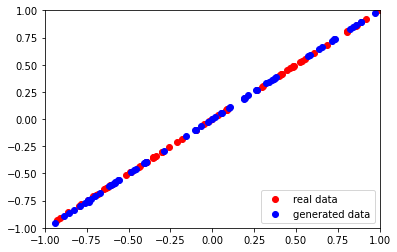

4/4 [==============================] - 0s 2ms/step
Epoch:  6190  Generator Loss:  [0.8090904951095581, 0.0]  Discriminator Loss:  [0.68577224 0.5       ]
2/2 [==============================] - 0s 2ms/step


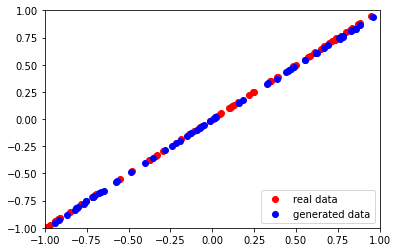

4/4 [==============================] - 0s 2ms/step
Epoch:  6200  Generator Loss:  [0.8413195610046387, 0.0]  Discriminator Loss:  [0.67344207 0.5       ]
2/2 [==============================] - 0s 3ms/step


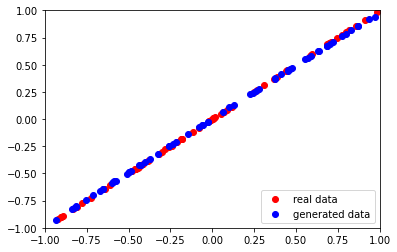

4/4 [==============================] - 0s 3ms/step
Epoch:  6210  Generator Loss:  [0.8062373399734497, 0.0]  Discriminator Loss:  [0.68434599 0.5       ]
2/2 [==============================] - 0s 3ms/step


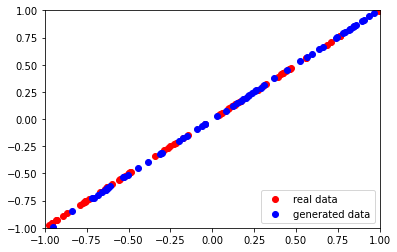

4/4 [==============================] - 0s 2ms/step
Epoch:  6220  Generator Loss:  [0.802424430847168, 0.0]  Discriminator Loss:  [0.68532467 0.5       ]
2/2 [==============================] - 0s 4ms/step


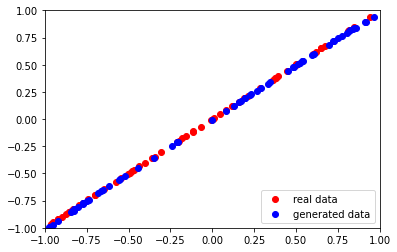

4/4 [==============================] - 0s 3ms/step
Epoch:  6230  Generator Loss:  [0.8343772888183594, 0.0]  Discriminator Loss:  [0.67167005 0.5       ]
2/2 [==============================] - 0s 3ms/step


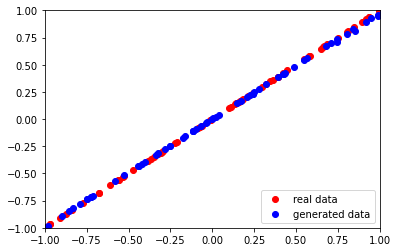

4/4 [==============================] - 0s 2ms/step
Epoch:  6240  Generator Loss:  [0.7905492782592773, 0.0078125]  Discriminator Loss:  [0.68199554 0.5       ]
2/2 [==============================] - 0s 2ms/step


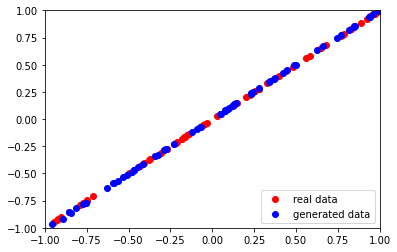

4/4 [==============================] - 0s 2ms/step
Epoch:  6250  Generator Loss:  [0.7942409515380859, 0.015625]  Discriminator Loss:  [0.68620029 0.48828125]
2/2 [==============================] - 0s 3ms/step


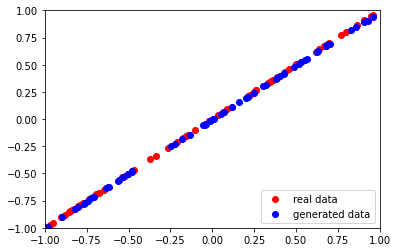

4/4 [==============================] - 0s 2ms/step
Epoch:  6260  Generator Loss:  [0.8216481804847717, 0.0]  Discriminator Loss:  [0.67921498 0.49609375]
2/2 [==============================] - 0s 4ms/step


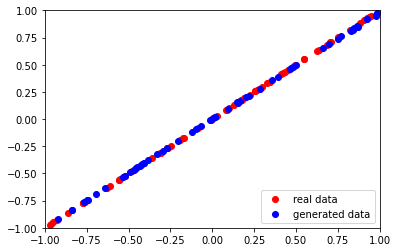

4/4 [==============================] - 0s 2ms/step
Epoch:  6270  Generator Loss:  [0.8046966791152954, 0.0]  Discriminator Loss:  [0.68381208 0.5       ]
2/2 [==============================] - 0s 3ms/step


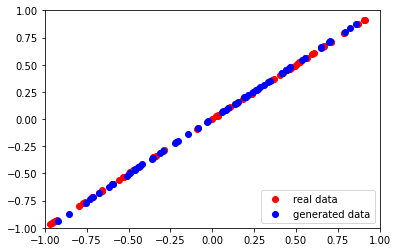

4/4 [==============================] - 0s 2ms/step
Epoch:  6280  Generator Loss:  [0.8080213069915771, 0.0]  Discriminator Loss:  [0.6901786 0.5      ]
2/2 [==============================] - 0s 3ms/step


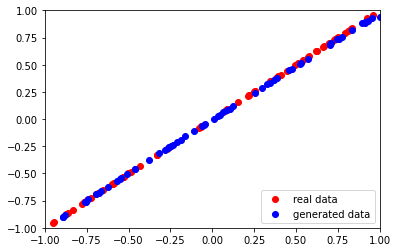

4/4 [==============================] - 0s 2ms/step
Epoch:  6290  Generator Loss:  [0.8210338950157166, 0.0]  Discriminator Loss:  [0.68154362 0.5       ]
2/2 [==============================] - 0s 3ms/step


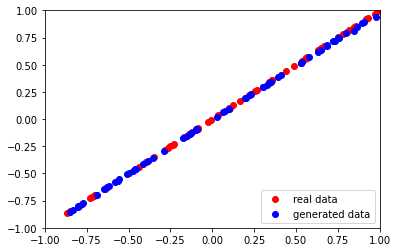

4/4 [==============================] - 0s 2ms/step
Epoch:  6300  Generator Loss:  [0.7978353500366211, 0.0234375]  Discriminator Loss:  [0.68075737 0.5       ]
2/2 [==============================] - 0s 8ms/step


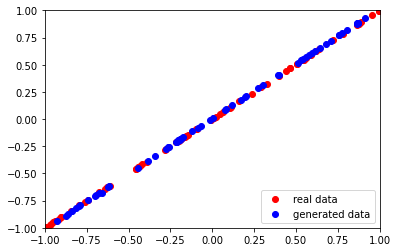

4/4 [==============================] - 0s 2ms/step
Epoch:  6310  Generator Loss:  [0.8079260587692261, 0.015625]  Discriminator Loss:  [0.68866253 0.484375  ]
2/2 [==============================] - 0s 3ms/step


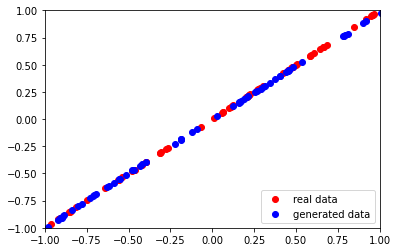

4/4 [==============================] - 0s 2ms/step
Epoch:  6320  Generator Loss:  [0.8281002044677734, 0.0]  Discriminator Loss:  [0.68366128 0.5       ]
2/2 [==============================] - 0s 3ms/step


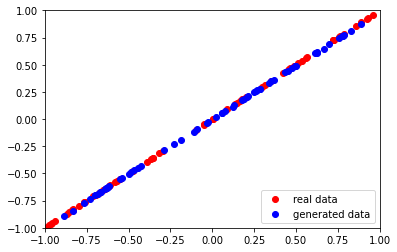

4/4 [==============================] - 0s 2ms/step
Epoch:  6330  Generator Loss:  [0.812244176864624, 0.0]  Discriminator Loss:  [0.68098855 0.49609375]
2/2 [==============================] - 0s 3ms/step


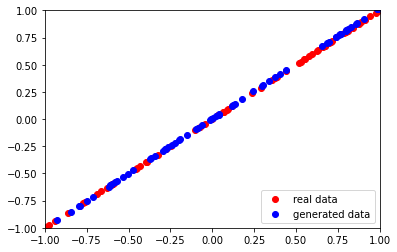

4/4 [==============================] - 0s 2ms/step
Epoch:  6340  Generator Loss:  [0.8156018257141113, 0.0234375]  Discriminator Loss:  [0.68618697 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


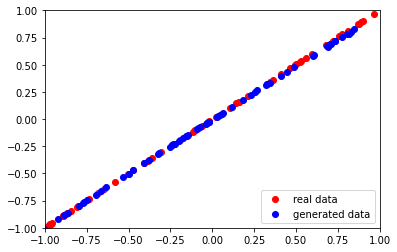

4/4 [==============================] - 0s 2ms/step
Epoch:  6350  Generator Loss:  [0.8226039409637451, 0.0]  Discriminator Loss:  [0.67876676 0.5       ]
2/2 [==============================] - 0s 3ms/step


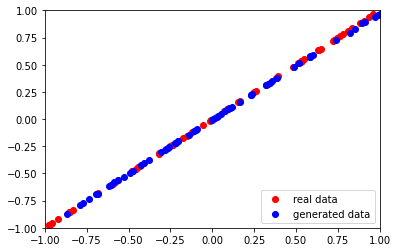

4/4 [==============================] - 0s 2ms/step
Epoch:  6360  Generator Loss:  [0.8047521710395813, 0.0]  Discriminator Loss:  [0.68493435 0.5       ]
2/2 [==============================] - 0s 3ms/step


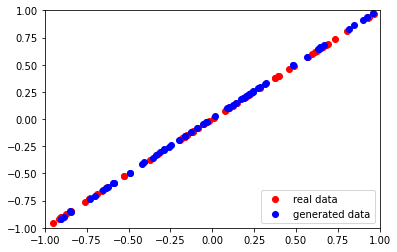

4/4 [==============================] - 0s 2ms/step
Epoch:  6370  Generator Loss:  [0.8102945685386658, 0.0]  Discriminator Loss:  [0.68399727 0.5       ]
2/2 [==============================] - 0s 3ms/step


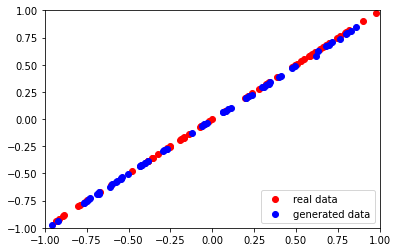

4/4 [==============================] - 0s 3ms/step
Epoch:  6380  Generator Loss:  [0.8036586046218872, 0.0]  Discriminator Loss:  [0.68434879 0.5       ]
2/2 [==============================] - 0s 3ms/step


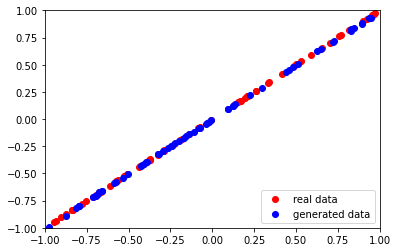

4/4 [==============================] - 0s 2ms/step
Epoch:  6390  Generator Loss:  [0.8050997257232666, 0.0078125]  Discriminator Loss:  [0.67962718 0.5       ]
2/2 [==============================] - 0s 3ms/step


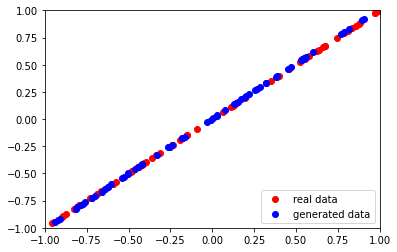

4/4 [==============================] - 0s 2ms/step
Epoch:  6400  Generator Loss:  [0.8074134588241577, 0.0]  Discriminator Loss:  [0.68741742 0.484375  ]
2/2 [==============================] - 0s 3ms/step


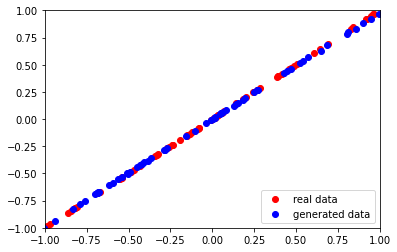

4/4 [==============================] - 0s 2ms/step
Epoch:  6410  Generator Loss:  [0.8203125, 0.0]  Discriminator Loss:  [0.68668997 0.5       ]
2/2 [==============================] - 0s 3ms/step


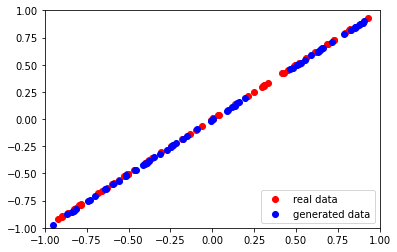

4/4 [==============================] - 0s 2ms/step
Epoch:  6420  Generator Loss:  [0.8197768330574036, 0.0]  Discriminator Loss:  [0.67882743 0.5       ]
2/2 [==============================] - 0s 3ms/step


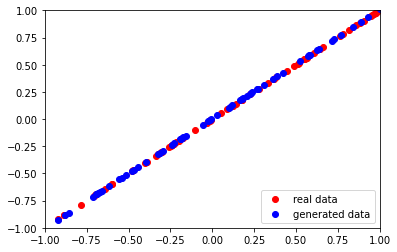

4/4 [==============================] - 0s 2ms/step
Epoch:  6430  Generator Loss:  [0.8164806365966797, 0.0]  Discriminator Loss:  [0.68145248 0.5       ]
2/2 [==============================] - 0s 3ms/step


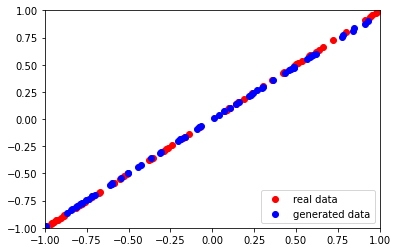

4/4 [==============================] - 0s 2ms/step
Epoch:  6440  Generator Loss:  [0.8066165447235107, 0.0]  Discriminator Loss:  [0.68486375 0.5       ]
2/2 [==============================] - 0s 3ms/step


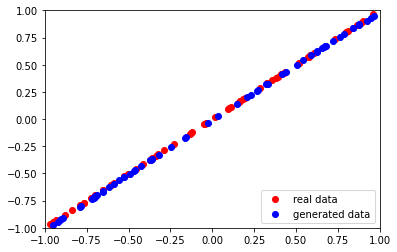

4/4 [==============================] - 0s 2ms/step
Epoch:  6450  Generator Loss:  [0.8145931959152222, 0.015625]  Discriminator Loss:  [0.6796588  0.48828125]
2/2 [==============================] - 0s 3ms/step


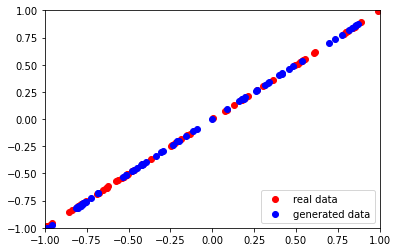

4/4 [==============================] - 0s 2ms/step
Epoch:  6460  Generator Loss:  [0.8042158484458923, 0.03125]  Discriminator Loss:  [0.6829311 0.484375 ]
2/2 [==============================] - 0s 3ms/step


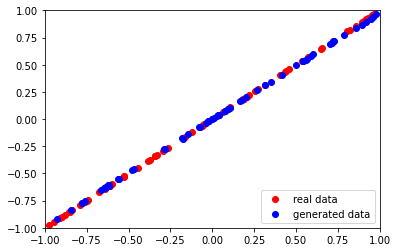

4/4 [==============================] - 0s 2ms/step
Epoch:  6470  Generator Loss:  [0.807614803314209, 0.0]  Discriminator Loss:  [0.68469387 0.5       ]
2/2 [==============================] - 0s 3ms/step


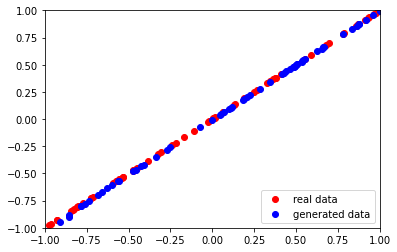

4/4 [==============================] - 0s 2ms/step
Epoch:  6480  Generator Loss:  [0.808448851108551, 0.015625]  Discriminator Loss:  [0.67974705 0.49609375]
2/2 [==============================] - 0s 3ms/step


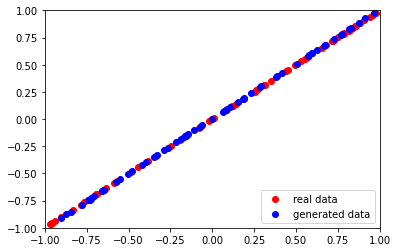

4/4 [==============================] - 0s 3ms/step
Epoch:  6490  Generator Loss:  [0.8049033880233765, 0.0]  Discriminator Loss:  [0.68743908 0.48828125]
2/2 [==============================] - 0s 4ms/step


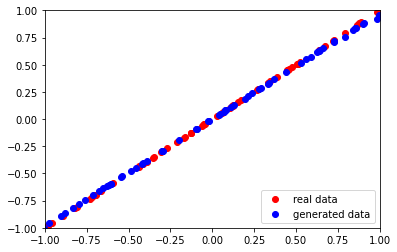

4/4 [==============================] - 0s 2ms/step
Epoch:  6500  Generator Loss:  [0.8166003227233887, 0.0]  Discriminator Loss:  [0.68153617 0.5       ]
2/2 [==============================] - 0s 3ms/step


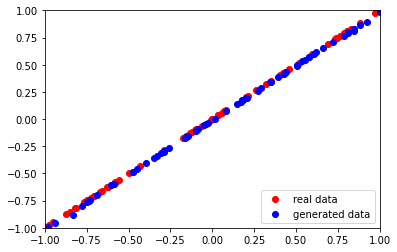

4/4 [==============================] - 0s 2ms/step
Epoch:  6510  Generator Loss:  [0.8163952827453613, 0.0078125]  Discriminator Loss:  [0.67752877 0.5       ]
2/2 [==============================] - 0s 4ms/step


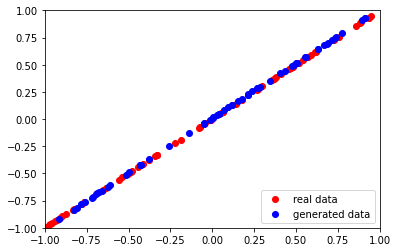

4/4 [==============================] - 0s 2ms/step
Epoch:  6520  Generator Loss:  [0.8210856914520264, 0.0]  Discriminator Loss:  [0.6819379 0.5      ]
2/2 [==============================] - 0s 3ms/step


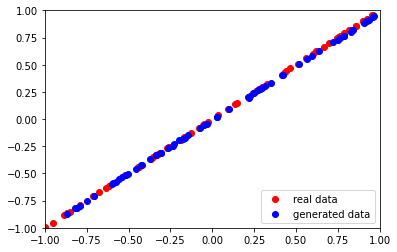

4/4 [==============================] - 0s 2ms/step
Epoch:  6530  Generator Loss:  [0.8170071840286255, 0.0]  Discriminator Loss:  [0.68290976 0.5       ]
2/2 [==============================] - 0s 3ms/step


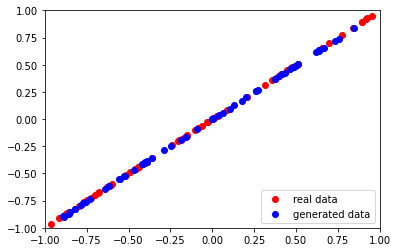

4/4 [==============================] - 0s 2ms/step
Epoch:  6540  Generator Loss:  [0.8060463070869446, 0.0234375]  Discriminator Loss:  [0.68168437 0.47265625]
2/2 [==============================] - 0s 3ms/step


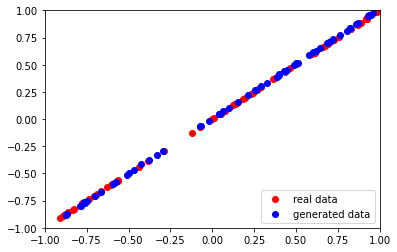

4/4 [==============================] - 0s 2ms/step
Epoch:  6550  Generator Loss:  [0.8086191415786743, 0.0078125]  Discriminator Loss:  [0.68594727 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


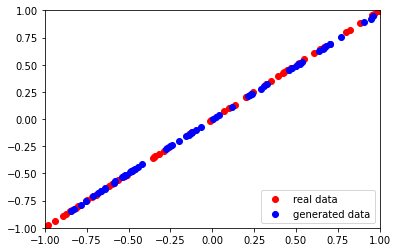

4/4 [==============================] - 0s 2ms/step
Epoch:  6560  Generator Loss:  [0.8121570944786072, 0.0]  Discriminator Loss:  [0.68360832 0.5       ]
2/2 [==============================] - 0s 3ms/step


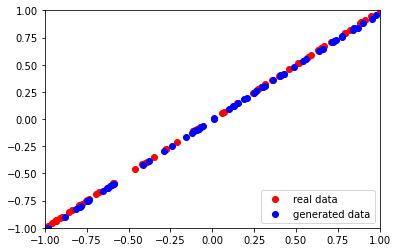

4/4 [==============================] - 0s 2ms/step
Epoch:  6570  Generator Loss:  [0.8276704549789429, 0.0]  Discriminator Loss:  [0.6799106 0.5      ]
2/2 [==============================] - 0s 3ms/step


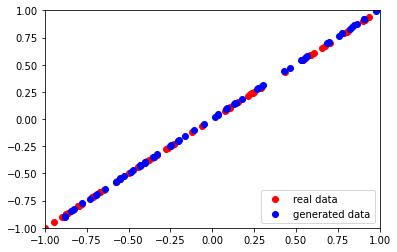

4/4 [==============================] - 0s 2ms/step
Epoch:  6580  Generator Loss:  [0.8132498264312744, 0.0]  Discriminator Loss:  [0.68765861 0.5       ]
2/2 [==============================] - 0s 3ms/step


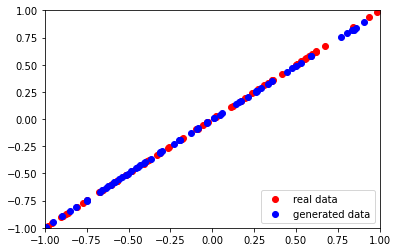

4/4 [==============================] - 0s 2ms/step
Epoch:  6590  Generator Loss:  [0.823252260684967, 0.0]  Discriminator Loss:  [0.68402091 0.5       ]
2/2 [==============================] - 0s 3ms/step


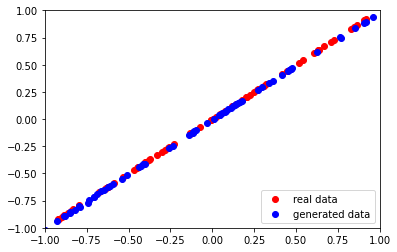

4/4 [==============================] - 0s 2ms/step
Epoch:  6600  Generator Loss:  [0.8129131197929382, 0.0]  Discriminator Loss:  [0.67820197 0.5       ]
2/2 [==============================] - 0s 4ms/step


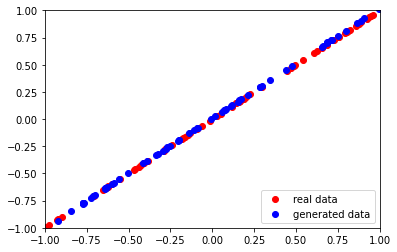

4/4 [==============================] - 0s 2ms/step
Epoch:  6610  Generator Loss:  [0.811931312084198, 0.0]  Discriminator Loss:  [0.6828678 0.5      ]
2/2 [==============================] - 0s 3ms/step


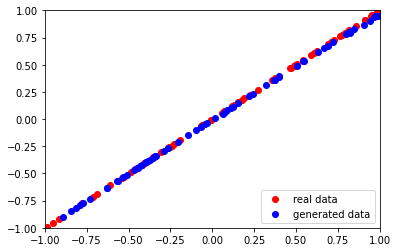

4/4 [==============================] - 0s 2ms/step
Epoch:  6620  Generator Loss:  [0.812224268913269, 0.0]  Discriminator Loss:  [0.67978385 0.5       ]
2/2 [==============================] - 0s 4ms/step


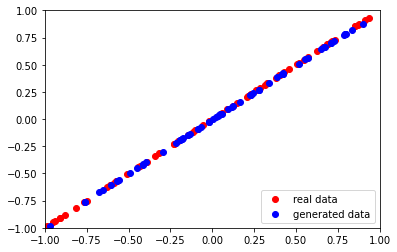

4/4 [==============================] - 0s 2ms/step
Epoch:  6630  Generator Loss:  [0.7992199063301086, 0.0]  Discriminator Loss:  [0.67987078 0.5       ]
2/2 [==============================] - 0s 3ms/step


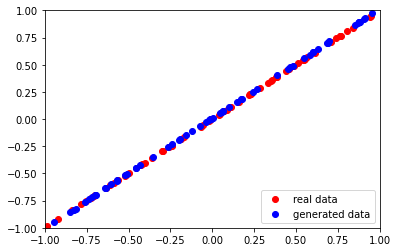

4/4 [==============================] - 0s 2ms/step
Epoch:  6640  Generator Loss:  [0.8100006580352783, 0.0]  Discriminator Loss:  [0.68512198 0.5       ]
2/2 [==============================] - 0s 4ms/step


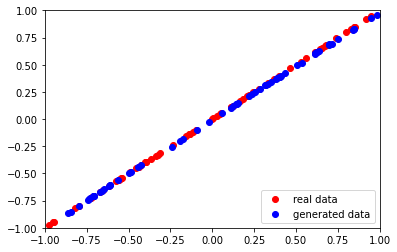

4/4 [==============================] - 0s 2ms/step
Epoch:  6650  Generator Loss:  [0.8058050870895386, 0.0]  Discriminator Loss:  [0.68835312 0.5       ]
2/2 [==============================] - 0s 3ms/step


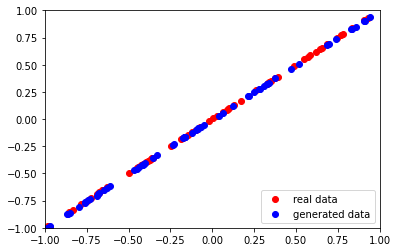

4/4 [==============================] - 0s 2ms/step
Epoch:  6660  Generator Loss:  [0.8126637935638428, 0.0]  Discriminator Loss:  [0.67964154 0.5       ]
2/2 [==============================] - 0s 3ms/step


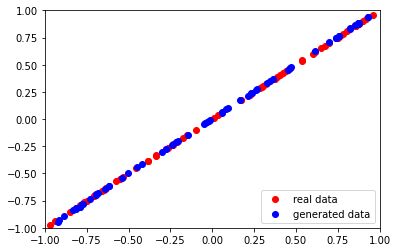

4/4 [==============================] - 0s 2ms/step
Epoch:  6670  Generator Loss:  [0.8062557578086853, 0.0234375]  Discriminator Loss:  [0.68662277 0.484375  ]
2/2 [==============================] - 0s 3ms/step


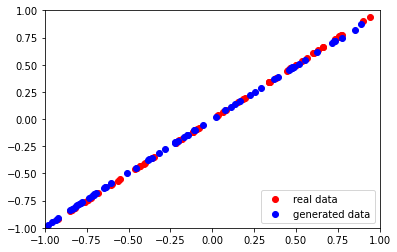

4/4 [==============================] - 0s 2ms/step
Epoch:  6680  Generator Loss:  [0.8218592405319214, 0.0]  Discriminator Loss:  [0.68203971 0.5       ]
2/2 [==============================] - 0s 3ms/step


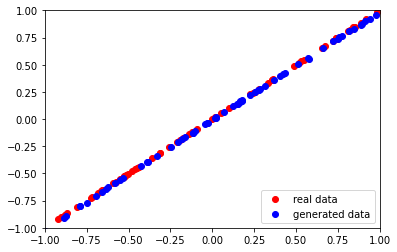

4/4 [==============================] - 0s 2ms/step
Epoch:  6690  Generator Loss:  [0.8159517049789429, 0.0]  Discriminator Loss:  [0.67843246 0.5       ]
2/2 [==============================] - 0s 3ms/step


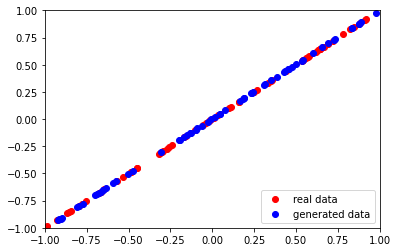

4/4 [==============================] - 0s 2ms/step
Epoch:  6700  Generator Loss:  [0.8133831024169922, 0.0]  Discriminator Loss:  [0.68414053 0.5       ]
2/2 [==============================] - 0s 3ms/step


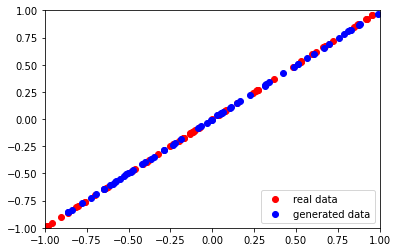

4/4 [==============================] - 0s 2ms/step
Epoch:  6710  Generator Loss:  [0.7976067066192627, 0.0]  Discriminator Loss:  [0.68614569 0.5       ]
2/2 [==============================] - 0s 4ms/step


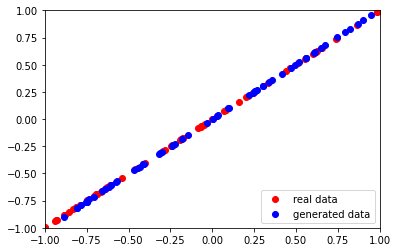

4/4 [==============================] - 0s 2ms/step
Epoch:  6720  Generator Loss:  [0.799994945526123, 0.0]  Discriminator Loss:  [0.6874187 0.5      ]
2/2 [==============================] - 0s 7ms/step


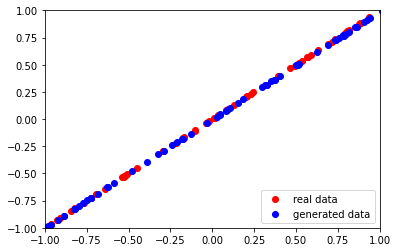

4/4 [==============================] - 0s 2ms/step
Epoch:  6730  Generator Loss:  [0.8118852972984314, 0.0]  Discriminator Loss:  [0.67910826 0.5       ]
2/2 [==============================] - 0s 3ms/step


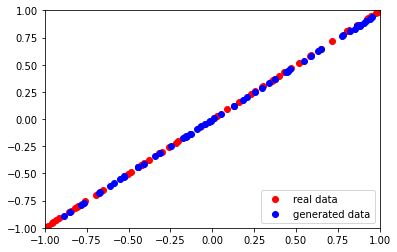

4/4 [==============================] - 0s 2ms/step
Epoch:  6740  Generator Loss:  [0.7857046127319336, 0.0390625]  Discriminator Loss:  [0.68886486 0.48046875]
2/2 [==============================] - 0s 4ms/step


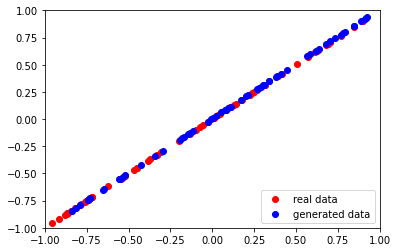

4/4 [==============================] - 0s 2ms/step
Epoch:  6750  Generator Loss:  [0.8069990873336792, 0.0]  Discriminator Loss:  [0.68846655 0.5       ]
2/2 [==============================] - 0s 3ms/step


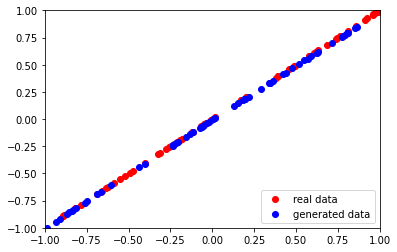

4/4 [==============================] - 0s 2ms/step
Epoch:  6760  Generator Loss:  [0.8165526986122131, 0.0]  Discriminator Loss:  [0.67839476 0.5       ]
2/2 [==============================] - 0s 3ms/step


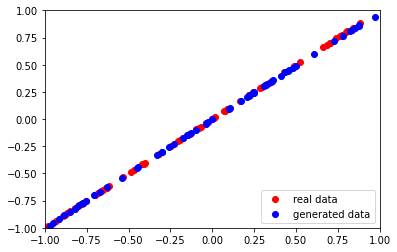

4/4 [==============================] - 0s 2ms/step
Epoch:  6770  Generator Loss:  [0.7976518869400024, 0.0]  Discriminator Loss:  [0.68636438 0.49609375]
2/2 [==============================] - 0s 3ms/step


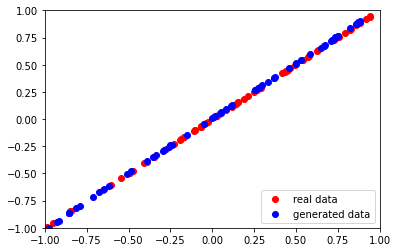

4/4 [==============================] - 0s 2ms/step
Epoch:  6780  Generator Loss:  [0.8184654712677002, 0.0]  Discriminator Loss:  [0.68607873 0.5       ]
2/2 [==============================] - 0s 4ms/step


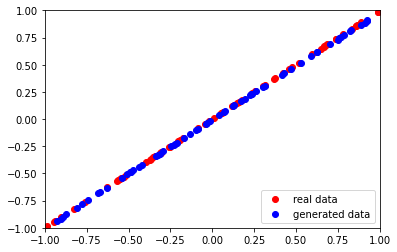

4/4 [==============================] - 0s 2ms/step
Epoch:  6790  Generator Loss:  [0.8081165552139282, 0.0]  Discriminator Loss:  [0.68617728 0.5       ]
2/2 [==============================] - 0s 3ms/step


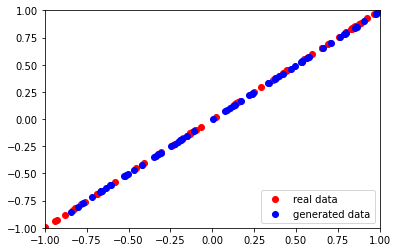

4/4 [==============================] - 0s 2ms/step
Epoch:  6800  Generator Loss:  [0.800927996635437, 0.015625]  Discriminator Loss:  [0.68361294 0.48828125]
2/2 [==============================] - 0s 3ms/step


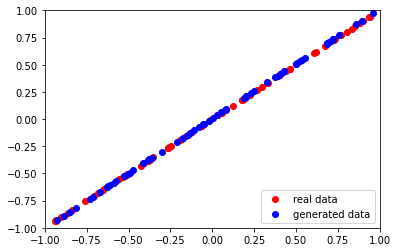

4/4 [==============================] - 0s 2ms/step
Epoch:  6810  Generator Loss:  [0.8084460496902466, 0.0078125]  Discriminator Loss:  [0.68820131 0.49609375]
2/2 [==============================] - 0s 3ms/step


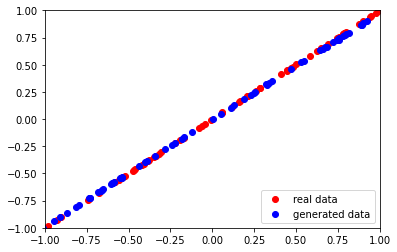

4/4 [==============================] - 0s 2ms/step
Epoch:  6820  Generator Loss:  [0.8144797682762146, 0.0]  Discriminator Loss:  [0.68104306 0.5       ]
2/2 [==============================] - 0s 4ms/step


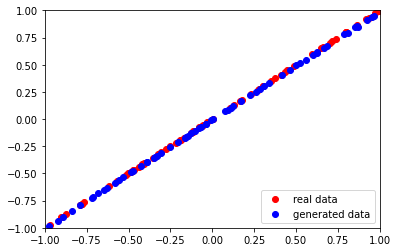

4/4 [==============================] - 0s 2ms/step
Epoch:  6830  Generator Loss:  [0.8085317611694336, 0.0]  Discriminator Loss:  [0.68303436 0.5       ]
2/2 [==============================] - 0s 3ms/step


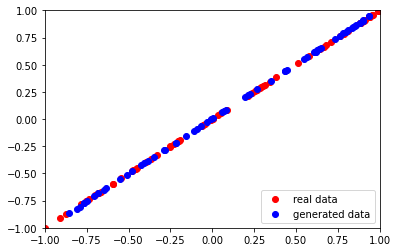

4/4 [==============================] - 0s 2ms/step
Epoch:  6840  Generator Loss:  [0.7971342206001282, 0.0]  Discriminator Loss:  [0.6863037 0.5      ]
2/2 [==============================] - 0s 4ms/step


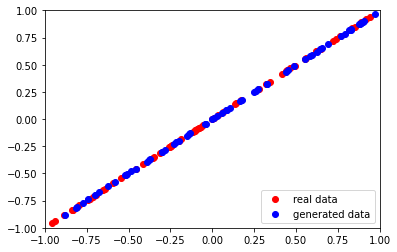

4/4 [==============================] - 0s 2ms/step
Epoch:  6850  Generator Loss:  [0.8031108379364014, 0.0]  Discriminator Loss:  [0.68712279 0.5       ]
2/2 [==============================] - 0s 3ms/step


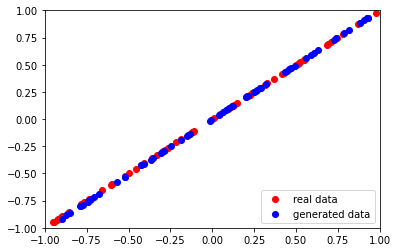

4/4 [==============================] - 0s 2ms/step
Epoch:  6860  Generator Loss:  [0.802619457244873, 0.046875]  Discriminator Loss:  [0.68876877 0.484375  ]
2/2 [==============================] - 0s 3ms/step


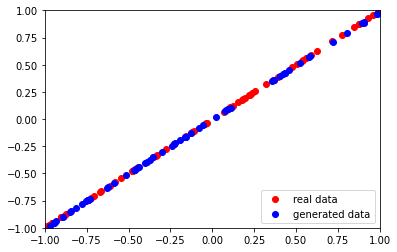

4/4 [==============================] - 0s 2ms/step
Epoch:  6870  Generator Loss:  [0.8213521838188171, 0.0]  Discriminator Loss:  [0.67953977 0.5       ]
2/2 [==============================] - 0s 6ms/step


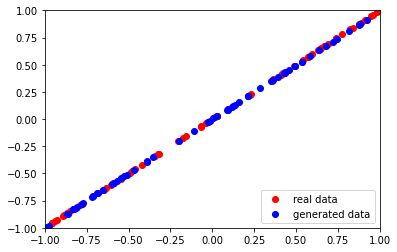

4/4 [==============================] - 0s 2ms/step
Epoch:  6880  Generator Loss:  [0.8013333082199097, 0.0]  Discriminator Loss:  [0.68684882 0.5       ]
2/2 [==============================] - 0s 10ms/step


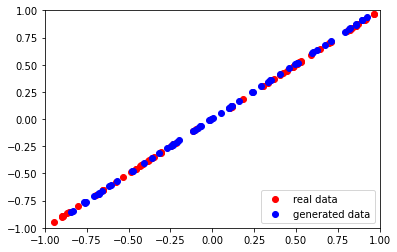

4/4 [==============================] - 0s 2ms/step
Epoch:  6890  Generator Loss:  [0.8116620182991028, 0.0]  Discriminator Loss:  [0.68808088 0.5       ]
2/2 [==============================] - 0s 3ms/step


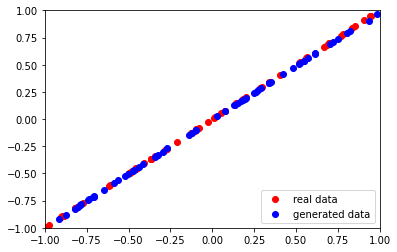

4/4 [==============================] - 0s 2ms/step
Epoch:  6900  Generator Loss:  [0.8193759322166443, 0.0078125]  Discriminator Loss:  [0.67614782 0.49609375]
2/2 [==============================] - 0s 3ms/step


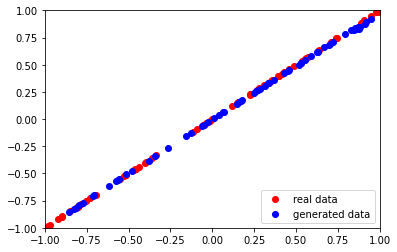

4/4 [==============================] - 0s 2ms/step
Epoch:  6910  Generator Loss:  [0.7917041778564453, 0.0]  Discriminator Loss:  [0.68691635 0.4921875 ]
2/2 [==============================] - 0s 4ms/step


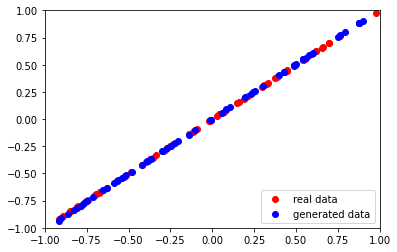

4/4 [==============================] - 0s 2ms/step
Epoch:  6920  Generator Loss:  [0.8202670216560364, 0.0]  Discriminator Loss:  [0.68582767 0.5       ]
2/2 [==============================] - 0s 3ms/step


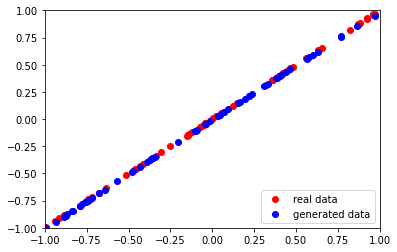

4/4 [==============================] - 0s 2ms/step
Epoch:  6930  Generator Loss:  [0.8318179845809937, 0.0]  Discriminator Loss:  [0.68136573 0.5       ]
2/2 [==============================] - 0s 3ms/step


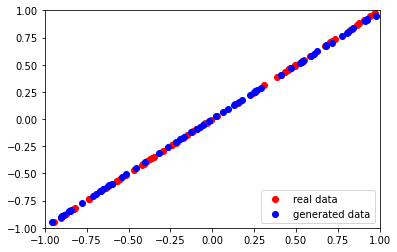

4/4 [==============================] - 0s 3ms/step
Epoch:  6940  Generator Loss:  [0.8010978698730469, 0.0]  Discriminator Loss:  [0.68845075 0.5       ]
2/2 [==============================] - 0s 4ms/step


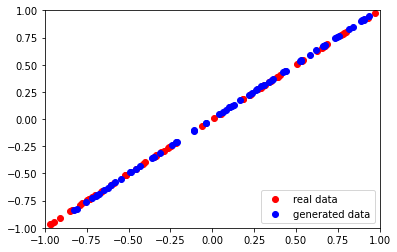

4/4 [==============================] - 0s 2ms/step
Epoch:  6950  Generator Loss:  [0.8137978911399841, 0.0]  Discriminator Loss:  [0.68479598 0.5       ]
2/2 [==============================] - 0s 3ms/step


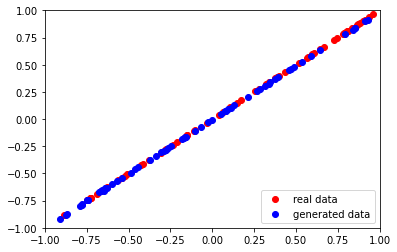

4/4 [==============================] - 0s 2ms/step
Epoch:  6960  Generator Loss:  [0.8104145526885986, 0.0078125]  Discriminator Loss:  [0.67847201 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


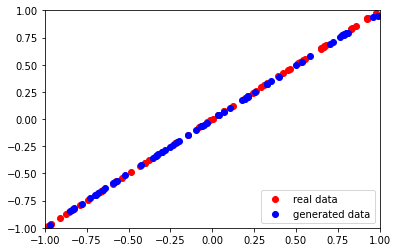

4/4 [==============================] - 0s 2ms/step
Epoch:  6970  Generator Loss:  [0.7836706638336182, 0.0234375]  Discriminator Loss:  [0.69120994 0.5       ]
2/2 [==============================] - 0s 3ms/step


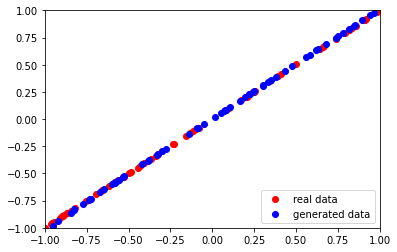

4/4 [==============================] - 0s 2ms/step
Epoch:  6980  Generator Loss:  [0.8217807412147522, 0.0]  Discriminator Loss:  [0.68676829 0.5       ]
2/2 [==============================] - 0s 3ms/step


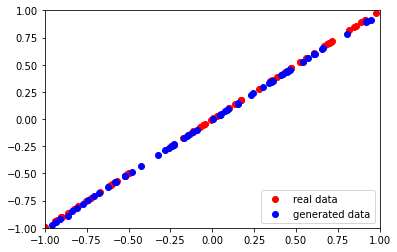

4/4 [==============================] - 0s 2ms/step
Epoch:  6990  Generator Loss:  [0.819441020488739, 0.0]  Discriminator Loss:  [0.67558894 0.5       ]
2/2 [==============================] - 0s 3ms/step


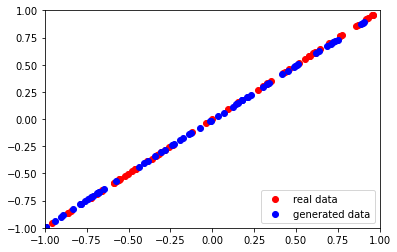

4/4 [==============================] - 0s 2ms/step
Epoch:  7000  Generator Loss:  [0.7949758172035217, 0.0]  Discriminator Loss:  [0.68681246 0.5       ]
2/2 [==============================] - 0s 4ms/step


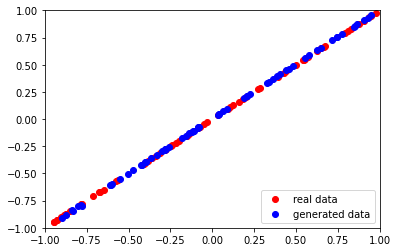

4/4 [==============================] - 0s 2ms/step
Epoch:  7010  Generator Loss:  [0.8058018088340759, 0.0]  Discriminator Loss:  [0.68502748 0.5       ]
2/2 [==============================] - 0s 3ms/step


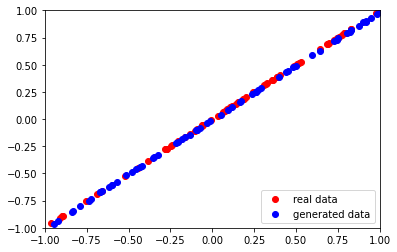

4/4 [==============================] - 0s 4ms/step
Epoch:  7020  Generator Loss:  [0.8150433301925659, 0.0]  Discriminator Loss:  [0.67778006 0.5       ]
2/2 [==============================] - 0s 6ms/step


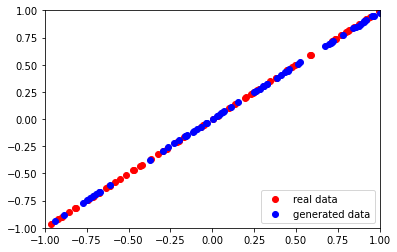

4/4 [==============================] - 0s 2ms/step
Epoch:  7030  Generator Loss:  [0.7971197962760925, 0.0]  Discriminator Loss:  [0.68487448 0.5       ]
2/2 [==============================] - 0s 3ms/step


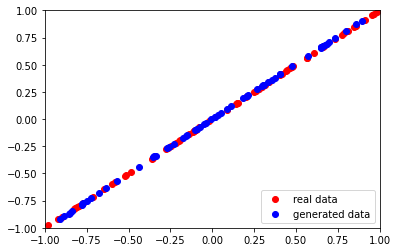

4/4 [==============================] - 0s 2ms/step
Epoch:  7040  Generator Loss:  [0.8178950548171997, 0.0]  Discriminator Loss:  [0.68427896 0.5       ]
2/2 [==============================] - 0s 3ms/step


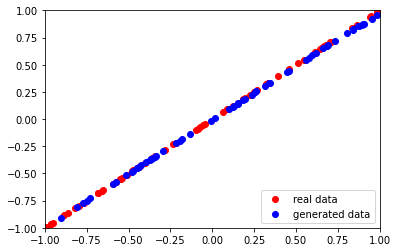

4/4 [==============================] - 0s 2ms/step
Epoch:  7050  Generator Loss:  [0.8271316289901733, 0.0]  Discriminator Loss:  [0.67540795 0.5       ]
2/2 [==============================] - 0s 4ms/step


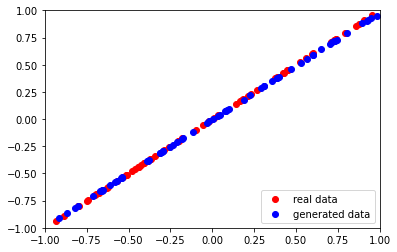

4/4 [==============================] - 0s 2ms/step
Epoch:  7060  Generator Loss:  [0.7826666235923767, 0.015625]  Discriminator Loss:  [0.68642741 0.49609375]
2/2 [==============================] - 0s 3ms/step


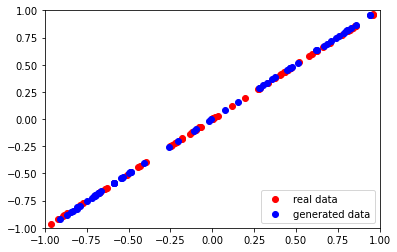

4/4 [==============================] - 0s 2ms/step
Epoch:  7070  Generator Loss:  [0.8097333908081055, 0.0]  Discriminator Loss:  [0.68305206 0.5       ]
2/2 [==============================] - 0s 3ms/step


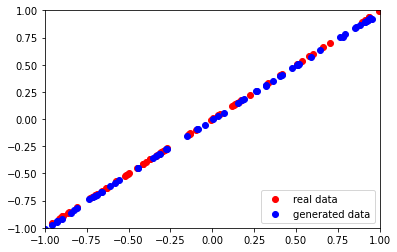

4/4 [==============================] - 0s 2ms/step
Epoch:  7080  Generator Loss:  [0.8274376392364502, 0.0]  Discriminator Loss:  [0.67810577 0.5       ]
2/2 [==============================] - 0s 3ms/step


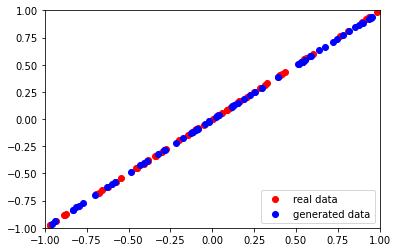

4/4 [==============================] - 0s 2ms/step
Epoch:  7090  Generator Loss:  [0.7949373722076416, 0.015625]  Discriminator Loss:  [0.68602279 0.5       ]
2/2 [==============================] - 0s 3ms/step


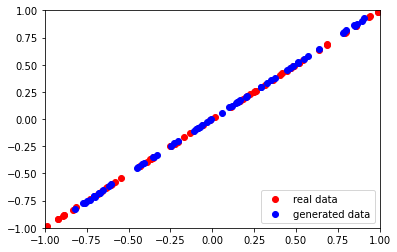

4/4 [==============================] - 0s 2ms/step
Epoch:  7100  Generator Loss:  [0.8181332349777222, 0.0078125]  Discriminator Loss:  [0.68668881 0.49609375]
2/2 [==============================] - 0s 3ms/step


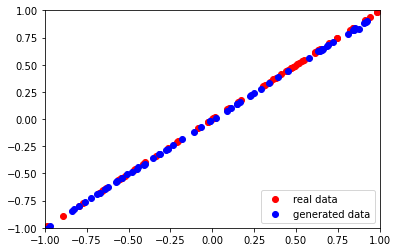

4/4 [==============================] - 0s 2ms/step
Epoch:  7110  Generator Loss:  [0.8339056968688965, 0.0]  Discriminator Loss:  [0.67818704 0.5       ]
2/2 [==============================] - 0s 3ms/step


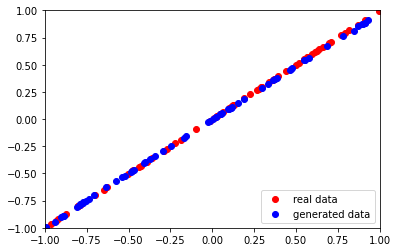

4/4 [==============================] - 0s 2ms/step
Epoch:  7120  Generator Loss:  [0.797395646572113, 0.0]  Discriminator Loss:  [0.68287969 0.5       ]
2/2 [==============================] - 0s 4ms/step


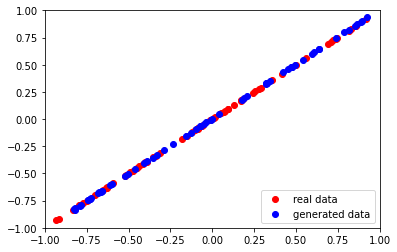

4/4 [==============================] - 0s 2ms/step
Epoch:  7130  Generator Loss:  [0.8029008507728577, 0.0]  Discriminator Loss:  [0.68216649 0.49609375]
2/2 [==============================] - 0s 3ms/step


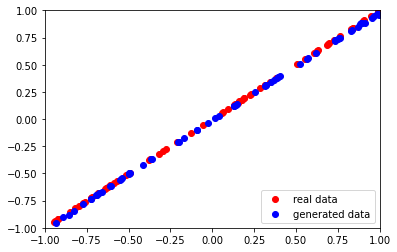

4/4 [==============================] - 0s 2ms/step
Epoch:  7140  Generator Loss:  [0.8117161393165588, 0.0]  Discriminator Loss:  [0.67895332 0.5       ]
2/2 [==============================] - 0s 3ms/step


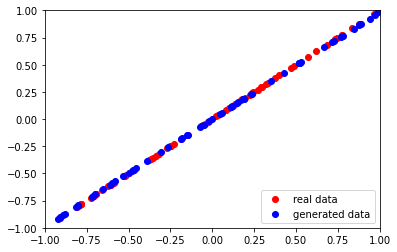

4/4 [==============================] - 0s 2ms/step
Epoch:  7150  Generator Loss:  [0.7994180917739868, 0.0]  Discriminator Loss:  [0.68541652 0.5       ]
2/2 [==============================] - 0s 3ms/step


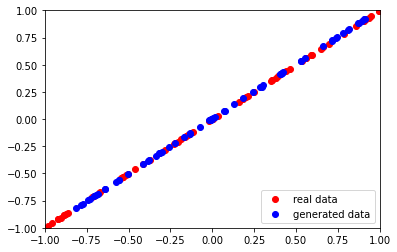

4/4 [==============================] - 0s 2ms/step
Epoch:  7160  Generator Loss:  [0.8076869249343872, 0.0]  Discriminator Loss:  [0.68997243 0.5       ]
2/2 [==============================] - 0s 3ms/step


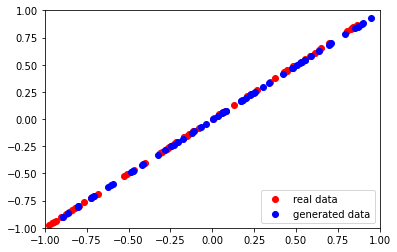

4/4 [==============================] - 0s 2ms/step
Epoch:  7170  Generator Loss:  [0.8169263601303101, 0.0]  Discriminator Loss:  [0.67966843 0.5       ]
2/2 [==============================] - 0s 3ms/step


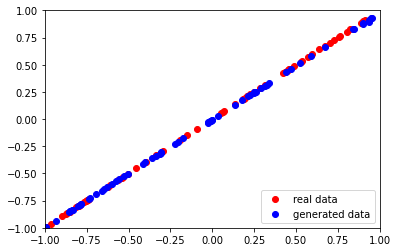

4/4 [==============================] - 0s 2ms/step
Epoch:  7180  Generator Loss:  [0.7900800108909607, 0.0]  Discriminator Loss:  [0.68652111 0.5       ]
2/2 [==============================] - 0s 3ms/step


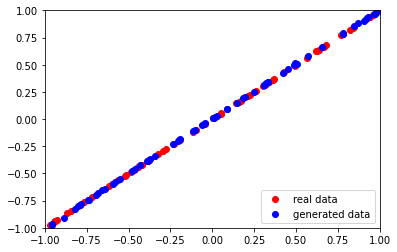

4/4 [==============================] - 0s 2ms/step
Epoch:  7190  Generator Loss:  [0.8116251826286316, 0.0]  Discriminator Loss:  [0.68648294 0.5       ]
2/2 [==============================] - 0s 3ms/step


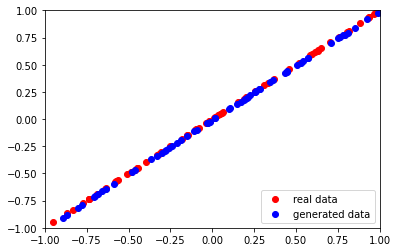

4/4 [==============================] - 0s 2ms/step
Epoch:  7200  Generator Loss:  [0.8166676759719849, 0.0]  Discriminator Loss:  [0.67868298 0.5       ]
2/2 [==============================] - 0s 3ms/step


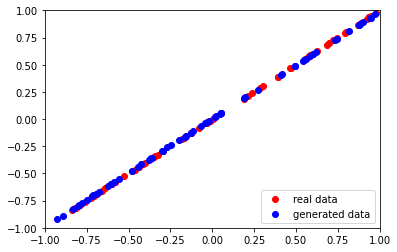

4/4 [==============================] - 0s 2ms/step
Epoch:  7210  Generator Loss:  [0.8016656637191772, 0.0]  Discriminator Loss:  [0.68452588 0.5       ]
2/2 [==============================] - 0s 3ms/step


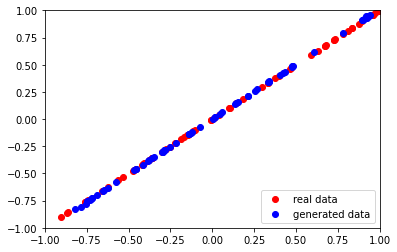

4/4 [==============================] - 0s 2ms/step
Epoch:  7220  Generator Loss:  [0.8092746138572693, 0.0]  Discriminator Loss:  [0.68910694 0.5       ]
2/2 [==============================] - 0s 4ms/step


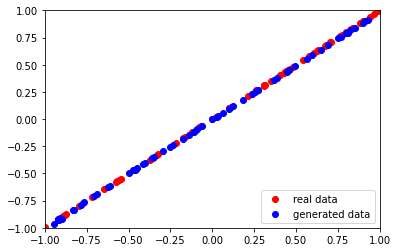

4/4 [==============================] - 0s 2ms/step
Epoch:  7230  Generator Loss:  [0.83696448802948, 0.0]  Discriminator Loss:  [0.67913213 0.5       ]
2/2 [==============================] - 0s 3ms/step


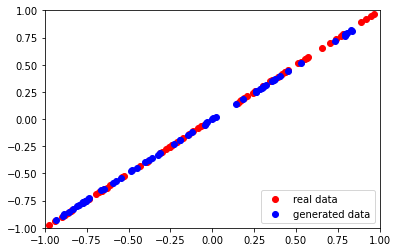

4/4 [==============================] - 0s 2ms/step
Epoch:  7240  Generator Loss:  [0.8125433325767517, 0.0]  Discriminator Loss:  [0.68187314 0.5       ]
2/2 [==============================] - 0s 3ms/step


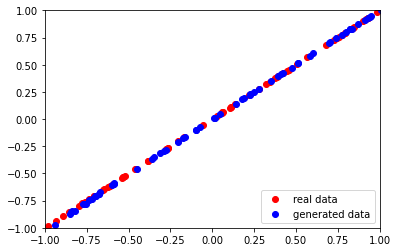

4/4 [==============================] - 0s 2ms/step
Epoch:  7250  Generator Loss:  [0.8037849068641663, 0.0]  Discriminator Loss:  [0.68707764 0.5       ]
2/2 [==============================] - 0s 3ms/step


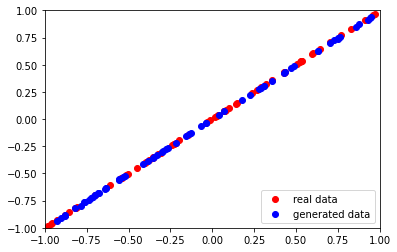

4/4 [==============================] - 0s 2ms/step
Epoch:  7260  Generator Loss:  [0.8294553756713867, 0.0]  Discriminator Loss:  [0.6768789 0.5      ]
2/2 [==============================] - 0s 3ms/step


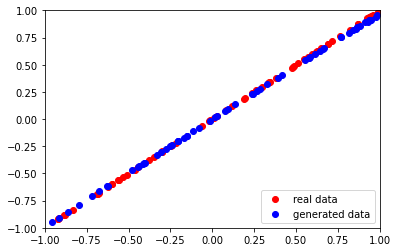

4/4 [==============================] - 0s 2ms/step
Epoch:  7270  Generator Loss:  [0.8172502517700195, 0.0]  Discriminator Loss:  [0.6824705 0.5      ]
2/2 [==============================] - 0s 4ms/step


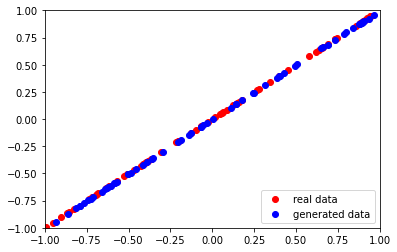

4/4 [==============================] - 0s 2ms/step
Epoch:  7280  Generator Loss:  [0.8090221285820007, 0.0]  Discriminator Loss:  [0.68376696 0.5       ]
2/2 [==============================] - 0s 4ms/step


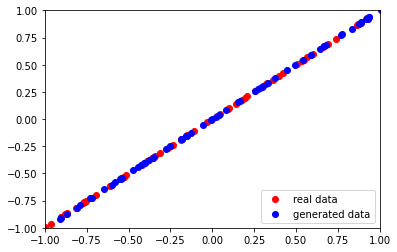

4/4 [==============================] - 0s 2ms/step
Epoch:  7290  Generator Loss:  [0.8088293671607971, 0.0]  Discriminator Loss:  [0.6817832 0.5      ]
2/2 [==============================] - 0s 3ms/step


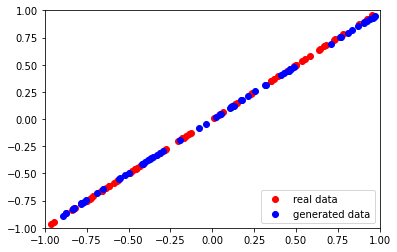

4/4 [==============================] - 0s 2ms/step
Epoch:  7300  Generator Loss:  [0.8082126379013062, 0.0]  Discriminator Loss:  [0.68649495 0.5       ]
2/2 [==============================] - 0s 4ms/step


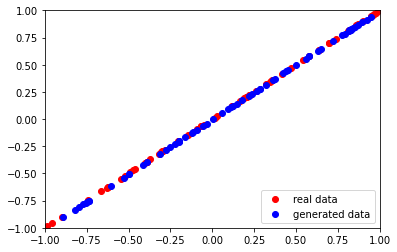

4/4 [==============================] - 0s 2ms/step
Epoch:  7310  Generator Loss:  [0.8145904541015625, 0.0]  Discriminator Loss:  [0.68161774 0.49609375]
2/2 [==============================] - 0s 5ms/step


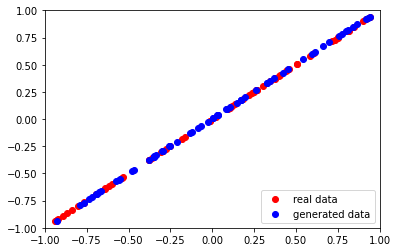

4/4 [==============================] - 0s 2ms/step
Epoch:  7320  Generator Loss:  [0.8106843829154968, 0.0]  Discriminator Loss:  [0.682686 0.5     ]
2/2 [==============================] - 0s 4ms/step


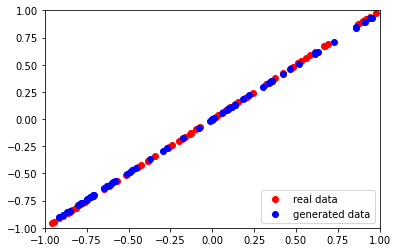

4/4 [==============================] - 0s 2ms/step
Epoch:  7330  Generator Loss:  [0.8144016861915588, 0.0]  Discriminator Loss:  [0.68563801 0.5       ]
2/2 [==============================] - 0s 3ms/step


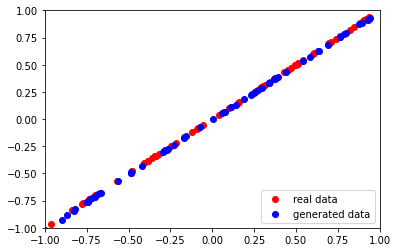

4/4 [==============================] - 0s 2ms/step
Epoch:  7340  Generator Loss:  [0.8176702260971069, 0.0078125]  Discriminator Loss:  [0.67592171 0.5       ]
2/2 [==============================] - 0s 4ms/step


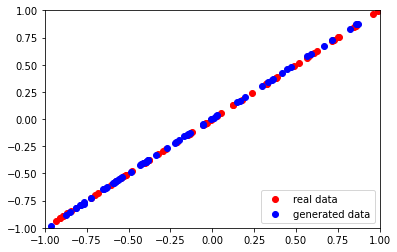

4/4 [==============================] - 0s 2ms/step
Epoch:  7350  Generator Loss:  [0.8024629354476929, 0.0234375]  Discriminator Loss:  [0.68201587 0.48828125]
2/2 [==============================] - 0s 3ms/step


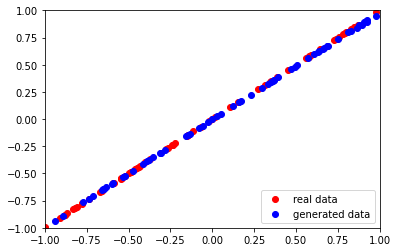

4/4 [==============================] - 0s 2ms/step
Epoch:  7360  Generator Loss:  [0.8089714646339417, 0.0]  Discriminator Loss:  [0.68819323 0.5       ]
2/2 [==============================] - 0s 4ms/step


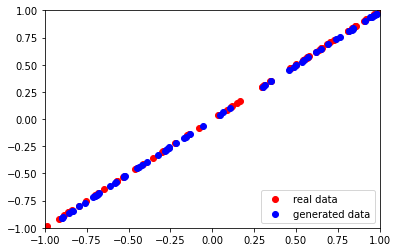

4/4 [==============================] - 0s 2ms/step
Epoch:  7370  Generator Loss:  [0.8116487860679626, 0.0]  Discriminator Loss:  [0.68499884 0.49609375]
2/2 [==============================] - 0s 3ms/step


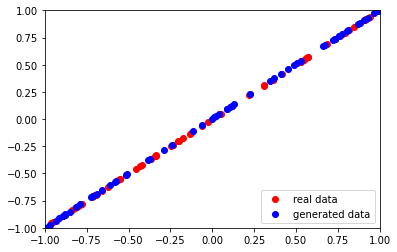

4/4 [==============================] - 0s 2ms/step
Epoch:  7380  Generator Loss:  [0.8304047584533691, 0.0]  Discriminator Loss:  [0.68564743 0.5       ]
2/2 [==============================] - 0s 4ms/step


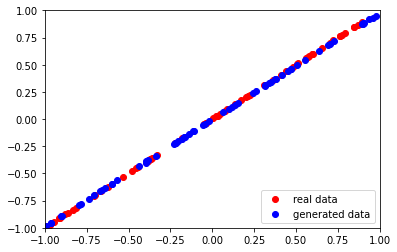

4/4 [==============================] - 0s 2ms/step
Epoch:  7390  Generator Loss:  [0.8100147247314453, 0.0]  Discriminator Loss:  [0.68466017 0.5       ]
2/2 [==============================] - 0s 3ms/step


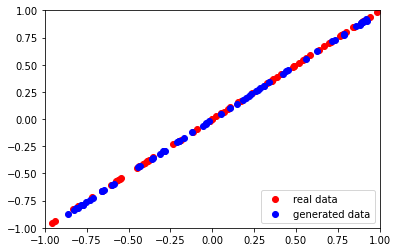

4/4 [==============================] - 0s 2ms/step
Epoch:  7400  Generator Loss:  [0.8076668977737427, 0.0078125]  Discriminator Loss:  [0.68056431 0.5       ]
2/2 [==============================] - 0s 3ms/step


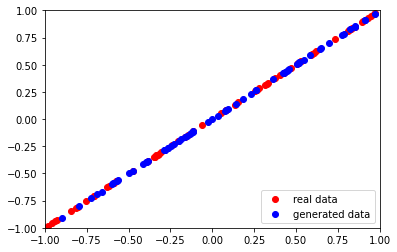

4/4 [==============================] - 0s 2ms/step
Epoch:  7410  Generator Loss:  [0.8043175935745239, 0.0546875]  Discriminator Loss:  [0.6821374  0.45703125]
2/2 [==============================] - 0s 3ms/step


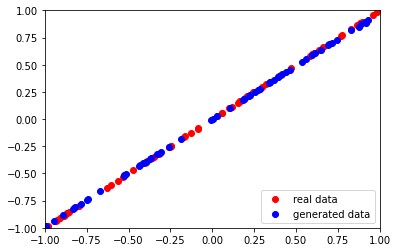

4/4 [==============================] - 0s 2ms/step
Epoch:  7420  Generator Loss:  [0.8012236952781677, 0.015625]  Discriminator Loss:  [0.68732637 0.48828125]
2/2 [==============================] - 0s 3ms/step


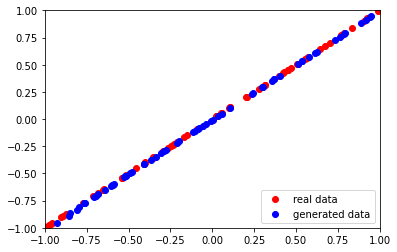

4/4 [==============================] - 0s 2ms/step
Epoch:  7430  Generator Loss:  [0.8292880654335022, 0.0]  Discriminator Loss:  [0.68027025 0.5       ]
2/2 [==============================] - 0s 3ms/step


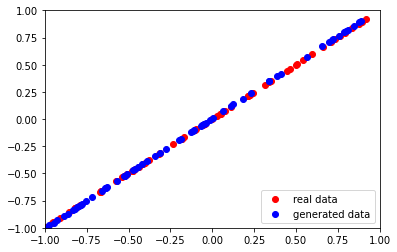

4/4 [==============================] - 0s 2ms/step
Epoch:  7440  Generator Loss:  [0.8224450349807739, 0.0]  Discriminator Loss:  [0.68738151 0.5       ]
2/2 [==============================] - 0s 3ms/step


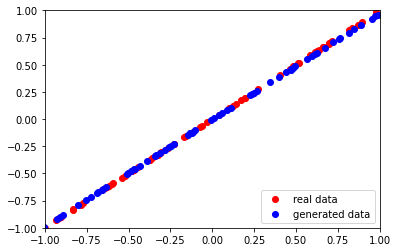

4/4 [==============================] - 0s 2ms/step
Epoch:  7450  Generator Loss:  [0.8152298331260681, 0.0]  Discriminator Loss:  [0.68183914 0.5       ]
2/2 [==============================] - 0s 3ms/step


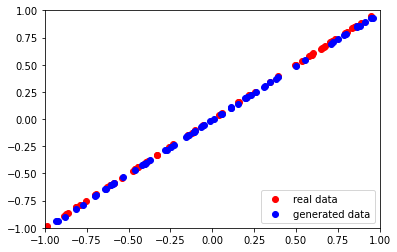

4/4 [==============================] - 0s 2ms/step
Epoch:  7460  Generator Loss:  [0.7881021499633789, 0.0078125]  Discriminator Loss:  [0.68326941 0.49609375]
2/2 [==============================] - 0s 3ms/step


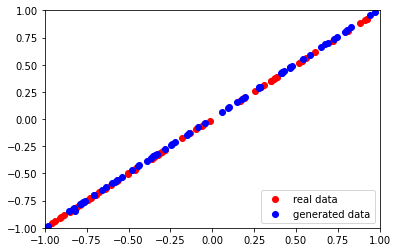

4/4 [==============================] - 0s 2ms/step
Epoch:  7470  Generator Loss:  [0.8180136680603027, 0.0]  Discriminator Loss:  [0.67738393 0.5       ]
2/2 [==============================] - 0s 3ms/step


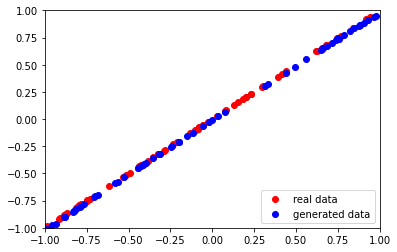

4/4 [==============================] - 0s 2ms/step
Epoch:  7480  Generator Loss:  [0.8026015758514404, 0.0]  Discriminator Loss:  [0.68379316 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


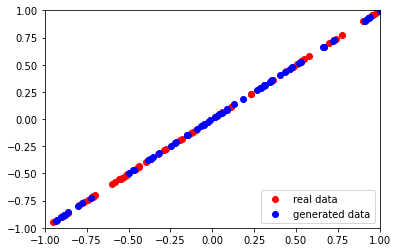

4/4 [==============================] - 0s 2ms/step
Epoch:  7490  Generator Loss:  [0.8030822277069092, 0.0]  Discriminator Loss:  [0.68305698 0.5       ]
2/2 [==============================] - 0s 4ms/step


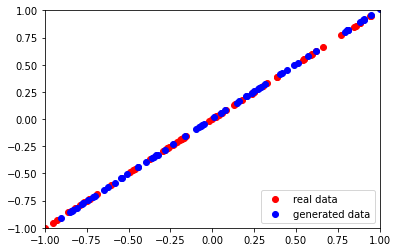

4/4 [==============================] - 0s 2ms/step
Epoch:  7500  Generator Loss:  [0.8140162229537964, 0.0]  Discriminator Loss:  [0.69233003 0.5       ]
2/2 [==============================] - 0s 5ms/step


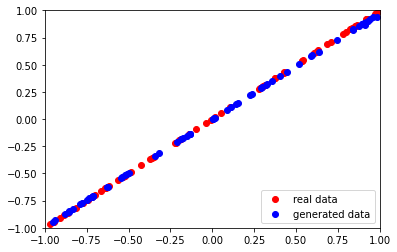

4/4 [==============================] - 0s 2ms/step
Epoch:  7510  Generator Loss:  [0.8189963102340698, 0.0]  Discriminator Loss:  [0.68276811 0.5       ]
2/2 [==============================] - 0s 4ms/step


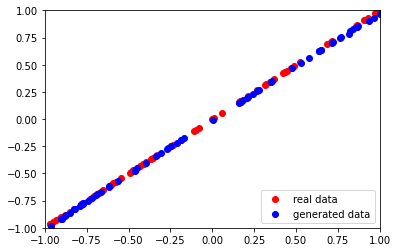

4/4 [==============================] - 0s 5ms/step
Epoch:  7520  Generator Loss:  [0.7908757328987122, 0.015625]  Discriminator Loss:  [0.68143928 0.5       ]
2/2 [==============================] - 0s 2ms/step


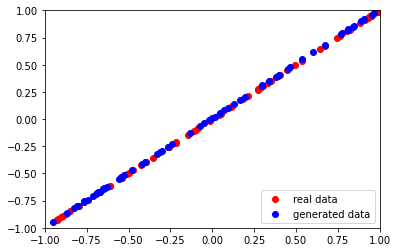

4/4 [==============================] - 0s 2ms/step
Epoch:  7530  Generator Loss:  [0.815162181854248, 0.0]  Discriminator Loss:  [0.67671561 0.5       ]
2/2 [==============================] - 0s 3ms/step


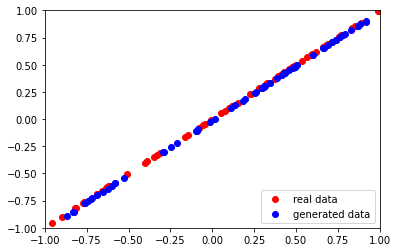

4/4 [==============================] - 0s 2ms/step
Epoch:  7540  Generator Loss:  [0.809120774269104, 0.0]  Discriminator Loss:  [0.67609298 0.5       ]
2/2 [==============================] - 0s 3ms/step


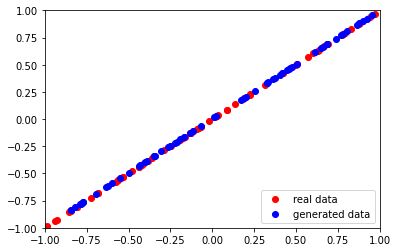

4/4 [==============================] - 0s 2ms/step
Epoch:  7550  Generator Loss:  [0.8137248158454895, 0.0]  Discriminator Loss:  [0.67630592 0.5       ]
2/2 [==============================] - 0s 3ms/step


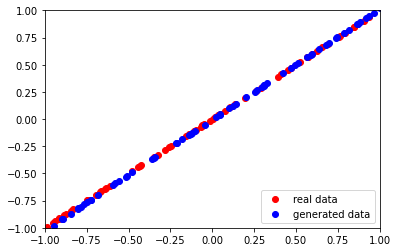

4/4 [==============================] - 0s 2ms/step
Epoch:  7560  Generator Loss:  [0.7924456596374512, 0.0234375]  Discriminator Loss:  [0.69047788 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


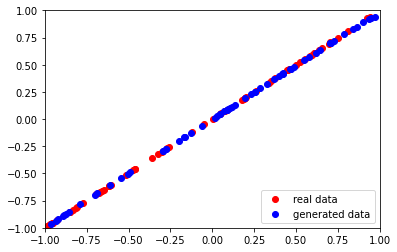

4/4 [==============================] - 0s 2ms/step
Epoch:  7570  Generator Loss:  [0.8291003108024597, 0.0]  Discriminator Loss:  [0.68081623 0.5       ]
2/2 [==============================] - 0s 2ms/step


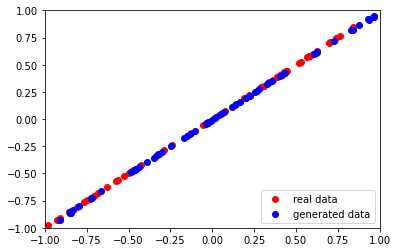

4/4 [==============================] - 0s 2ms/step
Epoch:  7580  Generator Loss:  [0.792241632938385, 0.0]  Discriminator Loss:  [0.68866682 0.5       ]
2/2 [==============================] - 0s 3ms/step


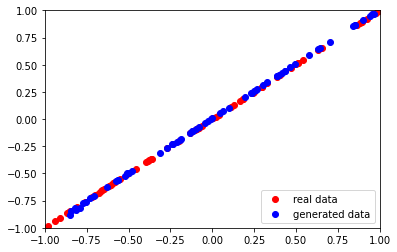

4/4 [==============================] - 0s 2ms/step
Epoch:  7590  Generator Loss:  [0.8115034699440002, 0.0]  Discriminator Loss:  [0.68518746 0.5       ]
2/2 [==============================] - 0s 3ms/step


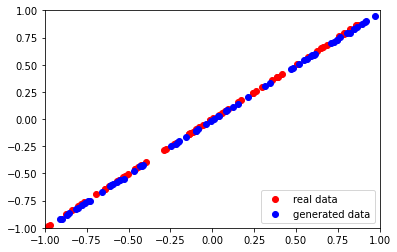

4/4 [==============================] - 0s 3ms/step
Epoch:  7600  Generator Loss:  [0.8069264888763428, 0.015625]  Discriminator Loss:  [0.6788744 0.4921875]
2/2 [==============================] - 0s 3ms/step


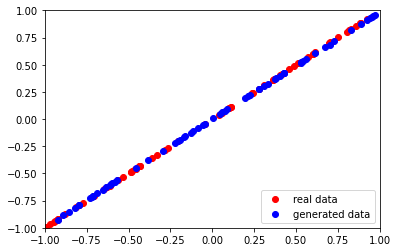

4/4 [==============================] - 0s 3ms/step
Epoch:  7610  Generator Loss:  [0.7860233187675476, 0.015625]  Discriminator Loss:  [0.6912021  0.47265625]
2/2 [==============================] - 0s 5ms/step


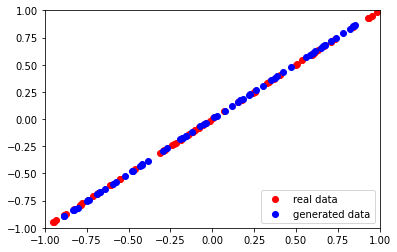

4/4 [==============================] - 0s 2ms/step
Epoch:  7620  Generator Loss:  [0.8145066499710083, 0.0]  Discriminator Loss:  [0.68737632 0.5       ]
2/2 [==============================] - 0s 3ms/step


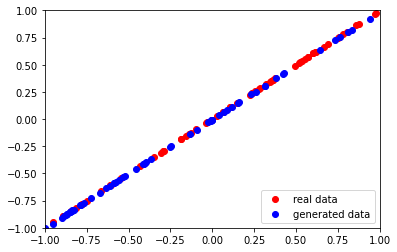

4/4 [==============================] - 0s 2ms/step
Epoch:  7630  Generator Loss:  [0.8515124320983887, 0.0]  Discriminator Loss:  [0.67711619 0.5       ]
2/2 [==============================] - 0s 3ms/step


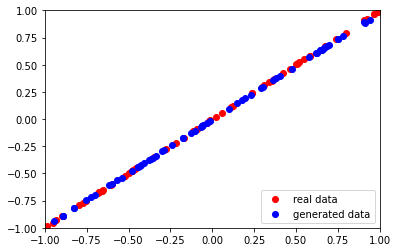

4/4 [==============================] - 0s 2ms/step
Epoch:  7640  Generator Loss:  [0.8006995320320129, 0.0]  Discriminator Loss:  [0.68428522 0.5       ]
2/2 [==============================] - 0s 4ms/step


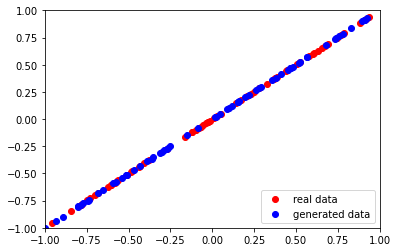

4/4 [==============================] - 0s 2ms/step
Epoch:  7650  Generator Loss:  [0.8081293106079102, 0.0]  Discriminator Loss:  [0.68539622 0.5       ]
2/2 [==============================] - 0s 3ms/step


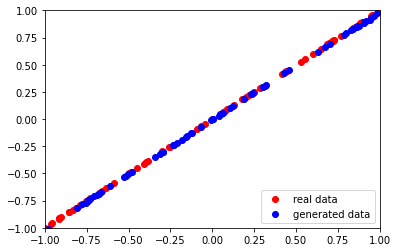

4/4 [==============================] - 0s 5ms/step
Epoch:  7660  Generator Loss:  [0.8282679319381714, 0.0]  Discriminator Loss:  [0.68050933 0.5       ]
2/2 [==============================] - 0s 4ms/step


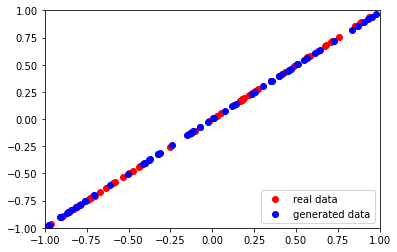

4/4 [==============================] - 0s 2ms/step
Epoch:  7670  Generator Loss:  [0.7909587621688843, 0.0]  Discriminator Loss:  [0.68868935 0.5       ]
2/2 [==============================] - 0s 4ms/step


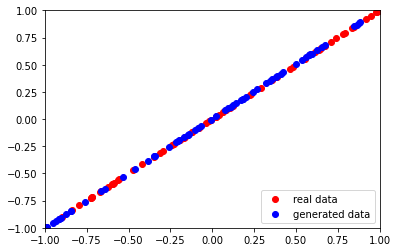

4/4 [==============================] - 0s 2ms/step
Epoch:  7680  Generator Loss:  [0.8228241205215454, 0.0]  Discriminator Loss:  [0.68719736 0.5       ]
2/2 [==============================] - 0s 3ms/step


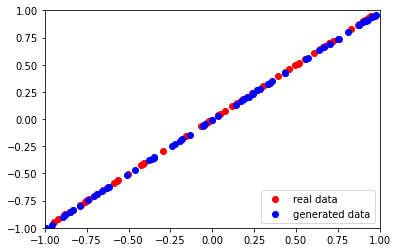

4/4 [==============================] - 0s 3ms/step
Epoch:  7690  Generator Loss:  [0.8083519339561462, 0.0]  Discriminator Loss:  [0.68394822 0.5       ]
2/2 [==============================] - 0s 3ms/step


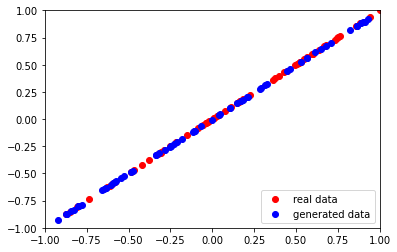

4/4 [==============================] - 0s 2ms/step
Epoch:  7700  Generator Loss:  [0.7963511943817139, 0.0]  Discriminator Loss:  [0.68366846 0.5       ]
2/2 [==============================] - 0s 5ms/step


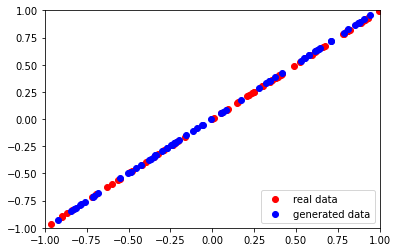

4/4 [==============================] - 0s 2ms/step
Epoch:  7710  Generator Loss:  [0.8100475072860718, 0.0]  Discriminator Loss:  [0.68475562 0.5       ]
2/2 [==============================] - 0s 5ms/step


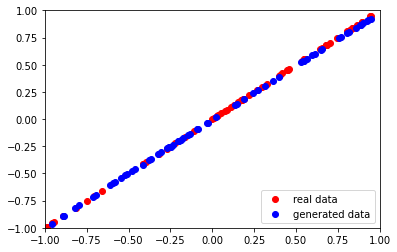

4/4 [==============================] - 0s 3ms/step
Epoch:  7720  Generator Loss:  [0.8086415529251099, 0.0]  Discriminator Loss:  [0.68193388 0.5       ]
2/2 [==============================] - 0s 5ms/step


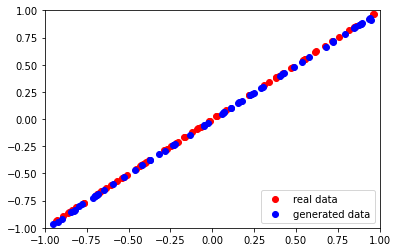

4/4 [==============================] - 0s 2ms/step
Epoch:  7730  Generator Loss:  [0.7934780120849609, 0.0]  Discriminator Loss:  [0.68284646 0.5       ]
2/2 [==============================] - 0s 3ms/step


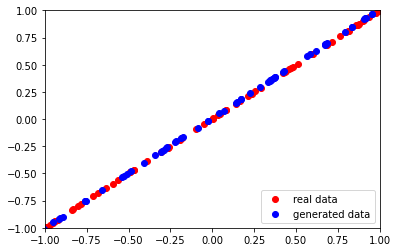

4/4 [==============================] - 0s 2ms/step
Epoch:  7740  Generator Loss:  [0.8193633556365967, 0.0]  Discriminator Loss:  [0.68077672 0.5       ]
2/2 [==============================] - 0s 3ms/step


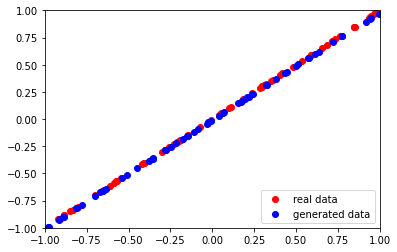

4/4 [==============================] - 0s 2ms/step
Epoch:  7750  Generator Loss:  [0.8100906610488892, 0.0]  Discriminator Loss:  [0.68431276 0.5       ]
2/2 [==============================] - 0s 3ms/step


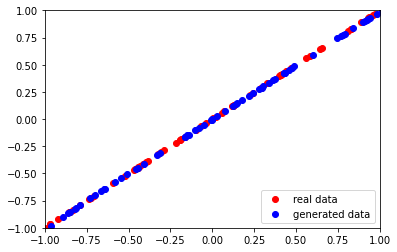

4/4 [==============================] - 0s 2ms/step
Epoch:  7760  Generator Loss:  [0.8041940331459045, 0.0]  Discriminator Loss:  [0.67930976 0.5       ]
2/2 [==============================] - 0s 3ms/step


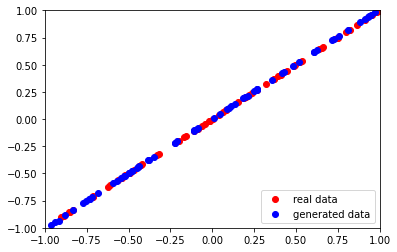

4/4 [==============================] - 0s 2ms/step
Epoch:  7770  Generator Loss:  [0.7995395660400391, 0.0]  Discriminator Loss:  [0.68816194 0.5       ]
2/2 [==============================] - 0s 3ms/step


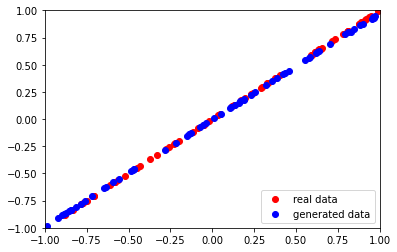

4/4 [==============================] - 0s 2ms/step
Epoch:  7780  Generator Loss:  [0.8137106895446777, 0.0]  Discriminator Loss:  [0.68007237 0.5       ]
2/2 [==============================] - 0s 4ms/step


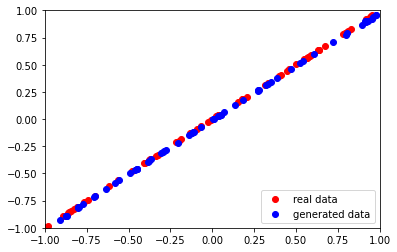

4/4 [==============================] - 0s 2ms/step
Epoch:  7790  Generator Loss:  [0.8130883574485779, 0.0]  Discriminator Loss:  [0.67748594 0.49609375]
2/2 [==============================] - 0s 3ms/step


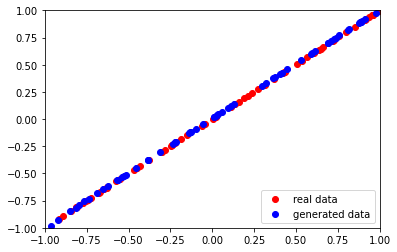

4/4 [==============================] - 0s 2ms/step
Epoch:  7800  Generator Loss:  [0.82355797290802, 0.0]  Discriminator Loss:  [0.67864418 0.5       ]
2/2 [==============================] - 0s 3ms/step


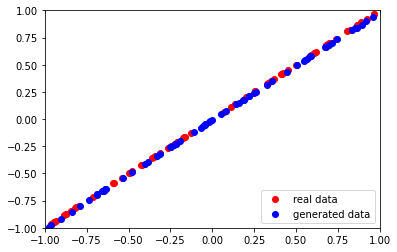

4/4 [==============================] - 0s 2ms/step
Epoch:  7810  Generator Loss:  [0.8137486577033997, 0.0]  Discriminator Loss:  [0.68655181 0.5       ]
2/2 [==============================] - 0s 3ms/step


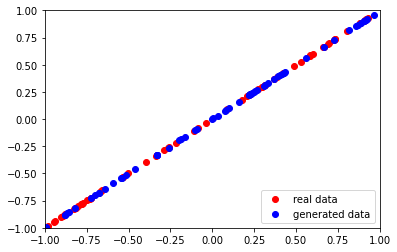

4/4 [==============================] - 0s 2ms/step
Epoch:  7820  Generator Loss:  [0.8262129426002502, 0.0]  Discriminator Loss:  [0.67778292 0.5       ]
2/2 [==============================] - 0s 4ms/step


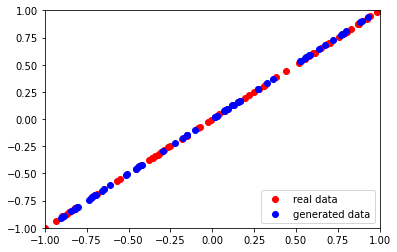

4/4 [==============================] - 0s 2ms/step
Epoch:  7830  Generator Loss:  [0.8055607676506042, 0.015625]  Discriminator Loss:  [0.68948805 0.49609375]
2/2 [==============================] - 0s 5ms/step


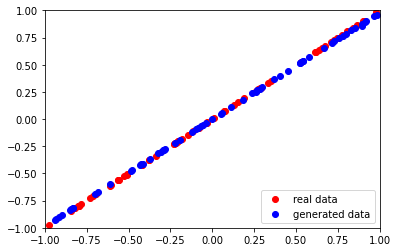

4/4 [==============================] - 0s 2ms/step
Epoch:  7840  Generator Loss:  [0.8197814226150513, 0.0]  Discriminator Loss:  [0.68280727 0.5       ]
2/2 [==============================] - 0s 3ms/step


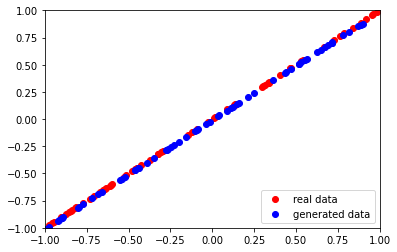

4/4 [==============================] - 0s 2ms/step
Epoch:  7850  Generator Loss:  [0.7988208532333374, 0.0]  Discriminator Loss:  [0.68715137 0.5       ]
2/2 [==============================] - 0s 3ms/step


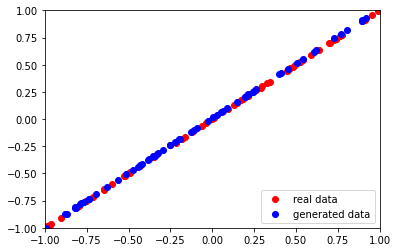

4/4 [==============================] - 0s 2ms/step
Epoch:  7860  Generator Loss:  [0.8215638399124146, 0.0]  Discriminator Loss:  [0.68211803 0.5       ]
2/2 [==============================] - 0s 3ms/step


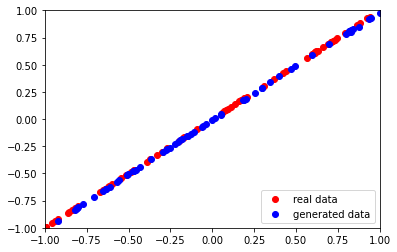

4/4 [==============================] - 0s 2ms/step
Epoch:  7870  Generator Loss:  [0.8123222589492798, 0.0]  Discriminator Loss:  [0.68479079 0.5       ]
2/2 [==============================] - 0s 3ms/step


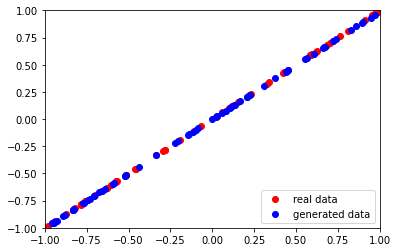

4/4 [==============================] - 0s 2ms/step
Epoch:  7880  Generator Loss:  [0.8027387261390686, 0.0]  Discriminator Loss:  [0.68204126 0.5       ]
2/2 [==============================] - 0s 3ms/step


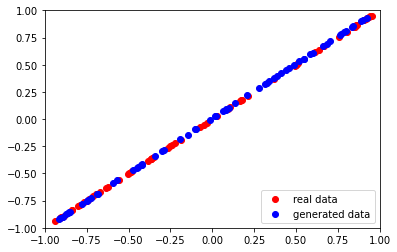

4/4 [==============================] - 0s 2ms/step
Epoch:  7890  Generator Loss:  [0.8070855736732483, 0.0]  Discriminator Loss:  [0.68779913 0.5       ]
2/2 [==============================] - 0s 3ms/step


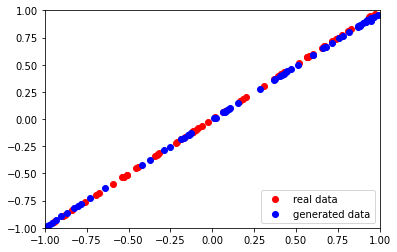

4/4 [==============================] - 0s 2ms/step
Epoch:  7900  Generator Loss:  [0.8104115724563599, 0.0]  Discriminator Loss:  [0.68365431 0.5       ]
2/2 [==============================] - 0s 3ms/step


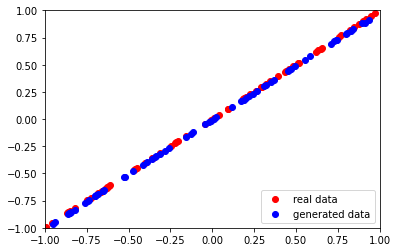

4/4 [==============================] - 0s 2ms/step
Epoch:  7910  Generator Loss:  [0.7864296436309814, 0.0]  Discriminator Loss:  [0.6872333 0.5      ]
2/2 [==============================] - 0s 3ms/step


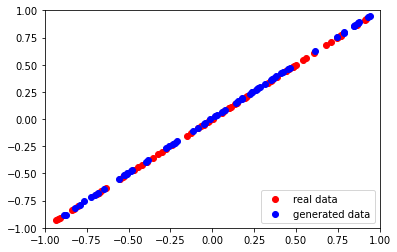

4/4 [==============================] - 0s 2ms/step
Epoch:  7920  Generator Loss:  [0.8128979206085205, 0.0]  Discriminator Loss:  [0.6811682 0.5      ]
2/2 [==============================] - 0s 3ms/step


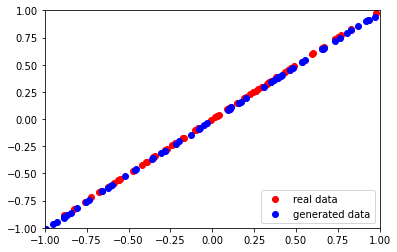

4/4 [==============================] - 0s 2ms/step
Epoch:  7930  Generator Loss:  [0.8029685020446777, 0.0]  Discriminator Loss:  [0.68274966 0.5       ]
2/2 [==============================] - 0s 3ms/step


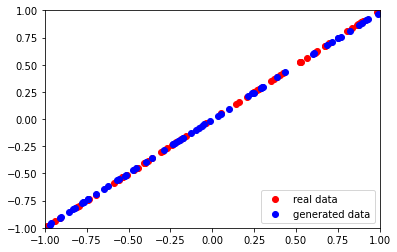

4/4 [==============================] - 0s 2ms/step
Epoch:  7940  Generator Loss:  [0.7963650226593018, 0.0]  Discriminator Loss:  [0.68297902 0.5       ]
2/2 [==============================] - 0s 5ms/step


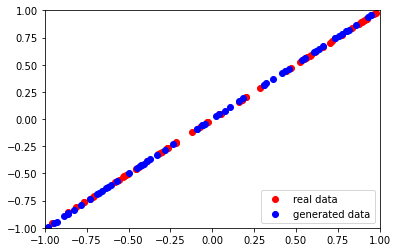

4/4 [==============================] - 0s 2ms/step
Epoch:  7950  Generator Loss:  [0.8104231357574463, 0.0]  Discriminator Loss:  [0.69308445 0.5       ]
2/2 [==============================] - 0s 4ms/step


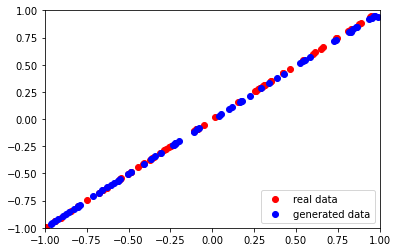

4/4 [==============================] - 0s 2ms/step
Epoch:  7960  Generator Loss:  [0.8158400058746338, 0.0]  Discriminator Loss:  [0.67591071 0.5       ]
2/2 [==============================] - 0s 3ms/step


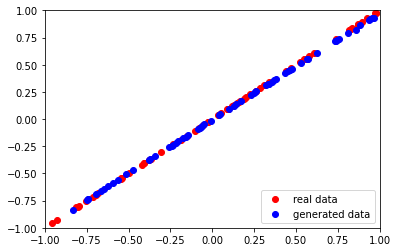

4/4 [==============================] - 0s 2ms/step
Epoch:  7970  Generator Loss:  [0.7995462417602539, 0.0]  Discriminator Loss:  [0.68622962 0.5       ]
2/2 [==============================] - 0s 3ms/step


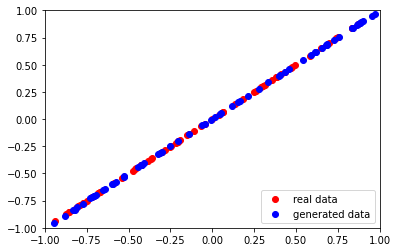

4/4 [==============================] - 0s 2ms/step
Epoch:  7980  Generator Loss:  [0.8100231289863586, 0.0]  Discriminator Loss:  [0.68221214 0.5       ]
2/2 [==============================] - 0s 3ms/step


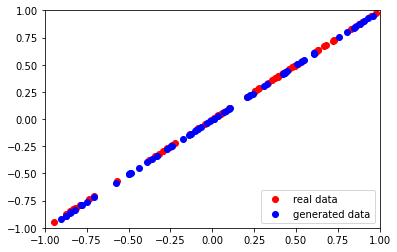

4/4 [==============================] - 0s 2ms/step
Epoch:  7990  Generator Loss:  [0.7881714701652527, 0.03125]  Discriminator Loss:  [0.68710801 0.49609375]
2/2 [==============================] - 0s 4ms/step


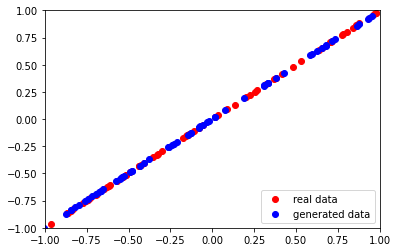

4/4 [==============================] - 0s 2ms/step
Epoch:  8000  Generator Loss:  [0.8104483485221863, 0.0]  Discriminator Loss:  [0.68357164 0.5       ]
2/2 [==============================] - 0s 3ms/step


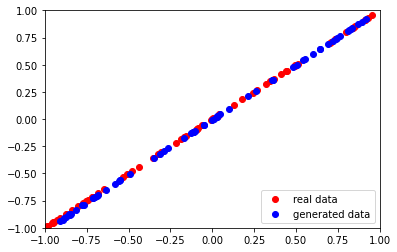

4/4 [==============================] - 0s 2ms/step
Epoch:  8010  Generator Loss:  [0.7965876460075378, 0.0]  Discriminator Loss:  [0.68779278 0.5       ]
2/2 [==============================] - 0s 3ms/step


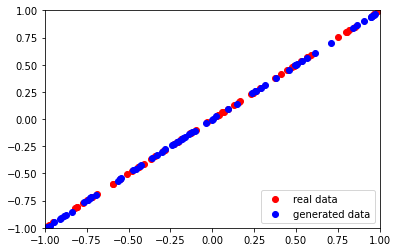

4/4 [==============================] - 0s 2ms/step
Epoch:  8020  Generator Loss:  [0.8212031722068787, 0.0]  Discriminator Loss:  [0.68027899 0.5       ]
2/2 [==============================] - 0s 3ms/step


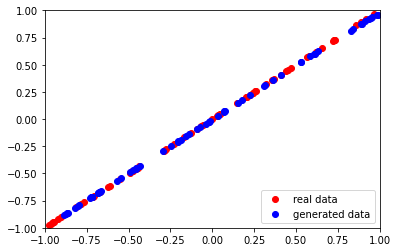

4/4 [==============================] - 0s 2ms/step
Epoch:  8030  Generator Loss:  [0.8047378063201904, 0.0]  Discriminator Loss:  [0.68099901 0.5       ]
2/2 [==============================] - 0s 4ms/step


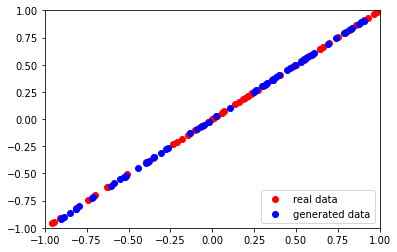

4/4 [==============================] - 0s 2ms/step
Epoch:  8040  Generator Loss:  [0.8257778882980347, 0.0]  Discriminator Loss:  [0.68772429 0.5       ]
2/2 [==============================] - 0s 3ms/step


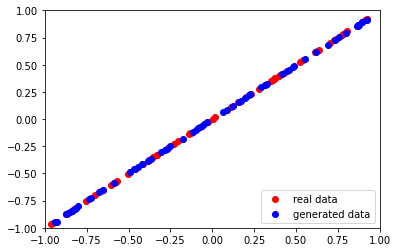

4/4 [==============================] - 0s 2ms/step
Epoch:  8050  Generator Loss:  [0.8264732360839844, 0.0]  Discriminator Loss:  [0.6796706 0.5      ]
2/2 [==============================] - 0s 4ms/step


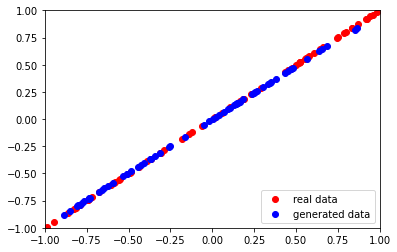

4/4 [==============================] - 0s 2ms/step
Epoch:  8060  Generator Loss:  [0.8029283285140991, 0.0]  Discriminator Loss:  [0.67817539 0.5       ]
2/2 [==============================] - 0s 3ms/step


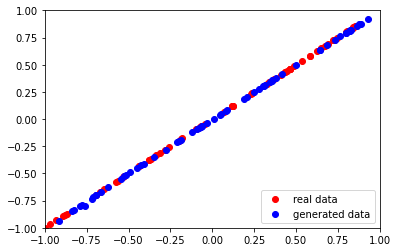

4/4 [==============================] - 0s 2ms/step
Epoch:  8070  Generator Loss:  [0.789878785610199, 0.015625]  Discriminator Loss:  [0.68516949 0.46484375]
2/2 [==============================] - 0s 3ms/step


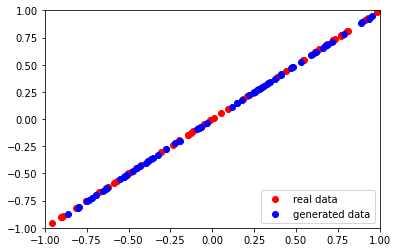

4/4 [==============================] - 0s 2ms/step
Epoch:  8080  Generator Loss:  [0.7933728694915771, 0.0]  Discriminator Loss:  [0.68414381 0.484375  ]
2/2 [==============================] - 0s 3ms/step


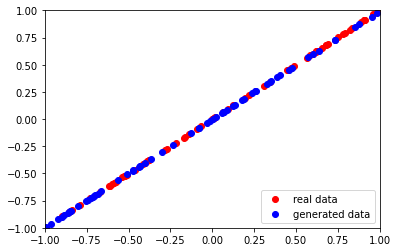

4/4 [==============================] - 0s 2ms/step
Epoch:  8090  Generator Loss:  [0.7950342893600464, 0.0]  Discriminator Loss:  [0.68888408 0.5       ]
2/2 [==============================] - 0s 3ms/step


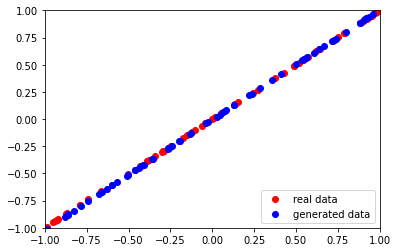

4/4 [==============================] - 0s 2ms/step
Epoch:  8100  Generator Loss:  [0.8257348537445068, 0.0]  Discriminator Loss:  [0.68381572 0.5       ]
2/2 [==============================] - 0s 3ms/step


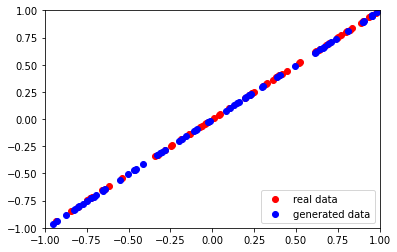

4/4 [==============================] - 0s 2ms/step
Epoch:  8110  Generator Loss:  [0.8280131816864014, 0.0]  Discriminator Loss:  [0.68688717 0.5       ]
2/2 [==============================] - 0s 3ms/step


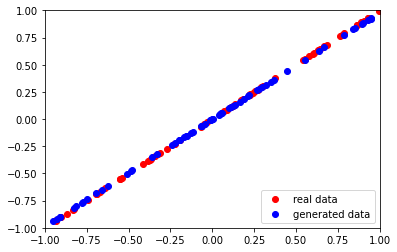

4/4 [==============================] - 0s 2ms/step
Epoch:  8120  Generator Loss:  [0.7913167476654053, 0.0]  Discriminator Loss:  [0.68853426 0.5       ]
2/2 [==============================] - 0s 3ms/step


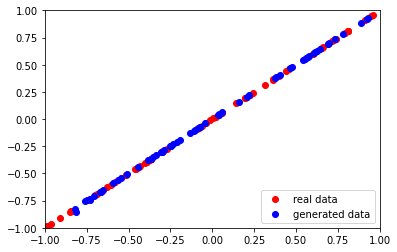

4/4 [==============================] - 0s 2ms/step
Epoch:  8130  Generator Loss:  [0.8012986779212952, 0.0]  Discriminator Loss:  [0.67756784 0.5       ]
2/2 [==============================] - 0s 4ms/step


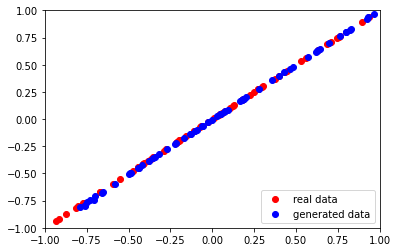

4/4 [==============================] - 0s 2ms/step
Epoch:  8140  Generator Loss:  [0.7774633169174194, 0.078125]  Discriminator Loss:  [0.68754017 0.45703125]
2/2 [==============================] - 0s 3ms/step


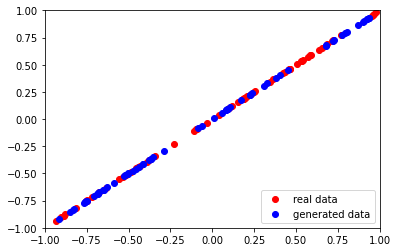

4/4 [==============================] - 0s 2ms/step
Epoch:  8150  Generator Loss:  [0.8014094829559326, 0.03125]  Discriminator Loss:  [0.68559501 0.47265625]
2/2 [==============================] - 0s 3ms/step


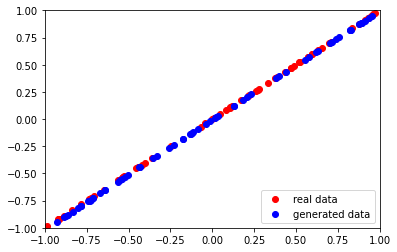

4/4 [==============================] - 0s 3ms/step
Epoch:  8160  Generator Loss:  [0.8145578503608704, 0.0390625]  Discriminator Loss:  [0.68269908 0.4609375 ]
2/2 [==============================] - 0s 4ms/step


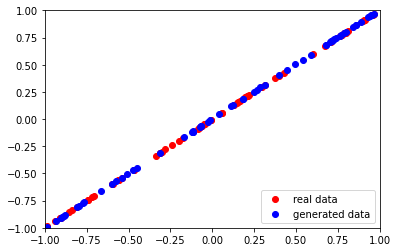

4/4 [==============================] - 0s 2ms/step
Epoch:  8170  Generator Loss:  [0.8393155336380005, 0.0]  Discriminator Loss:  [0.67684367 0.5       ]
2/2 [==============================] - 0s 3ms/step


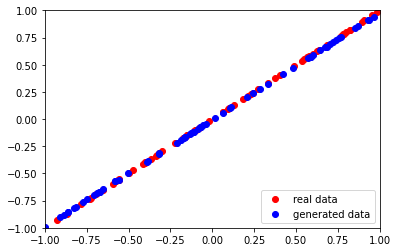

4/4 [==============================] - 0s 2ms/step
Epoch:  8180  Generator Loss:  [0.8261355757713318, 0.0]  Discriminator Loss:  [0.67787665 0.5       ]
2/2 [==============================] - 0s 3ms/step


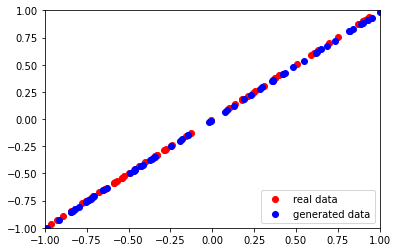

4/4 [==============================] - 0s 2ms/step
Epoch:  8190  Generator Loss:  [0.8186413049697876, 0.0]  Discriminator Loss:  [0.68618694 0.5       ]
2/2 [==============================] - 0s 3ms/step


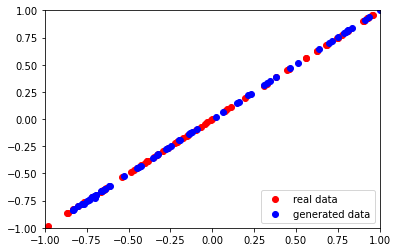

4/4 [==============================] - 0s 2ms/step
Epoch:  8200  Generator Loss:  [0.8145332336425781, 0.0]  Discriminator Loss:  [0.67910185 0.5       ]
2/2 [==============================] - 0s 4ms/step


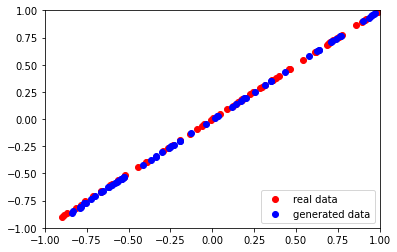

4/4 [==============================] - 0s 2ms/step
Epoch:  8210  Generator Loss:  [0.7994109392166138, 0.0234375]  Discriminator Loss:  [0.69064924 0.48046875]
2/2 [==============================] - 0s 3ms/step


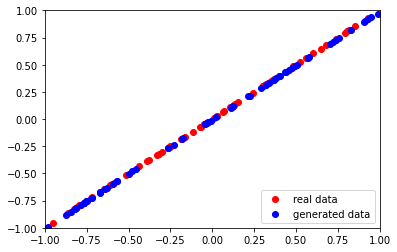

4/4 [==============================] - 0s 2ms/step
Epoch:  8220  Generator Loss:  [0.8046250343322754, 0.0]  Discriminator Loss:  [0.68058237 0.49609375]
2/2 [==============================] - 0s 3ms/step


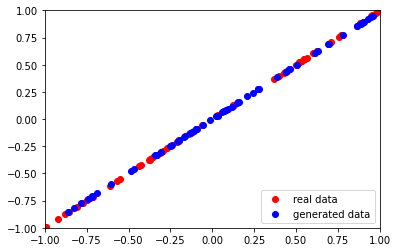

4/4 [==============================] - 0s 2ms/step
Epoch:  8230  Generator Loss:  [0.807375431060791, 0.0]  Discriminator Loss:  [0.68899417 0.5       ]
2/2 [==============================] - 0s 3ms/step


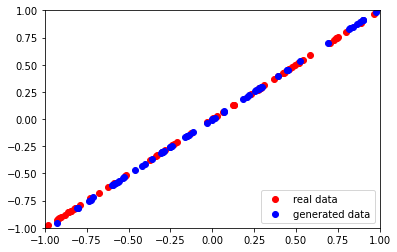

4/4 [==============================] - 0s 2ms/step
Epoch:  8240  Generator Loss:  [0.8193520307540894, 0.0]  Discriminator Loss:  [0.68257976 0.5       ]
2/2 [==============================] - 0s 3ms/step


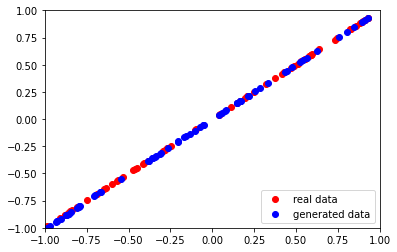

4/4 [==============================] - 0s 2ms/step
Epoch:  8250  Generator Loss:  [0.8256020545959473, 0.0]  Discriminator Loss:  [0.67866912 0.5       ]
2/2 [==============================] - 0s 3ms/step


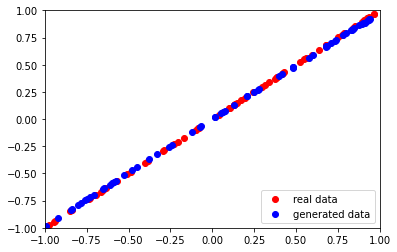

4/4 [==============================] - 0s 2ms/step
Epoch:  8260  Generator Loss:  [0.8093301057815552, 0.0]  Discriminator Loss:  [0.67957315 0.5       ]
2/2 [==============================] - 0s 3ms/step


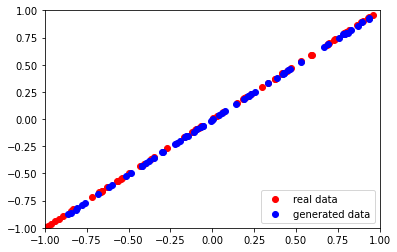

4/4 [==============================] - 0s 2ms/step
Epoch:  8270  Generator Loss:  [0.8029049038887024, 0.0078125]  Discriminator Loss:  [0.68078384 0.5       ]
2/2 [==============================] - 0s 3ms/step


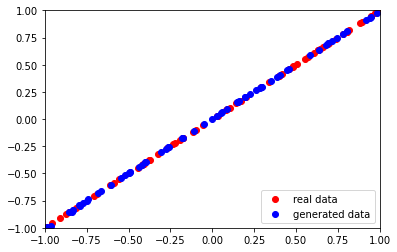

4/4 [==============================] - 0s 2ms/step
Epoch:  8280  Generator Loss:  [0.8075886964797974, 0.015625]  Discriminator Loss:  [0.6785078 0.5      ]
2/2 [==============================] - 0s 3ms/step


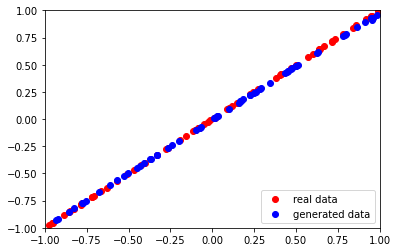

4/4 [==============================] - 0s 2ms/step
Epoch:  8290  Generator Loss:  [0.8050203323364258, 0.0]  Discriminator Loss:  [0.68545714 0.5       ]
2/2 [==============================] - 0s 3ms/step


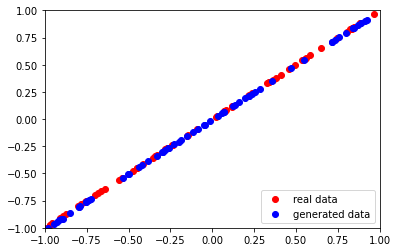

4/4 [==============================] - 0s 2ms/step
Epoch:  8300  Generator Loss:  [0.828409731388092, 0.0]  Discriminator Loss:  [0.67860708 0.5       ]
2/2 [==============================] - 0s 3ms/step


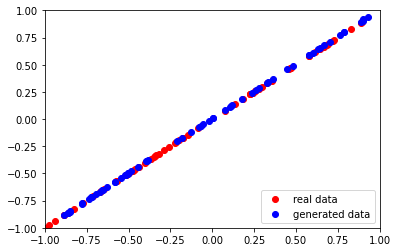

4/4 [==============================] - 0s 2ms/step
Epoch:  8310  Generator Loss:  [0.8155191540718079, 0.0]  Discriminator Loss:  [0.68327925 0.5       ]
2/2 [==============================] - 0s 3ms/step


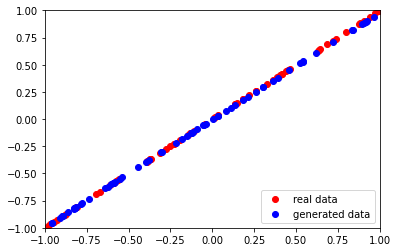

4/4 [==============================] - 0s 2ms/step
Epoch:  8320  Generator Loss:  [0.8153781294822693, 0.0]  Discriminator Loss:  [0.68369874 0.5       ]
2/2 [==============================] - 0s 3ms/step


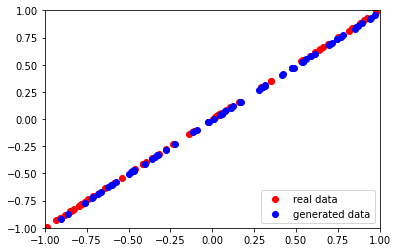

4/4 [==============================] - 0s 2ms/step
Epoch:  8330  Generator Loss:  [0.7975460290908813, 0.0]  Discriminator Loss:  [0.68378422 0.5       ]
2/2 [==============================] - 0s 3ms/step


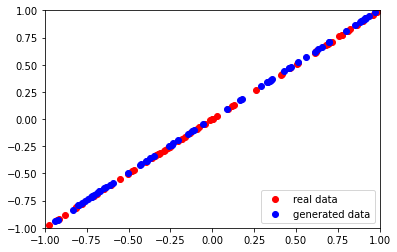

4/4 [==============================] - 0s 2ms/step
Epoch:  8340  Generator Loss:  [0.8139915466308594, 0.0]  Discriminator Loss:  [0.68034622 0.5       ]
2/2 [==============================] - 0s 3ms/step


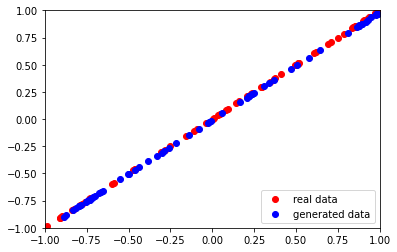

4/4 [==============================] - 0s 2ms/step
Epoch:  8350  Generator Loss:  [0.8057563304901123, 0.0]  Discriminator Loss:  [0.686286 0.5     ]
2/2 [==============================] - 0s 4ms/step


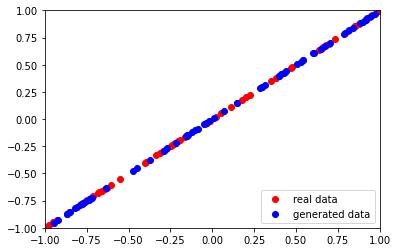

4/4 [==============================] - 0s 2ms/step
Epoch:  8360  Generator Loss:  [0.8168056607246399, 0.0]  Discriminator Loss:  [0.68195826 0.5       ]
2/2 [==============================] - 0s 3ms/step


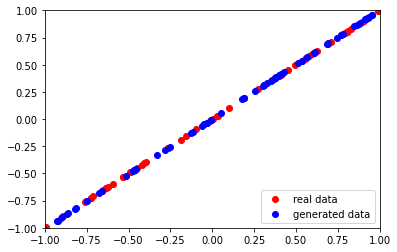

4/4 [==============================] - 0s 2ms/step
Epoch:  8370  Generator Loss:  [0.8169403076171875, 0.0]  Discriminator Loss:  [0.68192843 0.5       ]
2/2 [==============================] - 0s 3ms/step


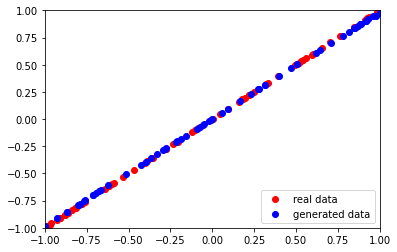

4/4 [==============================] - 0s 3ms/step
Epoch:  8380  Generator Loss:  [0.8184164762496948, 0.0]  Discriminator Loss:  [0.6839979 0.5      ]
2/2 [==============================] - 0s 3ms/step


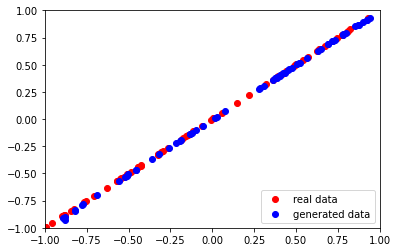

4/4 [==============================] - 0s 2ms/step
Epoch:  8390  Generator Loss:  [0.8213281631469727, 0.0]  Discriminator Loss:  [0.67894605 0.5       ]
2/2 [==============================] - 0s 3ms/step


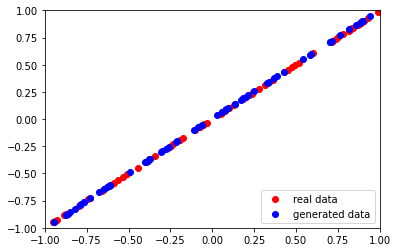

4/4 [==============================] - 0s 2ms/step
Epoch:  8400  Generator Loss:  [0.8151452541351318, 0.0]  Discriminator Loss:  [0.68408933 0.5       ]
2/2 [==============================] - 0s 3ms/step


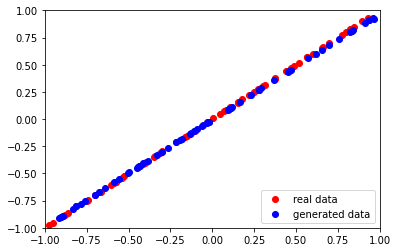

4/4 [==============================] - 0s 2ms/step
Epoch:  8410  Generator Loss:  [0.8124907612800598, 0.0234375]  Discriminator Loss:  [0.68126085 0.49609375]
2/2 [==============================] - 0s 3ms/step


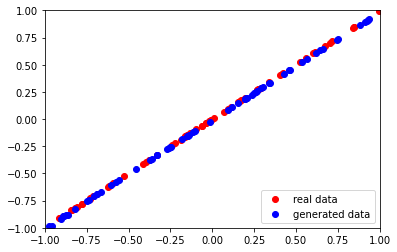

4/4 [==============================] - 0s 2ms/step
Epoch:  8420  Generator Loss:  [0.7705265283584595, 0.0234375]  Discriminator Loss:  [0.69078034 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


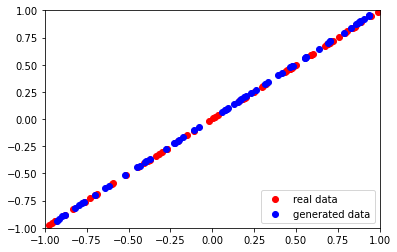

4/4 [==============================] - 0s 2ms/step
Epoch:  8430  Generator Loss:  [0.8251951932907104, 0.0]  Discriminator Loss:  [0.68425816 0.5       ]
2/2 [==============================] - 0s 3ms/step


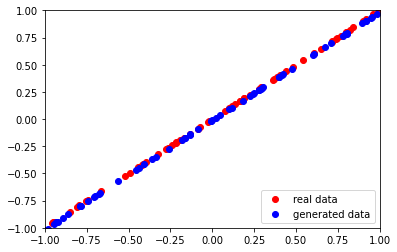

4/4 [==============================] - 0s 2ms/step
Epoch:  8440  Generator Loss:  [0.809147834777832, 0.0]  Discriminator Loss:  [0.68231061 0.5       ]
2/2 [==============================] - 0s 3ms/step


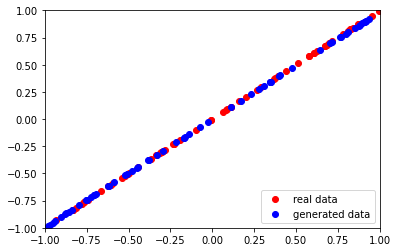

4/4 [==============================] - 0s 2ms/step
Epoch:  8450  Generator Loss:  [0.8026453256607056, 0.0]  Discriminator Loss:  [0.68970054 0.5       ]
2/2 [==============================] - 0s 3ms/step


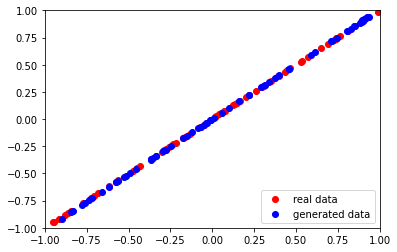

4/4 [==============================] - 0s 2ms/step
Epoch:  8460  Generator Loss:  [0.8099668025970459, 0.0]  Discriminator Loss:  [0.68433499 0.5       ]
2/2 [==============================] - 0s 3ms/step


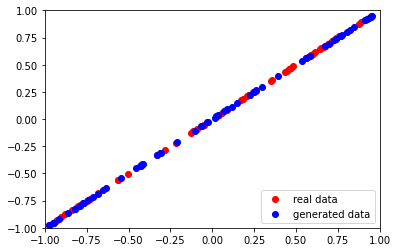

4/4 [==============================] - 0s 2ms/step
Epoch:  8470  Generator Loss:  [0.8110177516937256, 0.0]  Discriminator Loss:  [0.67515498 0.5       ]
2/2 [==============================] - 0s 3ms/step


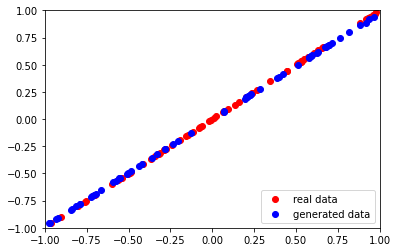

4/4 [==============================] - 0s 6ms/step
Epoch:  8480  Generator Loss:  [0.8035447001457214, 0.0]  Discriminator Loss:  [0.68076202 0.5       ]
2/2 [==============================] - 0s 3ms/step


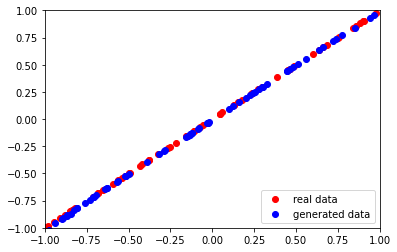

4/4 [==============================] - 0s 2ms/step
Epoch:  8490  Generator Loss:  [0.8102073669433594, 0.0078125]  Discriminator Loss:  [0.68178755 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


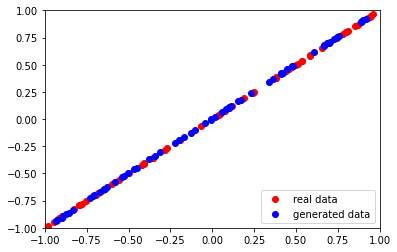

4/4 [==============================] - 0s 2ms/step
Epoch:  8500  Generator Loss:  [0.8241166472434998, 0.0]  Discriminator Loss:  [0.67702067 0.5       ]
2/2 [==============================] - 0s 3ms/step


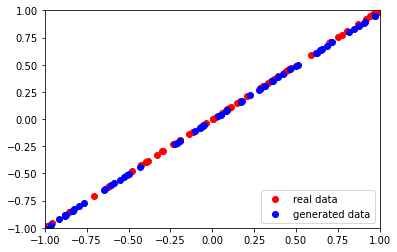

4/4 [==============================] - 0s 2ms/step
Epoch:  8510  Generator Loss:  [0.8067601919174194, 0.0]  Discriminator Loss:  [0.68676013 0.5       ]
2/2 [==============================] - 0s 6ms/step


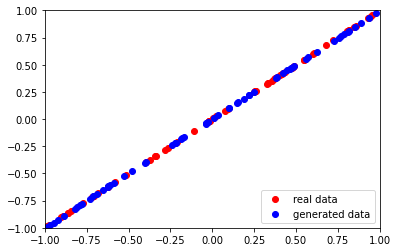

4/4 [==============================] - 0s 2ms/step
Epoch:  8520  Generator Loss:  [0.8122780323028564, 0.0]  Discriminator Loss:  [0.67947409 0.5       ]
2/2 [==============================] - 0s 3ms/step


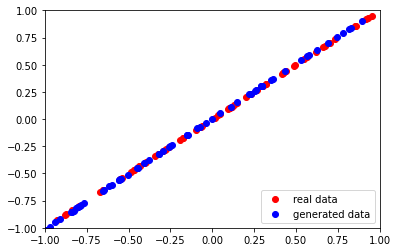

4/4 [==============================] - 0s 2ms/step
Epoch:  8530  Generator Loss:  [0.7933937907218933, 0.0]  Discriminator Loss:  [0.689235 0.5     ]
2/2 [==============================] - 0s 3ms/step


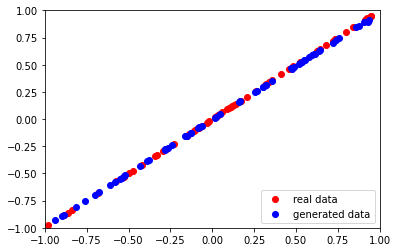

4/4 [==============================] - 0s 2ms/step
Epoch:  8540  Generator Loss:  [0.8113350868225098, 0.0]  Discriminator Loss:  [0.68315643 0.5       ]
2/2 [==============================] - 0s 3ms/step


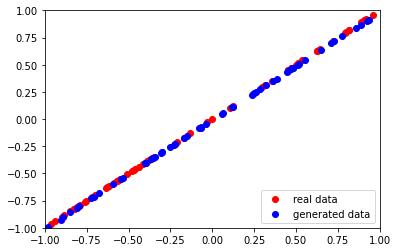

4/4 [==============================] - 0s 2ms/step
Epoch:  8550  Generator Loss:  [0.7814469337463379, 0.0]  Discriminator Loss:  [0.68782696 0.5       ]
2/2 [==============================] - 0s 4ms/step


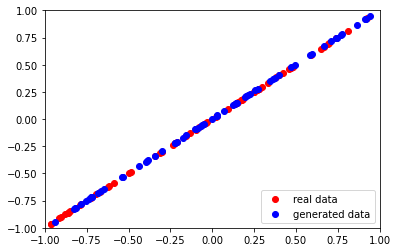

4/4 [==============================] - 0s 5ms/step
Epoch:  8560  Generator Loss:  [0.8117859959602356, 0.0]  Discriminator Loss:  [0.68326464 0.5       ]
2/2 [==============================] - 0s 3ms/step


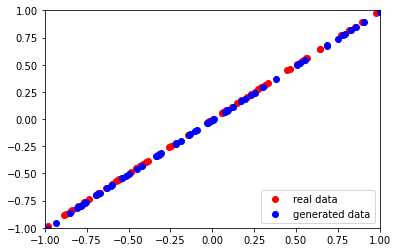

4/4 [==============================] - 0s 2ms/step
Epoch:  8570  Generator Loss:  [0.814699649810791, 0.0]  Discriminator Loss:  [0.67741472 0.5       ]
2/2 [==============================] - 0s 3ms/step


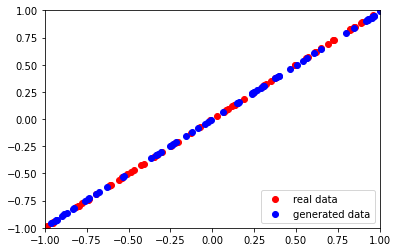

4/4 [==============================] - 0s 2ms/step
Epoch:  8580  Generator Loss:  [0.8025732636451721, 0.0]  Discriminator Loss:  [0.68638498 0.5       ]
2/2 [==============================] - 0s 3ms/step


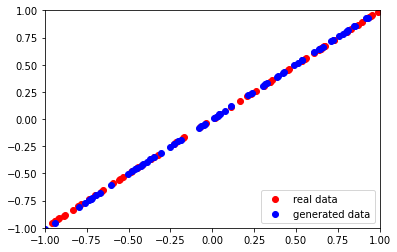

4/4 [==============================] - 0s 2ms/step
Epoch:  8590  Generator Loss:  [0.810423731803894, 0.0]  Discriminator Loss:  [0.69311947 0.5       ]
2/2 [==============================] - 0s 3ms/step


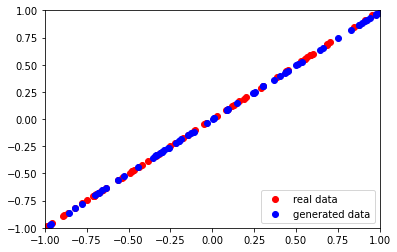

4/4 [==============================] - 0s 2ms/step
Epoch:  8600  Generator Loss:  [0.8245343565940857, 0.0]  Discriminator Loss:  [0.67623049 0.5       ]
2/2 [==============================] - 0s 4ms/step


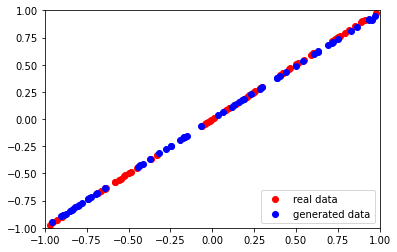

4/4 [==============================] - 0s 2ms/step
Epoch:  8610  Generator Loss:  [0.794958233833313, 0.0]  Discriminator Loss:  [0.68394041 0.5       ]
2/2 [==============================] - 0s 3ms/step


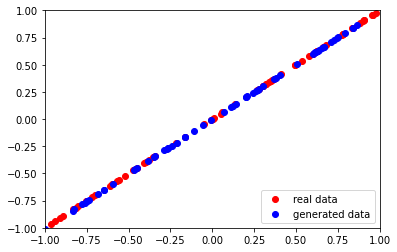

4/4 [==============================] - 0s 2ms/step
Epoch:  8620  Generator Loss:  [0.7962108850479126, 0.0]  Discriminator Loss:  [0.68493977 0.5       ]
2/2 [==============================] - 0s 3ms/step


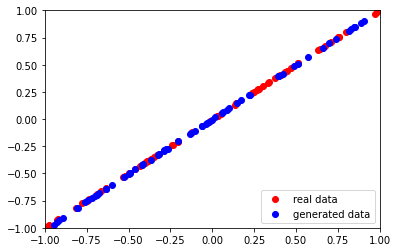

4/4 [==============================] - 0s 2ms/step
Epoch:  8630  Generator Loss:  [0.7983649969100952, 0.0]  Discriminator Loss:  [0.68001118 0.5       ]
2/2 [==============================] - 0s 3ms/step


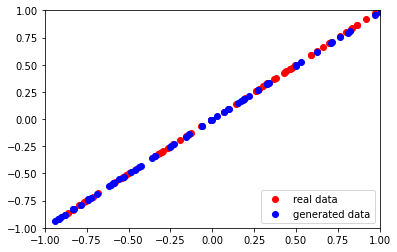

4/4 [==============================] - 0s 2ms/step
Epoch:  8640  Generator Loss:  [0.7904238700866699, 0.0]  Discriminator Loss:  [0.68689609 0.5       ]
2/2 [==============================] - 0s 3ms/step


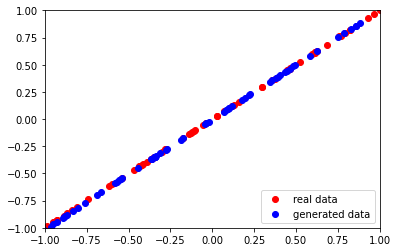

4/4 [==============================] - 0s 2ms/step
Epoch:  8650  Generator Loss:  [0.8209438323974609, 0.0]  Discriminator Loss:  [0.6776329 0.5      ]
2/2 [==============================] - 0s 3ms/step


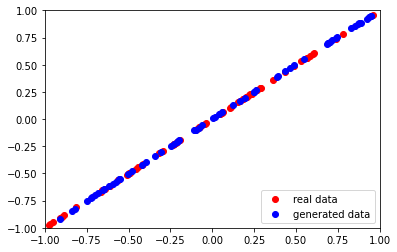

4/4 [==============================] - 0s 2ms/step
Epoch:  8660  Generator Loss:  [0.8021155595779419, 0.0]  Discriminator Loss:  [0.68743506 0.5       ]
2/2 [==============================] - 0s 3ms/step


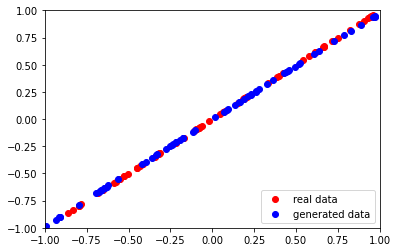

4/4 [==============================] - 0s 2ms/step
Epoch:  8670  Generator Loss:  [0.824845016002655, 0.0]  Discriminator Loss:  [0.68100822 0.5       ]
2/2 [==============================] - 0s 3ms/step


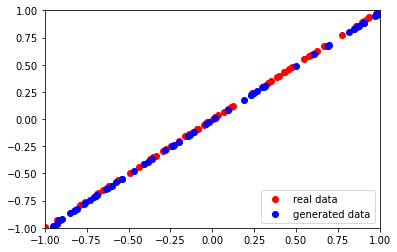

4/4 [==============================] - 0s 2ms/step
Epoch:  8680  Generator Loss:  [0.7797451615333557, 0.0078125]  Discriminator Loss:  [0.68908265 0.5       ]
2/2 [==============================] - 0s 3ms/step


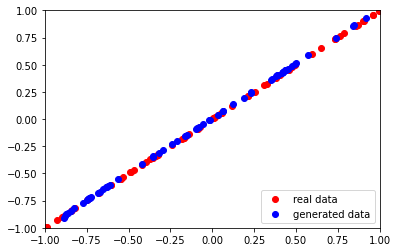

4/4 [==============================] - 0s 2ms/step
Epoch:  8690  Generator Loss:  [0.8170385956764221, 0.0]  Discriminator Loss:  [0.68030757 0.5       ]
2/2 [==============================] - 0s 3ms/step


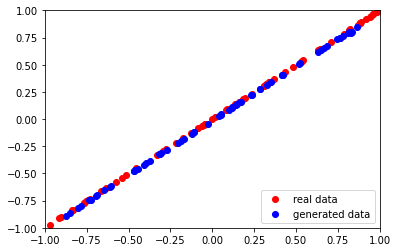

4/4 [==============================] - 0s 2ms/step
Epoch:  8700  Generator Loss:  [0.7968987226486206, 0.0]  Discriminator Loss:  [0.67834592 0.49609375]
2/2 [==============================] - 0s 4ms/step


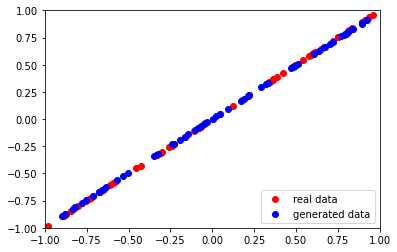

4/4 [==============================] - 0s 2ms/step
Epoch:  8710  Generator Loss:  [0.7865895628929138, 0.0]  Discriminator Loss:  [0.68654072 0.5       ]
2/2 [==============================] - 0s 3ms/step


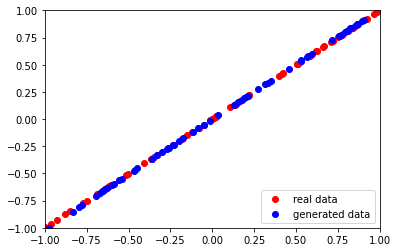

4/4 [==============================] - 0s 2ms/step
Epoch:  8720  Generator Loss:  [0.8066805005073547, 0.0]  Discriminator Loss:  [0.68379527 0.5       ]
2/2 [==============================] - 0s 3ms/step


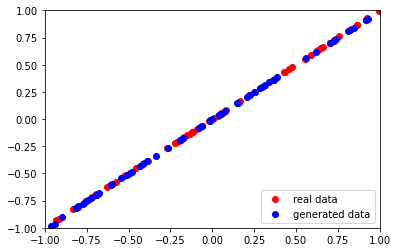

4/4 [==============================] - 0s 2ms/step
Epoch:  8730  Generator Loss:  [0.8100178837776184, 0.0]  Discriminator Loss:  [0.67705077 0.5       ]
2/2 [==============================] - 0s 3ms/step


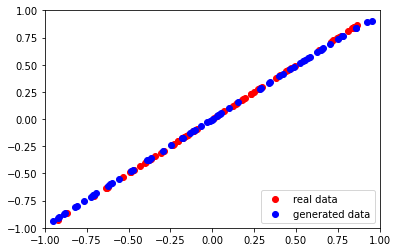

4/4 [==============================] - 0s 2ms/step
Epoch:  8740  Generator Loss:  [0.8082849979400635, 0.0]  Discriminator Loss:  [0.68323615 0.5       ]
2/2 [==============================] - 0s 3ms/step


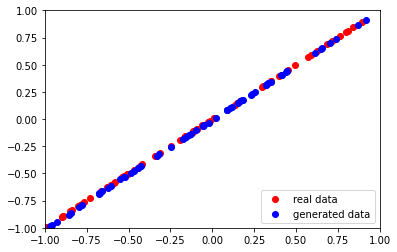

4/4 [==============================] - 0s 2ms/step
Epoch:  8750  Generator Loss:  [0.8168349862098694, 0.0703125]  Discriminator Loss:  [0.6808975 0.4609375]
2/2 [==============================] - 0s 3ms/step


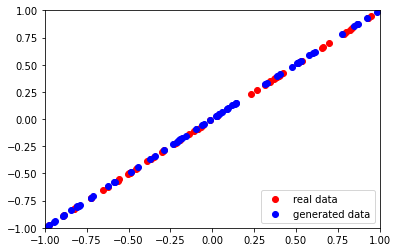

4/4 [==============================] - 0s 2ms/step
Epoch:  8760  Generator Loss:  [0.8245369791984558, 0.0]  Discriminator Loss:  [0.6776908  0.49609375]
2/2 [==============================] - 0s 3ms/step


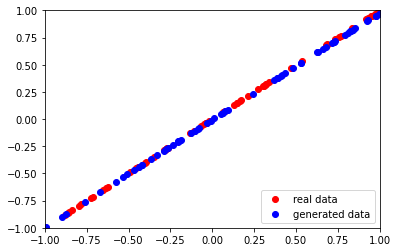

4/4 [==============================] - 0s 2ms/step
Epoch:  8770  Generator Loss:  [0.823807954788208, 0.0]  Discriminator Loss:  [0.68642774 0.5       ]
2/2 [==============================] - 0s 3ms/step


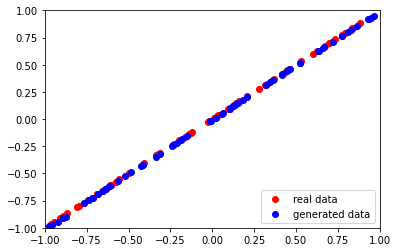

4/4 [==============================] - 0s 2ms/step
Epoch:  8780  Generator Loss:  [0.8198009133338928, 0.0078125]  Discriminator Loss:  [0.67936093 0.5       ]
2/2 [==============================] - 0s 3ms/step


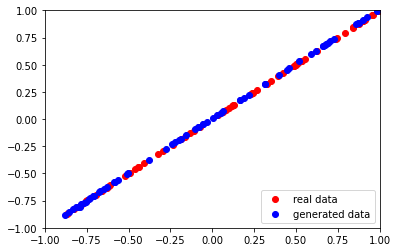

4/4 [==============================] - 0s 2ms/step
Epoch:  8790  Generator Loss:  [0.8252025842666626, 0.0]  Discriminator Loss:  [0.67959049 0.5       ]
2/2 [==============================] - 0s 3ms/step


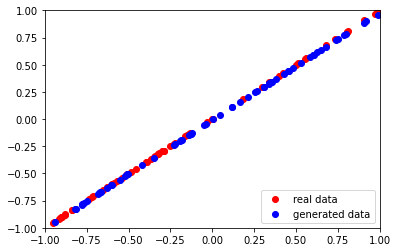

4/4 [==============================] - 0s 2ms/step
Epoch:  8800  Generator Loss:  [0.8007484674453735, 0.015625]  Discriminator Loss:  [0.68533292 0.484375  ]
2/2 [==============================] - 0s 3ms/step


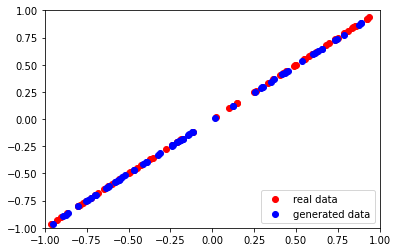

4/4 [==============================] - 0s 2ms/step
Epoch:  8810  Generator Loss:  [0.7953615188598633, 0.0625]  Discriminator Loss:  [0.67942169 0.4765625 ]
2/2 [==============================] - 0s 3ms/step


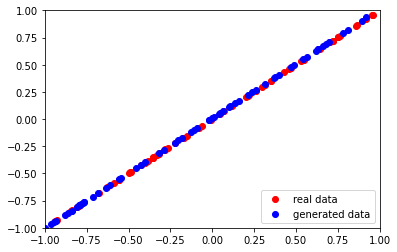

4/4 [==============================] - 0s 2ms/step
Epoch:  8820  Generator Loss:  [0.8174072504043579, 0.0]  Discriminator Loss:  [0.68252379 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


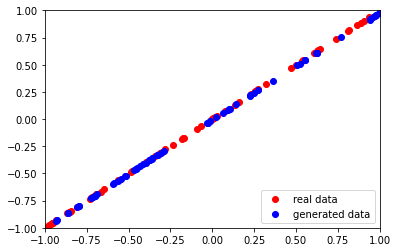

4/4 [==============================] - 0s 2ms/step
Epoch:  8830  Generator Loss:  [0.8231997489929199, 0.0]  Discriminator Loss:  [0.68403524 0.5       ]
2/2 [==============================] - 0s 3ms/step


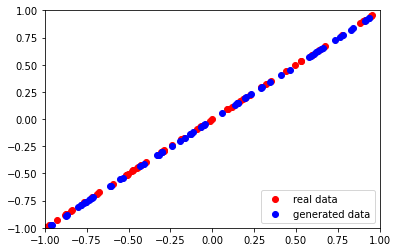

4/4 [==============================] - 0s 2ms/step
Epoch:  8840  Generator Loss:  [0.8263273239135742, 0.0]  Discriminator Loss:  [0.68057975 0.5       ]
2/2 [==============================] - 0s 3ms/step


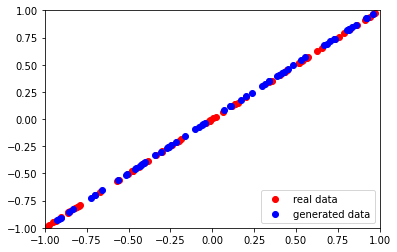

4/4 [==============================] - 0s 2ms/step
Epoch:  8850  Generator Loss:  [0.8154445886611938, 0.0]  Discriminator Loss:  [0.68810874 0.5       ]
2/2 [==============================] - 0s 4ms/step


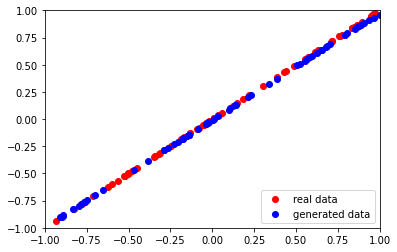

4/4 [==============================] - 0s 2ms/step
Epoch:  8860  Generator Loss:  [0.8139604330062866, 0.0]  Discriminator Loss:  [0.68224436 0.5       ]
2/2 [==============================] - 0s 3ms/step


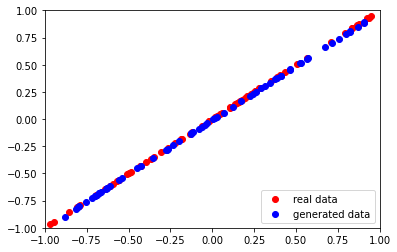

4/4 [==============================] - 0s 2ms/step
Epoch:  8870  Generator Loss:  [0.7858060002326965, 0.0]  Discriminator Loss:  [0.68995509 0.49609375]
2/2 [==============================] - 0s 3ms/step


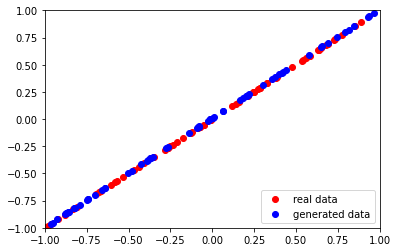

4/4 [==============================] - 0s 2ms/step
Epoch:  8880  Generator Loss:  [0.8302165269851685, 0.0]  Discriminator Loss:  [0.68170819 0.5       ]
2/2 [==============================] - 0s 3ms/step


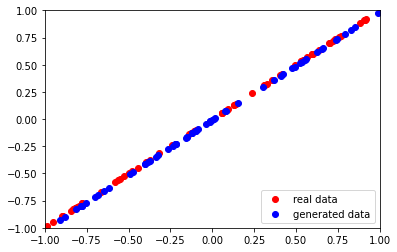

4/4 [==============================] - 0s 3ms/step
Epoch:  8890  Generator Loss:  [0.8162438273429871, 0.0]  Discriminator Loss:  [0.68422627 0.5       ]
2/2 [==============================] - 0s 4ms/step


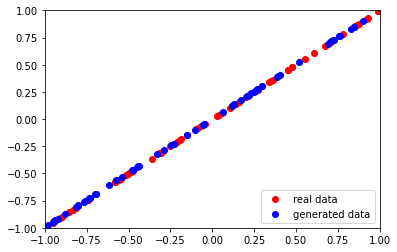

4/4 [==============================] - 0s 2ms/step
Epoch:  8900  Generator Loss:  [0.8290714025497437, 0.0]  Discriminator Loss:  [0.67866954 0.5       ]
2/2 [==============================] - 0s 3ms/step


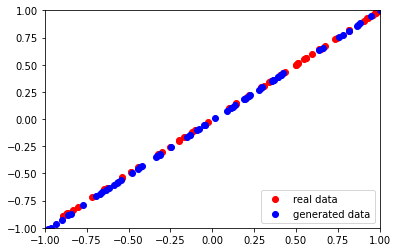

4/4 [==============================] - 0s 2ms/step
Epoch:  8910  Generator Loss:  [0.8156468272209167, 0.0]  Discriminator Loss:  [0.68445674 0.5       ]
2/2 [==============================] - 0s 7ms/step


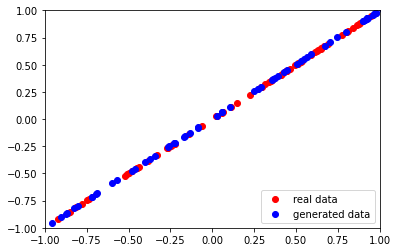

4/4 [==============================] - 0s 2ms/step
Epoch:  8920  Generator Loss:  [0.837780237197876, 0.0]  Discriminator Loss:  [0.67873234 0.5       ]
2/2 [==============================] - 0s 4ms/step


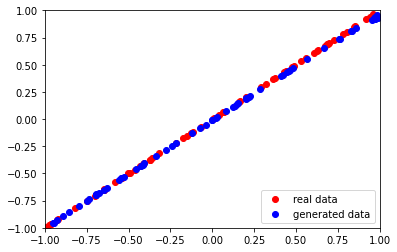

4/4 [==============================] - 0s 2ms/step
Epoch:  8930  Generator Loss:  [0.8127849698066711, 0.0]  Discriminator Loss:  [0.68383077 0.5       ]
2/2 [==============================] - 0s 3ms/step


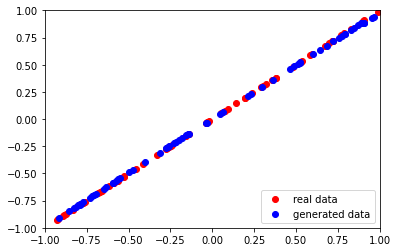

4/4 [==============================] - 0s 2ms/step
Epoch:  8940  Generator Loss:  [0.7855522632598877, 0.0]  Discriminator Loss:  [0.69143751 0.5       ]
2/2 [==============================] - 0s 4ms/step


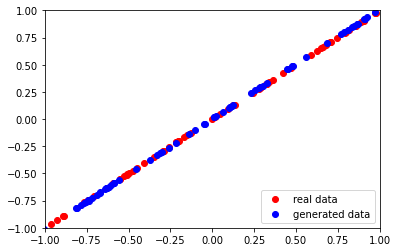

4/4 [==============================] - 0s 5ms/step
Epoch:  8950  Generator Loss:  [0.804469883441925, 0.0]  Discriminator Loss:  [0.68976596 0.5       ]
2/2 [==============================] - 0s 4ms/step


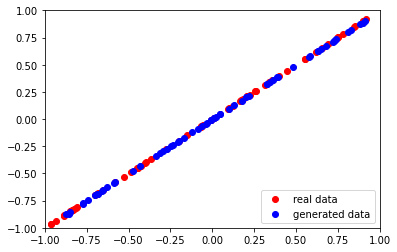

4/4 [==============================] - 0s 2ms/step
Epoch:  8960  Generator Loss:  [0.8286936283111572, 0.0]  Discriminator Loss:  [0.67297992 0.5       ]
2/2 [==============================] - 0s 3ms/step


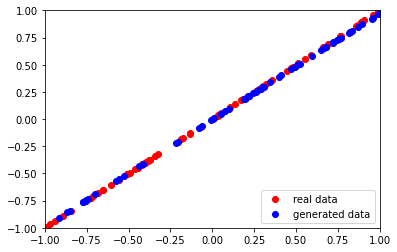

4/4 [==============================] - 0s 2ms/step
Epoch:  8970  Generator Loss:  [0.8099391460418701, 0.0]  Discriminator Loss:  [0.67888397 0.5       ]
2/2 [==============================] - 0s 3ms/step


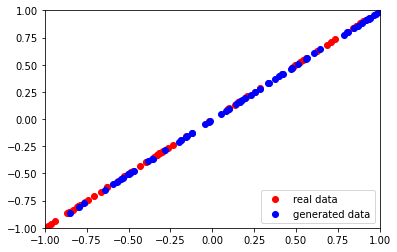

4/4 [==============================] - 0s 2ms/step
Epoch:  8980  Generator Loss:  [0.8129650354385376, 0.015625]  Discriminator Loss:  [0.6806362 0.5      ]
2/2 [==============================] - 0s 3ms/step


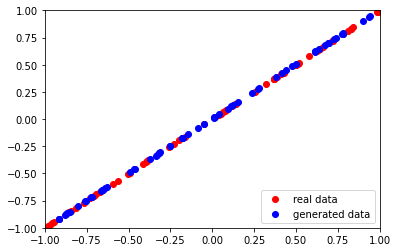

4/4 [==============================] - 0s 2ms/step
Epoch:  8990  Generator Loss:  [0.8219213485717773, 0.0]  Discriminator Loss:  [0.67652789 0.5       ]
2/2 [==============================] - 0s 4ms/step


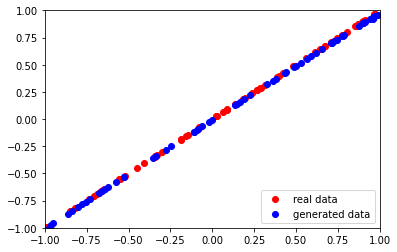

4/4 [==============================] - 0s 2ms/step
Epoch:  9000  Generator Loss:  [0.8149205446243286, 0.0]  Discriminator Loss:  [0.686371 0.5     ]
2/2 [==============================] - 0s 3ms/step


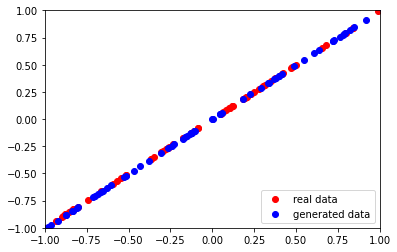

4/4 [==============================] - 0s 2ms/step
Epoch:  9010  Generator Loss:  [0.8333953619003296, 0.0]  Discriminator Loss:  [0.67652678 0.5       ]
2/2 [==============================] - 0s 3ms/step


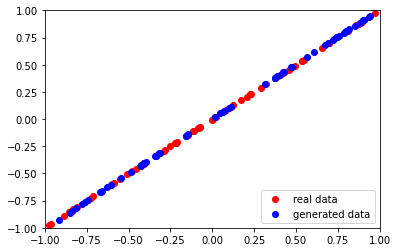

4/4 [==============================] - 0s 2ms/step
Epoch:  9020  Generator Loss:  [0.8062548637390137, 0.0]  Discriminator Loss:  [0.68617365 0.5       ]
2/2 [==============================] - 0s 3ms/step


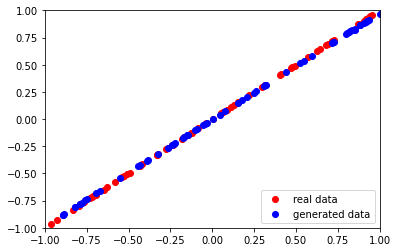

4/4 [==============================] - 0s 2ms/step
Epoch:  9030  Generator Loss:  [0.8105000853538513, 0.0]  Discriminator Loss:  [0.68533745 0.5       ]
2/2 [==============================] - 0s 3ms/step


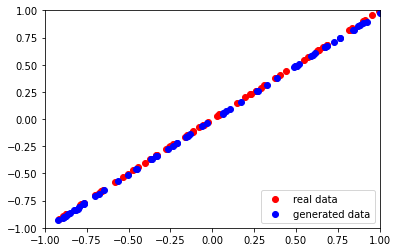

4/4 [==============================] - 0s 2ms/step
Epoch:  9040  Generator Loss:  [0.7771555781364441, 0.0]  Discriminator Loss:  [0.69249207 0.5       ]
2/2 [==============================] - 0s 3ms/step


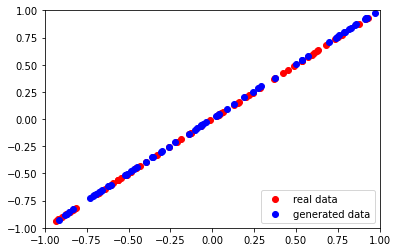

4/4 [==============================] - 0s 2ms/step
Epoch:  9050  Generator Loss:  [0.814179539680481, 0.0]  Discriminator Loss:  [0.68512398 0.5       ]
2/2 [==============================] - 0s 3ms/step


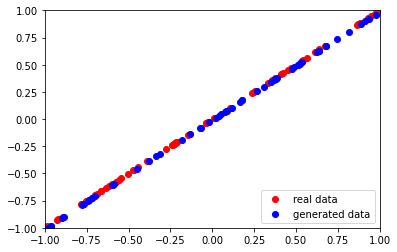

4/4 [==============================] - 0s 3ms/step
Epoch:  9060  Generator Loss:  [0.819001317024231, 0.0]  Discriminator Loss:  [0.67943713 0.5       ]
2/2 [==============================] - 0s 4ms/step


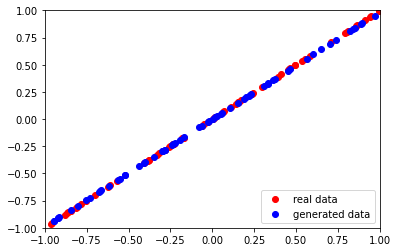

4/4 [==============================] - 0s 2ms/step
Epoch:  9070  Generator Loss:  [0.7964229583740234, 0.0]  Discriminator Loss:  [0.68491691 0.5       ]
2/2 [==============================] - 0s 3ms/step


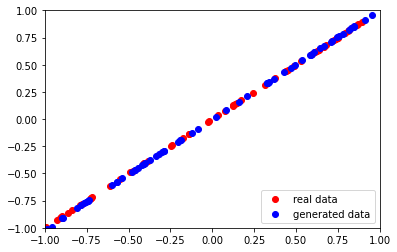

4/4 [==============================] - 0s 2ms/step
Epoch:  9080  Generator Loss:  [0.8186488151550293, 0.015625]  Discriminator Loss:  [0.68859598 0.48828125]
2/2 [==============================] - 0s 4ms/step


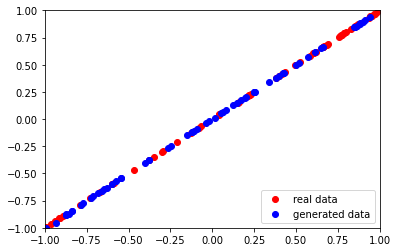

4/4 [==============================] - 0s 2ms/step
Epoch:  9090  Generator Loss:  [0.8222644329071045, 0.0]  Discriminator Loss:  [0.67489409 0.5       ]
2/2 [==============================] - 0s 3ms/step


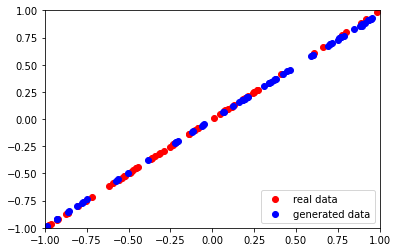

4/4 [==============================] - 0s 3ms/step
Epoch:  9100  Generator Loss:  [0.8213576078414917, 0.0]  Discriminator Loss:  [0.68215165 0.5       ]
2/2 [==============================] - 0s 3ms/step


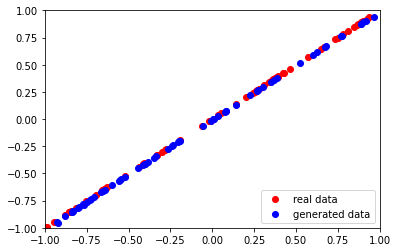

4/4 [==============================] - 0s 2ms/step
Epoch:  9110  Generator Loss:  [0.8049432635307312, 0.0]  Discriminator Loss:  [0.67915204 0.5       ]
2/2 [==============================] - 0s 3ms/step


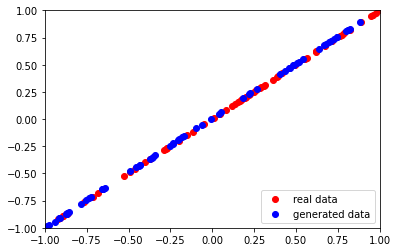

4/4 [==============================] - 0s 2ms/step
Epoch:  9120  Generator Loss:  [0.8213914036750793, 0.0]  Discriminator Loss:  [0.67680365 0.5       ]
2/2 [==============================] - 0s 3ms/step


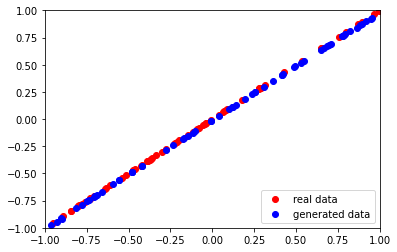

4/4 [==============================] - 0s 3ms/step
Epoch:  9130  Generator Loss:  [0.8097817897796631, 0.0]  Discriminator Loss:  [0.6834051 0.5      ]
2/2 [==============================] - 0s 3ms/step


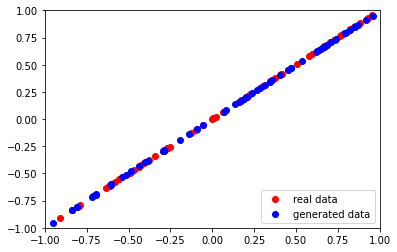

4/4 [==============================] - 0s 2ms/step
Epoch:  9140  Generator Loss:  [0.8130108118057251, 0.0]  Discriminator Loss:  [0.68074697 0.5       ]
2/2 [==============================] - 0s 3ms/step


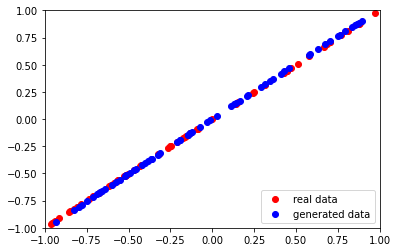

4/4 [==============================] - 0s 2ms/step
Epoch:  9150  Generator Loss:  [0.8099325895309448, 0.0]  Discriminator Loss:  [0.69665092 0.5       ]
2/2 [==============================] - 0s 3ms/step


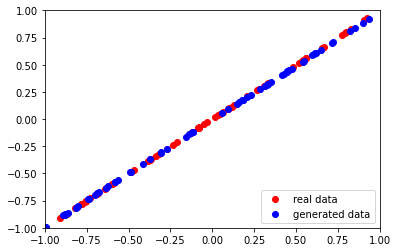

4/4 [==============================] - 0s 2ms/step
Epoch:  9160  Generator Loss:  [0.8281216621398926, 0.0]  Discriminator Loss:  [0.67653254 0.5       ]
2/2 [==============================] - 0s 4ms/step


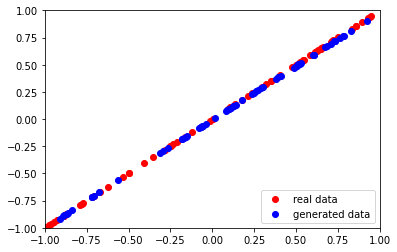

4/4 [==============================] - 0s 3ms/step
Epoch:  9170  Generator Loss:  [0.7991729974746704, 0.0]  Discriminator Loss:  [0.68167129 0.5       ]
2/2 [==============================] - 0s 4ms/step


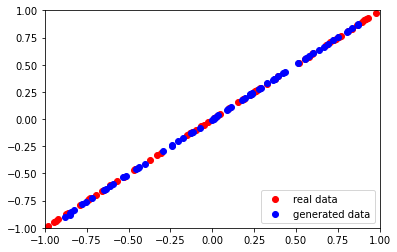

4/4 [==============================] - 0s 2ms/step
Epoch:  9180  Generator Loss:  [0.8068915605545044, 0.0]  Discriminator Loss:  [0.67894647 0.48828125]
2/2 [==============================] - 0s 3ms/step


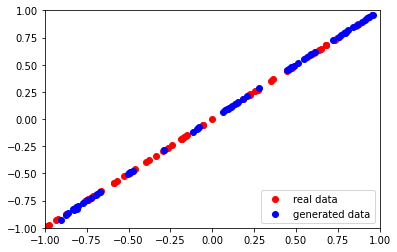

4/4 [==============================] - 0s 2ms/step
Epoch:  9190  Generator Loss:  [0.8101806640625, 0.0]  Discriminator Loss:  [0.67572355 0.49609375]
2/2 [==============================] - 0s 3ms/step


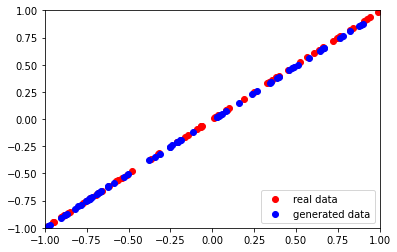

4/4 [==============================] - 0s 2ms/step
Epoch:  9200  Generator Loss:  [0.7968370318412781, 0.0]  Discriminator Loss:  [0.68735534 0.5       ]
2/2 [==============================] - 0s 3ms/step


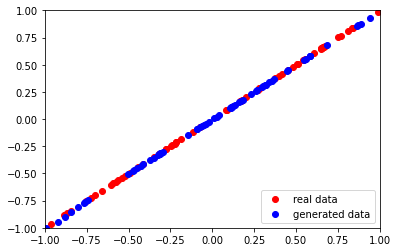

4/4 [==============================] - 0s 2ms/step
Epoch:  9210  Generator Loss:  [0.8125191926956177, 0.0]  Discriminator Loss:  [0.67863476 0.5       ]
2/2 [==============================] - 0s 4ms/step


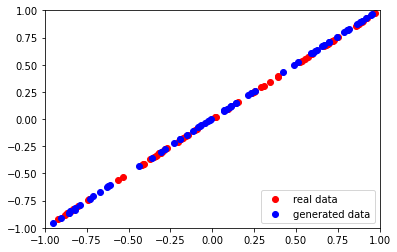

4/4 [==============================] - 0s 2ms/step
Epoch:  9220  Generator Loss:  [0.8088877201080322, 0.0]  Discriminator Loss:  [0.6872358 0.5      ]
2/2 [==============================] - 0s 3ms/step


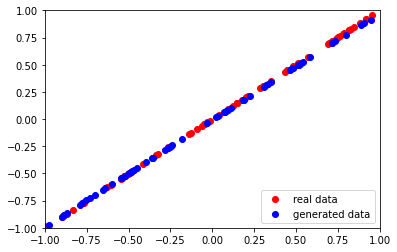

4/4 [==============================] - 0s 2ms/step
Epoch:  9230  Generator Loss:  [0.8163291215896606, 0.0]  Discriminator Loss:  [0.67928222 0.5       ]
2/2 [==============================] - 0s 4ms/step


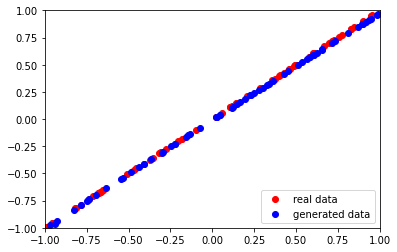

4/4 [==============================] - 0s 2ms/step
Epoch:  9240  Generator Loss:  [0.782219409942627, 0.0]  Discriminator Loss:  [0.68921316 0.5       ]
2/2 [==============================] - 0s 4ms/step


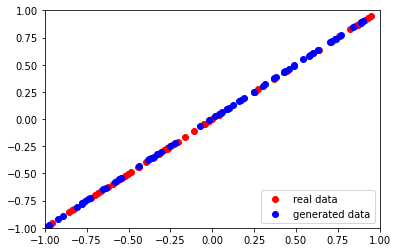

4/4 [==============================] - 0s 2ms/step
Epoch:  9250  Generator Loss:  [0.8212317228317261, 0.0]  Discriminator Loss:  [0.68034476 0.5       ]
2/2 [==============================] - 0s 3ms/step


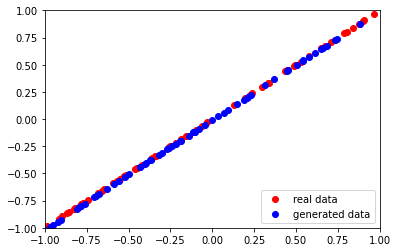

4/4 [==============================] - 0s 2ms/step
Epoch:  9260  Generator Loss:  [0.8018433451652527, 0.0]  Discriminator Loss:  [0.68408915 0.5       ]
2/2 [==============================] - 0s 3ms/step


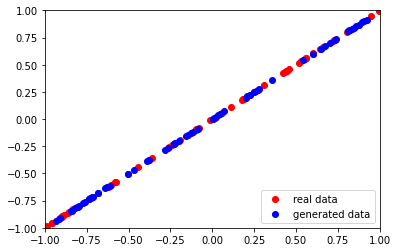

4/4 [==============================] - 0s 2ms/step
Epoch:  9270  Generator Loss:  [0.8075075149536133, 0.0]  Discriminator Loss:  [0.69075209 0.5       ]
2/2 [==============================] - 0s 3ms/step


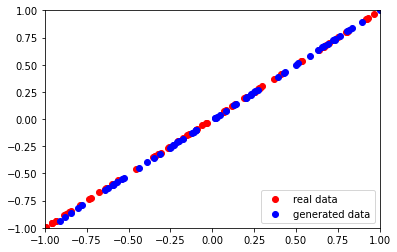

4/4 [==============================] - 0s 3ms/step
Epoch:  9280  Generator Loss:  [0.8104798793792725, 0.0]  Discriminator Loss:  [0.67968792 0.5       ]
2/2 [==============================] - 0s 6ms/step


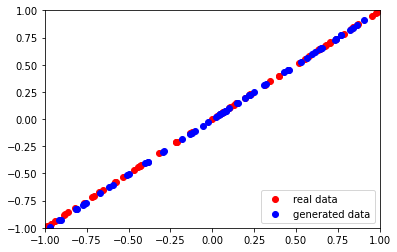

4/4 [==============================] - 0s 2ms/step
Epoch:  9290  Generator Loss:  [0.8088058829307556, 0.0]  Discriminator Loss:  [0.67954114 0.5       ]
2/2 [==============================] - 0s 4ms/step


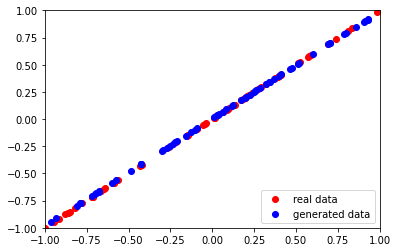

4/4 [==============================] - 0s 2ms/step
Epoch:  9300  Generator Loss:  [0.8188834190368652, 0.0]  Discriminator Loss:  [0.68584776 0.5       ]
2/2 [==============================] - 0s 4ms/step


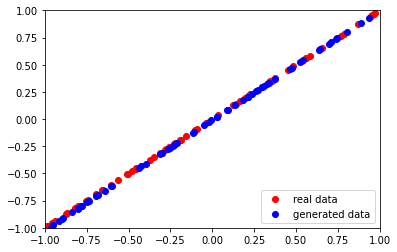

4/4 [==============================] - 0s 2ms/step
Epoch:  9310  Generator Loss:  [0.8081409931182861, 0.0]  Discriminator Loss:  [0.67861825 0.5       ]
2/2 [==============================] - 0s 3ms/step


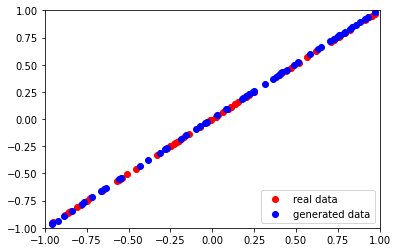

4/4 [==============================] - 0s 2ms/step
Epoch:  9320  Generator Loss:  [0.8049355149269104, 0.0]  Discriminator Loss:  [0.69137943 0.5       ]
2/2 [==============================] - 0s 4ms/step


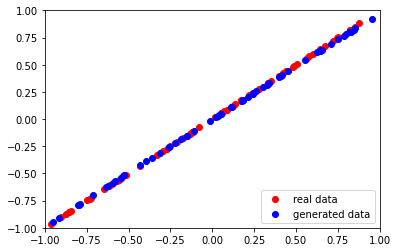

4/4 [==============================] - 0s 2ms/step
Epoch:  9330  Generator Loss:  [0.8195643424987793, 0.0]  Discriminator Loss:  [0.68197858 0.5       ]
2/2 [==============================] - 0s 4ms/step


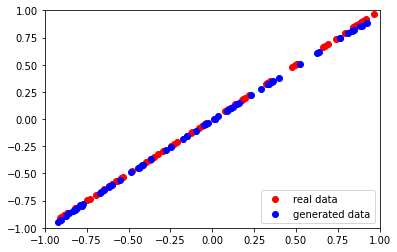

4/4 [==============================] - 0s 2ms/step
Epoch:  9340  Generator Loss:  [0.7746548652648926, 0.0]  Discriminator Loss:  [0.68680382 0.5       ]
2/2 [==============================] - 0s 4ms/step


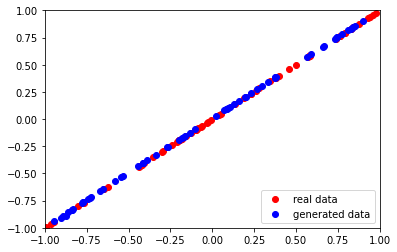

4/4 [==============================] - 0s 2ms/step
Epoch:  9350  Generator Loss:  [0.8181568384170532, 0.0]  Discriminator Loss:  [0.68185112 0.5       ]
2/2 [==============================] - 0s 4ms/step


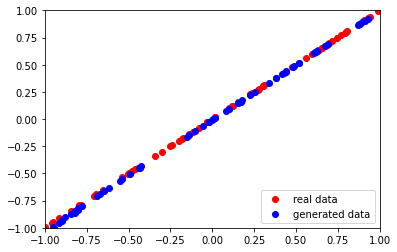

4/4 [==============================] - 0s 2ms/step
Epoch:  9360  Generator Loss:  [0.7976545691490173, 0.03125]  Discriminator Loss:  [0.68242729 0.484375  ]
2/2 [==============================] - 0s 3ms/step


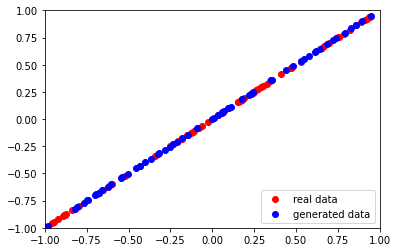

4/4 [==============================] - 0s 2ms/step
Epoch:  9370  Generator Loss:  [0.808777928352356, 0.015625]  Discriminator Loss:  [0.67963409 0.49609375]
2/2 [==============================] - 0s 4ms/step


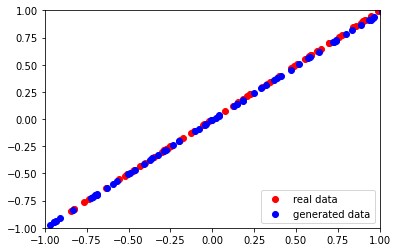

4/4 [==============================] - 0s 2ms/step
Epoch:  9380  Generator Loss:  [0.8033879995346069, 0.0]  Discriminator Loss:  [0.68625066 0.5       ]
2/2 [==============================] - 0s 5ms/step


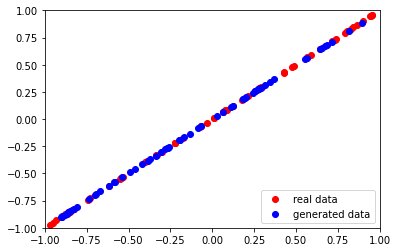

4/4 [==============================] - 0s 4ms/step
Epoch:  9390  Generator Loss:  [0.8100156188011169, 0.0]  Discriminator Loss:  [0.68106914 0.5       ]
2/2 [==============================] - 0s 5ms/step


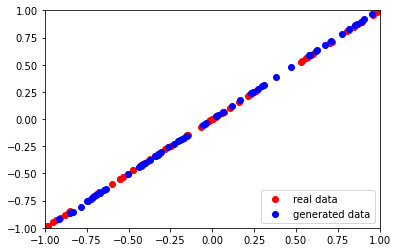

4/4 [==============================] - 0s 2ms/step
Epoch:  9400  Generator Loss:  [0.7950282096862793, 0.0078125]  Discriminator Loss:  [0.6901699 0.5      ]
2/2 [==============================] - 0s 4ms/step


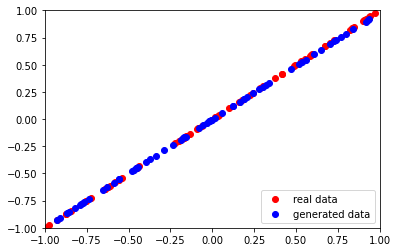

4/4 [==============================] - 0s 2ms/step
Epoch:  9410  Generator Loss:  [0.8079767227172852, 0.0]  Discriminator Loss:  [0.6869258 0.5      ]
2/2 [==============================] - 0s 5ms/step


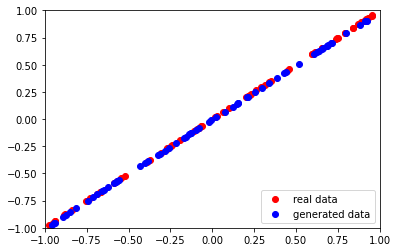

4/4 [==============================] - 0s 2ms/step
Epoch:  9420  Generator Loss:  [0.7863714694976807, 0.0]  Discriminator Loss:  [0.69002861 0.5       ]
2/2 [==============================] - 0s 4ms/step


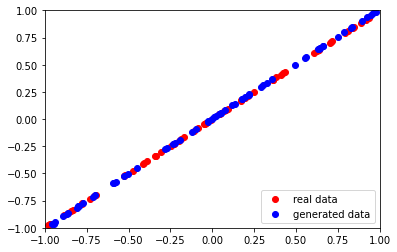

4/4 [==============================] - 0s 2ms/step
Epoch:  9430  Generator Loss:  [0.8147984743118286, 0.0]  Discriminator Loss:  [0.69048005 0.5       ]
2/2 [==============================] - 0s 3ms/step


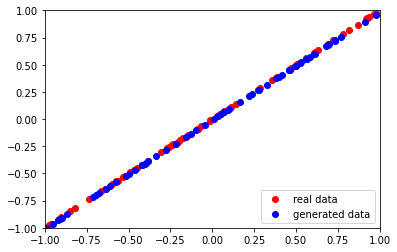

4/4 [==============================] - 0s 2ms/step
Epoch:  9440  Generator Loss:  [0.8331354856491089, 0.0]  Discriminator Loss:  [0.67787573 0.5       ]
2/2 [==============================] - 0s 3ms/step


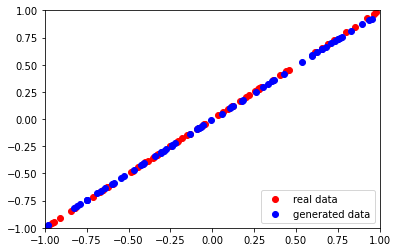

4/4 [==============================] - 0s 2ms/step
Epoch:  9450  Generator Loss:  [0.7882892489433289, 0.0]  Discriminator Loss:  [0.68703598 0.5       ]
2/2 [==============================] - 0s 4ms/step


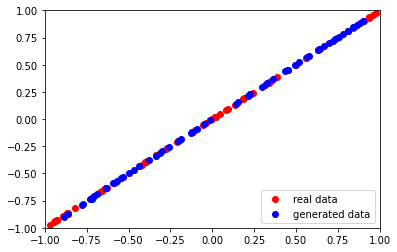

4/4 [==============================] - 0s 2ms/step
Epoch:  9460  Generator Loss:  [0.8015224933624268, 0.0]  Discriminator Loss:  [0.68458757 0.5       ]
2/2 [==============================] - 0s 4ms/step


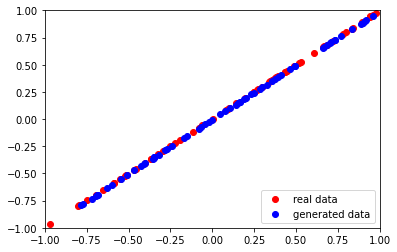

4/4 [==============================] - 0s 2ms/step
Epoch:  9470  Generator Loss:  [0.7905086278915405, 0.015625]  Discriminator Loss:  [0.67870295 0.4921875 ]
2/2 [==============================] - 0s 3ms/step


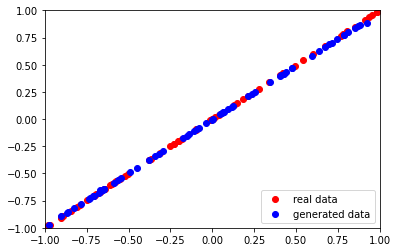

4/4 [==============================] - 0s 2ms/step
Epoch:  9480  Generator Loss:  [0.780044436454773, 0.015625]  Discriminator Loss:  [0.6864998 0.5      ]
2/2 [==============================] - 0s 4ms/step


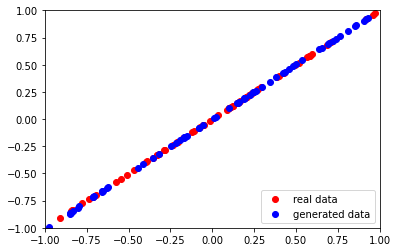

4/4 [==============================] - 0s 2ms/step
Epoch:  9490  Generator Loss:  [0.8136526346206665, 0.0703125]  Discriminator Loss:  [0.67595175 0.484375  ]
2/2 [==============================] - 0s 3ms/step


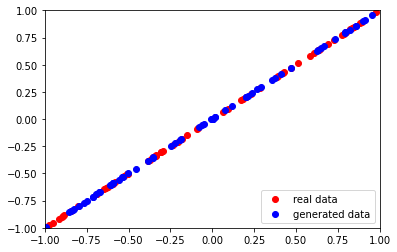

4/4 [==============================] - 0s 3ms/step
Epoch:  9500  Generator Loss:  [0.815388560295105, 0.0]  Discriminator Loss:  [0.678114 0.5     ]
2/2 [==============================] - 0s 4ms/step


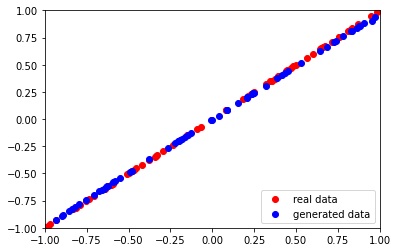

4/4 [==============================] - 0s 2ms/step
Epoch:  9510  Generator Loss:  [0.823785662651062, 0.0]  Discriminator Loss:  [0.68159276 0.5       ]
2/2 [==============================] - 0s 4ms/step


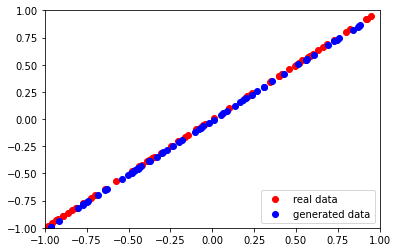

4/4 [==============================] - 0s 2ms/step
Epoch:  9520  Generator Loss:  [0.7899488210678101, 0.0]  Discriminator Loss:  [0.68920648 0.5       ]
2/2 [==============================] - 0s 3ms/step


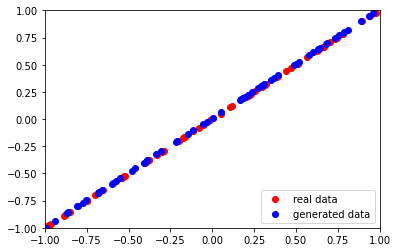

4/4 [==============================] - 0s 2ms/step
Epoch:  9530  Generator Loss:  [0.822786808013916, 0.0]  Discriminator Loss:  [0.68969473 0.5       ]
2/2 [==============================] - 0s 4ms/step


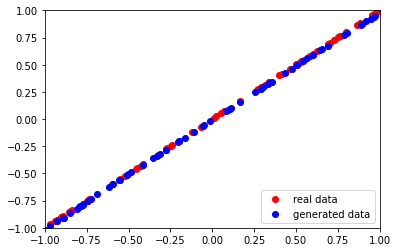

4/4 [==============================] - 0s 2ms/step
Epoch:  9540  Generator Loss:  [0.8258256316184998, 0.0]  Discriminator Loss:  [0.67702115 0.5       ]
2/2 [==============================] - 0s 3ms/step


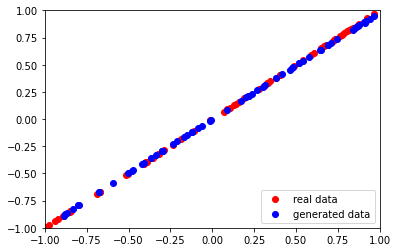

4/4 [==============================] - 0s 2ms/step
Epoch:  9550  Generator Loss:  [0.8032224178314209, 0.0]  Discriminator Loss:  [0.68396989 0.5       ]
2/2 [==============================] - 0s 3ms/step


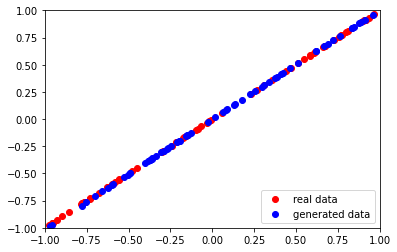

4/4 [==============================] - 0s 2ms/step
Epoch:  9560  Generator Loss:  [0.810808002948761, 0.0]  Discriminator Loss:  [0.68788049 0.5       ]
2/2 [==============================] - 0s 3ms/step


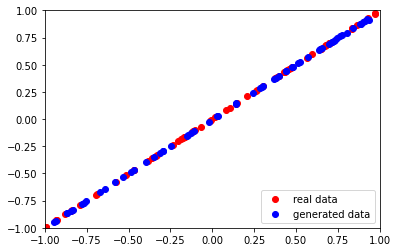

4/4 [==============================] - 0s 2ms/step
Epoch:  9570  Generator Loss:  [0.8473235368728638, 0.0]  Discriminator Loss:  [0.67499381 0.5       ]
2/2 [==============================] - 0s 4ms/step


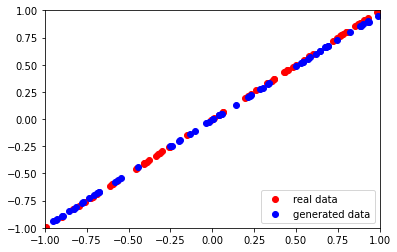

4/4 [==============================] - 0s 2ms/step
Epoch:  9580  Generator Loss:  [0.8131138682365417, 0.0]  Discriminator Loss:  [0.67843774 0.5       ]
2/2 [==============================] - 0s 4ms/step


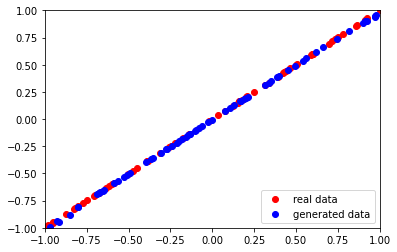

4/4 [==============================] - 0s 2ms/step
Epoch:  9590  Generator Loss:  [0.8067609071731567, 0.0]  Discriminator Loss:  [0.68338877 0.5       ]
2/2 [==============================] - 0s 4ms/step


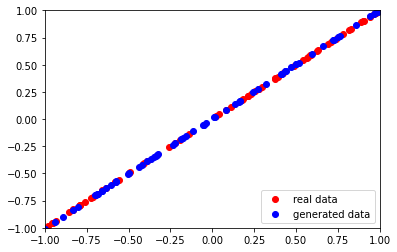

4/4 [==============================] - 0s 3ms/step
Epoch:  9600  Generator Loss:  [0.8161396384239197, 0.0]  Discriminator Loss:  [0.67797646 0.5       ]
2/2 [==============================] - 0s 5ms/step


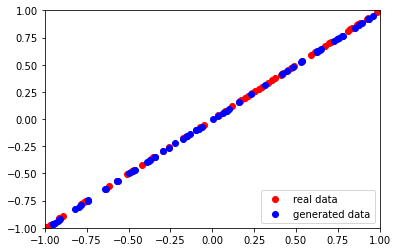

4/4 [==============================] - 0s 3ms/step
Epoch:  9610  Generator Loss:  [0.8048288226127625, 0.0]  Discriminator Loss:  [0.6906445 0.5      ]
2/2 [==============================] - 0s 4ms/step


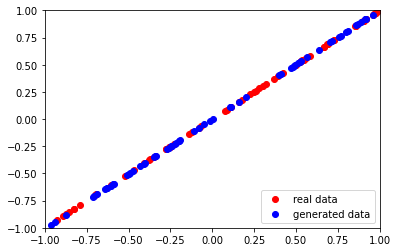

4/4 [==============================] - 0s 2ms/step
Epoch:  9620  Generator Loss:  [0.8255770206451416, 0.0]  Discriminator Loss:  [0.67834264 0.5       ]
2/2 [==============================] - 0s 3ms/step


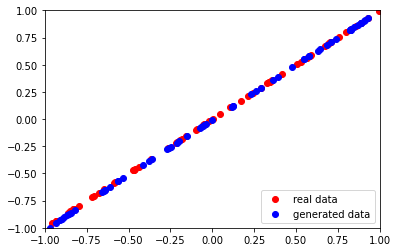

4/4 [==============================] - 0s 2ms/step
Epoch:  9630  Generator Loss:  [0.8045545816421509, 0.0]  Discriminator Loss:  [0.68262854 0.5       ]
2/2 [==============================] - 0s 3ms/step


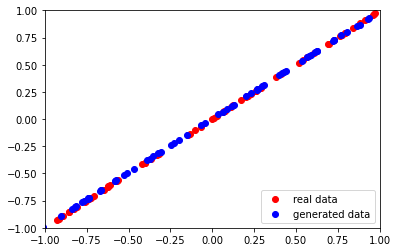

4/4 [==============================] - 0s 2ms/step
Epoch:  9640  Generator Loss:  [0.8107469081878662, 0.0]  Discriminator Loss:  [0.68411294 0.5       ]
2/2 [==============================] - 0s 5ms/step


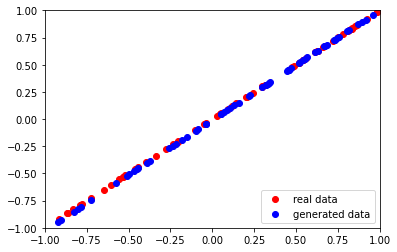

4/4 [==============================] - 0s 2ms/step
Epoch:  9650  Generator Loss:  [0.8190895318984985, 0.0]  Discriminator Loss:  [0.67862394 0.5       ]
2/2 [==============================] - 0s 4ms/step


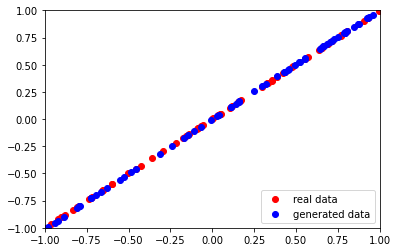

4/4 [==============================] - 0s 2ms/step
Epoch:  9660  Generator Loss:  [0.8256617188453674, 0.0]  Discriminator Loss:  [0.67688918 0.5       ]
2/2 [==============================] - 0s 3ms/step


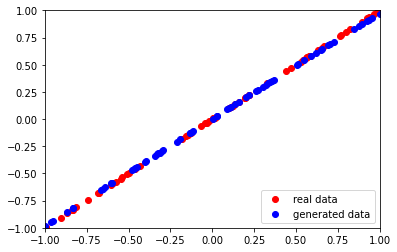

4/4 [==============================] - 0s 2ms/step
Epoch:  9670  Generator Loss:  [0.8182801008224487, 0.0]  Discriminator Loss:  [0.67897907 0.5       ]
2/2 [==============================] - 0s 3ms/step


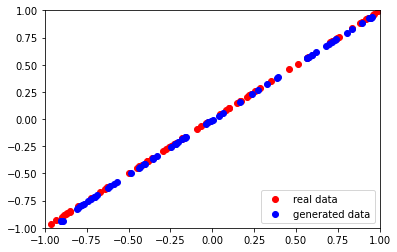

4/4 [==============================] - 0s 2ms/step
Epoch:  9680  Generator Loss:  [0.808570384979248, 0.0]  Discriminator Loss:  [0.67717189 0.5       ]
2/2 [==============================] - 0s 3ms/step


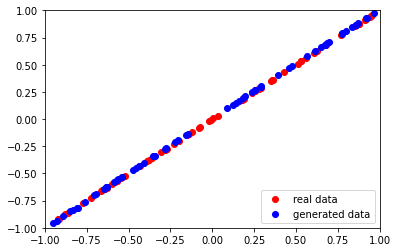

4/4 [==============================] - 0s 2ms/step
Epoch:  9690  Generator Loss:  [0.8129456043243408, 0.0]  Discriminator Loss:  [0.68009713 0.5       ]
2/2 [==============================] - 0s 5ms/step


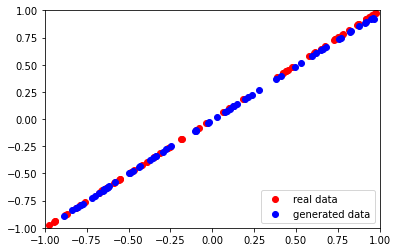

4/4 [==============================] - 0s 2ms/step
Epoch:  9700  Generator Loss:  [0.8110167980194092, 0.0]  Discriminator Loss:  [0.67682752 0.5       ]
2/2 [==============================] - 0s 3ms/step


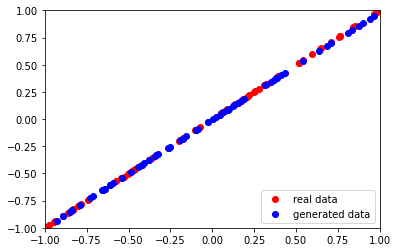

4/4 [==============================] - 0s 2ms/step
Epoch:  9710  Generator Loss:  [0.7803324460983276, 0.0]  Discriminator Loss:  [0.68892154 0.5       ]
2/2 [==============================] - 0s 4ms/step


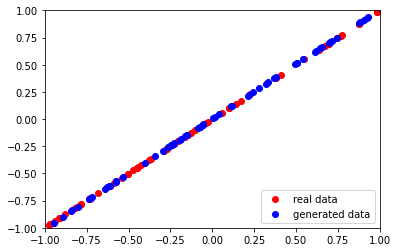

4/4 [==============================] - 0s 2ms/step
Epoch:  9720  Generator Loss:  [0.813139796257019, 0.0]  Discriminator Loss:  [0.68591842 0.5       ]
2/2 [==============================] - 0s 3ms/step


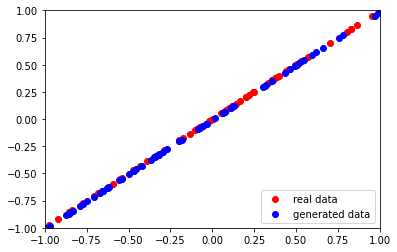

4/4 [==============================] - 0s 2ms/step
Epoch:  9730  Generator Loss:  [0.8253028392791748, 0.0]  Discriminator Loss:  [0.67504656 0.5       ]
2/2 [==============================] - 0s 3ms/step


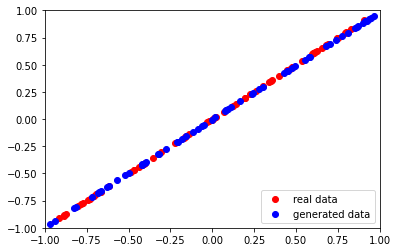

4/4 [==============================] - 0s 3ms/step
Epoch:  9740  Generator Loss:  [0.7926881313323975, 0.0]  Discriminator Loss:  [0.68700838 0.5       ]
2/2 [==============================] - 0s 4ms/step


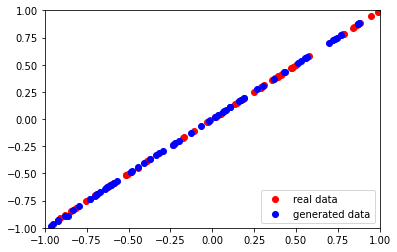

4/4 [==============================] - 0s 2ms/step
Epoch:  9750  Generator Loss:  [0.8018097877502441, 0.0]  Discriminator Loss:  [0.69044757 0.5       ]
2/2 [==============================] - 0s 4ms/step


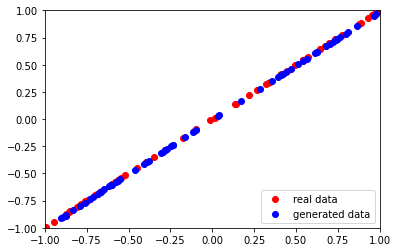

4/4 [==============================] - 0s 2ms/step
Epoch:  9760  Generator Loss:  [0.8172784447669983, 0.0]  Discriminator Loss:  [0.67544913 0.5       ]
2/2 [==============================] - 0s 4ms/step


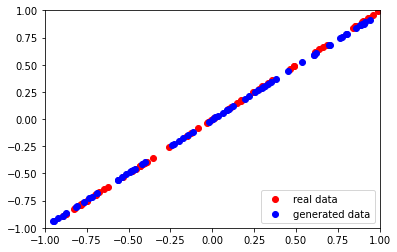

4/4 [==============================] - 0s 2ms/step
Epoch:  9770  Generator Loss:  [0.8014341592788696, 0.0]  Discriminator Loss:  [0.68439209 0.5       ]
2/2 [==============================] - 0s 4ms/step


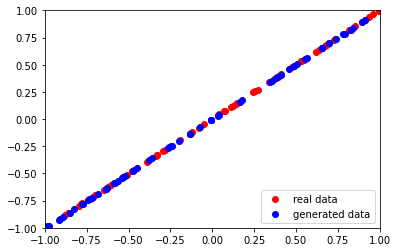

4/4 [==============================] - 0s 2ms/step
Epoch:  9780  Generator Loss:  [0.8071069121360779, 0.0]  Discriminator Loss:  [0.68426961 0.5       ]
2/2 [==============================] - 0s 3ms/step


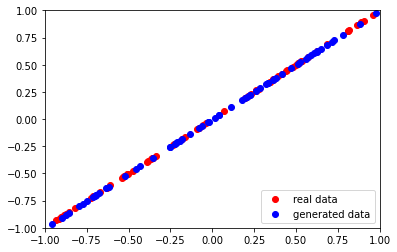

4/4 [==============================] - 0s 2ms/step
Epoch:  9790  Generator Loss:  [0.8117004632949829, 0.0]  Discriminator Loss:  [0.6845147 0.5      ]
2/2 [==============================] - 0s 3ms/step


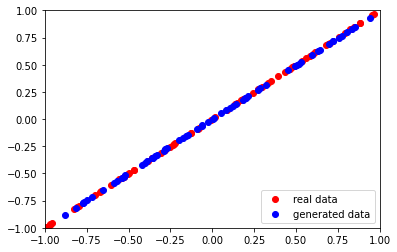

4/4 [==============================] - 0s 2ms/step
Epoch:  9800  Generator Loss:  [0.8204323053359985, 0.0]  Discriminator Loss:  [0.69254607 0.5       ]
2/2 [==============================] - 0s 4ms/step


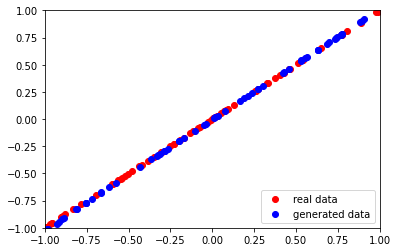

4/4 [==============================] - 0s 2ms/step
Epoch:  9810  Generator Loss:  [0.8187248110771179, 0.0]  Discriminator Loss:  [0.68487775 0.5       ]
2/2 [==============================] - 0s 3ms/step


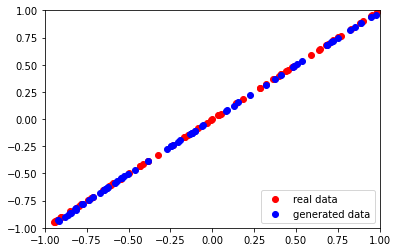

4/4 [==============================] - 0s 2ms/step
Epoch:  9820  Generator Loss:  [0.8129768371582031, 0.0]  Discriminator Loss:  [0.67651582 0.5       ]
2/2 [==============================] - 0s 4ms/step


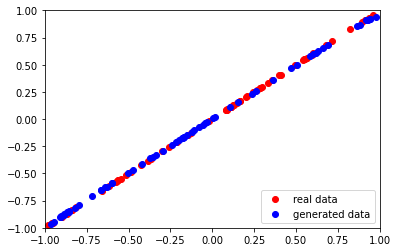

4/4 [==============================] - 0s 2ms/step
Epoch:  9830  Generator Loss:  [0.8211274743080139, 0.0]  Discriminator Loss:  [0.68008801 0.5       ]
2/2 [==============================] - 0s 4ms/step


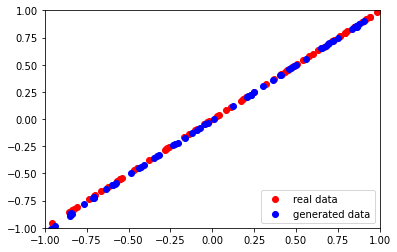

4/4 [==============================] - 0s 2ms/step
Epoch:  9840  Generator Loss:  [0.8255126476287842, 0.0]  Discriminator Loss:  [0.67738706 0.5       ]
2/2 [==============================] - 0s 3ms/step


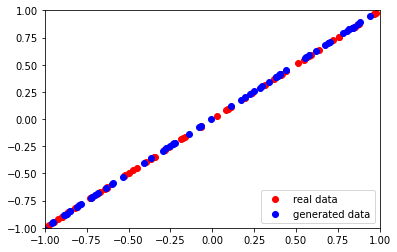

4/4 [==============================] - 0s 2ms/step
Epoch:  9850  Generator Loss:  [0.8221598863601685, 0.0]  Discriminator Loss:  [0.68884394 0.5       ]
2/2 [==============================] - 0s 4ms/step


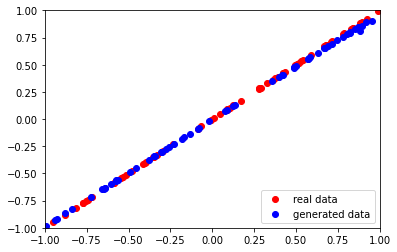

4/4 [==============================] - 0s 2ms/step
Epoch:  9860  Generator Loss:  [0.8324956893920898, 0.0]  Discriminator Loss:  [0.67760852 0.5       ]
2/2 [==============================] - 0s 4ms/step


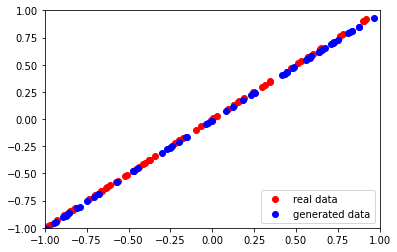

4/4 [==============================] - 0s 2ms/step
Epoch:  9870  Generator Loss:  [0.7796453833580017, 0.0]  Discriminator Loss:  [0.69035193 0.5       ]
2/2 [==============================] - 0s 4ms/step


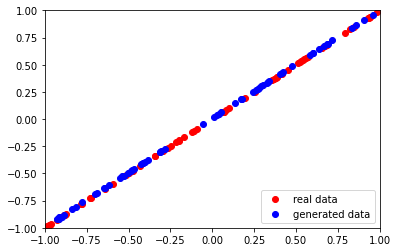

4/4 [==============================] - 0s 2ms/step
Epoch:  9880  Generator Loss:  [0.8097482323646545, 0.0]  Discriminator Loss:  [0.68145588 0.5       ]
2/2 [==============================] - 0s 3ms/step


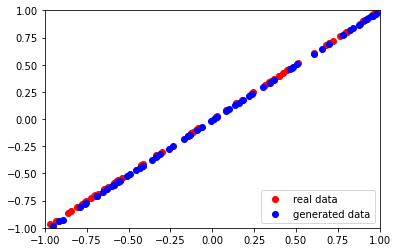

4/4 [==============================] - 0s 2ms/step
Epoch:  9890  Generator Loss:  [0.7916579246520996, 0.0]  Discriminator Loss:  [0.68617555 0.5       ]
2/2 [==============================] - 0s 3ms/step


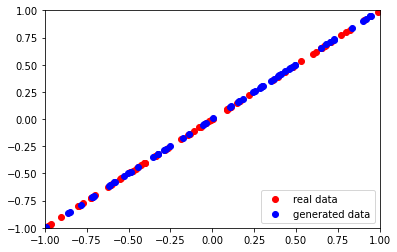

4/4 [==============================] - 0s 2ms/step
Epoch:  9900  Generator Loss:  [0.817294180393219, 0.0]  Discriminator Loss:  [0.68214935 0.5       ]
2/2 [==============================] - 0s 3ms/step


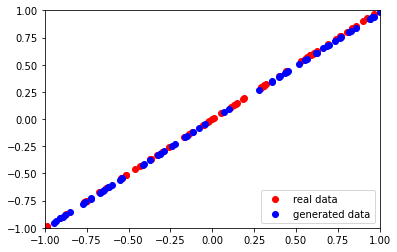

4/4 [==============================] - 0s 2ms/step
Epoch:  9910  Generator Loss:  [0.8154497742652893, 0.0]  Discriminator Loss:  [0.68300417 0.5       ]
2/2 [==============================] - 0s 4ms/step


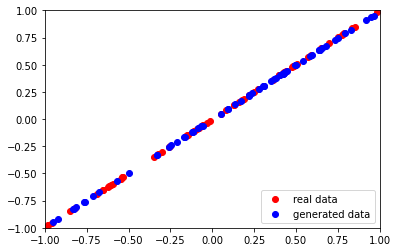

4/4 [==============================] - 0s 2ms/step
Epoch:  9920  Generator Loss:  [0.8152539730072021, 0.0]  Discriminator Loss:  [0.68129471 0.5       ]
2/2 [==============================] - 0s 4ms/step


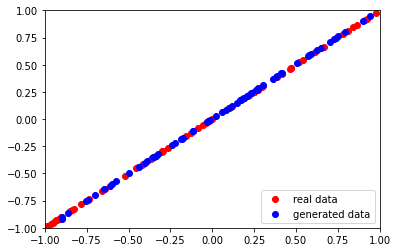

4/4 [==============================] - 0s 2ms/step
Epoch:  9930  Generator Loss:  [0.8058604001998901, 0.0]  Discriminator Loss:  [0.68732941 0.5       ]
2/2 [==============================] - 0s 3ms/step


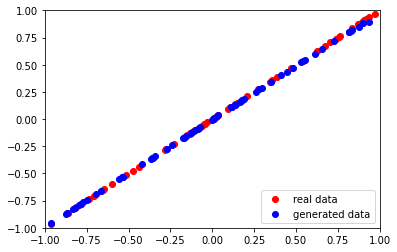

4/4 [==============================] - 0s 6ms/step
Epoch:  9940  Generator Loss:  [0.8118244409561157, 0.0]  Discriminator Loss:  [0.68218845 0.5       ]
2/2 [==============================] - 0s 4ms/step


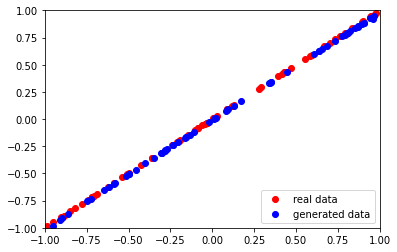

4/4 [==============================] - 0s 2ms/step
Epoch:  9950  Generator Loss:  [0.7718374729156494, 0.0]  Discriminator Loss:  [0.69366759 0.49609375]
2/2 [==============================] - 0s 4ms/step


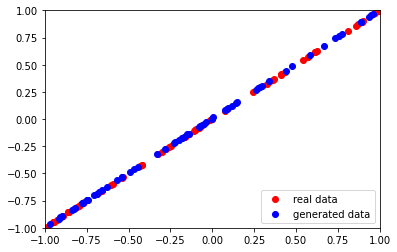

4/4 [==============================] - 0s 2ms/step
Epoch:  9960  Generator Loss:  [0.8220643997192383, 0.0]  Discriminator Loss:  [0.68308395 0.5       ]
2/2 [==============================] - 0s 4ms/step


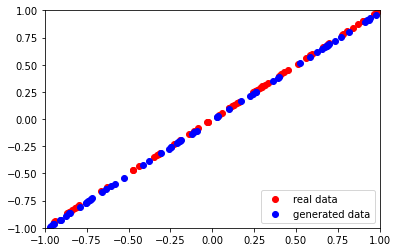

4/4 [==============================] - 0s 2ms/step
Epoch:  9970  Generator Loss:  [0.8154501914978027, 0.0]  Discriminator Loss:  [0.68229154 0.5       ]
2/2 [==============================] - 0s 3ms/step


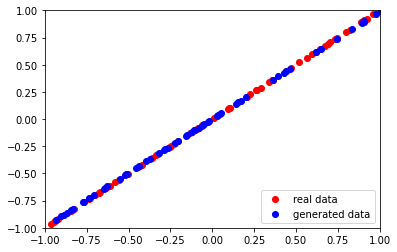

4/4 [==============================] - 0s 2ms/step
Epoch:  9980  Generator Loss:  [0.7994799613952637, 0.0]  Discriminator Loss:  [0.68406081 0.5       ]
2/2 [==============================] - 0s 4ms/step


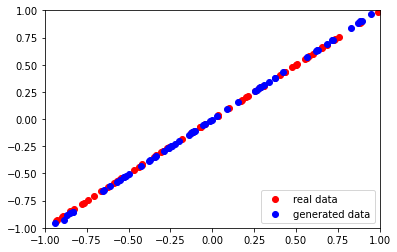

4/4 [==============================] - 0s 2ms/step
Epoch:  9990  Generator Loss:  [0.7883738875389099, 0.0]  Discriminator Loss:  [0.68980107 0.5       ]
2/2 [==============================] - 0s 3ms/step


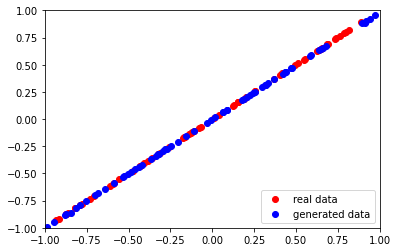

4/4 [==============================] - 0s 2ms/step
Epoch:  9999  Generator Loss:  [0.8216702342033386, 0.0]  Discriminator Loss:  [0.67152295 0.5       ]
2/2 [==============================] - 0s 3ms/step


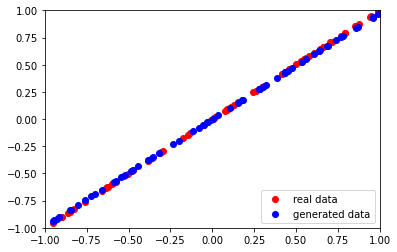

In [ ]:
# Construct the models 
generator, discriminator, gan = construct_models(100) 
# Train GAN 
training(generator, discriminator, gan, 100, 10000, 128) 
